# METADATA

### Sales Data
Daily sales data per GCK (product groups) in EUR:
- Training set (daily): 'Sales data.csv'
- Test set (monthly): 'Test Set Template.csv'

### Macro Economical Data
- Important macro-economic indices for Siemens in its most important countries: 'Market data.xlsx'
- This includes for example:
  - Production Index Machinery & Electricals: The Production Index for Machinery and Electrical Equipment (PI-MEE) is an economic indicator that measures the level of industrial production in the machinery and electrical equipment sectors of an economy. It is used to track the performance of these sectors over time and to provide insights into the overall health and direction of the economy.
  - Shipments Index Machinery & Electricals: The Shipments Index for Machinery and Electrical Equipment (SI-MEE) is an economic indicator that measures the value of shipments in the machinery and electrical equipment sectors of an economy. It is used to track the performance of these sectors over time and to provide insights into the overall health and direction of the economy.
  - Price of Base Metals
  - Price of Energy
  - Price of Metals & Minerals
  - Price of Natural gas index
  - Price of Crude oil, average
  - Price of Copper
  - United States: EUR in LCU
  - Producer Prices Electrical Equipment
  - Production Index Machinery and equipment n.e.c.
  - Production Index Electrical Equpment


# Initial setup and modules/packages loading

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objs as go
from pandas.tseries.offsets import MonthEnd
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import xgboost as xgb
from prophet import Prophet

# Reading the data

## Sales Data

In [2]:
df_sales = pd.read_csv('Case3_Sales data.csv', sep=';')

In [3]:
df_sales.head()

,DATE,Mapped_GCK,Sales_EUR
0,01.10.2018,#1,0
1,02.10.2018,#1,0
2,03.10.2018,#1,0
3,04.10.2018,#1,0
4,05.10.2018,#1,0


In [4]:
#Making a copy of the original dataset
df_sales_original = df_sales.copy()

## Market Data

In [5]:
df_market = pd.read_excel('Case3_Market data.xlsx', header=[0,1,2])

In [6]:
df_market.head()

Unnamed: 0_level_0  \
  Index 2010=100 (if not otherwise noted)   
                                     date   
0                                  2004m2   
1                                  2004m3   
2                                  2004m4   
3                                  2004m5   
4                                  2004m6   

                                     China  \
  Production Index Machinery & Electricals   
                            MAB_ELE_PRO156   
0                                16.940704   
1                                23.711852   
2                                24.435235   
3                                23.708115   
4                                27.009138   

                                           \
  Shipments Index Machinery & Electricals   
                           MAB_ELE_SHP156   
0                               16.940704   
1                               23.711852   
2                               24.435235   
3                               23.708115   
4                               27.009138   

                                    France  \
  Production Index Machinery & Electricals   
                            MAB_ELE_PRO250   
0                               112.091273   
1                               136.327976   
2                               117.791806   
3                               109.002541   
4                               133.785737   

                                           \
  Shipments Index Machinery & Electricals   
                           MAB_ELE_SHP250   
0                               83.458866   
1                              106.168192   
2                               92.007646   
3                               85.696486   
4                              106.641482   

                                   Germany  \
  Production Index Machinery & Electricals   
                            MAB_ELE_PRO276   
0                                82.623037   
1                               100.556582   
2                                89.653203   
3                                86.880571   
4                                99.010814   

                                           \
  Shipments Index Machinery & Electricals   
                           MAB_ELE_SHP276   
0                               79.452532   
1                               97.012918   
2                               84.932358   
3                               82.372794   
4                               95.108740   

                                     Italy  \
  Production Index Machinery & Electricals   
                            MAB_ELE_PRO380   
0                               124.289603   
1                               143.411662   
2                               129.083828   
3                               135.590391   
4                               136.424935   

                                           \
  Shipments Index Machinery & Electricals   
                           MAB_ELE_SHP380   
0                               86.560493   
1                              106.344544   
2                               95.579673   
3                              100.087039   
4                              110.889719   

                                     Japan  ...  \
  Production Index Machinery & Electricals  ...   
                            MAB_ELE_PRO392  ...   
0                               109.334010  ...   
1                               140.884616  ...   
2                               105.853579  ...   
3                               101.864777  ...   
4                               120.332920  ...   

                        production index  \
  France: Machinery and equipment n.e.c.   
                            PRO28250_org   
0                             118.274109   
1                             148.121841   
2                             125.482231   
3                             116.649750   
4                        

In [7]:
#Making a copy of the original dataset
df_market_original = df_market.copy()

# Loading addicional data

## Holidays / Days in the month

Source: https://www.holidays-info.com/germany/school-holidays/2018/

We are taking the dates for the Bavarian region as Siemens headquarters are located in Munich

In [8]:
df_holidays = pd.read_excel('Holidays.xlsx', sheet_name='Sheet2')

In [9]:
# set the date as the index
df_holidays['Date'] = pd.to_datetime(df_holidays['Date']) + MonthEnd(0)
df_holidays.set_index('Date', inplace=True)
df_holidays.head()

,Holidays/DaysInMonth
Date,
2018-10-31,0.096774
2018-11-30,0.100000
2018-12-31,0.322581
2019-01-31,0.161290
2019-02-28,0.000000


## Stringency Index

Source: https://ourworldindata.org/covid-stringency-index

In [10]:
df_covid = pd.read_csv('owid-covid-data.csv')

In [11]:
# let's create a new dataset that includes the date as index and the Stringency Index for Germany

df_stringency = df_covid.loc[:, ['date', 'location', 'stringency_index']]
df_stringency = df_stringency[df_stringency['location'] == 'Germany']

# drop the 'location' column
df_stringency.drop('location', axis=1, inplace=True)

# replace NaN values with 0
df_stringency.fillna(0, inplace=True)

# convert 'date' column to DatetimeIndex
df_stringency['date'] = pd.to_datetime(df_stringency['date'])

# set the date as the index
df_stringency.set_index('date', inplace=True)

# Group by month taking the average stringency index
df_stringency = df_stringency.resample('M')['stringency_index'].mean()

df_stringency = pd.DataFrame(df_stringency)

df_stringency.head()

,stringency_index
date,
2020-01-31,1.533793
2020-02-29,10.154483
2020-03-31,48.774516
2020-04-30,76.850000
2020-05-31,63.841935


## Construction Industry Data in Germany

Building permits in building construction
Construction of new buildings
Residential and non-residential buildings

Source: https://www.destatis.de/EN/Themes/Economy/Short-Term-Indicators/Building-Permits/buw210.html#242238

In [12]:
df_construction = pd.read_excel('construction_data.xlsx')

In [13]:
# create a new column 'date'
df_construction['date'] = pd.to_datetime(
    df_construction['Year'].astype(str) + '-' + df_construction['Month'], format='%Y-%b') + MonthEnd(0)

# drop the 'Year' and 'Month' columns
df_construction.drop(['Year', 'Month'], axis=1, inplace=True) 

# set 'date' column as the index
df_construction.set_index('date', inplace=True)

# keep only relevant column
df_construction = df_construction.loc[:, ['Buildings (Number)']]

In [14]:
df_construction.head()

,Buildings (Number)
date,
2023-02-28,8079
2023-01-31,8519
2022-12-31,10087
2022-11-30,9547
2022-10-31,9538


## German Economic Indicators

### GDP

Source: https://www.statista.com/statistics/1322158/gdp-quarterly-germany/

In [15]:
df_gdp_quarterly = pd.read_excel('GDP.xlsx', sheet_name='Data (2)')

In [16]:
df_gdp_quarterly.head()

,Quarter,Seasonally and calendar adjusted figures
0,Q3 '18,841.04
1,Q4 '18,853.36
2,Q1 '19,861.65
3,Q2 '19,866.49
4,Q3 '19,872.30


In [17]:
# create a new dataframe to store the monthly data
df_gdp = pd.DataFrame(columns=['Month', 'GDP'])

# loop through the quarterly data and repeat each value for the months in the quarter
for index, row in df_gdp_quarterly.iterrows():
    quarter = row['Quarter']
    value = row['Seasonally and calendar adjusted figures']
    year = int(quarter[-2:]) + 2000
    if quarter.startswith('Q1'):
        months = [1, 2, 3]
    elif quarter.startswith('Q2'):
        months = [4, 5, 6]
    elif quarter.startswith('Q3'):
        months = [7, 8, 9]
    else:
        months = [10, 11, 12]
    for month in months:
        month_str = str(year) + '-' + str(month).zfill(2)
        df_monthly = pd.DataFrame({'Month': [month_str], 'GDP': [value]})
        df_gdp = pd.concat([df_gdp, df_monthly], ignore_index=True)
        
# convert 'Month' column to pandas datetime
df_gdp['Month'] = pd.to_datetime(df_gdp['Month']) + MonthEnd(0)

# set 'Month' column as index
df_gdp.set_index('Month', inplace=True)

In [18]:
df_gdp.head()

,GDP
Month,
2018-07-31,841.04
2018-08-31,841.04
2018-09-30,841.04
2018-10-31,853.36
2018-11-30,853.36


### Unemployment Rate

Source: https://www.destatis.de/EN/Themes/Economy/Short-Term-Indicators/Labour-Market/arb210a.html

In [19]:
df_unemployment = pd.read_excel('unemployment_rate.xlsx')

In [20]:
# create a new column 'date'
df_unemployment['date'] = pd.to_datetime(
    df_unemployment['Year'].astype(str) + '-' + df_unemployment['Month'], format='%Y-%b') + MonthEnd(0)

# drop the 'Year' and 'Month' columns
df_unemployment.drop(['Year', 'Month'], axis=1, inplace=True) 

# set 'date' column as the index
df_unemployment.set_index('date', inplace=True)

In [21]:
df_unemployment.head()

,Unemployment rate in % related to total civilian labour force
date,
2023-03-31,5.7
2023-02-28,5.7
2023-01-31,5.7
2022-12-31,5.4
2022-11-30,5.3


# 1. DATA UNDERSTANDING

## 1.1. Initial Analysis

### Sales Data

In [22]:
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9802 entries, 0 to 9801
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DATE        9802 non-null   object
 1   Mapped_GCK  9802 non-null   object
 2   Sales_EUR   9802 non-null   object
dtypes: object(3)
memory usage: 229.9+ KB


In [23]:
# Fixing data types
df_sales['DATE'] = pd.to_datetime(df_sales['DATE'], format='%d.%m.%Y')
df_sales['Sales_EUR'] = df_sales['Sales_EUR'].str.replace(',', '.').astype(float)

In [24]:
# Checking data types again
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9802 entries, 0 to 9801
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   DATE        9802 non-null   datetime64[ns]
 1   Mapped_GCK  9802 non-null   object        
 2   Sales_EUR   9802 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 229.9+ KB


In [25]:
# Count of missing values per feature
df_sales.isna().sum()

DATE          0
Mapped_GCK    0
Sales_EUR     0
dtype: int64

In [26]:
# Summary statistics for all variables
# The sales information goes from 2018-10-01 to 2022-04-30
# There are 14 GCKs
# The negative values in Sales indicate thet there were more credits (returns/refunds) than sales
df_sales.describe(include='all', datetime_is_numeric=True).T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
DATE,9802,NaN,NaN,NaN,2020-07-19 17:55:48.785961984,2018-10-01 00:00:00,2019-08-30 00:00:00,2020-07-26 12:00:00,2021-06-09 00:00:00,2022-04-30 00:00:00,NaN
Mapped_GCK,9802,14,#1,1179,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sales_EUR,9802.0,NaN,NaN,NaN,272785.686663,-506381.17,0.0,0.0,0.0,41127988.02,2230789.1619


### Market Data

In [27]:
df_market.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 48 columns):
 #   Column                                                                            Non-Null Count  Dtype  
---  ------                                                                            --------------  -----  
 0   (Unnamed: 0_level_0, Index 2010=100 (if not otherwise noted), date)               219 non-null    object 
 1   (China, Production Index Machinery & Electricals, MAB_ELE_PRO156)                 219 non-null    float64
 2   (China, Shipments Index Machinery & Electricals, MAB_ELE_SHP156)                  219 non-null    float64
 3   (France, Production Index Machinery & Electricals, MAB_ELE_PRO250)                219 non-null    float64
 4   (France, Shipments Index Machinery & Electricals, MAB_ELE_SHP250)                 219 non-null    float64
 5   (Germany, Production Index Machinery & Electricals, MAB_ELE_PRO276)               219 non-null    float64
 6   (G

In [28]:
# Let's rename the columns for simplicity

# Define the custom column names
new_columns_names = ['date', 'China PIM&E', 'China SIM&E', 'France PIM&E', 'France SIM&E', 'Germany PIM&E', 'Germany SIM&E', 'Italy PIM&E', 
                     'Italy SIM&E', 'Japan PIM&E', 'Japan SIM&E', 'Switzerland PIM&E', 'Switzerland SIM&E', 'UK PIM&E', 
                     'UK SIM&E', 'USA PIM&E', 'USA SIM&E', 'Europe PIM&E', 'Europe SIM&E', 'Price Base Metals', 'Price Energy',
                    'Price Metals & Minerals', 'Price Natural Gas Index', 'Price Crude Oil (Avg)', 'Price Cooper', 
                     'USA: EUR in LCU', 'USA PPEE', 'UK PPEE', 'Italy PPEE', 'France PPEE', 'Germany PPEE', 'China PPEE',
                    'USA PI M&E n.e.c', 'World PI M&E n.e.c', 'Switzerland PI M&E n.e.c', 'UK PI M&E n.e.c', 
                     'Italy PI M&E n.e.c', 'Japan PI M&E n.e.c', 'France PI M&E n.e.c', 'Germany PI M&E n.e.c', 'USA PI EE',
                    'World PI EE', 'Switzerland PI EE', 'UK PI EE', 'Italy PI EE', 'Japan PI EE', 'France PI EE',
                    'Germany PI EE']

# Rename all columns with the custom names
df_market.columns = new_columns_names

df_market.head()

,date,China PIM&E,China SIM&E,France PIM&E,France SIM&E,Germany PIM&E,Germany SIM&E,Italy PIM&E,Italy SIM&E,Japan PIM&E,...,France PI M&E n.e.c,Germany PI M&E n.e.c,USA PI EE,World PI EE,Switzerland PI EE,UK PI EE,Italy PI EE,Japan PI EE,France PI EE,Germany PI EE
0,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,...,118.274109,80.829010,117.723991,NaN,81.100000,120.706516,141.510864,106.161262,102.077057,85.913200
1,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,...,148.121841,102.130104,119.220779,NaN,76.690307,138.309550,152.880234,140.288741,117.225685,97.670815
2,2004m4,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,...,125.482231,90.961426,117.441124,NaN,71.552403,115.557330,137.796875,106.271197,105.335777,87.253983
3,2004m5,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,...,116.649750,88.082901,117.899216,NaN,66.414500,119.269534,143.860535,101.608710,96.616508,84.675552
4,2004m6,27.009138,27.009138,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,...,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.458710,95.401802


In [29]:
# Fixing datatypes
df_market['date'] = pd.to_datetime(df_market['date'].str.strip(), format='%Ym%m') + MonthEnd(0)

In [30]:
# Checking data types again
df_market.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 48 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   date                      219 non-null    datetime64[ns]
 1   China PIM&E               219 non-null    float64       
 2   China SIM&E               219 non-null    float64       
 3   France PIM&E              219 non-null    float64       
 4   France SIM&E              219 non-null    float64       
 5   Germany PIM&E             219 non-null    float64       
 6   Germany SIM&E             219 non-null    float64       
 7   Italy PIM&E               219 non-null    float64       
 8   Italy SIM&E               219 non-null    float64       
 9   Japan PIM&E               219 non-null    float64       
 10  Japan SIM&E               219 non-null    float64       
 11  Switzerland PIM&E         218 non-null    float64       
 12  Switzerland SIM&E     

In [31]:
# Summary statistics for all variables

df_market.describe(include='all', datetime_is_numeric=True).T

,count,mean,min,25%,50%,75%,max,std
date,219,2013-03-31 06:08:13.150684928,2004-02-29 00:00:00,2008-09-15 00:00:00,2013-03-31 00:00:00,2017-10-15 12:00:00,2022-04-30 00:00:00,NaN
China PIM&E,219.0,138.303637,16.940704,68.47774,133.50769,198.473934,329.413367,78.883209
China SIM&E,219.0,138.303637,16.940704,68.47774,133.50769,198.473934,329.413367,78.883209
France PIM&E,219.0,104.431918,50.75668,93.613505,102.736556,114.090851,152.743402,18.918529
France SIM&E,219.0,105.316814,64.420676,97.452819,106.012166,115.030479,136.85872,12.762209
Germany PIM&E,219.0,107.499126,74.332913,100.560897,108.99229,115.735786,130.869962,11.861942
Germany SIM&E,219.0,114.898377,71.787161,103.149778,117.428836,127.11222,151.297092,17.091571
Italy PIM&E,219.0,105.228363,34.213427,94.335162,105.088474,117.031701,153.940791,23.509638
Italy SIM&E,219.0,105.735378,45.19171,95.985839,107.695805,119.83636,153.645142,19.948183
Japan PIM&E,219.0,111.948146,67.53194,103.740049,111.683015,121.402653,153.898678,15.489336


In [32]:
# China's Production Index Machinery & Electricals and Shipments Index Machinery & Electricals has exactly the same values
# Let's drop one of them as keeping both would be redundant
df_market.drop('China SIM&E', axis=1, inplace=True)
df_market.head()

,date,China PIM&E,France PIM&E,France SIM&E,Germany PIM&E,Germany SIM&E,Italy PIM&E,Italy SIM&E,Japan PIM&E,Japan SIM&E,...,France PI M&E n.e.c,Germany PI M&E n.e.c,USA PI EE,World PI EE,Switzerland PI EE,UK PI EE,Italy PI EE,Japan PI EE,France PI EE,Germany PI EE
0,2004-02-29,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,110.495272,...,118.274109,80.829010,117.723991,NaN,81.100000,120.706516,141.510864,106.161262,102.077057,85.913200
1,2004-03-31,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,...,148.121841,102.130104,119.220779,NaN,76.690307,138.309550,152.880234,140.288741,117.225685,97.670815
2,2004-04-30,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,...,125.482231,90.961426,117.441124,NaN,71.552403,115.557330,137.796875,106.271197,105.335777,87.253983
3,2004-05-31,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,...,116.649750,88.082901,117.899216,NaN,66.414500,119.269534,143.860535,101.608710,96.616508,84.675552
4,2004-06-30,27.009138,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,119.616380,...,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.458710,95.401802


In [33]:
# Making date the index
df_market.index = df_market['date']
df_market.drop('date', axis=1, inplace=True)
df_market.sort_index(ascending=True, inplace=True)
df_market.head()

,China PIM&E,France PIM&E,France SIM&E,Germany PIM&E,Germany SIM&E,Italy PIM&E,Italy SIM&E,Japan PIM&E,Japan SIM&E,Switzerland PIM&E,...,France PI M&E n.e.c,Germany PI M&E n.e.c,USA PI EE,World PI EE,Switzerland PI EE,UK PI EE,Italy PI EE,Japan PI EE,France PI EE,Germany PI EE
date,,,,,,,,,,,,,,,,,,,,,
2004-02-29,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,110.495272,91.221862,...,118.274109,80.829010,117.723991,NaN,81.100000,120.706516,141.510864,106.161262,102.077057,85.913200
2004-03-31,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,...,148.121841,102.130104,119.220779,NaN,76.690307,138.309550,152.880234,140.288741,117.225685,97.670815
2004-04-30,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,...,125.482231,90.961426,117.441124,NaN,71.552403,115.557330,137.796875,106.271197,105.335777,87.253983
2004-05-31,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.378729,...,116.649750,88.082901,117.899216,NaN,66.414500,119.269534,143.860535,101.608710,96.616508,84.675552
2004-06-30,27.009138,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,119.616380,85.134950,...,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.458710,95.401802


In [34]:
# Count of missing values per feature
df_market.isna().sum()

China PIM&E                  0
France PIM&E                 0
France SIM&E                 0
Germany PIM&E                0
Germany SIM&E                0
Italy PIM&E                  0
Italy SIM&E                  0
Japan PIM&E                  0
Japan SIM&E                  0
Switzerland PIM&E            1
Switzerland SIM&E            1
UK PIM&E                     0
UK SIM&E                    18
USA PIM&E                    0
USA SIM&E                    1
Europe PIM&E                 0
Europe SIM&E                 0
Price Base Metals            0
Price Energy                 0
Price Metals & Minerals      0
Price Natural Gas Index      0
Price Crude Oil (Avg)        0
Price Cooper                 0
USA: EUR in LCU              0
USA PPEE                     0
UK PPEE                     18
Italy PPEE                   0
France PPEE                 35
Germany PPEE                 0
China PPEE                  23
USA PI M&E n.e.c             0
World PI M&E n.e.c           0
Switzerl

In [35]:
# Let's fill the mising values with the mean of each respective column
df_market.fillna(df_market.mean(), inplace = True)

In [36]:
# Count of missing values per feature
df_market.isna().sum()

China PIM&E                 0
France PIM&E                0
France SIM&E                0
Germany PIM&E               0
Germany SIM&E               0
Italy PIM&E                 0
Italy SIM&E                 0
Japan PIM&E                 0
Japan SIM&E                 0
Switzerland PIM&E           0
Switzerland SIM&E           0
UK PIM&E                    0
UK SIM&E                    0
USA PIM&E                   0
USA SIM&E                   0
Europe PIM&E                0
Europe SIM&E                0
Price Base Metals           0
Price Energy                0
Price Metals & Minerals     0
Price Natural Gas Index     0
Price Crude Oil (Avg)       0
Price Cooper                0
USA: EUR in LCU             0
USA PPEE                    0
UK PPEE                     0
Italy PPEE                  0
France PPEE                 0
Germany PPEE                0
China PPEE                  0
USA PI M&E n.e.c            0
World PI M&E n.e.c          0
Switzerland PI M&E n.e.c    0
UK PI M&E 

## 1.2. Visual Exploration

In [37]:
# Visualization of total monthly sales 

df_sales_total = df_sales.resample('M', on='DATE')['Sales_EUR'].sum().reset_index()

fig = px.line(df_sales_total, x='DATE', y='Sales_EUR', height=300)
fig.show()

In [38]:
# Visualization of monthly sales per GCK

# group the data by product category and date
df_sales_grouped = df_sales.groupby(['Mapped_GCK', 'DATE'])['Sales_EUR'].sum().reset_index()

# get unique product categories
categories = df_sales_grouped['Mapped_GCK'].unique()

# set the index to the date column for resampling
df_sales_grouped = df_sales_grouped.set_index('DATE')

# resample by month and product category, summing up the sales
df_sales_grouped = df_sales_grouped.groupby('Mapped_GCK').resample('M')['Sales_EUR'].sum().reset_index()

# create subplots
fig = sp.make_subplots(rows=len(categories), cols=1, shared_xaxes=True, vertical_spacing=0.02)

# create a subplot for each category
for i, cat in enumerate(categories):
    # select data for the category
    data = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == cat]
    
    # create a line trace for the category
    trace = go.Scatter(x=data['DATE'], y=data['Sales_EUR'], name=cat)
    
    # add the trace to the subplot
    fig.add_trace(trace, row=i+1, col=1)
    
    # set the y-axis title for the subplot
    fig.update_yaxes(title_text='Sales_EUR', row=i+1, col=1)

# update the x-axis title for the last subplot
fig.update_xaxes(title_text='DATE', row=len(categories), col=1)

# set the figure title and show the plot
fig.update_layout(title='Monthly Sales per GCK')
fig.show()

In [39]:
# Visualization of share of monthly sales per GCK

# group the data by product category and month
df_sales_grouped_share = df_sales.groupby(['Mapped_GCK', pd.Grouper(key='DATE', freq='M')])['Sales_EUR'].sum().reset_index()

# calculate the total sales for each month
df_sales_total_month = df_sales.groupby(pd.Grouper(key='DATE', freq='M'))['Sales_EUR'].sum().reset_index()

# merge the two DataFrames on the month column
df_sales_grouped_share = pd.merge(df_sales_grouped_share, df_sales_total_month, on='DATE', suffixes=('_category', '_total'))

# calculate the share of sales for each product category in each month
df_sales_grouped_share['Sales_Share'] = df_sales_grouped_share['Sales_EUR_category'] / df_sales_grouped_share['Sales_EUR_total']

# create a stacked area chart of the sales shares over time, with each product category as a different color
fig = px.area(df_sales_grouped_share, x='DATE', y='Sales_Share', color='Mapped_GCK')

fig.show()

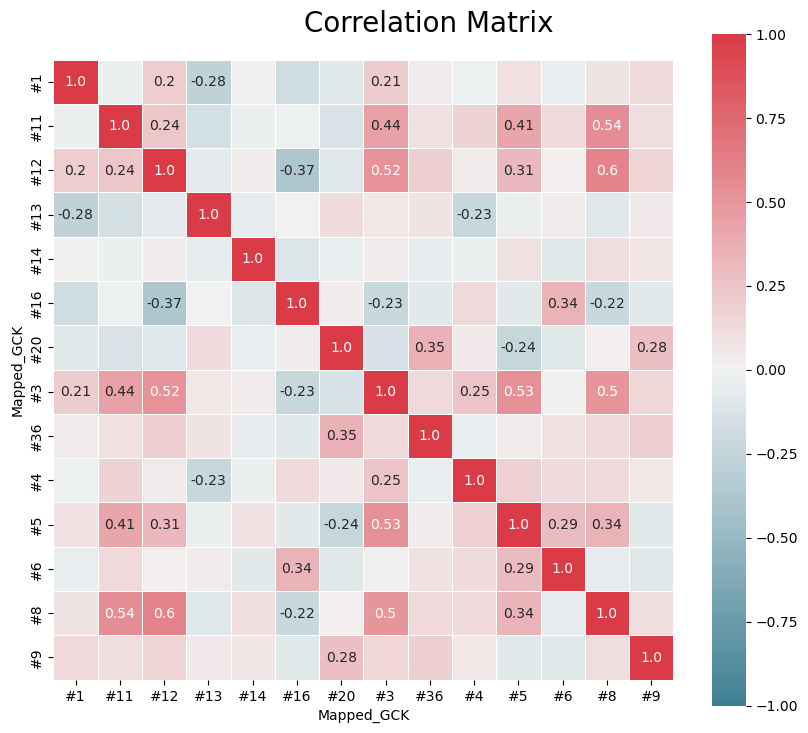

In [40]:
# Let's check the correlation between the sales trend of the different products

# Pivot the data to get the sales for each product in columns
df_pivot = df_sales_grouped.pivot(index='DATE', columns='Mapped_GCK', values='Sales_EUR')

# Visualize the correlation matrix as a heatmap
fig = plt.figure(figsize=(10,8))
corr = np.round(
    df_pivot.corr(method="pearson"), decimals=2
    )
mask_annot=np.absolute(corr.values)>=0.2
annot=np.where(mask_annot, corr.values, np.full(corr.shape,""))
sns.heatmap(data=corr,annot=annot,cmap=sns.diverging_palette(220,10,as_cmap=True), 
            fmt='s',vmin=-1,vmax=1,center=0,square=True,linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix",fontsize=20)
plt.show()

The only GCKs with a moderately high correlation in their sales trend are:
- #3 and #5
- #3 and #8
- #3 and #12
- #8 and #11
- #8 and #12

### Plot additive and multiplicative decomposition per GCK

1) Trend: The trend of a time series refers to the general direction in which the time series is moving. Time series can have a positive or a negative trend, but can also have no trend.

2) Seasonal: The seasonal component of a time series refers to data that rises and falls at consistent frequencies.

3) Remainder: The remainder is what’s left of the time series data after removing its trend, cycle, and seasonal components. It is the random fluctuation in the time series data that the above components cannot explain.


- Additive decomposition argues that time series data is a function of the sum of its components: Y = T + S + R 
- Multiplicative decomposition argues that time series data is a function of the product of its components: Y = T * S * R

Source: https://towardsdatascience.com/different-types-of-time-series-decomposition-396c09f92693

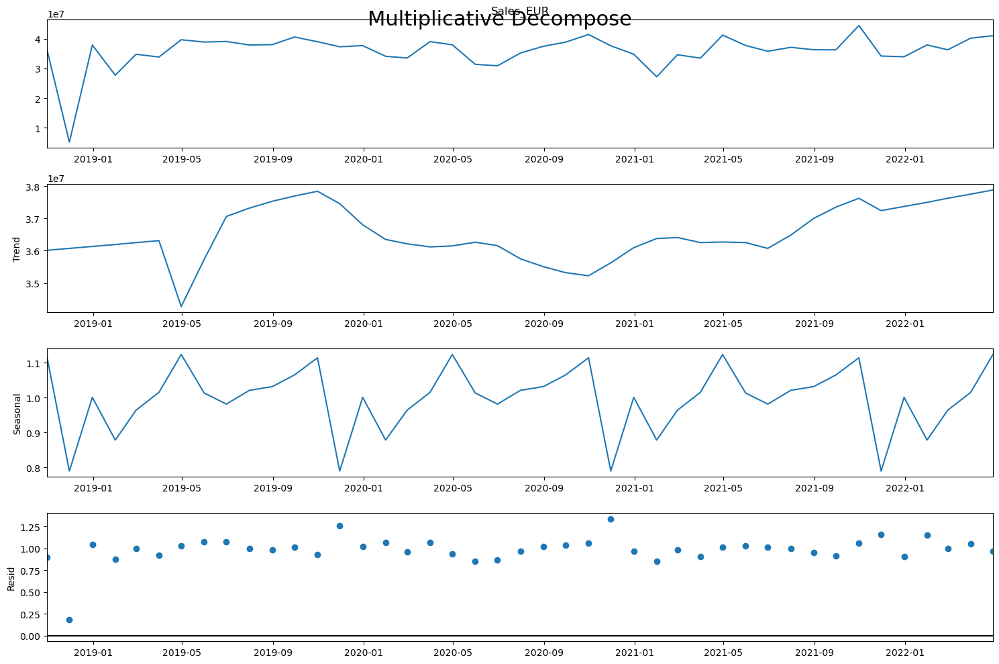

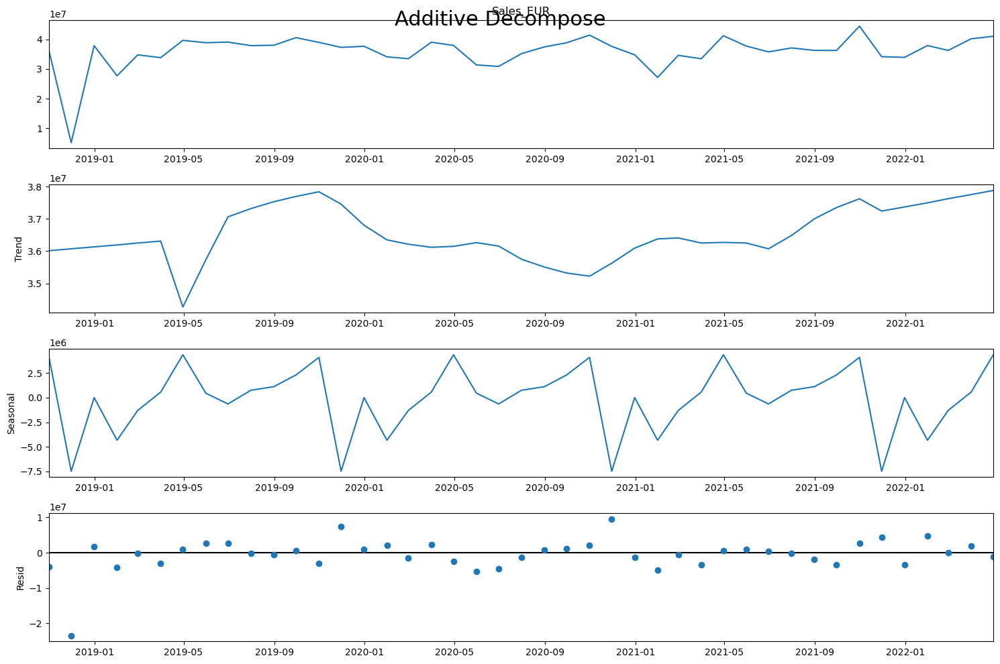

In [41]:
df_sales_grouped_1 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#1']
df_sales_grouped_1 = df_sales_grouped_1.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_1['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_1['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

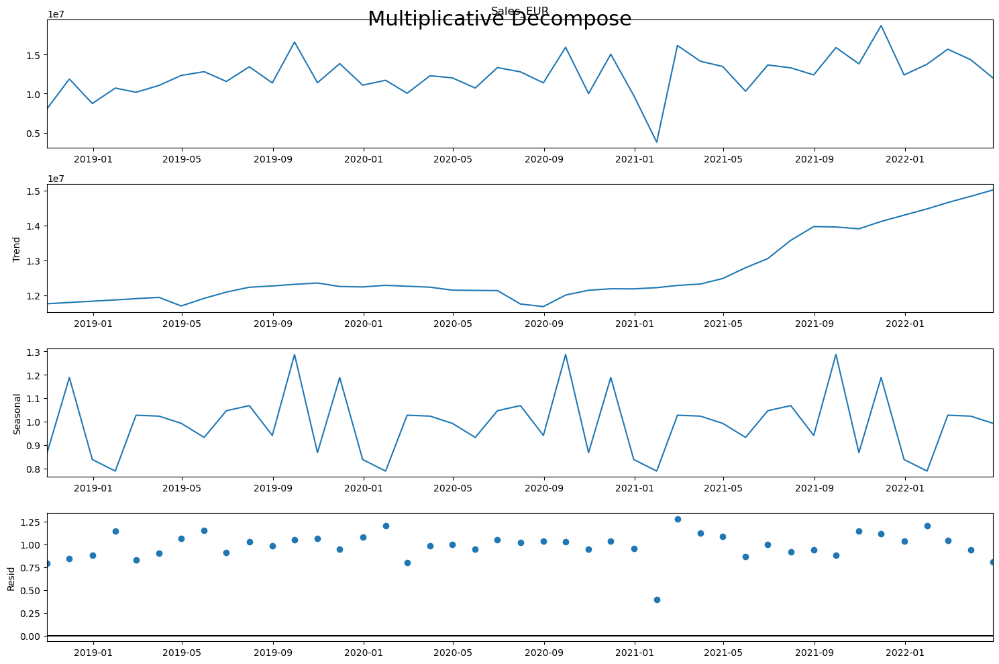

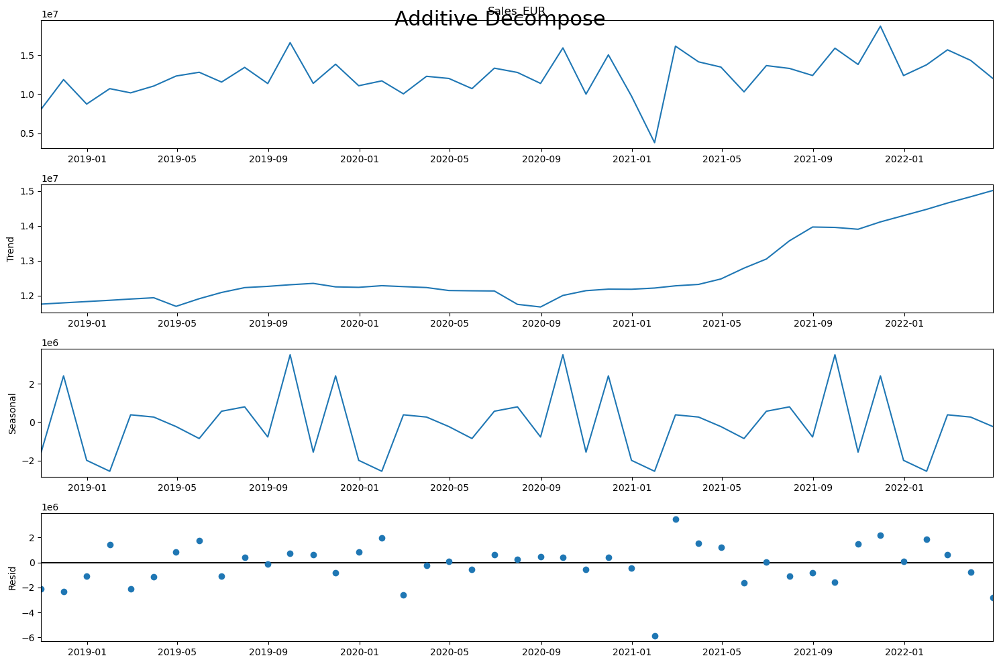

In [42]:
df_sales_grouped_3 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#3']
df_sales_grouped_3 = df_sales_grouped_3.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_3['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_3['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

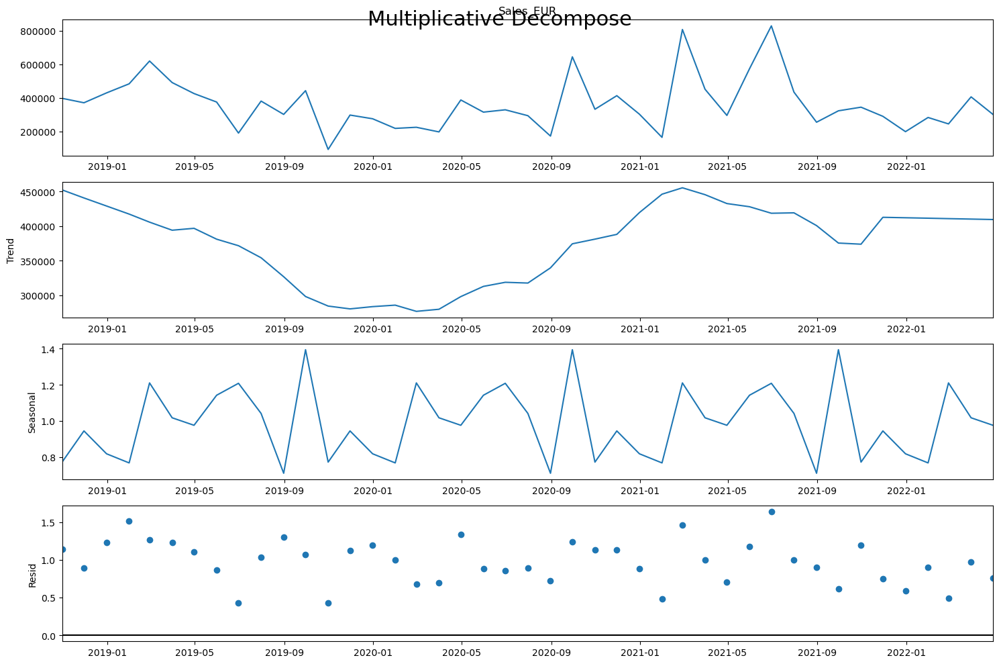

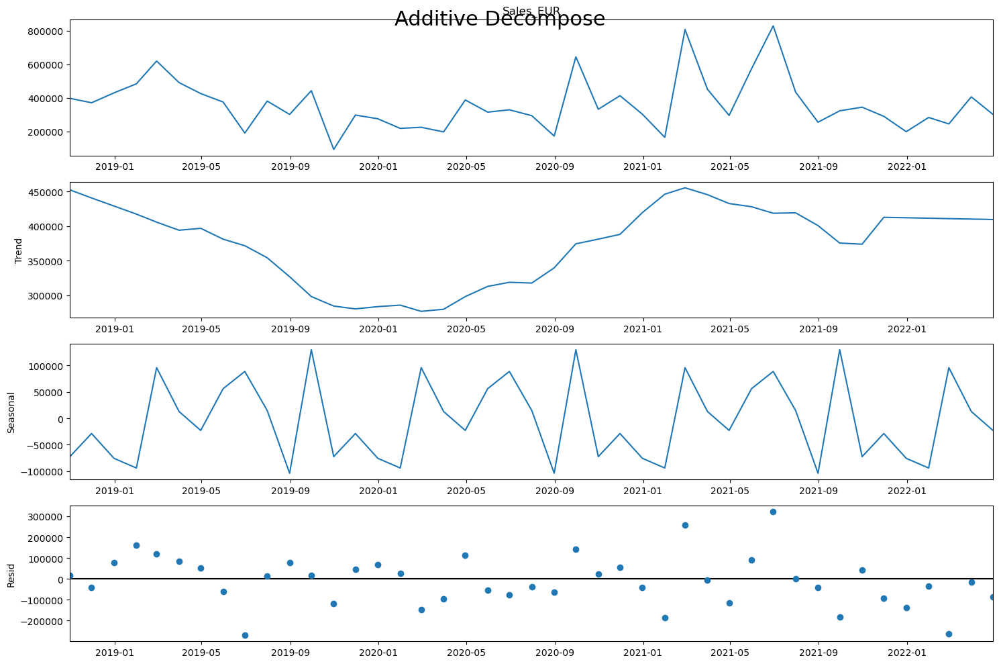

In [43]:
df_sales_grouped_4 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#4']
df_sales_grouped_4 = df_sales_grouped_4.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_4['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_4['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

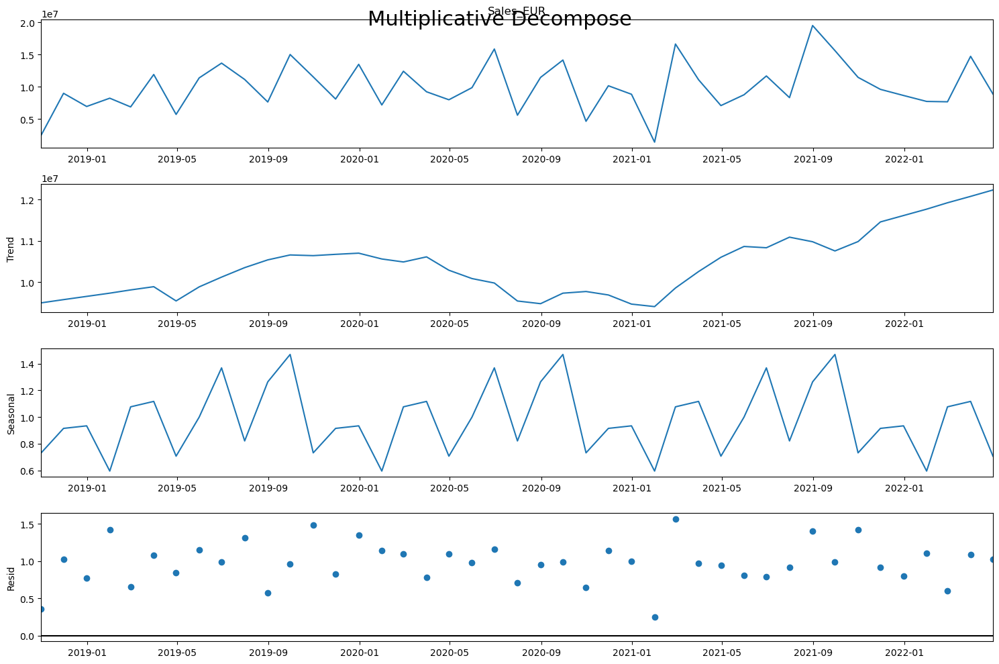

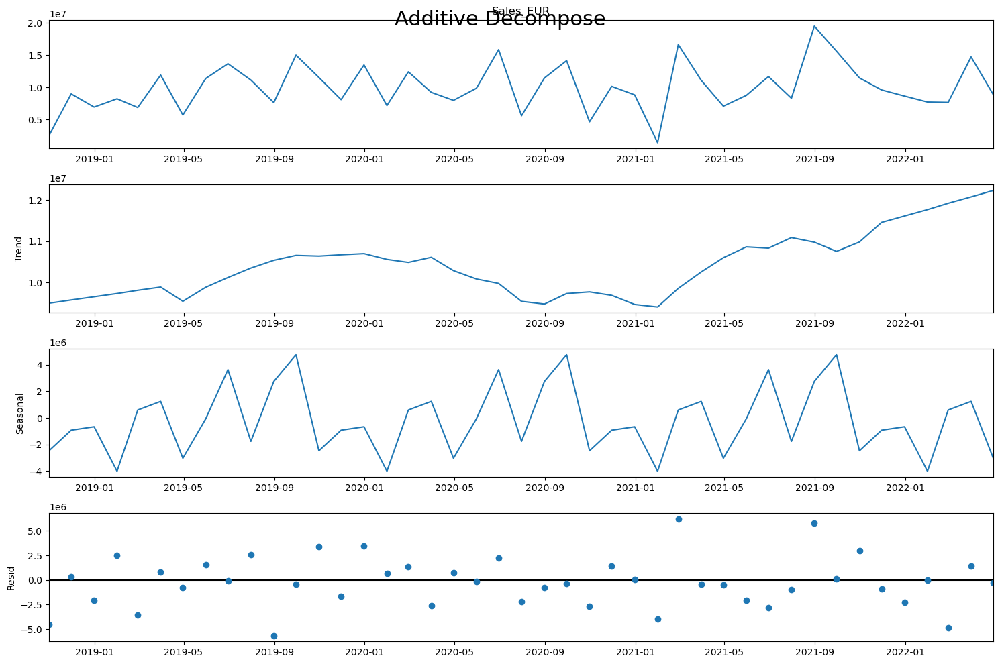

In [44]:
df_sales_grouped_5 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#5']
df_sales_grouped_5 = df_sales_grouped_5.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_5['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_5['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

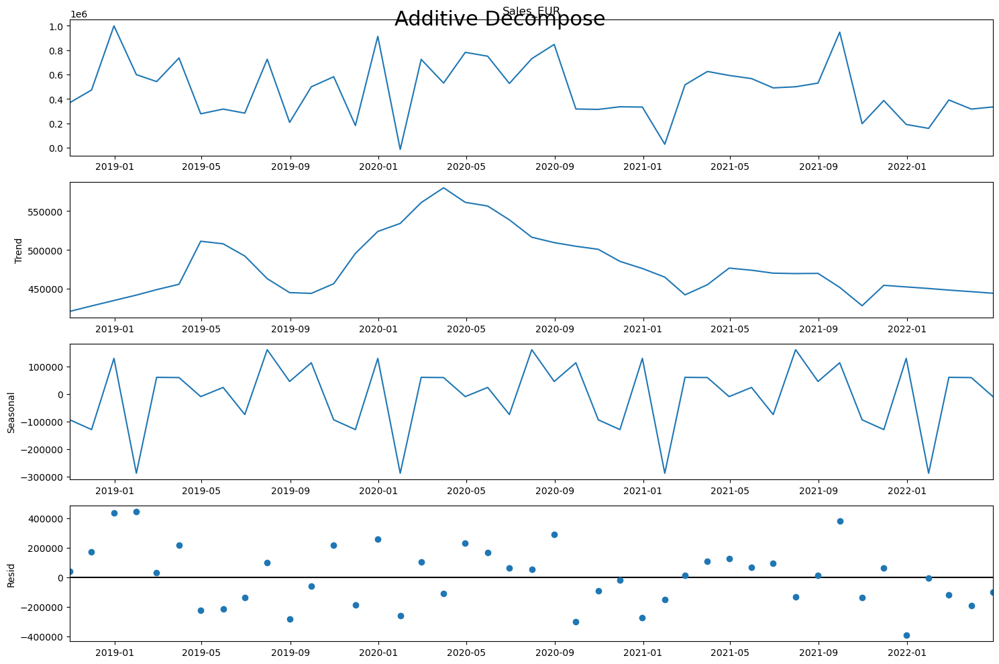

In [45]:
df_sales_grouped_6 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#6']
df_sales_grouped_6 = df_sales_grouped_6.set_index('DATE')

# Multiplicative -> ValueError: Multiplicative seasonality is not appropriate for zero and negative values
#result_mul = seasonal_decompose(df_sales_grouped_6['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_6['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
#result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

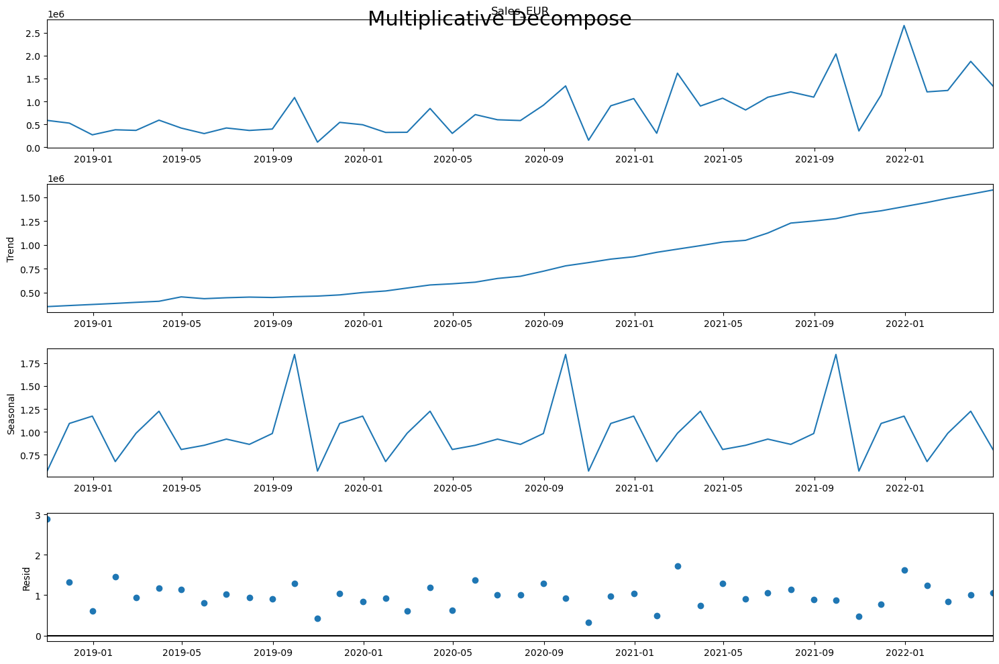

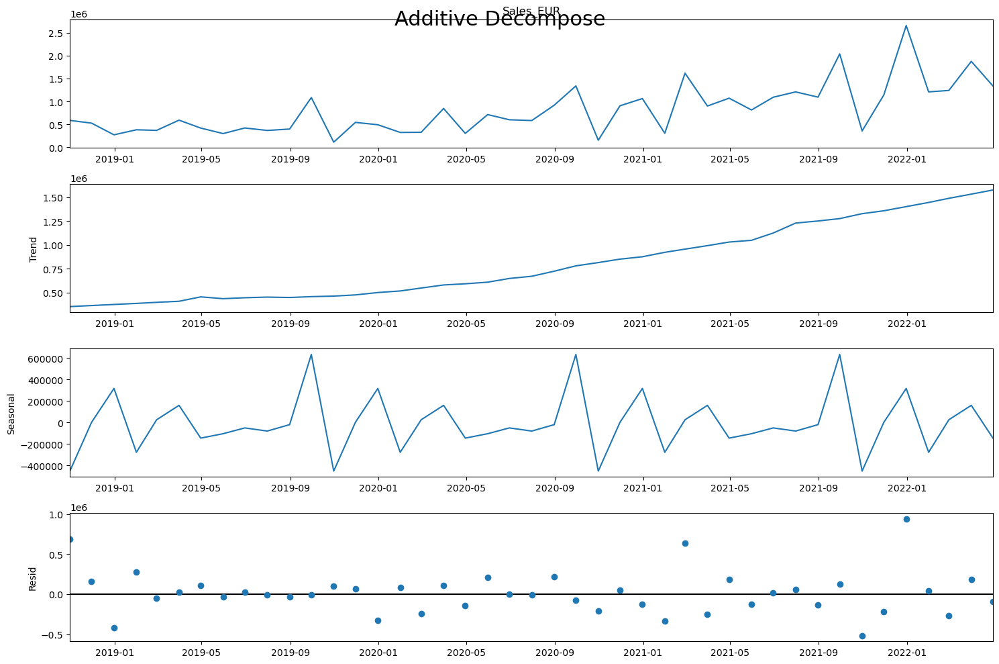

In [46]:
df_sales_grouped_8 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#8']
df_sales_grouped_8 = df_sales_grouped_8.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_8['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_8['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

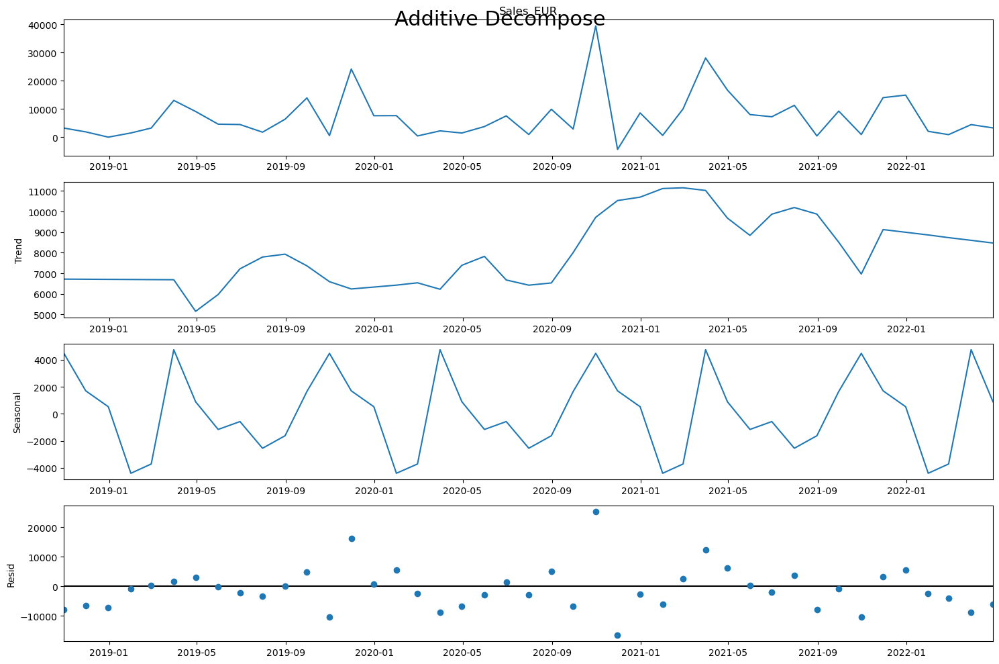

In [47]:
df_sales_grouped_9 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#9']
df_sales_grouped_9 = df_sales_grouped_9.set_index('DATE')

# Multiplicative -> ValueError: Multiplicative seasonality is not appropriate for zero and negative values
#result_mul = seasonal_decompose(df_sales_grouped_9['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_9['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
#result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

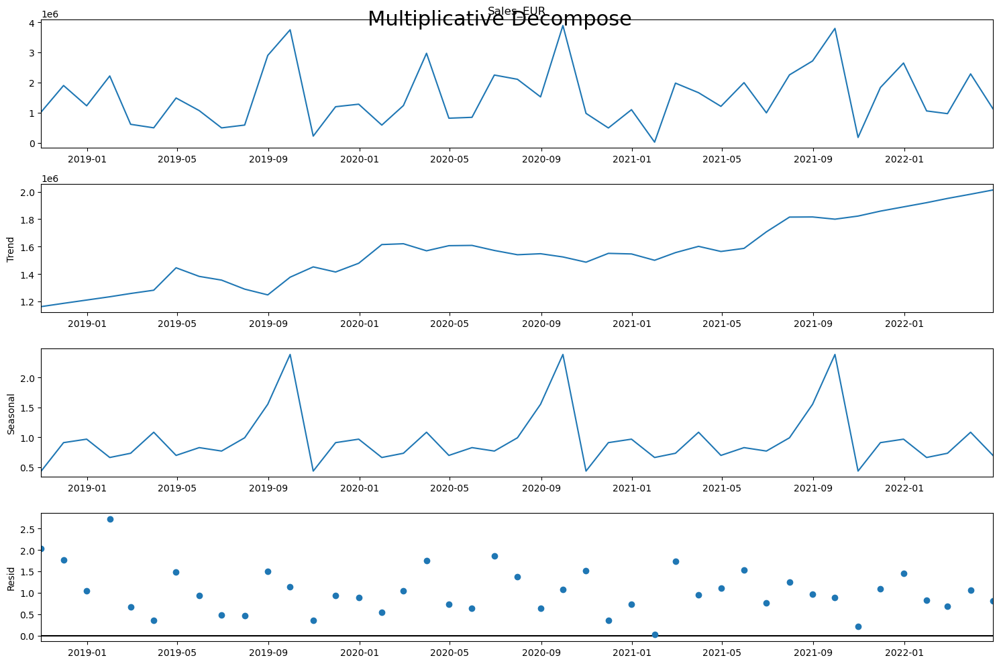

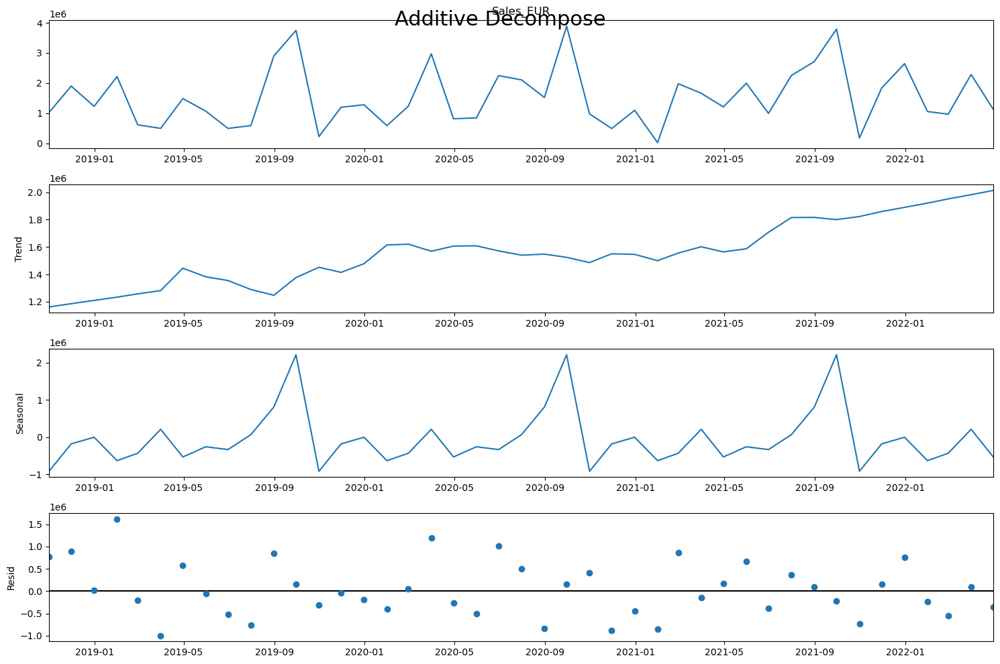

In [48]:
df_sales_grouped_11 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#11']
df_sales_grouped_11 = df_sales_grouped_11.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_11['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_11['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

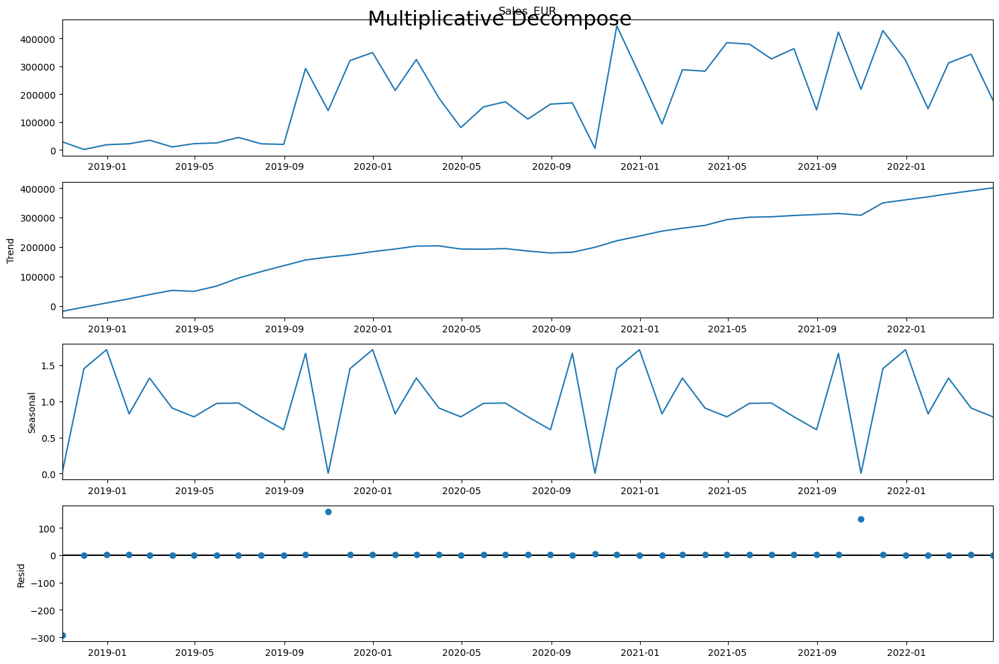

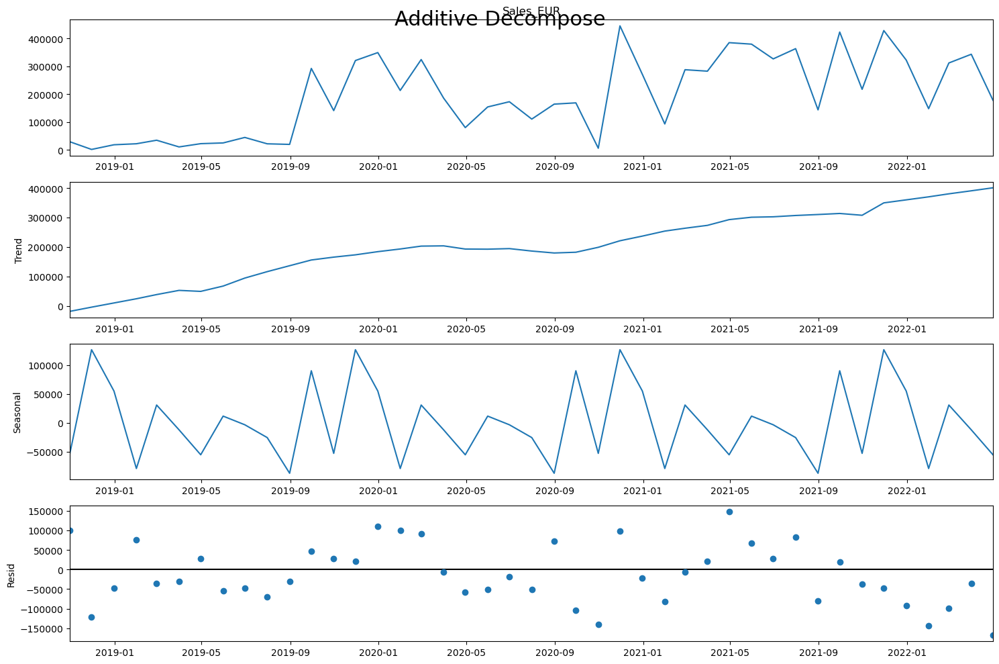

In [49]:
df_sales_grouped_12 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#12']
df_sales_grouped_12 = df_sales_grouped_12.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_12['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_12['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

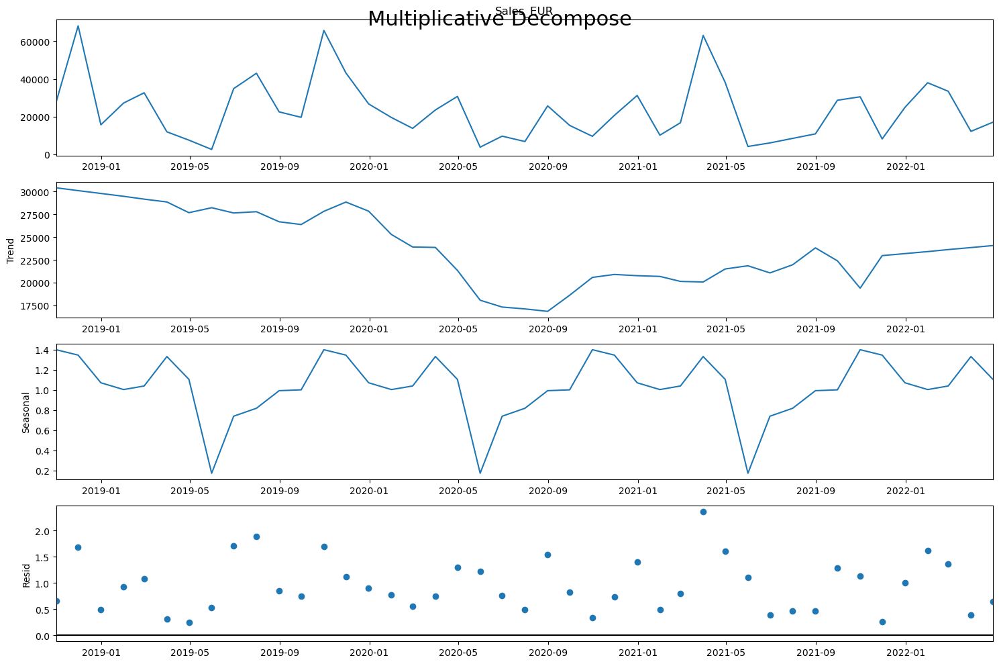

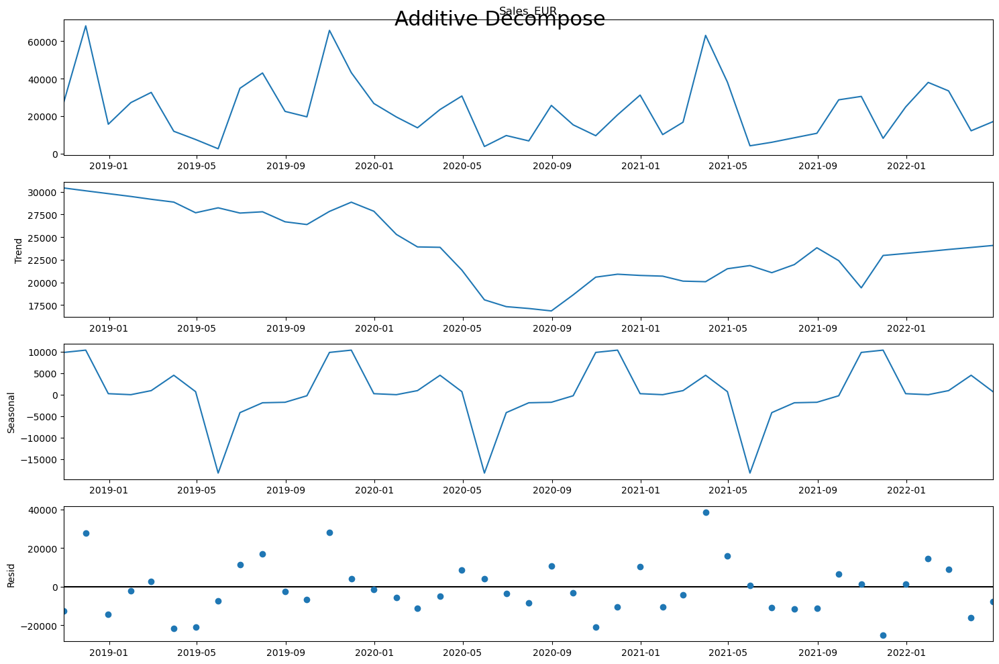

In [50]:
df_sales_grouped_13 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#13']
df_sales_grouped_13 = df_sales_grouped_13.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_13['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_13['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

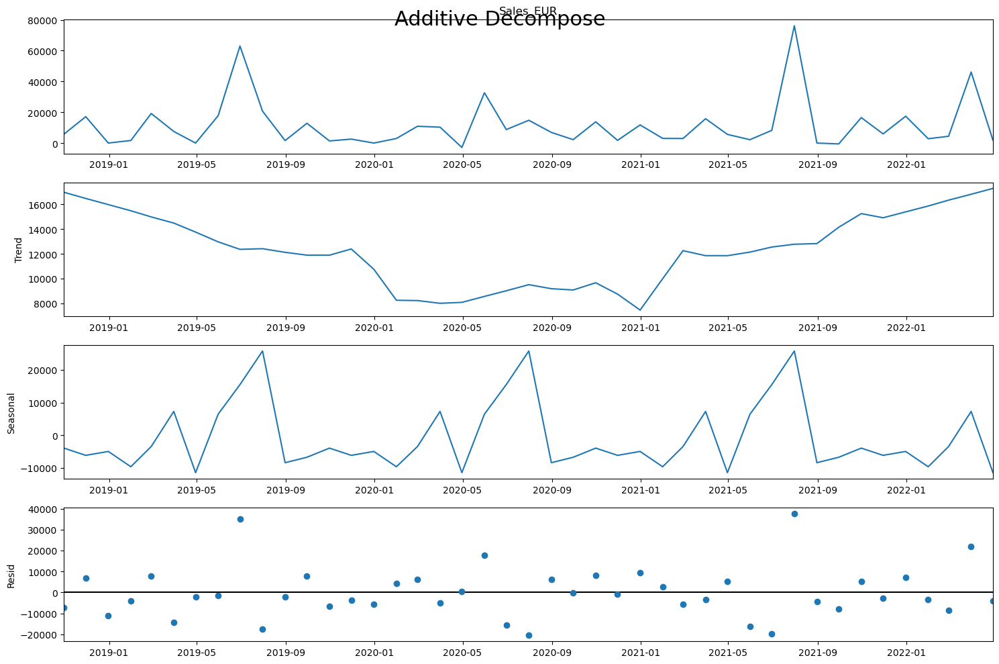

In [51]:
df_sales_grouped_14 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#14']
df_sales_grouped_14 = df_sales_grouped_14.set_index('DATE')

# Multiplicative -> ValueError: Multiplicative seasonality is not appropriate for zero and negative values
#result_mul = seasonal_decompose(df_sales_grouped_14['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_14['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
#result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

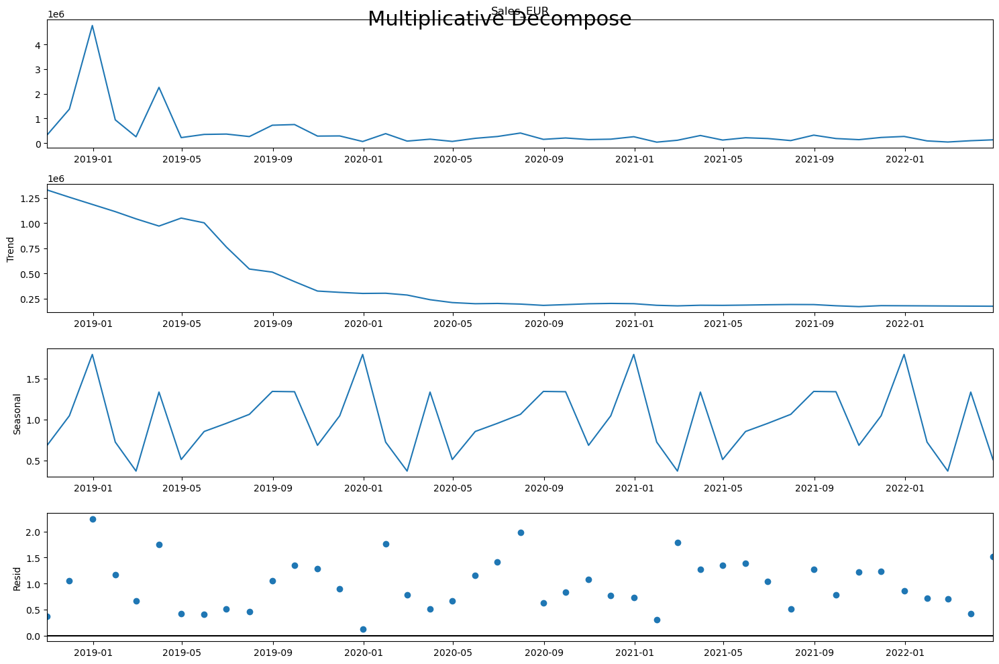

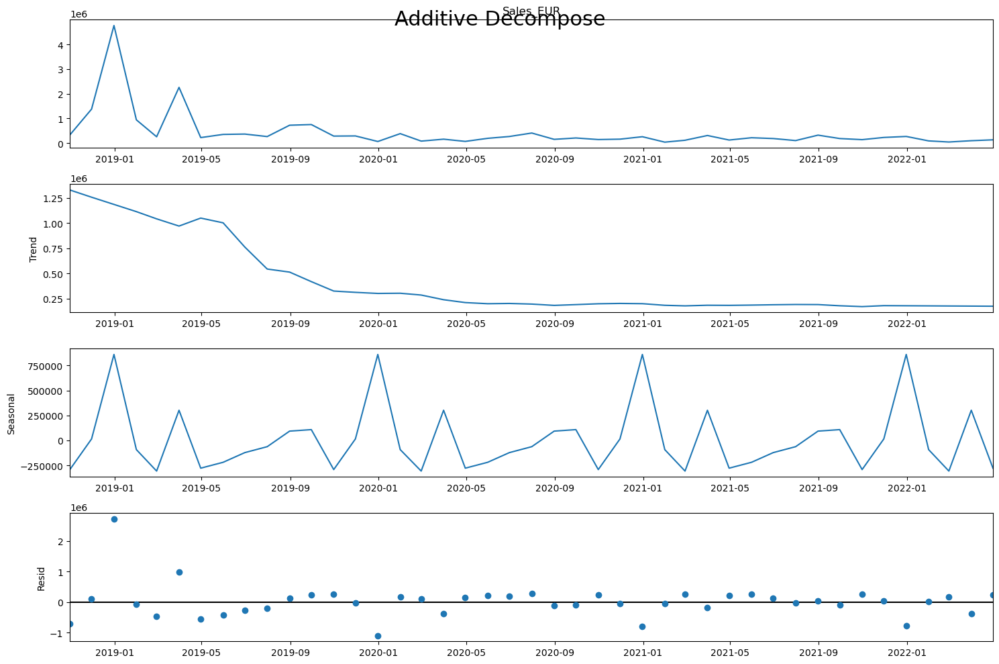

In [52]:
df_sales_grouped_16 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#16']
df_sales_grouped_16 = df_sales_grouped_16.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_16['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_16['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

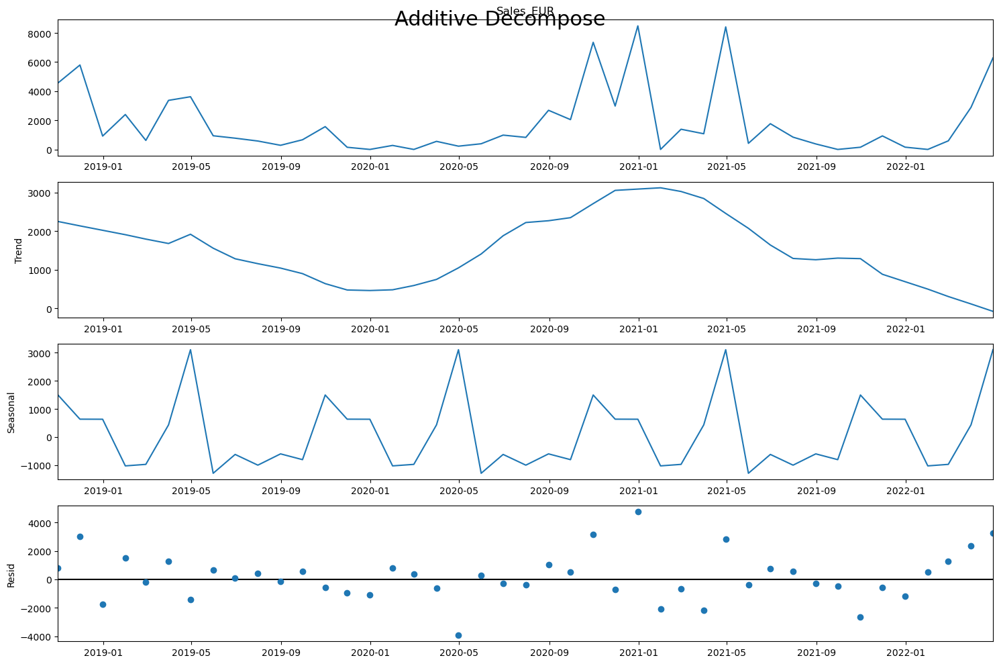

In [53]:
df_sales_grouped_20 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#20']
df_sales_grouped_20 = df_sales_grouped_20.set_index('DATE')

# Multiplicative -> ValueError: Multiplicative seasonality is not appropriate for zero and negative values
#result_mul = seasonal_decompose(df_sales_grouped_20['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_20['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
#result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

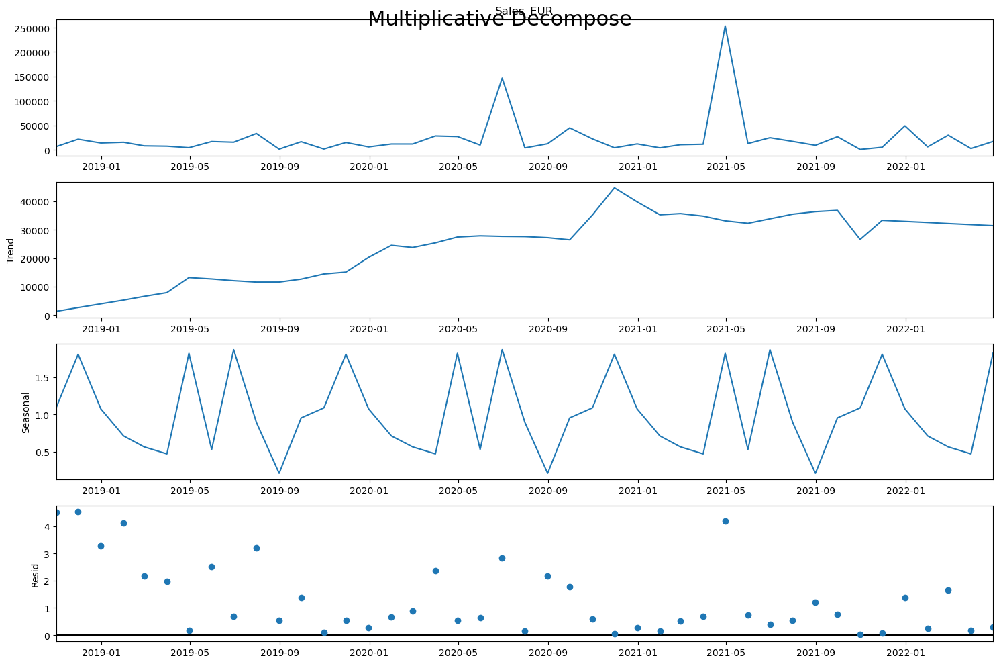

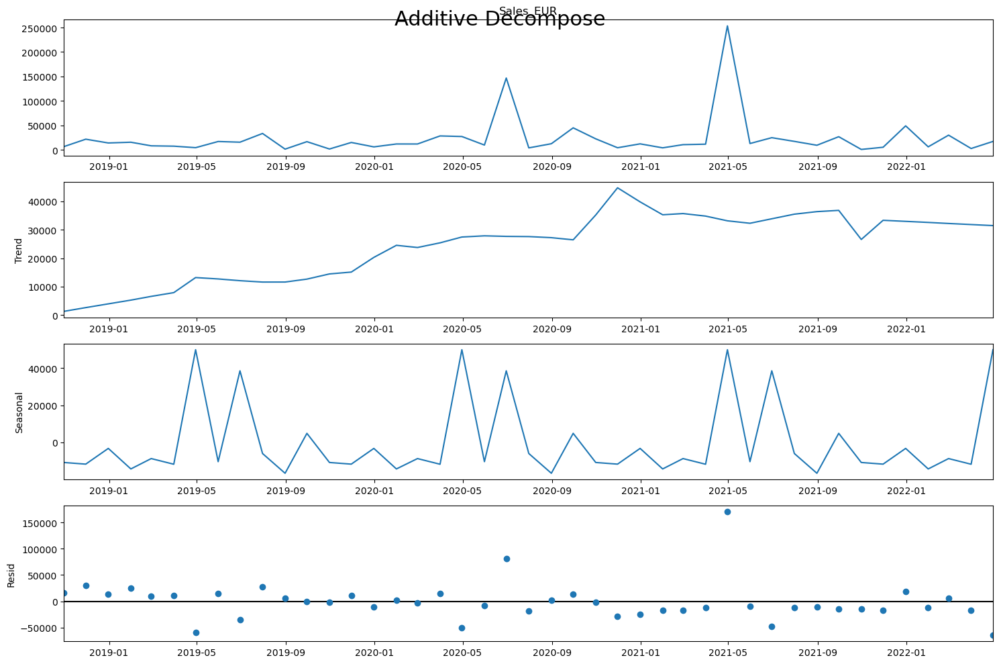

In [54]:
df_sales_grouped_36 = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == '#36']
df_sales_grouped_36 = df_sales_grouped_36.set_index('DATE')

# Multiplicative
result_mul = seasonal_decompose(df_sales_grouped_36['Sales_EUR'], model='multiplicative', period=12, extrapolate_trend='freq')

# Additive
result_add = seasonal_decompose(df_sales_grouped_36['Sales_EUR'], model='additive', period=12, extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (15,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

#### Decomposition Summary

In [55]:
trend_summary = pd.read_excel('Decomposition per GCK summary.xlsx')
trend_summary

,GCK,Trend,Has negative values?
0,#1,Positive,No
1,#3,Positive,No
2,#4,Stable,No
3,#5,Positive,No
4,#6,Stable,Yes
5,#8,Positive,No
6,#9,Positive,Yes
7,#11,Positive,No
8,#12,Positive,No
9,#13,Negative,No


In [56]:
# Visualizing seasonal component per GCK

# group the data by product category and date
df_sales_grouped = df_sales.groupby(['Mapped_GCK', 'DATE'])['Sales_EUR'].sum().reset_index()

# get unique product categories
categories = df_sales_grouped['Mapped_GCK'].unique()

# set the index to the date column for resampling
df_sales_grouped = df_sales_grouped.set_index('DATE')

# resample by month and product category, summing up the sales
df_sales_grouped = df_sales_grouped.groupby('Mapped_GCK').resample('M')['Sales_EUR'].sum().reset_index()

# create subplots
fig = sp.make_subplots(rows=len(categories), cols=1, shared_xaxes=True, vertical_spacing=0.02)

# create a subplot for each category
for i, cat in enumerate(categories):
    # select data for the category
    data = df_sales_grouped[df_sales_grouped['Mapped_GCK'] == cat]
    
    # decompose the data into seasonal, trend, and residual components
    result = seasonal_decompose(data['Sales_EUR'], model='additive', period=12)
    
    # extract the seasonal component
    seasonal_component = result.seasonal
    
    # create a line trace for the seasonal component
    trace = go.Scatter(x=data['DATE'], y=seasonal_component, name=cat)
    
    # add the trace to the subplot
    fig.add_trace(trace, row=i+1, col=1)
    
    # set the y-axis title for the subplot
    fig.update_yaxes(title_text='Seasonal Component', row=i+1, col=1)

# update the x-axis title for the last subplot
fig.update_xaxes(title_text='DATE', row=len(categories), col=1)

# set the figure title and show the plot
fig.update_layout(title='Monthly Sales Seasonal Component per GCK')
fig.show()

# 2. Feature Engineering

In [57]:
df_sales_total.head()

,DATE,Sales_EUR
0,2018-10-31,49471370.83
1,2018-11-30,30760578.47
2,2018-12-31,61312068.79
3,2019-01-31,51360149.23
4,2019-02-28,54336933.67


In [58]:
# Create a modeling dataset from the original dataset
X = pd.DataFrame(index=df_sales_total['DATE'],data={'Sales_EUR':df_sales_total['Sales_EUR'].values})
X = X.sort_values(by='DATE', ascending=True)
X.head()

,Sales_EUR
DATE,
2018-10-31,49471370.83
2018-11-30,30760578.47
2018-12-31,61312068.79
2019-01-31,51360149.23
2019-02-28,54336933.67


## 2.1. Lag Sales

In [59]:
# Function to create lag features
# Adapted from https://machinelearningmastery.com/convert-time-series-supervised-learning-problem-python/
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True, varNames=None):
    """"
    Frame a time series as a supervised learning dataset.
    Arguments:
        data: Sequence of observations as a list or NumPy array.
        n_in: Number of lag observations as input (X).
        n_out: Number of observations as output (y).
        dropnan: Boolean whether or not to drop rows with NaN values.
        varNames: List of column names (same size as the number of variables).
    Returns:
        Pandas DataFrame of series framed for supervised learning.
    """
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [(varNames[j]+'(t-%d)' % (i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [(varNames[j]+'(t)' ) for j in range(n_vars)]
        else:
            names += [(varNames[j]+'(t+%d)' % (i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [60]:
# Create lag features
lagMonths = 12
Xtrial = series_to_supervised(X.values, lagMonths, 1, varNames=X.columns.values.tolist())
Xtrial.index = df_sales_total['DATE'][lagMonths:].reset_index(drop=True)
Xtrial.head()

,Sales_EUR(t-12),Sales_EUR(t-11),Sales_EUR(t-10),Sales_EUR(t-9),Sales_EUR(t-8),Sales_EUR(t-7),Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t)
DATE,,,,,,,,,,,,,
2019-10-31,49471370.83,30760578.47,61312068.79,51360149.23,54336933.67,61435886.28,60598035.44,65563813.36,66251932.08,64925427.91,61630019.14,79087221.00,63440758.36
2019-11-30,30760578.47,61312068.79,51360149.23,54336933.67,61435886.28,60598035.44,65563813.36,66251932.08,64925427.91,61630019.14,79087221.00,63440758.36,62168871.18
2019-12-31,61312068.79,51360149.23,54336933.67,61435886.28,60598035.44,65563813.36,66251932.08,64925427.91,61630019.14,79087221.00,63440758.36,62168871.18,65689212.91
2020-01-31,51360149.23,54336933.67,61435886.28,60598035.44,65563813.36,66251932.08,64925427.91,61630019.14,79087221.00,63440758.36,62168871.18,65689212.91,54752820.51
2020-02-29,54336933.67,61435886.28,60598035.44,65563813.36,66251932.08,64925427.91,61630019.14,79087221.00,63440758.36,62168871.18,65689212.91,54752820.51,58926297.86


In [61]:
# Let's check which lags have the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable
correlations = {}
for lag in range(1, 13):
    corr = np.corrcoef(Xtrial['Sales_EUR(t)'], Xtrial[f'Sales_EUR(t-{lag})'])[0, 1]
    correlations[f'Sales_EUR(t-{lag})'] = corr

# sort the correlations in descending order and print the results
correlations = {k: v for k, v in sorted(correlations.items(), key=lambda item: item[1], reverse=True)}
for feature, corr in correlations.items():
    print(f'{feature}: {corr}')

Sales_EUR(t-12): 0.3067813550912947
Sales_EUR(t-6): 0.24422283750236878
Sales_EUR(t-11): 0.16087179227069068
Sales_EUR(t-3): 0.07889327824815351
Sales_EUR(t-5): 0.07675208995029012
Sales_EUR(t-1): 0.042490175744351766
Sales_EUR(t-2): 0.00518023823537702
Sales_EUR(t-9): -0.06633356126859978
Sales_EUR(t-7): -0.09978600186917573
Sales_EUR(t-8): -0.16440314874362347
Sales_EUR(t-10): -0.20278667237342343
Sales_EUR(t-4): -0.2873068671223462


Even though t-12 has the highest correlation with the sales, if we keep the 12 lag features we will lose one year of data, so let's keep only 6 lag sales features.

In [62]:
# Create final lag features
lagMonths = 6
X = series_to_supervised(X.values, lagMonths, 1, varNames=X.columns.values.tolist())
X.index = df_sales_total['DATE'][lagMonths:].reset_index(drop=True)
X.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t)
DATE,,,,,,,
2019-04-30,49471370.83,30760578.47,61312068.79,51360149.23,54336933.67,61435886.28,60598035.44
2019-05-31,30760578.47,61312068.79,51360149.23,54336933.67,61435886.28,60598035.44,65563813.36
2019-06-30,61312068.79,51360149.23,54336933.67,61435886.28,60598035.44,65563813.36,66251932.08
2019-07-31,51360149.23,54336933.67,61435886.28,60598035.44,65563813.36,66251932.08,64925427.91
2019-08-31,54336933.67,61435886.28,60598035.44,65563813.36,66251932.08,64925427.91,61630019.14


## 2.2. Market Features

First let's check which market features are correlated between them. The ones with highly strong correlations can be dropped as they would be redundant.

In [63]:
# Calculate correlation between variables
cor_spearman = df_market.corr(method ='spearman')
cor_spearman_rounded = cor_spearman.round(2)

In [64]:
# Let's filter only the highly strong correlations
cor_spearman_filtered = cor_spearman_rounded[((cor_spearman_rounded >= 0.9) | (cor_spearman_rounded <= -0.9)) & (cor_spearman_rounded != 1)]

# Create a list of tuples to store the filtered correlations
corr_list = []
for column in cor_spearman_filtered.columns:
    for index in cor_spearman_filtered.index:
        if abs(cor_spearman_filtered.loc[index, column]) >= 0.9:
            corr_list.append((index, column, cor_spearman_filtered.loc[index, column]))

# Sort the list by the absolute value of the correlation coefficient
corr_list_sorted = sorted(corr_list, key=lambda x: abs(x[2]), reverse=True)

# Print the list
for pair in corr_list_sorted:
    print(pair[0], "-", pair[1], ":", pair[2])

Japan SIM&E - Japan PIM&E : 0.99
Japan PI M&E n.e.c - Japan PIM&E : 0.99
Japan PIM&E - Japan SIM&E : 0.99
Price Crude Oil (Avg) - Price Energy : 0.99
Price Energy - Price Crude Oil (Avg) : 0.99
Japan PIM&E - Japan PI M&E n.e.c : 0.99
France PI M&E n.e.c - France PIM&E : 0.98
Germany PI M&E n.e.c - Germany PIM&E : 0.98
Japan PI M&E n.e.c - Japan SIM&E : 0.98
Price Metals & Minerals - Price Base Metals : 0.98
Price Base Metals - Price Metals & Minerals : 0.98
Japan SIM&E - Japan PI M&E n.e.c : 0.98
France PIM&E - France PI M&E n.e.c : 0.98
Germany PIM&E - Germany PI M&E n.e.c : 0.98
Germany PPEE - China PIM&E : 0.97
Italy PI M&E n.e.c - Italy PIM&E : 0.97
Switzerland SIM&E - Switzerland PIM&E : 0.97
Switzerland PIM&E - Switzerland SIM&E : 0.97
Germany PPEE - USA PPEE : 0.97
China PIM&E - Germany PPEE : 0.97
USA PPEE - Germany PPEE : 0.97
Italy PIM&E - Italy PI M&E n.e.c : 0.97
Price Cooper - Price Metals & Minerals : 0.96
Price Metals & Minerals - Price Cooper : 0.96
Italy PPEE - USA PPE

From the previous results we can define to discard 16 features form the market data:

In [65]:
final_insights = pd.read_excel('Feature Selection Final Insights.xlsx', sheet_name='Sheet1 (2)')
final_insights

,Predictor,What to do?
0,China PIM&E,discard
1,France PIM&E,keep
2,France SIM&E,keep
3,Germany PIM&E,keep
4,Germany SIM&E,keep
5,Italy PIM&E,keep
6,Italy SIM&E,keep
7,Japan PIM&E,keep
8,Japan SIM&E,discard
9,Switzerland PIM&E,keep


In [66]:
discard_market_features = ['China PIM&E', 'Japan SIM&E', 'Switzerland SIM&E', 'Europe SIM&E', 'Price Metals & Minerals',
                          'Price Crude Oil (Avg)', 'USA PPEE', 'Italy PPEE', 'USA PI M&E n.e.c', 'UK PI M&E n.e.c',
                          'Italy PI M&E n.e.c', 'Japan PI M&E n.e.c', 'France PI M&E n.e.c', 'Germany PI M&E n.e.c',
                          'Japan PI EE', 'France PI EE']

In [67]:
df_market_filtered = df_market.drop(discard_market_features, axis=1)
df_market_filtered.head()

,France PIM&E,France SIM&E,Germany PIM&E,Germany SIM&E,Italy PIM&E,Italy SIM&E,Japan PIM&E,Switzerland PIM&E,UK PIM&E,UK SIM&E,...,Germany PPEE,China PPEE,World PI M&E n.e.c,Switzerland PI M&E n.e.c,USA PI EE,World PI EE,Switzerland PI EE,UK PI EE,Italy PI EE,Germany PI EE
date,,,,,,,,,,,,,,,,,,,,,
2004-02-29,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,91.221862,111.353812,73.601265,...,93.230453,97.681389,97.597374,97.100000,117.723991,111.14707,81.100000,120.706516,141.510864,85.913200
2004-03-31,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,85.866287,127.558608,84.047595,...,93.335678,97.681389,113.224892,91.195116,119.220779,111.14707,76.690307,138.309550,152.880234,97.670815
2004-04-30,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,85.622508,108.732297,73.026027,...,93.440903,97.681389,100.169090,93.793535,117.441124,111.14707,71.552403,115.557330,137.796875,87.253983
2004-05-31,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,85.378729,110.645200,74.591883,...,93.546127,97.681389,99.581436,96.391954,117.899216,111.14707,66.414500,119.269534,143.860535,84.675552
2004-06-30,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,85.134950,122.020960,82.343346,...,93.440903,97.681389,109.277710,98.990373,119.499107,111.14707,61.276596,128.849416,144.315308,95.401802


Now let's create lag features for all the market variables so we can check which period has the best correlation with the sales:

In [68]:
# create lag features
lagMonths = 12
df_market_filtered_lag_trial = series_to_supervised(df_market_filtered.values, 
                                                    lagMonths, 
                                                    1, 
                                                    varNames=df_market_filtered.columns.values.tolist())
df_market_filtered_lag_trial.index = df_market_filtered.index[lagMonths:] # use the index of df_market_filtered
df_market_filtered_lag_trial.head()

,France PIM&E(t-12),France SIM&E(t-12),Germany PIM&E(t-12),Germany SIM&E(t-12),Italy PIM&E(t-12),Italy SIM&E(t-12),Japan PIM&E(t-12),Switzerland PIM&E(t-12),UK PIM&E(t-12),UK SIM&E(t-12),...,Germany PPEE(t),China PPEE(t),World PI M&E n.e.c(t),Switzerland PI M&E n.e.c(t),USA PI EE(t),World PI EE(t),Switzerland PI EE(t),UK PI EE(t),Italy PI EE(t),Germany PI EE(t)
date,,,,,,,,,,,,,,,,,,,,,
2005-02-28,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,91.221862,111.353812,73.601265,...,93.756577,97.681389,94.567482,95.108398,121.894897,94.116264,67.044917,120.107774,125.896919,87.253983
2005-03-31,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,85.866287,127.558608,84.047595,...,93.756577,97.681389,109.511421,86.780934,121.544670,104.539177,72.151300,127.651931,137.114700,93.029648
2005-04-30,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,85.622508,108.732297,73.026027,...,93.861801,97.681389,100.997047,90.193316,119.891762,98.248116,68.620961,121.305259,130.520462,94.370430
2005-05-31,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,85.378729,110.645200,74.591883,...,94.072250,97.681389,98.755165,93.605698,119.681664,96.255333,65.090623,120.706516,140.373917,84.881828
2005-06-30,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,85.134950,122.020960,82.343346,...,94.072250,97.681389,107.797165,97.018079,121.072227,103.883186,61.560284,125.975452,129.156128,101.693169


We will run the correlations with the sales of each GCK.

## 2.3. Other features

### Construction Data

In [69]:
# Since this data refers to granted building permits the correlation most likely has a lag as Siemens products
# are bought some time after the permit is granted and the construction starts
# let's create lag features so we can check which period has the best correlation with the sales:

lagMonths = 10
df_construction_trial = series_to_supervised(df_construction.values, 
                                             lagMonths, 
                                             1, 
                                             varNames=df_construction.columns.values.tolist())
df_construction_trial.index = df_construction.index[lagMonths:]
df_construction_trial.head()

,Buildings (Number)(t-10),Buildings (Number)(t-9),Buildings (Number)(t-8),Buildings (Number)(t-7),Buildings (Number)(t-6),Buildings (Number)(t-5),Buildings (Number)(t-4),Buildings (Number)(t-3),Buildings (Number)(t-2),Buildings (Number)(t-1),Buildings (Number)(t)
date,,,,,,,,,,,
2022-04-30,8079.0,8519.0,10087.0,9547.0,9538.0,10980.0,11415.0,12005.0,12027.0,12833.0,11728
2022-03-31,8519.0,10087.0,9547.0,9538.0,10980.0,11415.0,12005.0,12027.0,12833.0,11728.0,13497
2022-02-28,10087.0,9547.0,9538.0,10980.0,11415.0,12005.0,12027.0,12833.0,11728.0,13497.0,11613
2022-01-31,9547.0,9538.0,10980.0,11415.0,12005.0,12027.0,12833.0,11728.0,13497.0,11613.0,11404
2021-12-31,9538.0,10980.0,11415.0,12005.0,12027.0,12833.0,11728.0,13497.0,11613.0,11404.0,13730


In [70]:
# Let's include the sales in this dataset to run the correlations
df_construction_trial = df_construction_trial.join(X['Sales_EUR(t)'], how='right')
df_construction_trial.head()

,Buildings (Number)(t-10),Buildings (Number)(t-9),Buildings (Number)(t-8),Buildings (Number)(t-7),Buildings (Number)(t-6),Buildings (Number)(t-5),Buildings (Number)(t-4),Buildings (Number)(t-3),Buildings (Number)(t-2),Buildings (Number)(t-1),Buildings (Number)(t),Sales_EUR(t)
DATE,,,,,,,,,,,,
2019-04-30,10663.0,10876.0,12195.0,11682.0,12803.0,12380.0,12620.0,13929.0,11826.0,13377.0,12299,60598035.44
2019-05-31,12410.0,10663.0,10876.0,12195.0,11682.0,12803.0,12380.0,12620.0,13929.0,11826.0,13377,65563813.36
2019-06-30,12686.0,12410.0,10663.0,10876.0,12195.0,11682.0,12803.0,12380.0,12620.0,13929.0,11826,66251932.08
2019-07-31,12513.0,12686.0,12410.0,10663.0,10876.0,12195.0,11682.0,12803.0,12380.0,12620.0,13929,64925427.91
2019-08-31,13770.0,12513.0,12686.0,12410.0,10663.0,10876.0,12195.0,11682.0,12803.0,12380.0,12620,61630019.14


In [71]:
# Let's check which lags have the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable
correlations = {}
for lag in range(0, 11):
    if lag == 0:
        corr = np.corrcoef(df_construction_trial['Sales_EUR(t)'], df_construction_trial['Buildings (Number)(t)'])[0, 1]
        correlations['Buildings (Number)(t)'] = corr
    else:
        corr = np.corrcoef(df_construction_trial['Sales_EUR(t)'], df_construction_trial[f'Buildings (Number)(t-{lag})'])[0, 1]
        correlations[f'Buildings (Number)(t-{lag})'] = corr

# sort the correlations in descending order and print the results
correlations = {k: v for k, v in sorted(correlations.items(), key=lambda item: item[1], reverse=True)}
for feature, corr in correlations.items():
    print(f'{feature}: {corr}')

Buildings (Number)(t-1): 0.12879993458189778
Buildings (Number)(t): 0.10397554417094759
Buildings (Number)(t-6): 0.04739350700500222
Buildings (Number)(t-9): 0.005356821883210336
Buildings (Number)(t-4): -0.07256040893525487
Buildings (Number)(t-10): -0.12794411207831313
Buildings (Number)(t-3): -0.13311644512262294
Buildings (Number)(t-7): -0.1811852107065079
Buildings (Number)(t-8): -0.215302514118919
Buildings (Number)(t-5): -0.40685406099865185
Buildings (Number)(t-2): -0.6035191444945113


The highest correlation is with t-2.

# 3. Models

## Auxiliary Functions

In [72]:
# Create features to capture time
# Source: https://www.kaggle.com/code/robikscube/time-series-forecasting-with-machine-learning-yt

def create_features(df):
    """
    Create time series features based on time series index.
    """
    df = df.copy()
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    return df

In [73]:
def create_data(ds, selected_market_lags):
    
    # Create lag features
    lagMonths = 6
    ds = series_to_supervised(ds.values, lagMonths, 1, varNames=ds.columns.values.tolist())
    ds.index = df_sales_total['DATE'][lagMonths:].reset_index(drop=True)
    
    # Create features to capture time
    ds = create_features(ds)
    
    # Merging market and other features
    ds = ds.join(df_market_filtered_lag_trial[selected_market_lags], how='left')
    ds = ds.join(df_holidays, how='left')
    ds = ds.join(df_stringency, how='left')
    ds['stringency_index'] = ds['stringency_index'].fillna(0)
    ds = ds.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
    ds = ds.join(df_gdp, how='left')
    ds = ds.join(df_unemployment, how='left')
    
    return ds

In [74]:
def scale(X_train, X_test):
    
    # Scaling the train data
    scaler = MinMaxScaler().fit(X_train)
    X_train_scaled = scaler.transform(X_train) # this will return an array
    # Convert the array to a pandas dataframe
    X_train_scaled = pd.DataFrame(X_train_scaled, columns = X_train.columns).set_index(X_train.index)

    # Scaling the test data
    X_test_scaled = scaler.transform(X_test)
    X_test_scaled = pd.DataFrame(X_test_scaled, columns = X_test.columns).set_index(X_test.index)
    
    return X_train_scaled, X_test_scaled

In [75]:
def data_partition(y, X):
    
    y_train = y.loc[y.index < '05-01-2021']
    y_test = y.loc[y.index >= '05-01-2021']

    X_train = X.loc[X.index < '05-01-2021']
    X_test = X.loc[X.index >= '05-01-2021']

    fig, ax = plt.subplots(figsize=(15, 5))
    y_train.plot(ax=ax, label='Training Set', title='Data Train/Test Split')
    y_test.plot(ax=ax, label='Test Set')
    ax.axvline('05-01-2021', color='black', ls='--')
    ax.legend(['Training Set', 'Test Set'])
    plt.show()
    
    return y_train, y_test, X_train, X_test

## 3.1. GCK #1

In [76]:
# Create a modeling dataset from the original dataset
X1 = pd.DataFrame(index=df_sales_grouped_1.index, data={'Sales_EUR': df_sales_grouped_1['Sales_EUR'].values})
X1 = X1.sort_index(ascending=True)
X1.head()

,Sales_EUR
DATE,
2018-10-31,36098918.79
2018-11-30,5140760.00
2018-12-31,37889612.12
2019-01-31,27728148.35
2019-02-28,34793163.53


### Selecting best market lag features for this GCK

In [77]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_1 = df_market_filtered_lag_trial.join(X1['Sales_EUR'], how='right')

In [78]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_1['Sales_EUR'], df_market_filtered_lag_trial_1[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df1_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df1_correlations.loc[col, lag] = corr

df1_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,0.007288,-0.10077,0.186504,-0.056295,-0.075621,0.057043,-0.00873,-0.253324,0.145194,0.136933,-0.063142,-0.059537,-0.022701
France SIM&E,0.049964,-0.019465,0.115529,0.155054,-0.098645,0.118888,0.009883,-0.142792,0.155945,0.257171,-0.038354,-0.060382,0.018680
Germany PIM&E,-0.016928,-0.209305,-0.196911,-0.059054,-0.169098,-0.016753,0.017073,-0.19032,0.051569,0.129769,-0.144103,-0.159107,-0.108119
Germany SIM&E,0.088512,-0.161447,-0.11265,0.055543,-0.161302,0.017616,0.080881,-0.155989,0.117352,0.222165,-0.144659,-0.097629,-0.003055
Italy PIM&E,0.030642,-0.053081,0.26905,-0.131316,0.07868,-0.097004,-0.038721,-0.269087,0.09415,0.122131,0.146764,-0.05999,-0.011245
Italy SIM&E,0.032619,-0.07793,0.236363,0.061236,0.06319,-0.085689,0.028174,-0.188562,0.226498,0.384796,-0.024546,0.009326,0.084848
Japan PIM&E,0.066627,-0.193977,-0.049328,-0.043351,-0.129944,0.067098,0.156414,-0.336606,0.005865,-0.032641,-0.194043,-0.033527,0.012368
Switzerland PIM&E,-0.219503,-0.192686,-0.145286,-0.079599,-0.006008,0.03579,0.087655,0.095751,0.021725,-0.067308,-0.188267,-0.212606,-0.178734
UK PIM&E,0.18888,-0.028721,-0.085119,-0.048919,-0.080724,-0.03416,0.089811,-0.138954,0.121275,0.029114,0.052403,-0.130073,-0.012569
UK SIM&E,0.047036,-0.026407,-0.067115,-0.14123,-0.107215,-0.072311,-0.016374,-0.176797,0.095232,-0.060024,-0.077001,-0.196436,-0.081597


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [79]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_1 = df1_correlations[(df1_correlations >= 0.3) | (df1_correlations <= -0.3)]
filtered_df_correlations_1

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.384796,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.336606,NaN,NaN,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
# let's create a list with those selected features

selected_market_lags_1 = []
for col, lag in filtered_df_correlations_1.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_1.append(feature_name)

selected_market_lags_1

['Italy SIM&E(t-10)',
 'Japan PIM&E(t-8)',
 'USA SIM&E(t-10)',
 'USA SIM&E(t-12)',
 'France PPEE(t-11)',
 'France PPEE(t-12)',
 'Germany PPEE(t-6)',
 'Germany PPEE(t-7)',
 'Germany PPEE(t-8)',
 'Germany PPEE(t-9)',
 'Germany PPEE(t-11)',
 'Germany PPEE(t-12)',
 'UK PI EE(t-1)',
 'UK PI EE(t-7)']

In [81]:
# Create features
X1 = create_data(X1, selected_market_lags_1)
X1.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Germany PPEE(t-9),Germany PPEE(t-11),Germany PPEE(t-12),UK PI EE(t-1),UK PI EE(t-7),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,36098918.79,5140760.00,37889612.12,27728148.35,34793163.53,33856803.04,39688292.01,2,4,2019,...,108.803925,108.277802,108.172577,126.214949,110.288394,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,5140760.00,37889612.12,27728148.35,34793163.53,33856803.04,39688292.01,38897974.29,2,5,2019,...,108.909157,108.593475,108.277802,113.521605,118.670791,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,37889612.12,27728148.35,34793163.53,33856803.04,39688292.01,38897974.29,39106750.23,2,6,2019,...,108.909157,108.803925,108.593475,117.593055,120.467019,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,27728148.35,34793163.53,33856803.04,39688292.01,38897974.29,39106750.23,37912572.30,3,7,2019,...,109.119614,108.909157,108.803925,123.101487,105.378705,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,34793163.53,33856803.04,39688292.01,38897974.29,39106750.23,37912572.30,38042677.05,3,8,2019,...,109.224838,108.909157,108.909157,123.939727,107.174933,1.000000,0.0,12803.0,872.30,5.1


In [82]:
X1_original = X1.copy()

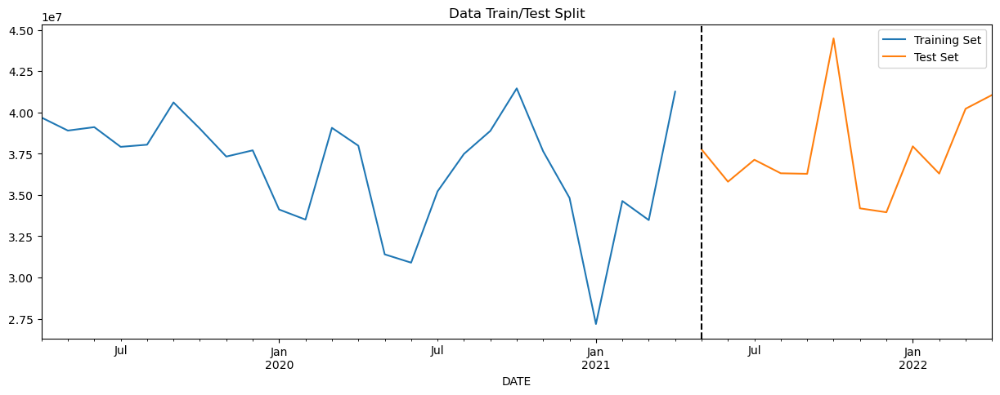

In [83]:
# DATA PARTITION

# Create the Target
y1 = X1['Sales_EUR(t)']

# Split into train and test

y1_train, y1_test, X1_train, X1_test = data_partition(y1, X1)

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [84]:
# Scaling the train and test data

X1_train_scaled, X1_test_scaled = scale(X1_train, X1_test)

### Model

In [85]:
reg1 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [86]:
reg1.fit(X1_train_scaled, y1_train,
        eval_set=[(X1_train_scaled, y1_train), (X1_test_scaled, y1_test)],
        verbose=100)

[23:02:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:36498688.76071	validation_1-rmse:37376271.64424
[100]	validation_0-rmse:14210151.40614	validation_1-rmse:15576001.06717
[200]	validation_0-rmse:5761548.02537	validation_1-rmse:7711907.09729
[300]	validation_0-rmse:2479052.94751	validation_1-rmse:4897589.43525
[400]	validation_0-rmse:1160047.99403	validation_1-rmse:3906667.80083
[500]	validation_0-rmse:586915.44069	validation_1-rmse:3584603.11925
[600]	validation_0-rmse:322355.61312	validation_1-rmse:3478642.15997
[700]	validation_0-rmse:167033.69261	validation_1-rmse:3419634.28415
[725]	validation_0-rmse:143273.81462	validation_1-rmse:3422366.34690


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

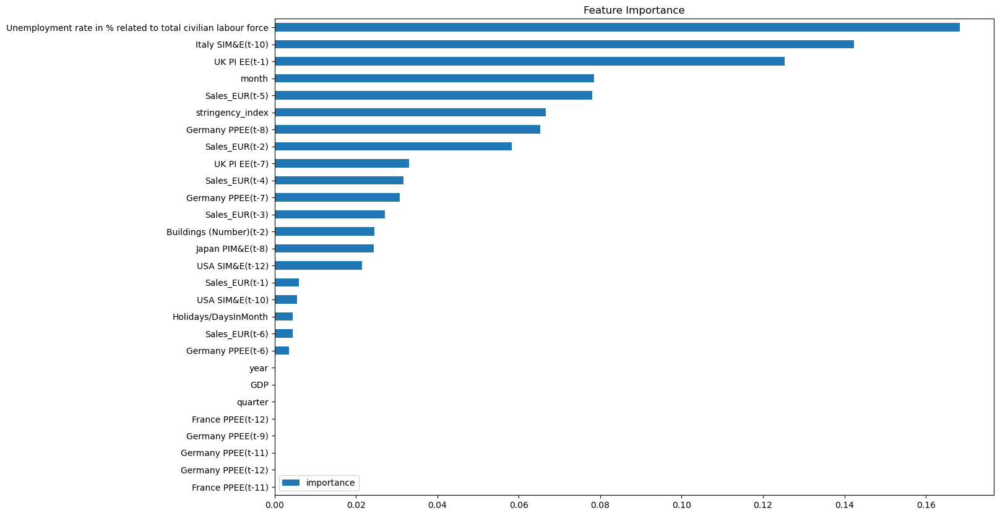

In [87]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg1.feature_importances_,
             index=reg1.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

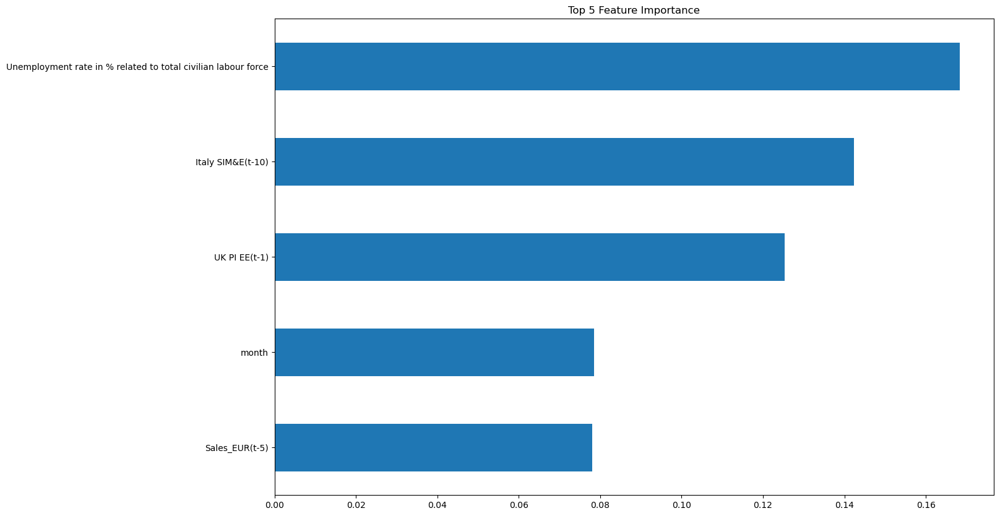

In [88]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg1.feature_importances_,
             index=reg1.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

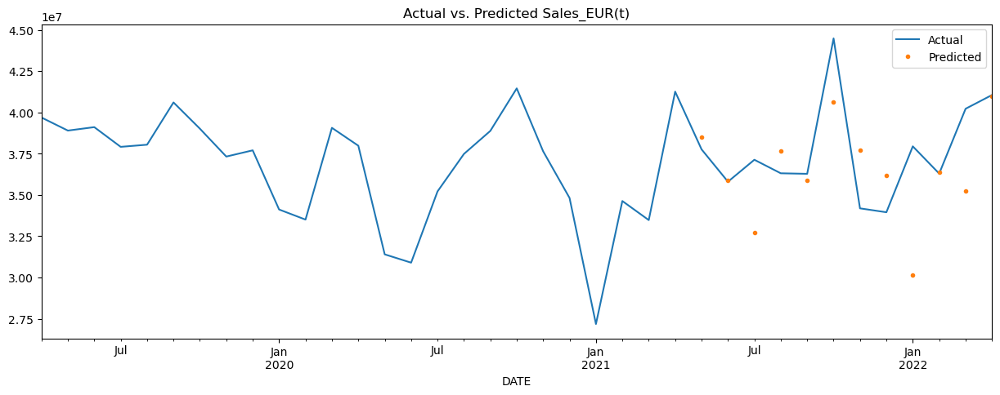

In [89]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results1 = pd.DataFrame({'actual': y1_test.values, 'predicted': y1_pred}, index=y1_test.index)

# Merge the new dataframe with the original dataframe X1:
X1_pred = X1.merge(results1, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X1_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X1_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [90]:
# SCORE (RMSE)
score1 = np.sqrt(mean_squared_error(y1_test, y1_pred))
print(f'RMSE Score on Test set: {score1:0.2f}')

RMSE Score on Test set: 3415606.97


In [91]:
# Visualize predictions vs close values 
temp1 = y1_test.to_frame()
temp1['Prediction'] = y1_pred
temp1['Residual'] = y1_test - temp1.Prediction
temp1

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,37760015.28,38484600.0,-724584.72
2021-06-30,35801398.47,35884420.0,-83021.53
2021-07-31,37130004.21,32696356.0,4433648.21
2021-08-31,36310817.42,37647552.0,-1336734.58
2021-09-30,36278886.58,35906948.0,371938.58
2021-10-31,44483013.86,40624504.0,3858509.86
2021-11-30,34187395.60,37688172.0,-3500776.40
2021-12-31,33950069.83,36197980.0,-2247910.17
2022-01-31,37942942.06,30146642.0,7796300.06


### Predicting the future

In [92]:
# Retrain on all data

# Remove the Target from X
X1 = X1.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X1)
X1_scaled = scaler.transform(X1) 
X1_scaled = pd.DataFrame(X1_scaled, columns = X1.columns).set_index(X1.index)

reg1.fit(X1_scaled, y1,
        eval_set=[(X1_scaled, y1)],
        verbose=100)

[23:02:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:36778253.55559
[100]	validation_0-rmse:14126401.89584
[200]	validation_0-rmse:5748357.82563
[300]	validation_0-rmse:2549619.55050
[400]	validation_0-rmse:1270665.52808
[500]	validation_0-rmse:723313.50248
[600]	validation_0-rmse:473023.17253
[700]	validation_0-rmse:311872.68062
[800]	validation_0-rmse:212199.30020
[900]	validation_0-rmse:144070.33983
[999]	validation_0-rmse:97104.38235


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [93]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X1_and_future = pd.concat([X1_original, future_df])
X1_and_future = create_features(X1_and_future)

In [94]:
# Lagged Sales: let's assing the values we already know

X1_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X1_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X1_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X1_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X1_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X1_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X1_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X1_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X1_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X1_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X1_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X1_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X1_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X1_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X1_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X1_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [95]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Calculate the percentage decrease from April to May
percentage_decrease = (X1['stringency_index'].iloc[-2] - X1['stringency_index'].iloc[-1]) / X1['stringency_index'].iloc[-2]

# Define a future DataFrame for the forecast period
forecast_dates = pd.date_range(start='2022-05-31', periods=10, freq='M')
forecast = pd.DataFrame({'Date': forecast_dates})

# Apply the percentage decrease to the April value to forecast the May value, and so on
forecast['stringency_index'] = X1['stringency_index'].iloc[-1] * (1 - percentage_decrease) ** forecast.index

# Set the Date column as the index
forecast.set_index('Date', inplace=True)

# Update the original dataframe with the forecasted values
X1_and_future.update(forecast)

In [96]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_1], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X1_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [97]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '05-31-2022']
y1_test = y1.loc[y1.index == '05-31-2022']

X1_train = X1_and_future.loc[X1_and_future.index < '05-31-2022']
X1_test = X1_and_future.loc[X1_and_future.index == '05-31-2022']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y1_pred

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '06-30-2022']
y1_test = y1.loc[y1.index == '06-30-2022']

X1_train = X1_and_future.loc[X1_and_future.index < '06-30-2022']
X1_test = X1_and_future.loc[X1_and_future.index == '06-30-2022']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '07-31-2022']
y1_test = y1.loc[y1.index == '07-31-2022']

X1_train = X1_and_future.loc[X1_and_future.index < '07-31-2022']
X1_test = X1_and_future.loc[X1_and_future.index == '07-31-2022']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '08-31-2022']
y1_test = y1.loc[y1.index == '08-31-2022']

X1_train = X1_and_future.loc[X1_and_future.index < '08-31-2022']
X1_test = X1_and_future.loc[X1_and_future.index == '08-31-2022']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '09-30-2022']
y1_test = y1.loc[y1.index == '09-30-2022']

X1_train = X1_and_future.loc[X1_and_future.index < '09-30-2022']
X1_test = X1_and_future.loc[X1_and_future.index == '09-30-2022']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '10-31-2022']
y1_test = y1.loc[y1.index == '10-31-2022']

X1_train = X1_and_future.loc[X1_and_future.index < '10-31-2022']
X1_test = X1_and_future.loc[X1_and_future.index == '10-31-2022']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '11-30-2022']
y1_test = y1.loc[y1.index == '11-30-2022']

X1_train = X1_and_future.loc[X1_and_future.index < '11-30-2022']
X1_test = X1_and_future.loc[X1_and_future.index == '11-30-2022']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X1_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '12-31-2022']
y1_test = y1.loc[y1.index == '12-31-2022']

X1_train = X1_and_future.loc[X1_and_future.index < '12-31-2022']
X1_test = X1_and_future.loc[X1_and_future.index == '12-31-2022']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X1_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X1_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X1_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '01-31-2023']
y1_test = y1.loc[y1.index == '01-31-2023']

X1_train = X1_and_future.loc[X1_and_future.index < '01-31-2023']
X1_test = X1_and_future.loc[X1_and_future.index == '01-31-2023']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X1_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X1_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X1_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X1_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X1_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X1_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X1_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y1 = X1_and_future['Sales_EUR(t)']

# Split into train and test
y1_train = y1.loc[y1.index < '02-28-2023']
y1_test = y1.loc[y1.index == '02-28-2023']

X1_train = X1_and_future.loc[X1_and_future.index < '02-28-2023']
X1_test = X1_and_future.loc[X1_and_future.index == '02-28-2023']

# Remove the Target from X
X1_train = X1_train.drop(labels=['Sales_EUR(t)'],axis=1)
X1_test = X1_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y1_pred = reg1.predict(X1_test)

X1_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y1_pred
X1_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X1_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X1_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X1_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X1_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X1_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X1_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X1_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X1_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X1_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X1_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X1_and_future.loc['2022-08-31', 'Sales_EUR(t)']


In [98]:
X1_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Germany PPEE(t-9),Germany PPEE(t-11),Germany PPEE(t-12),UK PI EE(t-1),UK PI EE(t-7),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,36098918.79,5140760.00,37889612.12,27728148.35,34793163.53,33856803.04,39688292.01,2,4,2019,...,108.803925,108.277802,108.172577,126.214949,110.288394,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,5140760.00,37889612.12,27728148.35,34793163.53,33856803.04,39688292.01,38897974.29,2,5,2019,...,108.909157,108.593475,108.277802,113.521605,118.670791,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,37889612.12,27728148.35,34793163.53,33856803.04,39688292.01,38897974.29,39106750.23,2,6,2019,...,108.909157,108.803925,108.593475,117.593055,120.467019,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,27728148.35,34793163.53,33856803.04,39688292.01,38897974.29,39106750.23,37912572.30,3,7,2019,...,109.119614,108.909157,108.803925,123.101487,105.378705,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,34793163.53,33856803.04,39688292.01,38897974.29,39106750.23,37912572.30,38042677.05,3,8,2019,...,109.224838,108.909157,108.909157,123.939727,107.174933,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,33856803.04,39688292.01,38897974.29,39106750.23,37912572.30,38042677.05,40602780.64,3,9,2019,...,109.330063,109.119614,108.909157,115.198084,110.647640,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,39688292.01,38897974.29,39106750.23,37912572.30,38042677.05,40602780.64,39012299.19,4,10,2019,...,109.750961,109.224838,109.119614,128.490171,126.214949,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,38897974.29,39106750.23,37912572.30,38042677.05,40602780.64,39012299.19,37323903.07,4,11,2019,...,109.856194,109.330063,109.224838,128.250674,113.521605,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,39106750.23,37912572.30,38042677.05,40602780.64,39012299.19,37323903.07,37701509.37,4,12,2019,...,109.961418,109.750961,109.330063,125.616206,117.593055,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,37912572.30,38042677.05,40602780.64,39012299.19,37323903.07,37701509.37,34116651.47,1,1,2020,...,110.171875,109.856194,109.750961,117.233809,123.101487,0.129032,1.533793,12410.000000,874.050000,5.300000


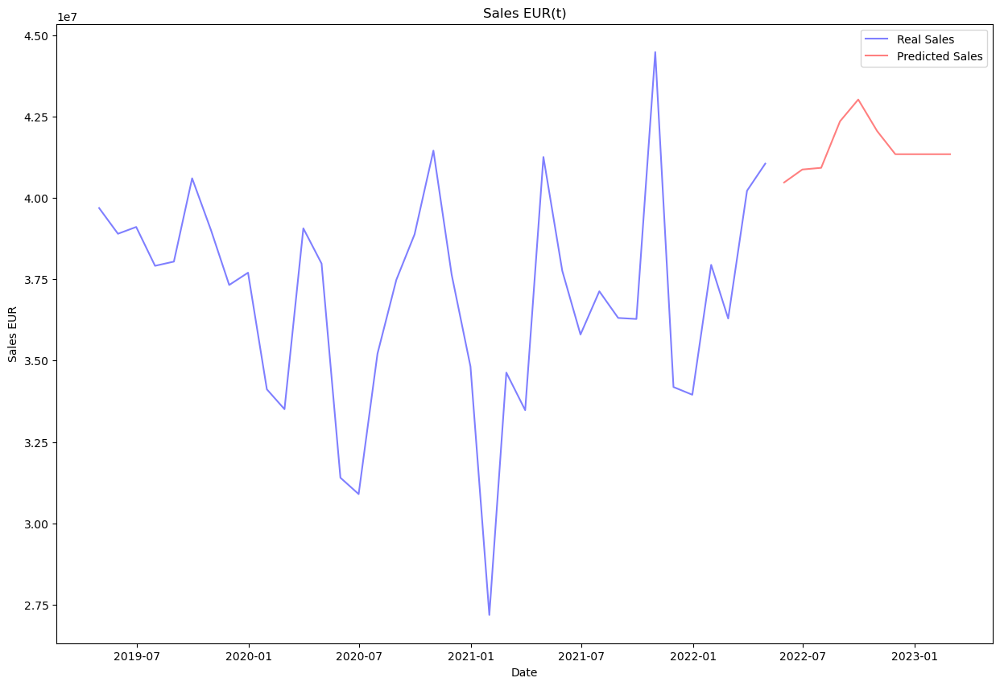

In [99]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X1_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X1_and_future['Sales_EUR(t)'].where(X1_and_future.index < '2022-05-31', other=None)
y_pred = X1_and_future['Sales_EUR(t)'].where(X1_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [100]:
# Create pandas dataframe with test set results

y1_test_pred = X1_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y1_test_pred

,Sales_EUR(t)
2022-05-31,40474272.0
2022-06-30,40872920.0
2022-07-31,40925224.0
2022-08-31,42354600.0
2022-09-30,43023672.0
2022-10-31,42056560.0
2022-11-30,41343260.0
2022-12-31,41343260.0
2023-01-31,41343260.0
2023-02-28,41343260.0


## 3.2. GCK #3

In [101]:
# Create a modeling dataset from the original dataset
X3 = pd.DataFrame(index=df_sales_grouped_3.index, data={'Sales_EUR': df_sales_grouped_3['Sales_EUR'].values})
X3 = X3.sort_index(ascending=True)
X3.head()

,Sales_EUR
DATE,
2018-10-31,8089465.96
2018-11-30,11863001.51
2018-12-31,8736859.39
2019-01-31,10705300.63
2019-02-28,10167796.86


### Selecting best market lag features for this GCK

In [102]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_3 = df_market_filtered_lag_trial.join(X3['Sales_EUR'], how='right')

In [103]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_3['Sales_EUR'], df_market_filtered_lag_trial_3[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df3_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df3_correlations.loc[col, lag] = corr

df3_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.218945,0.069991,-0.235764,0.070775,0.203187,-0.072283,-0.147584,0.21158,0.219996,-0.172431,-0.093332,0.012087,0.174596
France SIM&E,-0.137548,-0.028794,0.032588,-0.029553,0.28804,0.011648,-0.124541,0.305545,0.318673,-0.128384,0.000556,0.018285,0.217100
Germany PIM&E,-0.329216,-0.130114,-0.153373,-0.068146,-0.017147,-0.063295,-0.196906,0.121066,0.047976,-0.33923,-0.031339,0.011439,0.216149
Germany SIM&E,-0.235539,0.01216,-0.02591,-0.00922,0.057467,0.011047,-0.148003,0.188807,0.139958,-0.313249,0.059373,0.081068,0.348221
Italy PIM&E,-0.169295,0.156929,-0.293217,0.2717,0.141888,-0.030607,-0.111233,0.092553,0.217525,-0.029635,-0.172184,0.075635,0.244846
Italy SIM&E,-0.183311,0.199953,-0.095391,0.287047,0.123803,0.044913,-0.039919,0.149952,0.448241,-0.123443,0.152406,0.086057,0.259146
Japan PIM&E,-0.190741,0.0344,-0.02559,0.011889,0.07948,0.09421,-0.143331,0.203369,-0.067963,-0.36238,0.004024,0.020371,0.245284
Switzerland PIM&E,-0.142863,-0.138518,-0.175568,-0.150719,-0.133956,-0.06401,-0.007375,-0.074949,-0.056921,-0.134512,-0.176098,-0.303281,-0.076409
UK PIM&E,-0.124762,-0.077592,-0.035728,-0.007623,0.063807,0.112631,-0.108632,0.323845,0.044674,-0.25466,-0.08741,0.056294,0.274333
UK SIM&E,-0.107585,-0.084578,-0.176007,-0.152528,-0.073174,0.000635,-0.224643,0.162193,-0.009767,-0.284228,-0.184539,-0.045902,0.019268


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [104]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_3 = df3_correlations[(df3_correlations >= 0.3) | (df3_correlations <= -0.3)]
filtered_df_correlations_3

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.305545,0.318673,NaN,NaN,NaN,NaN
Germany PIM&E,-0.329216,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.33923,NaN,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.313249,NaN,NaN,0.348221
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.448241,NaN,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.36238,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.303281,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.323845,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [105]:
# let's create a list with those selected features

selected_market_lags_3 = []
for col, lag in filtered_df_correlations_3.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_3.append(feature_name)

selected_market_lags_3

['France SIM&E(t-8)',
 'France SIM&E(t-9)',
 'Germany PIM&E(t-1)',
 'Germany PIM&E(t-10)',
 'Germany SIM&E(t-10)',
 'Germany SIM&E(t)',
 'Italy SIM&E(t-9)',
 'Japan PIM&E(t-10)',
 'Switzerland PIM&E(t-12)',
 'UK PIM&E(t-8)',
 'USA SIM&E(t-3)',
 'USA SIM&E(t-6)',
 'USA SIM&E(t-11)',
 'USA SIM&E(t)',
 'Europe PIM&E(t)',
 'Price Base Metals(t-1)',
 'Price Base Metals(t-2)',
 'Price Base Metals(t-3)',
 'Price Base Metals(t-4)',
 'Price Base Metals(t-5)',
 'Price Base Metals(t-6)',
 'Price Base Metals(t-7)',
 'Price Base Metals(t)',
 'Price Natural Gas Index(t-1)',
 'Price Natural Gas Index(t)',
 'Price Cooper(t-1)',
 'Price Cooper(t-2)',
 'Price Cooper(t-3)',
 'Price Cooper(t-4)',
 'Price Cooper(t-5)',
 'Price Cooper(t-6)',
 'Price Cooper(t-7)',
 'Price Cooper(t-8)',
 'Price Cooper(t-9)',
 'Price Cooper(t)',
 'UK PPEE(t-3)',
 'UK PPEE(t-4)',
 'UK PPEE(t-5)',
 'UK PPEE(t-6)',
 'UK PPEE(t-7)',
 'UK PPEE(t-8)',
 'UK PPEE(t-9)',
 'UK PPEE(t-10)',
 'France PPEE(t-1)',
 'France PPEE(t-2)',
 'Fra

In [106]:
# Create features
X3 = create_data(X3, selected_market_lags_3)
X3.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,UK PI EE(t-6),UK PI EE(t-8),UK PI EE(t-12),UK PI EE(t),Germany PI EE(t),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,8089465.96,11863001.51,8736859.39,10705300.63,10167796.86,11040544.57,12317479.75,2,4,2019,...,118.670791,105.737950,99.391278,113.521605,102.518265,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,11863001.51,8736859.39,10705300.63,10167796.86,11040544.57,12317479.75,12798945.18,2,5,2019,...,120.467019,110.288394,102.504740,117.593055,107.468842,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,8736859.39,10705300.63,10167796.86,11040544.57,12317479.75,12798945.18,11546452.19,2,6,2019,...,105.378705,118.670791,105.139208,123.101487,95.814354,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,10705300.63,10167796.86,11040544.57,12317479.75,12798945.18,11546452.19,13421550.83,3,7,2019,...,107.174933,120.467019,103.462728,123.939727,107.675117,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,10167796.86,11040544.57,12317479.75,12798945.18,11546452.19,13421550.83,11359418.30,3,8,2019,...,110.647640,105.378705,105.737950,115.198084,98.702187,1.000000,0.0,12803.0,872.30,5.1


In [107]:
X3_original = X3.copy()

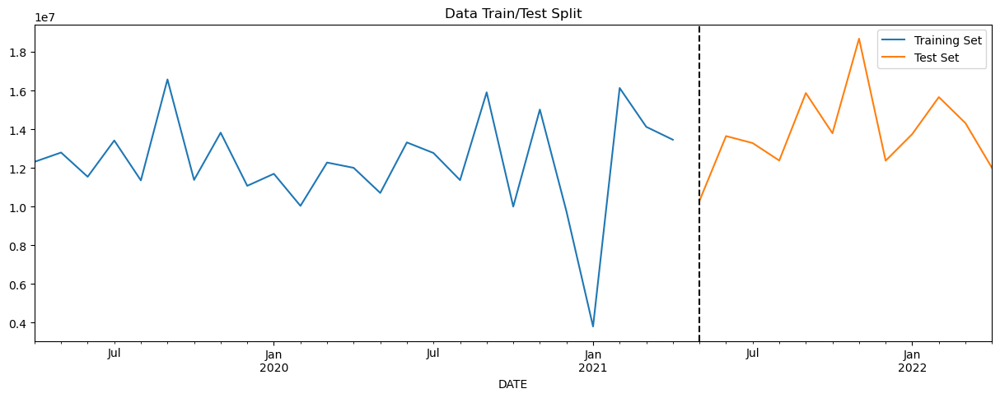

In [108]:
# DATA PARTITION

# Create the Target
y3 = X3['Sales_EUR(t)']

# Split into train and test

y3_train, y3_test, X3_train, X3_test = data_partition(y3, X3)

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [109]:
# Scaling the train and test data

X3_train_scaled, X3_test_scaled = scale(X3_train, X3_test)

### Model

In [110]:
reg3 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [111]:
reg3.fit(X3_train_scaled, y3_train,
        eval_set=[(X3_train_scaled, y3_train), (X3_test_scaled, y3_test)],
        verbose=100)

[23:04:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:12410280.08710	validation_1-rmse:13876426.50382
[100]	validation_0-rmse:5016231.33451	validation_1-rmse:6627191.14156
[200]	validation_0-rmse:2179139.30061	validation_1-rmse:3601266.29778
[300]	validation_0-rmse:988148.95811	validation_1-rmse:2745386.25679
[400]	validation_0-rmse:475902.27856	validation_1-rmse:2363764.60162
[500]	validation_0-rmse:245365.73088	validation_1-rmse:2193562.18039
[600]	validation_0-rmse:133402.34827	validation_1-rmse:2112976.57810
[700]	validation_0-rmse:74608.76654	validation_1-rmse:2075811.79135
[800]	validation_0-rmse:44130.82471	validation_1-rmse:2063924.30985
[900]	validation_0-rmse:27671.48522	validation_1-rmse:2060703.58702
[999]	validation_0-rmse:17597.93153	validation_1-rmse:2057853.19985


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

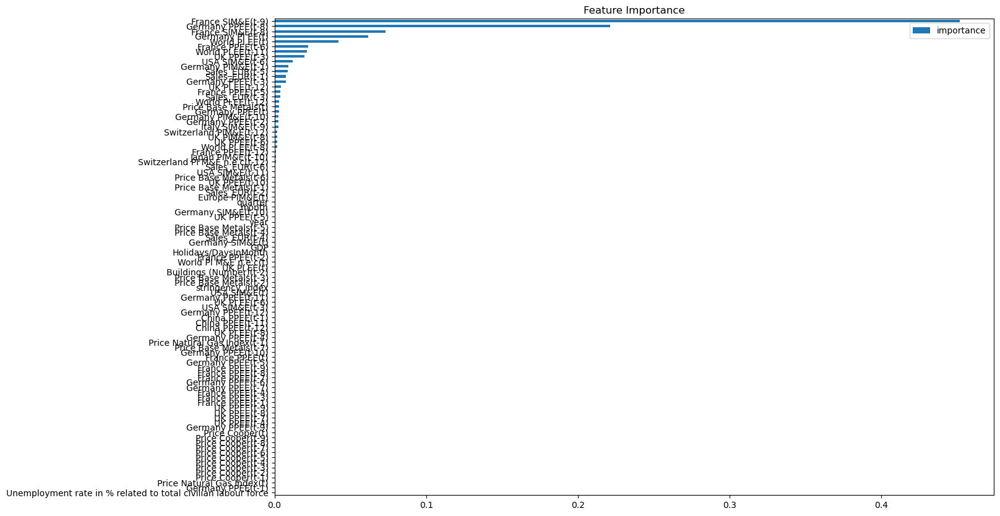

In [112]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg3.feature_importances_,
             index=reg3.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

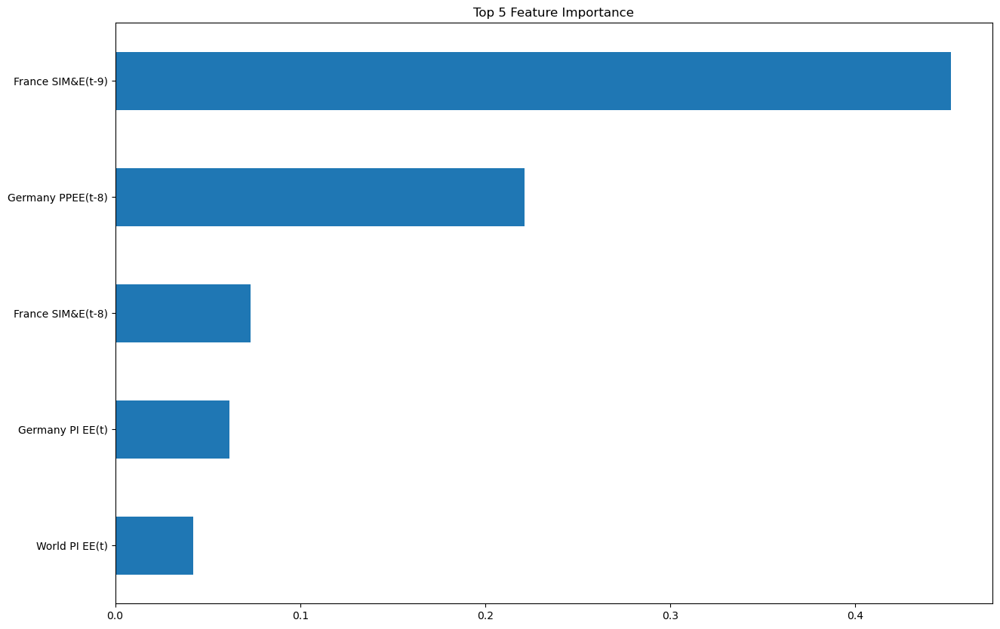

In [113]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg3.feature_importances_,
             index=reg3.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

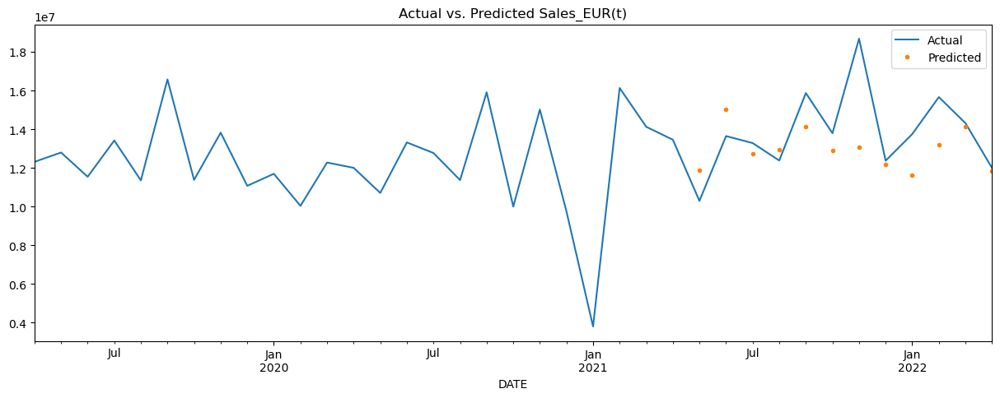

In [114]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results3 = pd.DataFrame({'actual': y3_test.values, 'predicted': y3_pred}, index=y3_test.index)

# Merge the new dataframe with the original dataframe X1:
X3_pred = X3.merge(results3, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X3_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X3_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [115]:
# SCORE (RMSE)
score3 = np.sqrt(mean_squared_error(y3_test, y3_pred))
print(f'RMSE Score on Test set: {score3:0.2f}')

RMSE Score on Test set: 2057853.03


In [116]:
# Visualize predictions vs close values 
temp3 = y3_test.to_frame()
temp3['Prediction'] = y3_pred
temp3['Residual'] = y3_test - temp3.Prediction
temp3

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,10298079.41,11876918.0,-1578838.59
2021-06-30,13650393.45,15022569.0,-1372175.55
2021-07-31,13288195.24,12744707.0,543488.24
2021-08-31,12385755.66,12931107.0,-545351.34
2021-09-30,15874712.26,14152147.0,1722565.26
2021-10-31,13797043.98,12890940.0,906103.98
2021-11-30,18686819.85,13087101.0,5599718.85
2021-12-31,12376414.58,12183220.0,193194.58
2022-01-31,13754291.32,11618795.0,2135496.32


### Predicting the future

In [117]:
### Predicting the future

# Retrain on all data

# Remove the Target from X
X3 = X3.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X3)
X3_scaled = scaler.transform(X3) 
X3_scaled = pd.DataFrame(X3_scaled, columns = X3.columns).set_index(X3.index)

reg3.fit(X3_scaled, y3,
        eval_set=[(X3_scaled, y3)],
        verbose=100)

[23:04:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:12898610.83469
[100]	validation_0-rmse:5147585.10104
[200]	validation_0-rmse:2202454.85453
[300]	validation_0-rmse:1029359.41327
[400]	validation_0-rmse:541893.53565
[500]	validation_0-rmse:323176.82434
[600]	validation_0-rmse:209739.38406
[700]	validation_0-rmse:140340.11304
[800]	validation_0-rmse:89109.38167
[900]	validation_0-rmse:58213.14201
[999]	validation_0-rmse:35471.42169


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [118]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X3_and_future = pd.concat([X3_original, future_df])
X3_and_future = create_features(X3_and_future)

In [119]:
# Lagged Sales: let's assign the values we already know

X3_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X3_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X3_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X3_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X3_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X3_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X3_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X3_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X3_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X3_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X3_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X3_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X3_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X3_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X3_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X3_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [120]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X3_and_future.update(forecast)

In [121]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_3], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X3_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet wit

INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to 

In [122]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '05-31-2022']
y3_test = y3.loc[y3.index == '05-31-2022']

X3_train = X3_and_future.loc[X3_and_future.index < '05-31-2022']
X3_test = X3_and_future.loc[X3_and_future.index == '05-31-2022']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y3_pred

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '06-30-2022']
y3_test = y3.loc[y3.index == '06-30-2022']

X3_train = X3_and_future.loc[X3_and_future.index < '06-30-2022']
X3_test = X3_and_future.loc[X3_and_future.index == '06-30-2022']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '07-31-2022']
y3_test = y3.loc[y3.index == '07-31-2022']

X3_train = X3_and_future.loc[X3_and_future.index < '07-31-2022']
X3_test = X3_and_future.loc[X3_and_future.index == '07-31-2022']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '08-31-2022']
y3_test = y3.loc[y3.index == '08-31-2022']

X3_train = X3_and_future.loc[X3_and_future.index < '08-31-2022']
X3_test = X3_and_future.loc[X3_and_future.index == '08-31-2022']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '09-30-2022']
y3_test = y3.loc[y3.index == '09-30-2022']

X3_train = X3_and_future.loc[X3_and_future.index < '09-30-2022']
X3_test = X3_and_future.loc[X3_and_future.index == '09-30-2022']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '10-31-2022']
y3_test = y3.loc[y3.index == '10-31-2022']

X3_train = X3_and_future.loc[X3_and_future.index < '10-31-2022']
X3_test = X3_and_future.loc[X3_and_future.index == '10-31-2022']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '11-30-2022']
y3_test = y3.loc[y3.index == '11-30-2022']

X3_train = X3_and_future.loc[X3_and_future.index < '11-30-2022']
X3_test = X3_and_future.loc[X3_and_future.index == '11-30-2022']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X3_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '12-31-2022']
y3_test = y3.loc[y3.index == '12-31-2022']

X3_train = X3_and_future.loc[X3_and_future.index < '12-31-2022']
X3_test = X3_and_future.loc[X3_and_future.index == '12-31-2022']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X3_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X3_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X3_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '01-31-2023']
y3_test = y3.loc[y3.index == '01-31-2023']

X3_train = X3_and_future.loc[X3_and_future.index < '01-31-2023']
X3_test = X3_and_future.loc[X3_and_future.index == '01-31-2023']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X3_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X3_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X3_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X3_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X3_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X3_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X3_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y3 = X3_and_future['Sales_EUR(t)']

# Split into train and test
y3_train = y3.loc[y3.index < '02-28-2023']
y3_test = y3.loc[y3.index == '02-28-2023']

X3_train = X3_and_future.loc[X3_and_future.index < '02-28-2023']
X3_test = X3_and_future.loc[X3_and_future.index == '02-28-2023']

# Remove the Target from X
X3_train = X3_train.drop(labels=['Sales_EUR(t)'],axis=1)
X3_test = X3_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y3_pred = reg3.predict(X3_test)

X3_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y3_pred
X3_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X3_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X3_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X3_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X3_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X3_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X3_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X3_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X3_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X3_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X3_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X3_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [123]:
X3_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,UK PI EE(t-6),UK PI EE(t-8),UK PI EE(t-12),UK PI EE(t),Germany PI EE(t),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,8089465.96,11863001.51,8736859.39,10705300.63,10167796.86,11040544.57,12317479.75,2,4,2019,...,118.670791,105.737950,99.391278,113.521605,102.518265,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,11863001.51,8736859.39,10705300.63,10167796.86,11040544.57,12317479.75,12798945.18,2,5,2019,...,120.467019,110.288394,102.504740,117.593055,107.468842,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,8736859.39,10705300.63,10167796.86,11040544.57,12317479.75,12798945.18,11546452.19,2,6,2019,...,105.378705,118.670791,105.139208,123.101487,95.814354,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,10705300.63,10167796.86,11040544.57,12317479.75,12798945.18,11546452.19,13421550.83,3,7,2019,...,107.174933,120.467019,103.462728,123.939727,107.675117,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,10167796.86,11040544.57,12317479.75,12798945.18,11546452.19,13421550.83,11359418.30,3,8,2019,...,110.647640,105.378705,105.737950,115.198084,98.702187,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,11040544.57,12317479.75,12798945.18,11546452.19,13421550.83,11359418.30,16579668.11,3,9,2019,...,126.214949,107.174933,110.288394,128.490171,107.571976,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,12317479.75,12798945.18,11546452.19,13421550.83,11359418.30,16579668.11,11382774.45,4,10,2019,...,113.521605,110.647640,118.670791,128.250674,109.119034,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,12798945.18,11546452.19,13421550.83,11359418.30,16579668.11,11382774.45,13826060.48,4,11,2019,...,117.593055,126.214949,120.467019,125.616206,106.334335,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,11546452.19,13421550.83,11359418.30,16579668.11,11382774.45,13826060.48,11077603.56,4,12,2019,...,123.101487,113.521605,105.378705,117.233809,82.819084,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,13421550.83,11359418.30,16579668.11,11382774.45,13826060.48,11077603.56,11699896.34,1,1,2020,...,123.939727,117.593055,107.174933,116.395569,99.836700,0.129032,1.533793,12410.000000,874.050000,5.300000


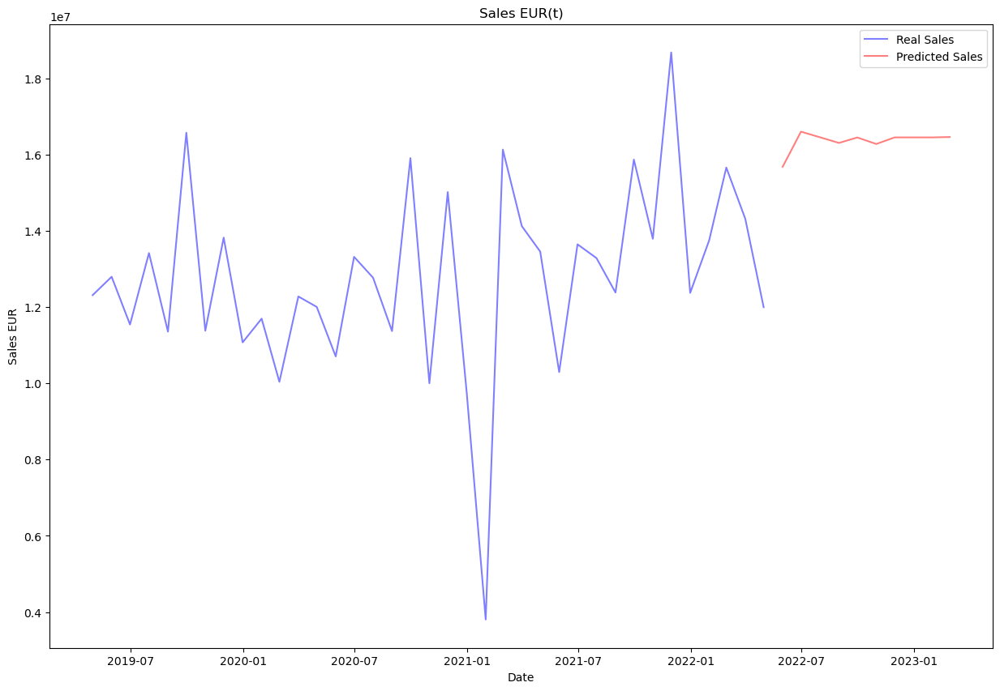

In [124]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X3_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X3_and_future['Sales_EUR(t)'].where(X3_and_future.index < '2022-05-31', other=None)
y_pred = X3_and_future['Sales_EUR(t)'].where(X3_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [125]:
# Create pandas dataframe with test set results

y3_test_pred = X3_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y3_test_pred

,Sales_EUR(t)
2022-05-31,15683789.0
2022-06-30,16607320.0
2022-07-31,16460336.0
2022-08-31,16311491.0
2022-09-30,16454536.0
2022-10-31,16283673.0
2022-11-30,16456861.0
2022-12-31,16456861.0
2023-01-31,16456861.0
2023-02-28,16466272.0


## 3.3. GCK #4

In [126]:
# Create a modeling dataset from the original dataset
X4 = pd.DataFrame(index=df_sales_grouped_4.index, data={'Sales_EUR': df_sales_grouped_4['Sales_EUR'].values})
X4 = X4.sort_index(ascending=True)
X4.head()

,Sales_EUR
DATE,
2018-10-31,397760.69
2018-11-30,371322.42
2018-12-31,430100.96
2019-01-31,484173.88
2019-02-28,620031.80


### Selecting best market lag features for this GCK

In [127]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_4 = df_market_filtered_lag_trial.join(X4['Sales_EUR'], how='right')

In [128]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_4['Sales_EUR'], df_market_filtered_lag_trial_4[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df4_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df4_correlations.loc[col, lag] = corr

df4_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.202551,0.124265,0.1596,0.099809,-0.047629,-0.213762,-0.048965,0.06878,-0.114207,-0.388566,-0.111889,0.034663,0.260695
France SIM&E,-0.178521,0.05184,0.256039,0.01813,-0.093896,-0.133864,-0.128278,0.032974,-0.116315,-0.4671,-0.132724,-0.045102,0.192285
Germany PIM&E,-0.244747,0.110995,0.202608,0.00717,-0.157577,-0.015284,-0.040287,-0.01683,-0.12628,-0.371209,-0.051414,-0.080504,0.205931
Germany SIM&E,-0.29769,0.081199,0.168197,-0.061869,-0.183725,-0.018926,-0.06982,-0.031654,-0.11246,-0.378335,-0.060976,-0.08171,0.163432
Italy PIM&E,-0.134689,0.139829,0.069318,0.163397,-0.100097,-0.291348,-0.028311,0.033304,-0.092801,-0.281389,-0.119042,0.089549,0.301080
Italy SIM&E,-0.244706,0.157546,0.072951,0.067345,-0.107841,-0.169734,-0.017923,-0.074084,0.005619,-0.331139,-0.086899,-0.029776,0.169676
Japan PIM&E,-0.186039,0.163957,0.198587,-0.010801,-0.09194,-0.001183,-0.116328,-0.081845,-0.175668,-0.350079,0.01283,-0.022693,0.222069
Switzerland PIM&E,-0.064735,-0.018742,-0.049713,-0.032799,-0.019927,-0.045639,-0.084577,-0.180433,-0.181988,-0.239273,-0.278786,-0.26136,-0.085293
UK PIM&E,-0.112171,0.054826,0.159013,-0.0681,-0.304758,-0.091638,-0.141588,-0.04582,-0.229961,-0.424912,-0.083533,-0.116708,0.221172
UK SIM&E,-0.014222,0.048597,0.02165,-0.024895,-0.127707,-0.051447,-0.150599,0.006168,-0.192012,-0.395819,-0.066349,-0.131604,0.076867


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [129]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_4 = df4_correlations[(df4_correlations >= 0.3) | (df4_correlations <= -0.3)]
filtered_df_correlations_4

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.388566,NaN,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.4671,NaN,NaN,NaN
Germany PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.371209,NaN,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.378335,NaN,NaN,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.301080
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.331139,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.350079,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK PIM&E,NaN,NaN,NaN,NaN,-0.304758,NaN,NaN,NaN,NaN,-0.424912,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.395819,NaN,NaN,NaN


In [130]:
# let's create a list with those selected features

selected_market_lags_4 = []
for col, lag in filtered_df_correlations_4.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_4.append(feature_name)

selected_market_lags_4

['France PIM&E(t-10)',
 'France SIM&E(t-10)',
 'Germany PIM&E(t-10)',
 'Germany SIM&E(t-10)',
 'Italy PIM&E(t)',
 'Italy SIM&E(t-10)',
 'Japan PIM&E(t-10)',
 'UK PIM&E(t-5)',
 'UK PIM&E(t-10)',
 'UK SIM&E(t-10)',
 'USA PIM&E(t-10)',
 'USA SIM&E(t-10)',
 'Europe PIM&E(t-10)',
 'Price Natural Gas Index(t-11)',
 'Price Natural Gas Index(t-12)',
 'USA: EUR in LCU(t-1)',
 'USA: EUR in LCU(t-2)',
 'USA: EUR in LCU(t-3)',
 'USA: EUR in LCU(t)',
 'World PI M&E n.e.c(t-10)',
 'USA PI EE(t-9)',
 'USA PI EE(t-10)',
 'USA PI EE(t-11)',
 'USA PI EE(t-12)',
 'UK PI EE(t-5)',
 'UK PI EE(t-10)',
 'Italy PI EE(t-10)',
 'Italy PI EE(t)']

In [131]:
# Create features
X4 = create_data(X4, selected_market_lags_4)
X4.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,USA PI EE(t-12),UK PI EE(t-5),UK PI EE(t-10),Italy PI EE(t-10),Italy PI EE(t),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,397760.69,371322.42,430100.96,484173.88,620031.80,491643.59,426221.34,2,4,2019,...,108.830795,120.467019,105.139208,89.439110,75.947449,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,371322.42,430100.96,484173.88,620031.80,491643.59,426221.34,375671.57,2,5,2019,...,108.479271,105.378705,103.462728,90.803436,91.637192,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,430100.96,484173.88,620031.80,491643.59,426221.34,375671.57,190721.15,2,6,2019,...,109.744804,107.174933,105.737950,46.917637,83.527031,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,484173.88,620031.80,491643.59,426221.34,375671.57,190721.15,381274.96,3,7,2019,...,107.886337,110.647640,110.288394,85.194542,92.925720,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,620031.80,491643.59,426221.34,375671.57,190721.15,381274.96,301973.43,3,8,2019,...,110.300163,126.214949,118.670791,93.001511,43.961597,1.000000,0.0,12803.0,872.30,5.1


In [132]:
X4_original = X4.copy()

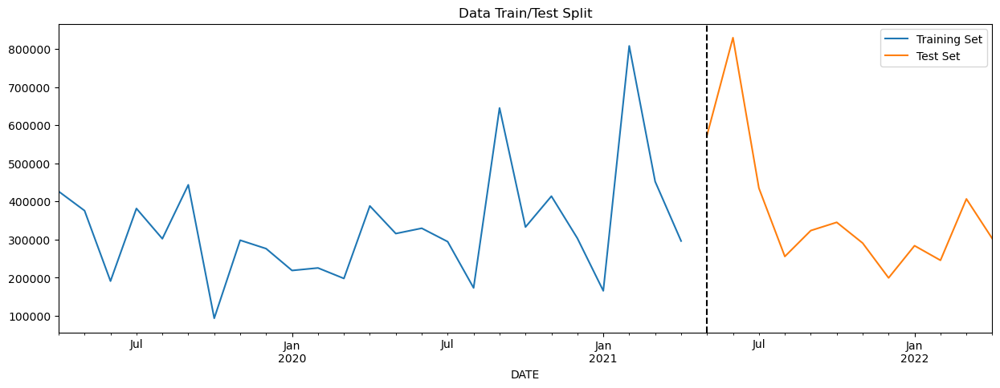

In [133]:
# DATA PARTITION

# Create the Target
y4 = X4['Sales_EUR(t)']

# Split into train and test

y4_train, y4_test, X4_train, X4_test = data_partition(y4, X4)

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [134]:
# Scaling the train and test data

X4_train_scaled, X4_test_scaled = scale(X4_train, X4_test)

### Model

In [135]:
reg4 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [136]:
reg4.fit(X4_train_scaled, y4_train,
        eval_set=[(X4_train_scaled, y4_train), (X4_test_scaled, y4_test)],
        verbose=100)

[23:12:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:362475.38489	validation_1-rmse:406547.71279
[100]	validation_0-rmse:167371.53003	validation_1-rmse:261470.04523
[200]	validation_0-rmse:84919.76153	validation_1-rmse:220875.86405
[300]	validation_0-rmse:47322.62057	validation_1-rmse:207162.24485
[400]	validation_0-rmse:28160.51968	validation_1-rmse:202434.51767
[497]	validation_0-rmse:17443.25722	validation_1-rmse:201992.18484


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

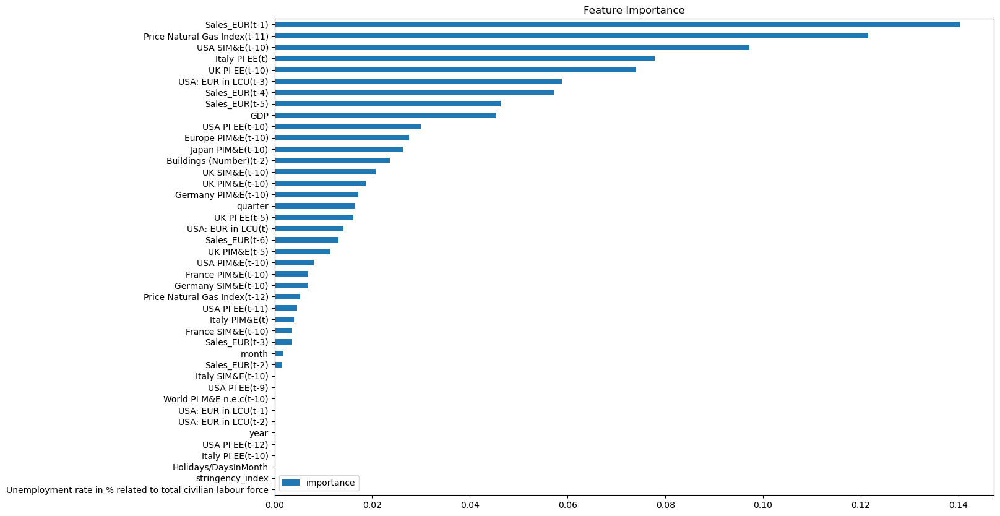

In [137]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg4.feature_importances_,
             index=reg4.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

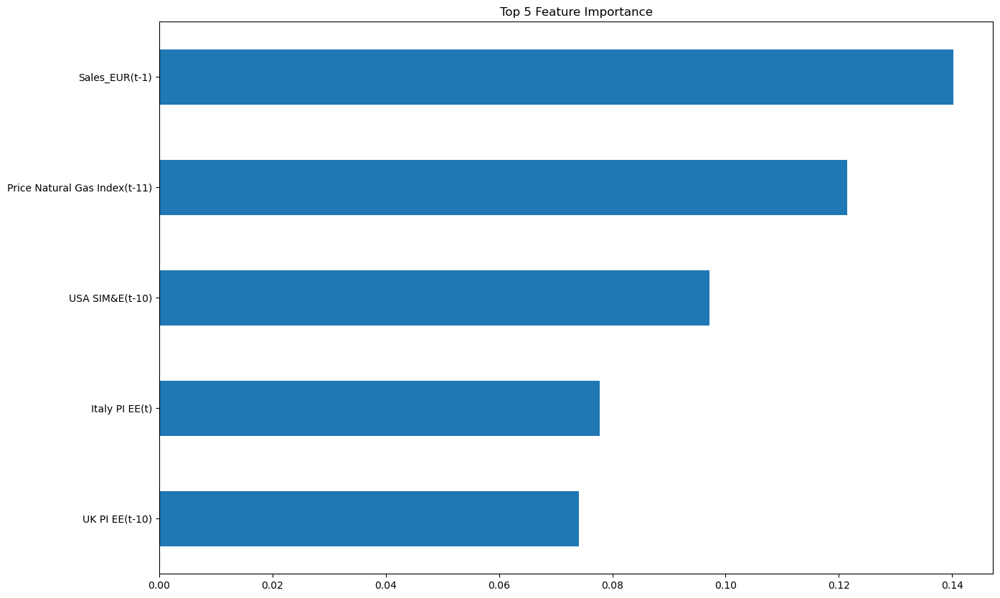

In [138]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg4.feature_importances_,
             index=reg4.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

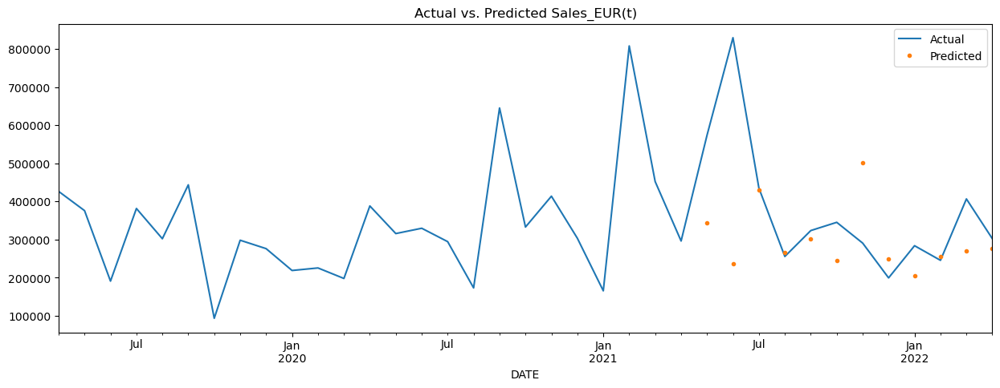

In [139]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results4 = pd.DataFrame({'actual': y4_test.values, 'predicted': y4_pred}, index=y4_test.index)

# Merge the new dataframe with the original dataframe X1:
X4_pred = X4.merge(results4, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X4_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X4_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [140]:
# SCORE (RMSE)
score4 = np.sqrt(mean_squared_error(y4_test, y4_pred))
print(f'RMSE Score on Test set: {score4:0.2f}')

RMSE Score on Test set: 201651.25


In [141]:
# Visualize predictions vs close values 
temp4 = y4_test.to_frame()
temp4['Prediction'] = y4_pred
temp4['Residual'] = y4_test - temp4.Prediction
temp4

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,573707.27,343163.093750,230544.176250
2021-06-30,829442.33,236730.812500,592711.517500
2021-07-31,434669.61,429215.156250,5454.453750
2021-08-31,255407.75,265433.437500,-10025.687500
2021-09-30,323380.87,302324.531250,21056.338750
2021-10-31,344985.73,244361.437500,100624.292500
2021-11-30,290506.87,501233.593750,-210726.723750
2021-12-31,199188.75,249857.609375,-50668.859375
2022-01-31,283630.81,204703.843750,78926.966250


### Predicting the future

In [142]:
# Retrain on all data

# Remove the Target from X
X4 = X4.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X4)
X4_scaled = scaler.transform(X4) 
X4_scaled = pd.DataFrame(X4_scaled, columns = X4.columns).set_index(X4.index)

reg4.fit(X4_scaled, y4,
        eval_set=[(X4_scaled, y4)],
        verbose=100)

[23:12:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:377249.01445
[100]	validation_0-rmse:168134.90177
[200]	validation_0-rmse:81742.35656
[300]	validation_0-rmse:42610.37948
[400]	validation_0-rmse:23941.00777
[500]	validation_0-rmse:14296.12086
[600]	validation_0-rmse:9003.49657
[700]	validation_0-rmse:5635.25667
[800]	validation_0-rmse:3811.02893
[900]	validation_0-rmse:2756.29804
[999]	validation_0-rmse:1980.30914


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [143]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X4_and_future = pd.concat([X4_original, future_df])
X4_and_future = create_features(X4_and_future)

In [144]:
# Lagged Sales: let's assign the values we already know

X4_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X4_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X4_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X4_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X4_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X4_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X4_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X4_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X4_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X4_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X4_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X4_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X4_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X4_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X4_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X4_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [145]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X4_and_future.update(forecast)

In [146]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_4], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X4_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [147]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '05-31-2022']
y4_test = y4.loc[y4.index == '05-31-2022']

X4_train = X4_and_future.loc[X4_and_future.index < '05-31-2022']
X4_test = X4_and_future.loc[X4_and_future.index == '05-31-2022']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y4_pred

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '06-30-2022']
y4_test = y4.loc[y4.index == '06-30-2022']

X4_train = X4_and_future.loc[X4_and_future.index < '06-30-2022']
X4_test = X4_and_future.loc[X4_and_future.index == '06-30-2022']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '07-31-2022']
y4_test = y4.loc[y4.index == '07-31-2022']

X4_train = X4_and_future.loc[X4_and_future.index < '07-31-2022']
X4_test = X4_and_future.loc[X4_and_future.index == '07-31-2022']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '08-31-2022']
y4_test = y4.loc[y4.index == '08-31-2022']

X4_train = X4_and_future.loc[X4_and_future.index < '08-31-2022']
X4_test = X4_and_future.loc[X4_and_future.index == '08-31-2022']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '09-30-2022']
y4_test = y4.loc[y4.index == '09-30-2022']

X4_train = X4_and_future.loc[X4_and_future.index < '09-30-2022']
X4_test = X4_and_future.loc[X4_and_future.index == '09-30-2022']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '10-31-2022']
y4_test = y4.loc[y4.index == '10-31-2022']

X4_train = X4_and_future.loc[X4_and_future.index < '10-31-2022']
X4_test = X4_and_future.loc[X4_and_future.index == '10-31-2022']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '11-30-2022']
y4_test = y4.loc[y4.index == '11-30-2022']

X4_train = X4_and_future.loc[X4_and_future.index < '11-30-2022']
X4_test = X4_and_future.loc[X4_and_future.index == '11-30-2022']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X4_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '12-31-2022']
y4_test = y4.loc[y4.index == '12-31-2022']

X4_train = X4_and_future.loc[X4_and_future.index < '12-31-2022']
X4_test = X4_and_future.loc[X4_and_future.index == '12-31-2022']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X4_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X4_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X4_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '01-31-2023']
y4_test = y4.loc[y4.index == '01-31-2023']

X4_train = X4_and_future.loc[X4_and_future.index < '01-31-2023']
X4_test = X4_and_future.loc[X4_and_future.index == '01-31-2023']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X4_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X4_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X4_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X4_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X4_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X4_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X4_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y4 = X4_and_future['Sales_EUR(t)']

# Split into train and test
y4_train = y4.loc[y4.index < '02-28-2023']
y4_test = y4.loc[y4.index == '02-28-2023']

X4_train = X4_and_future.loc[X4_and_future.index < '02-28-2023']
X4_test = X4_and_future.loc[X4_and_future.index == '02-28-2023']

# Remove the Target from X
X4_train = X4_train.drop(labels=['Sales_EUR(t)'],axis=1)
X4_test = X4_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y4_pred = reg4.predict(X4_test)

X4_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y4_pred
X4_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X4_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X4_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X4_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X4_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X4_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X4_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X4_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X4_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X4_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X4_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X4_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [148]:
X4_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,USA PI EE(t-12),UK PI EE(t-5),UK PI EE(t-10),Italy PI EE(t-10),Italy PI EE(t),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,397760.690000,371322.420000,430100.960000,484173.880000,620031.800000,491643.590000,426221.340000,2,4,2019,...,108.830795,120.467019,105.139208,89.439110,75.947449,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,371322.420000,430100.960000,484173.880000,620031.800000,491643.590000,426221.340000,375671.570000,2,5,2019,...,108.479271,105.378705,103.462728,90.803436,91.637192,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,430100.960000,484173.880000,620031.800000,491643.590000,426221.340000,375671.570000,190721.150000,2,6,2019,...,109.744804,107.174933,105.737950,46.917637,83.527031,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,484173.880000,620031.800000,491643.590000,426221.340000,375671.570000,190721.150000,381274.960000,3,7,2019,...,107.886337,110.647640,110.288394,85.194542,92.925720,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,620031.800000,491643.590000,426221.340000,375671.570000,190721.150000,381274.960000,301973.430000,3,8,2019,...,110.300163,126.214949,118.670791,93.001511,43.961597,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,491643.590000,426221.340000,375671.570000,190721.150000,381274.960000,301973.430000,443349.320000,3,9,2019,...,111.160194,113.521605,120.467019,84.133400,87.695801,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,426221.340000,375671.570000,190721.150000,381274.960000,301973.430000,443349.320000,93226.320000,4,10,2019,...,112.853256,117.593055,105.378705,64.881248,91.637192,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,375671.570000,190721.150000,381274.960000,301973.430000,443349.320000,93226.320000,298011.680000,4,11,2019,...,113.145294,123.101487,107.174933,81.556343,81.480545,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,190721.150000,381274.960000,301973.430000,443349.320000,93226.320000,298011.680000,275968.150000,4,12,2019,...,111.823624,123.939727,110.647640,83.451233,63.971703,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,381274.960000,301973.430000,443349.320000,93226.320000,298011.680000,275968.150000,218623.480000,1,1,2020,...,109.499725,115.198084,126.214949,88.832741,78.524506,0.129032,1.533793,12410.000000,874.050000,5.300000


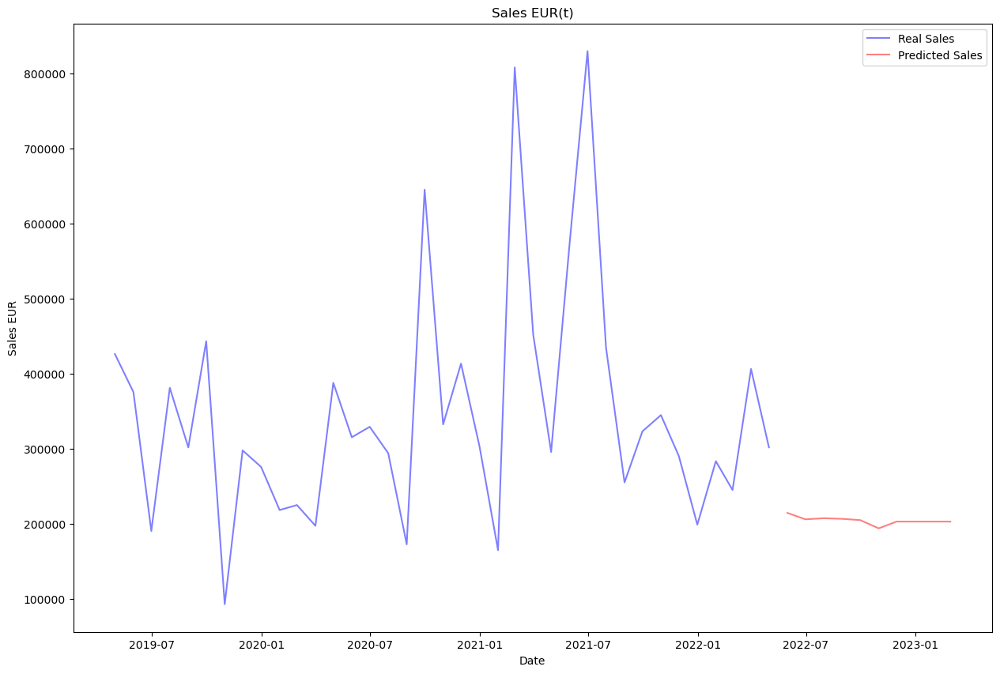

In [149]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X4_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X4_and_future['Sales_EUR(t)'].where(X4_and_future.index < '2022-05-31', other=None)
y_pred = X4_and_future['Sales_EUR(t)'].where(X4_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [150]:
# Create pandas dataframe with test set results

y4_test_pred = X4_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y4_test_pred

,Sales_EUR(t)
2022-05-31,214805.421875
2022-06-30,206270.812500
2022-07-31,207701.343750
2022-08-31,206888.875000
2022-09-30,205218.250000
2022-10-31,194235.390625
2022-11-30,203263.781250
2022-12-31,203263.781250
2023-01-31,203263.781250
2023-02-28,203263.781250


## 3.4. GCK #5

In [151]:
# Create a modeling dataset from the original dataset
X5 = pd.DataFrame(index=df_sales_grouped_5.index, data={'Sales_EUR': df_sales_grouped_5['Sales_EUR'].values})
X5 = X5.sort_index(ascending=True)
X5.head()

,Sales_EUR
DATE,
2018-10-31,2499061.19
2018-11-30,8993944.04
2018-12-31,6947507.31
2019-01-31,8233205.07
2019-02-28,6879250.99


### Selecting best market lag features for this GCK

In [152]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_5 = df_market_filtered_lag_trial.join(X5['Sales_EUR'], how='right')

In [153]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_5['Sales_EUR'], df_market_filtered_lag_trial_5[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df5_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df5_correlations.loc[col, lag] = corr

df5_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.420748,0.110414,0.100952,-0.137001,0.248336,0.038756,-0.187581,0.254028,0.161859,-0.335191,0.13631,-0.004242,0.018619
France SIM&E,-0.478455,0.062559,0.261862,-0.149391,0.230056,0.194902,-0.21503,0.278058,0.317609,-0.338145,0.109084,0.076809,0.145330
Germany PIM&E,-0.440443,-0.085285,0.157315,-0.266128,0.073968,0.096994,-0.211798,0.042481,0.215151,-0.307595,0.058612,0.060925,0.120998
Germany SIM&E,-0.433726,-0.020875,0.252479,-0.30026,0.101553,0.190678,-0.26031,0.070592,0.322747,-0.332381,0.077999,0.158297,0.191135
Italy PIM&E,-0.191502,0.05664,0.036489,0.123312,0.15947,-0.090587,-0.079778,0.12975,0.040656,-0.176926,0.078561,-0.036663,0.009037
Italy SIM&E,-0.329475,0.099709,0.212866,-0.060801,0.104261,0.112944,-0.167257,0.203228,0.330445,-0.236455,0.108593,0.072913,0.096335
Japan PIM&E,-0.418119,0.076988,0.210843,-0.255141,0.213189,0.223847,-0.306898,0.066906,0.086008,-0.448954,0.095246,0.08636,0.164621
Switzerland PIM&E,-0.180527,-0.188338,-0.169774,-0.109062,-0.021136,0.057713,0.099729,0.07464,0.050634,-0.033906,-0.11889,-0.205941,-0.163169
UK PIM&E,-0.287484,-0.023531,0.209033,-0.104571,0.110471,0.192588,-0.133862,0.092358,0.106224,-0.254853,0.094175,0.095539,0.206060
UK SIM&E,-0.243965,-0.034942,0.066804,-0.13342,0.009987,0.060967,-0.073078,0.178507,0.040506,-0.259188,0.092727,-0.033582,0.024792


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [154]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_5 = df5_correlations[(df5_correlations >= 0.3) | (df5_correlations <= -0.3)]
filtered_df_correlations_5

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.420748,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.335191,NaN,NaN,NaN
France SIM&E,-0.478455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.317609,-0.338145,NaN,NaN,NaN
Germany PIM&E,-0.440443,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.307595,NaN,NaN,NaN
Germany SIM&E,-0.433726,NaN,NaN,-0.30026,NaN,NaN,NaN,NaN,0.322747,-0.332381,NaN,NaN,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,-0.329475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.330445,NaN,NaN,NaN,NaN
Japan PIM&E,-0.418119,NaN,NaN,NaN,NaN,NaN,-0.306898,NaN,NaN,-0.448954,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [155]:
# let's create a list with those selected features

selected_market_lags_5 = []
for col, lag in filtered_df_correlations_5.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_5.append(feature_name)

selected_market_lags_5

['France PIM&E(t-1)',
 'France PIM&E(t-10)',
 'France SIM&E(t-1)',
 'France SIM&E(t-9)',
 'France SIM&E(t-10)',
 'Germany PIM&E(t-1)',
 'Germany PIM&E(t-10)',
 'Germany SIM&E(t-1)',
 'Germany SIM&E(t-4)',
 'Germany SIM&E(t-9)',
 'Germany SIM&E(t-10)',
 'Italy SIM&E(t-1)',
 'Italy SIM&E(t-9)',
 'Japan PIM&E(t-1)',
 'Japan PIM&E(t-7)',
 'Japan PIM&E(t-10)',
 'USA SIM&E(t-3)',
 'USA SIM&E(t-12)',
 'USA SIM&E(t)',
 'Europe PIM&E(t-1)',
 'World PI M&E n.e.c(t-1)',
 'World PI EE(t-11)',
 'UK PI EE(t-6)',
 'UK PI EE(t)']

In [156]:
# Create features
X5 = create_data(X5, selected_market_lags_5)
X5.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Europe PIM&E(t-1),World PI M&E n.e.c(t-1),World PI EE(t-11),UK PI EE(t-6),UK PI EE(t),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,2499061.19,8993944.04,6947507.31,8233205.07,6879250.99,11914313.63,5714462.48,2,4,2019,...,123.693913,137.504623,118.990334,118.670791,113.521605,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,8993944.04,6947507.31,8233205.07,6879250.99,11914313.63,5714462.48,11389673.26,2,5,2019,...,111.925595,121.492424,126.296242,120.467019,117.593055,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,6947507.31,8233205.07,6879250.99,11914313.63,5714462.48,11389673.26,13681879.16,2,6,2019,...,117.901031,124.611122,121.935760,105.378705,123.101487,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,8233205.07,6879250.99,11914313.63,5714462.48,11389673.26,13681879.16,11145039.03,3,7,2019,...,114.325319,126.980324,117.507843,107.174933,123.939727,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,6879250.99,11914313.63,5714462.48,11389673.26,13681879.16,11145039.03,7645745.29,3,8,2019,...,116.325818,123.380272,126.344688,110.647640,115.198084,1.000000,0.0,12803.0,872.30,5.1


In [157]:
X5_original = X5.copy()

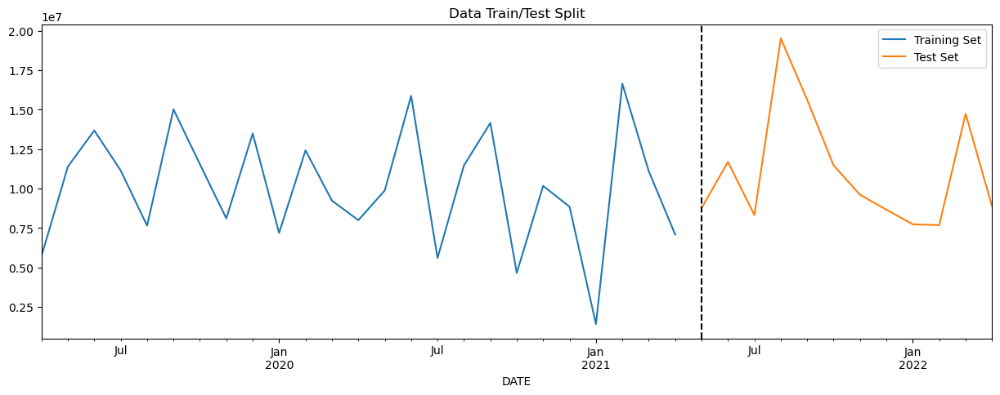

In [158]:
# DATA PARTITION

# Create the Target
y5 = X5['Sales_EUR(t)']

# Split into train and test

y5_train, y5_test, X5_train, X5_test = data_partition(y5, X5)

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [159]:
# Scaling the train and test data

X5_train_scaled, X5_test_scaled = scale(X5_train, X5_test)

### Model

In [160]:
reg5 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [161]:
reg5.fit(X5_train_scaled, y5_train,
        eval_set=[(X5_train_scaled, y5_train), (X5_test_scaled, y5_test)],
        verbose=100)

[23:12:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:10605382.09768	validation_1-rmse:11521658.51789
[100]	validation_0-rmse:4519600.38134	validation_1-rmse:6371680.05542
[200]	validation_0-rmse:2039343.51756	validation_1-rmse:4662453.02936
[300]	validation_0-rmse:968313.24630	validation_1-rmse:4059849.04686
[400]	validation_0-rmse:479345.03380	validation_1-rmse:3861085.35753
[500]	validation_0-rmse:259394.44216	validation_1-rmse:3782469.53167
[600]	validation_0-rmse:149036.55006	validation_1-rmse:3742589.21705
[700]	validation_0-rmse:89413.04733	validation_1-rmse:3729914.19153
[800]	validation_0-rmse:55286.32969	validation_1-rmse:3727564.10064
[845]	validation_0-rmse:44911.55839	validation_1-rmse:3728089.43513


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

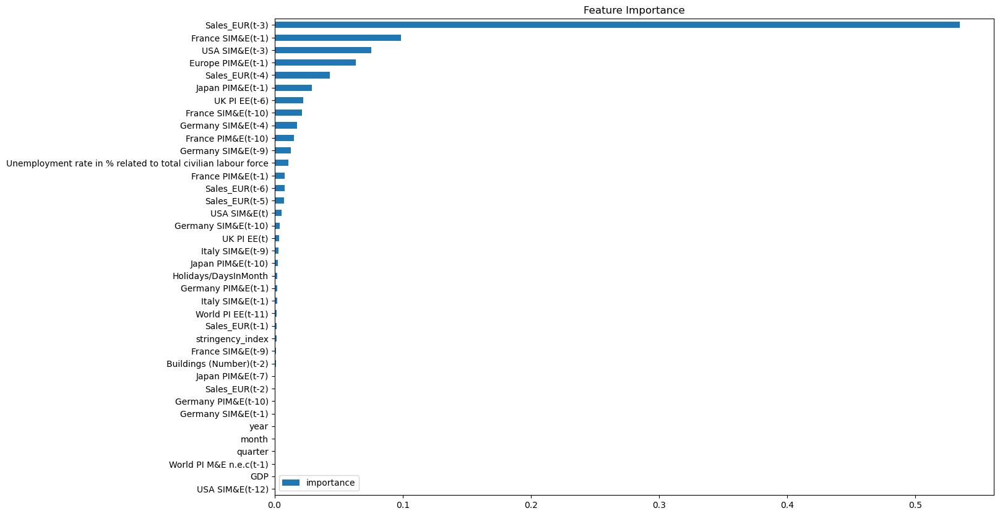

In [162]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg5.feature_importances_,
             index=reg5.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

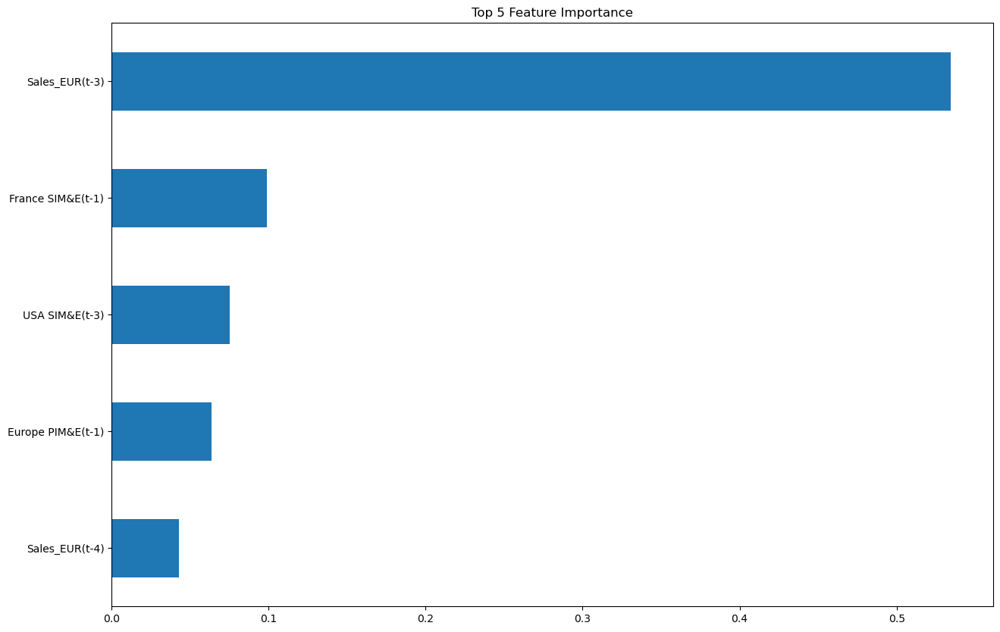

In [163]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg5.feature_importances_,
             index=reg5.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

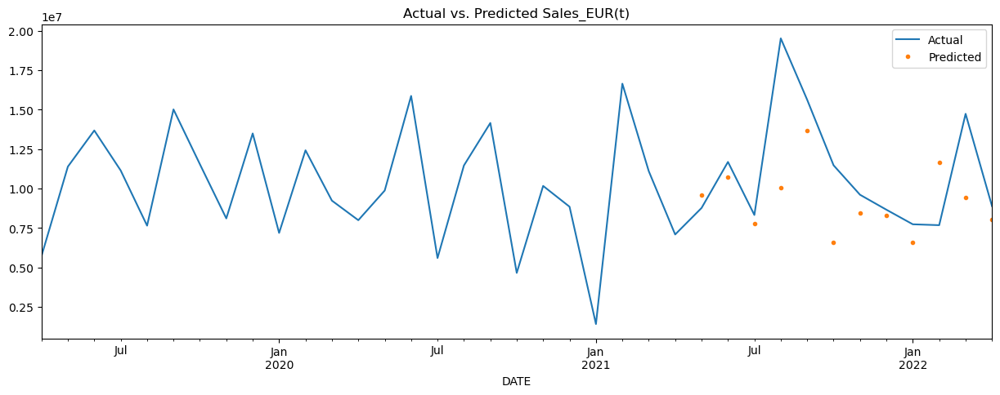

In [164]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results5 = pd.DataFrame({'actual': y5_test.values, 'predicted': y5_pred}, index=y5_test.index)

# Merge the new dataframe with the original dataframe X1:
X5_pred = X5.merge(results5, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X5_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X5_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [165]:
# SCORE (RMSE)
score5 = np.sqrt(mean_squared_error(y5_test, y5_pred))
print(f'RMSE Score on Test set: {score5:0.2f}')

RMSE Score on Test set: 3727481.57


In [166]:
# Visualize predictions vs close values 
temp5 = y5_test.to_frame()
temp5['Prediction'] = y5_pred
temp5['Residual'] = y5_test - temp5.Prediction
temp5

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,8767595.73,9597765.0,-830169.27
2021-06-30,11687229.03,10738695.0,948534.03
2021-07-31,8321886.38,7754381.5,567504.88
2021-08-31,19524640.52,10058701.0,9465939.52
2021-09-30,15629190.80,13701651.0,1927539.80
2021-10-31,11472426.01,6588960.5,4883465.51
2021-11-30,9606371.14,8468944.0,1137427.14
2021-12-31,8656479.64,8297892.5,358587.14
2022-01-31,7731408.33,6561145.0,1170263.33


### Predicting the future

In [167]:
# Retrain on all data

# Remove the Target from X
X5 = X5.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X5)
X5_scaled = scaler.transform(X5) 
X5_scaled = pd.DataFrame(X5_scaled, columns = X5.columns).set_index(X5.index)

reg5.fit(X5_scaled, y5,
        eval_set=[(X5_scaled, y5)],
        verbose=100)

[23:12:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:10910636.82412
[100]	validation_0-rmse:4647337.54968
[200]	validation_0-rmse:2136713.30254
[300]	validation_0-rmse:1066104.84992
[400]	validation_0-rmse:590324.49239
[500]	validation_0-rmse:351129.48871
[600]	validation_0-rmse:214855.89551
[700]	validation_0-rmse:135159.01521
[800]	validation_0-rmse:86670.19192
[900]	validation_0-rmse:58423.87668
[999]	validation_0-rmse:39127.00997


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [168]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X5_and_future = pd.concat([X5_original, future_df])
X5_and_future = create_features(X5_and_future)

In [169]:
# Lagged Sales: let's assign the values we already know

X5_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X5_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X5_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X5_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X5_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X5_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X5_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X5_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X5_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X5_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X5_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X5_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X5_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X5_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X5_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X5_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [170]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X5_and_future.update(forecast)

In [171]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_5], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X5_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [172]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '05-31-2022']
y5_test = y5.loc[y5.index == '05-31-2022']

X5_train = X5_and_future.loc[X5_and_future.index < '05-31-2022']
X5_test = X5_and_future.loc[X5_and_future.index == '05-31-2022']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y5_pred

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '06-30-2022']
y5_test = y5.loc[y5.index == '06-30-2022']

X5_train = X5_and_future.loc[X5_and_future.index < '06-30-2022']
X5_test = X5_and_future.loc[X5_and_future.index == '06-30-2022']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '07-31-2022']
y5_test = y5.loc[y5.index == '07-31-2022']

X5_train = X5_and_future.loc[X5_and_future.index < '07-31-2022']
X5_test = X5_and_future.loc[X5_and_future.index == '07-31-2022']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '08-31-2022']
y5_test = y5.loc[y5.index == '08-31-2022']

X5_train = X5_and_future.loc[X5_and_future.index < '08-31-2022']
X5_test = X5_and_future.loc[X5_and_future.index == '08-31-2022']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '09-30-2022']
y5_test = y5.loc[y5.index == '09-30-2022']

X5_train = X5_and_future.loc[X5_and_future.index < '09-30-2022']
X5_test = X5_and_future.loc[X5_and_future.index == '09-30-2022']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '10-31-2022']
y5_test = y5.loc[y5.index == '10-31-2022']

X5_train = X5_and_future.loc[X5_and_future.index < '10-31-2022']
X5_test = X5_and_future.loc[X5_and_future.index == '10-31-2022']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '11-30-2022']
y5_test = y5.loc[y5.index == '11-30-2022']

X5_train = X5_and_future.loc[X5_and_future.index < '11-30-2022']
X5_test = X5_and_future.loc[X5_and_future.index == '11-30-2022']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X5_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '12-31-2022']
y5_test = y5.loc[y5.index == '12-31-2022']

X5_train = X5_and_future.loc[X5_and_future.index < '12-31-2022']
X5_test = X5_and_future.loc[X5_and_future.index == '12-31-2022']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X5_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X5_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X5_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '01-31-2023']
y5_test = y5.loc[y5.index == '01-31-2023']

X5_train = X5_and_future.loc[X5_and_future.index < '01-31-2023']
X5_test = X5_and_future.loc[X5_and_future.index == '01-31-2023']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X5_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X5_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X5_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X5_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X5_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X5_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X5_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y5 = X5_and_future['Sales_EUR(t)']

# Split into train and test
y5_train = y5.loc[y5.index < '02-28-2023']
y5_test = y5.loc[y5.index == '02-28-2023']

X5_train = X5_and_future.loc[X5_and_future.index < '02-28-2023']
X5_test = X5_and_future.loc[X5_and_future.index == '02-28-2023']

# Remove the Target from X
X5_train = X5_train.drop(labels=['Sales_EUR(t)'],axis=1)
X5_test = X5_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y5_pred = reg5.predict(X5_test)

X5_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y5_pred
X5_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X5_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X5_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X5_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X5_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X5_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X5_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X5_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X5_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X5_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X5_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X5_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [173]:
X5_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Europe PIM&E(t-1),World PI M&E n.e.c(t-1),World PI EE(t-11),UK PI EE(t-6),UK PI EE(t),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,2499061.19,8993944.04,6947507.31,8233205.07,6879250.99,11914313.63,5714462.48,2,4,2019,...,123.693913,137.504623,118.990334,118.670791,113.521605,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,8993944.04,6947507.31,8233205.07,6879250.99,11914313.63,5714462.48,11389673.26,2,5,2019,...,111.925595,121.492424,126.296242,120.467019,117.593055,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,6947507.31,8233205.07,6879250.99,11914313.63,5714462.48,11389673.26,13681879.16,2,6,2019,...,117.901031,124.611122,121.935760,105.378705,123.101487,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,8233205.07,6879250.99,11914313.63,5714462.48,11389673.26,13681879.16,11145039.03,3,7,2019,...,114.325319,126.980324,117.507843,107.174933,123.939727,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,6879250.99,11914313.63,5714462.48,11389673.26,13681879.16,11145039.03,7645745.29,3,8,2019,...,116.325818,123.380272,126.344688,110.647640,115.198084,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,11914313.63,5714462.48,11389673.26,13681879.16,11145039.03,7645745.29,15018604.63,3,9,2019,...,95.829831,112.362175,129.325775,126.214949,128.490171,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,5714462.48,11389673.26,13681879.16,11145039.03,7645745.29,15018604.63,11542647.47,4,10,2019,...,119.866123,128.730377,128.236176,113.521605,128.250674,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,11389673.26,13681879.16,11145039.03,7645745.29,15018604.63,11542647.47,8104241.69,4,11,2019,...,121.847611,125.030998,117.043549,117.593055,125.616206,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,13681879.16,11145039.03,7645745.29,15018604.63,11542647.47,8104241.69,13494692.75,4,12,2019,...,117.895576,122.644653,111.522202,123.101487,117.233809,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,11145039.03,7645745.29,15018604.63,11542647.47,8104241.69,13494692.75,7184359.31,1,1,2020,...,112.252933,123.065697,112.666725,123.939727,116.395569,0.129032,1.533793,12410.000000,874.050000,5.300000


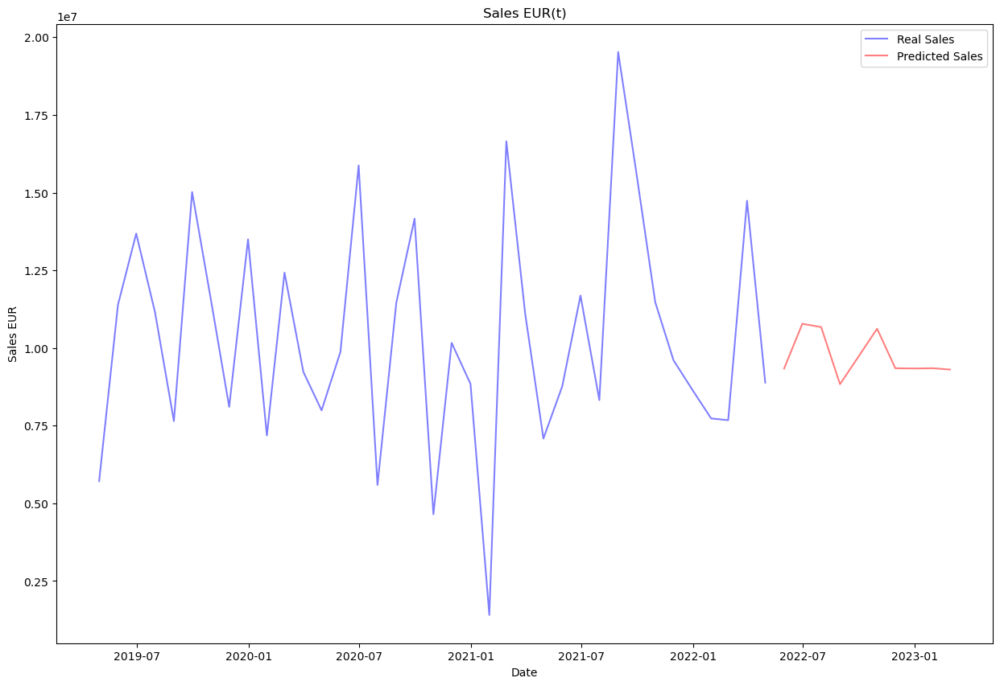

In [174]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X5_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X5_and_future['Sales_EUR(t)'].where(X5_and_future.index < '2022-05-31', other=None)
y_pred = X5_and_future['Sales_EUR(t)'].where(X5_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [175]:
# Create pandas dataframe with test set results

y5_test_pred = X5_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y5_test_pred

,Sales_EUR(t)
2022-05-31,9337484.0
2022-06-30,10779317.0
2022-07-31,10671531.0
2022-08-31,8834947.0
2022-09-30,9710099.0
2022-10-31,10620052.0
2022-11-30,9347889.0
2022-12-31,9339670.0
2023-01-31,9347889.0
2023-02-28,9304521.0


## 3.5. GCK #6

In [176]:
# Create a modeling dataset from the original dataset
X6 = pd.DataFrame(index=df_sales_grouped_6.index, data={'Sales_EUR': df_sales_grouped_6['Sales_EUR'].values})
X6 = X6.sort_index(ascending=True)
X6.head()

,Sales_EUR
DATE,
2018-10-31,369231.60
2018-11-30,473046.96
2018-12-31,999472.69
2019-01-31,598874.10
2019-02-28,542037.52


### Selecting best market lag features for this GCK

In [177]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_6 = df_market_filtered_lag_trial.join(X6['Sales_EUR'], how='right')

In [178]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_6['Sales_EUR'], df_market_filtered_lag_trial_6[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df6_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df6_correlations.loc[col, lag] = corr

df6_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.290486,0.018439,-0.053444,-0.287765,0.347085,0.107571,-0.06592,0.116527,0.258157,-0.017737,-0.100185,-0.012117,-0.124572
France SIM&E,-0.360103,-0.064289,-0.075684,-0.230588,0.224628,0.193699,-0.115642,0.099725,0.262231,-0.093273,-0.111038,-0.086698,-0.192478
Germany PIM&E,-0.185807,-0.008614,-0.02271,-0.071046,0.324849,0.106806,0.052269,0.072087,0.309464,-0.101315,-0.039871,0.129374,0.013982
Germany SIM&E,-0.293,-0.101532,-0.051021,-0.15235,0.235808,0.092993,-0.010967,0.053254,0.295472,-0.167592,-0.069775,0.139665,-0.025181
Italy PIM&E,-0.198469,0.05468,-0.072879,-0.279337,0.303418,-0.010844,0.001946,-0.041348,0.193039,0.113985,-0.151372,-0.094451,-0.109490
Italy SIM&E,-0.430657,-0.038525,-0.096532,-0.262872,0.219929,-0.069626,0.013383,0.005626,0.254408,-0.021815,-0.267987,0.040151,-0.035820
Japan PIM&E,-0.183826,0.006488,0.076373,-0.038338,0.297868,0.061807,-0.061729,-0.029573,0.141295,-0.211148,-0.024222,0.096973,0.002259
Switzerland PIM&E,-0.163296,-0.089116,-0.001275,0.055426,0.138339,0.172729,0.249669,0.184343,0.097552,0.05061,-0.001629,0.008385,-0.139354
UK PIM&E,-0.163147,-0.084155,-0.124627,-0.092016,0.223717,0.181638,-0.004679,0.099741,0.263021,-0.096144,0.008123,-0.029304,-0.085532
UK SIM&E,-0.122262,-0.061483,-0.184805,-0.012808,0.241998,0.183829,0.133597,0.217753,0.38177,-0.000741,0.069505,0.017631,-0.253274


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [179]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_6 = df6_correlations[(df6_correlations >= 0.3) | (df6_correlations <= -0.3)]
filtered_df_correlations_6

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,0.347085,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
France SIM&E,-0.360103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany PIM&E,NaN,NaN,NaN,NaN,0.324849,NaN,NaN,NaN,0.309464,NaN,NaN,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,0.303418,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,-0.430657,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.38177,NaN,NaN,NaN,NaN


In [180]:
# let's create a list with those selected features

selected_market_lags_6 = []
for col, lag in filtered_df_correlations_6.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_6.append(feature_name)

selected_market_lags_6

['France PIM&E(t-5)',
 'France SIM&E(t-1)',
 'Germany PIM&E(t-5)',
 'Germany PIM&E(t-9)',
 'Italy PIM&E(t-5)',
 'Italy SIM&E(t-1)',
 'UK SIM&E(t-9)',
 'UK PPEE(t-11)',
 'UK PPEE(t-12)',
 'USA PI EE(t)',
 'Switzerland PI EE(t-7)']

In [181]:
# Create features
X6 = create_data(X6, selected_market_lags_6)
X6.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,UK SIM&E(t-9),UK PPEE(t-11),UK PPEE(t-12),USA PI EE(t),Switzerland PI EE(t-7),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,369231.60,473046.96,999472.69,598874.10,542037.52,735604.23,277575.12,2,4,2019,...,103.079336,112.896622,111.770729,109.490013,111.205674,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,473046.96,999472.69,598874.10,542037.52,735604.23,277575.12,315978.77,2,5,2019,...,99.790584,113.203690,112.896622,111.786377,112.970843,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,999472.69,598874.10,542037.52,735604.23,277575.12,315978.77,282963.19,2,6,2019,...,105.269576,113.613106,113.203690,112.188866,114.736013,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,598874.10,542037.52,735604.23,277575.12,315978.77,282963.19,725411.99,3,7,2019,...,112.318030,114.431938,113.613106,109.553818,116.501182,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,542037.52,735604.23,277575.12,315978.77,282963.19,725411.99,206931.17,3,8,2019,...,112.801011,114.022522,114.431938,111.138275,110.354610,1.000000,0.0,12803.0,872.30,5.1


In [182]:
X6_original = X6.copy()

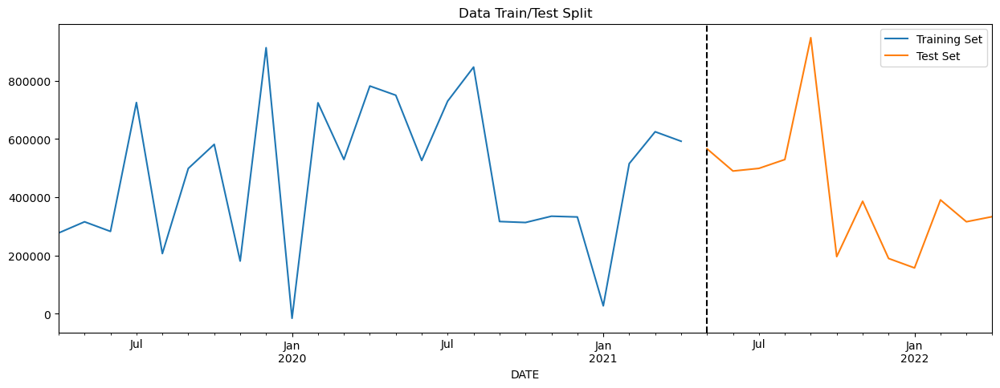

In [183]:
# DATA PARTITION

# Create the Target
y6 = X6['Sales_EUR(t)']

# Split into train and test

y6_train, y6_test, X6_train, X6_test = data_partition(y6, X6)

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [184]:
# Scaling the train and test data

X6_train_scaled, X6_test_scaled = scale(X6_train, X6_test)

### Model

In [185]:
reg6 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [186]:
reg6.fit(X6_train_scaled, y6_train,
        eval_set=[(X6_train_scaled, y6_train), (X6_test_scaled, y6_test)],
        verbose=100)

[23:12:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:532805.65742	validation_1-rmse:462196.71268
[100]	validation_0-rmse:236880.96643	validation_1-rmse:271362.11312
[200]	validation_0-rmse:109070.88217	validation_1-rmse:190988.30063
[300]	validation_0-rmse:53095.06569	validation_1-rmse:173402.71561
[400]	validation_0-rmse:28586.49270	validation_1-rmse:164097.53845
[500]	validation_0-rmse:16920.09675	validation_1-rmse:161666.54926
[600]	validation_0-rmse:10761.86562	validation_1-rmse:159660.37750
[700]	validation_0-rmse:6858.32155	validation_1-rmse:158155.18112
[800]	validation_0-rmse:4323.92251	validation_1-rmse:157487.33667
[900]	validation_0-rmse:2728.61451	validation_1-rmse:156982.10780
[999]	validation_0-rmse:1720.03230	validation_1-rmse:156891.05446


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

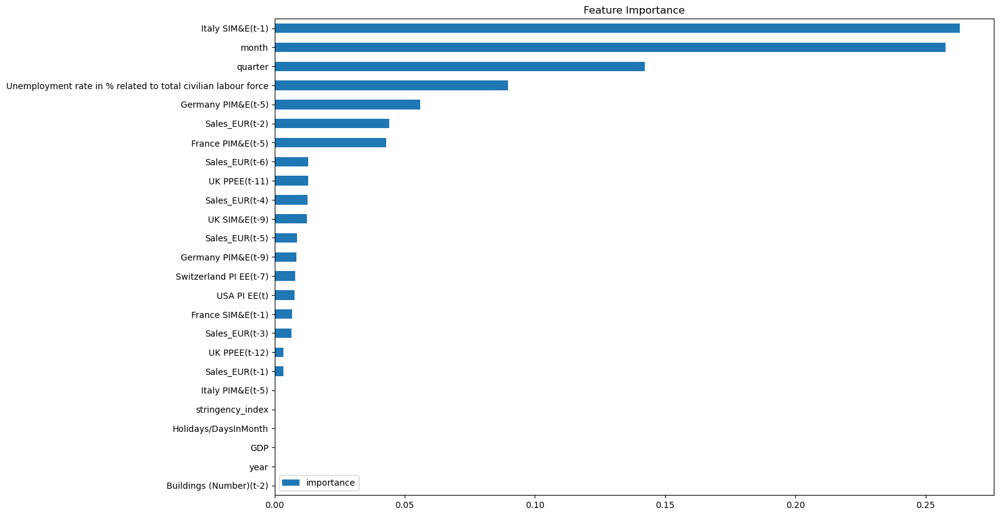

In [187]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg6.feature_importances_,
             index=reg6.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

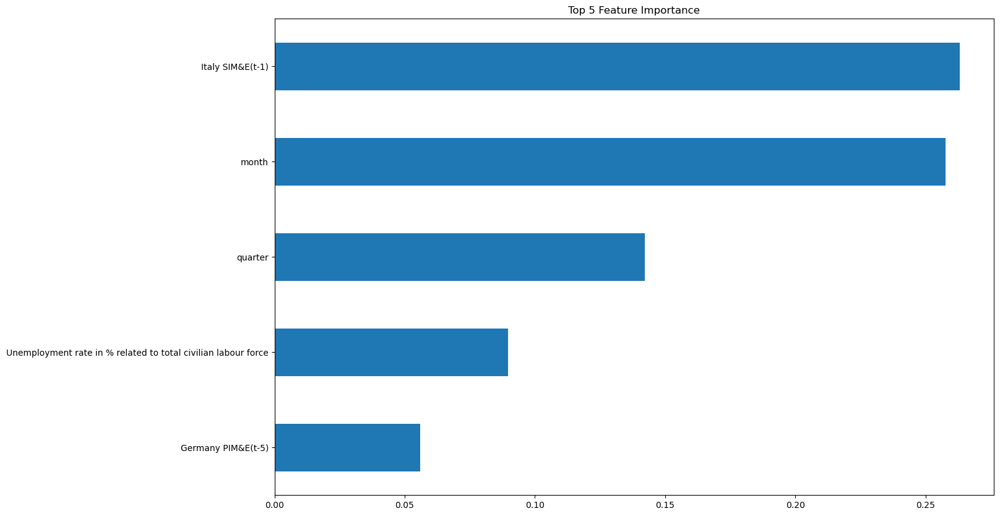

In [188]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg6.feature_importances_,
             index=reg6.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

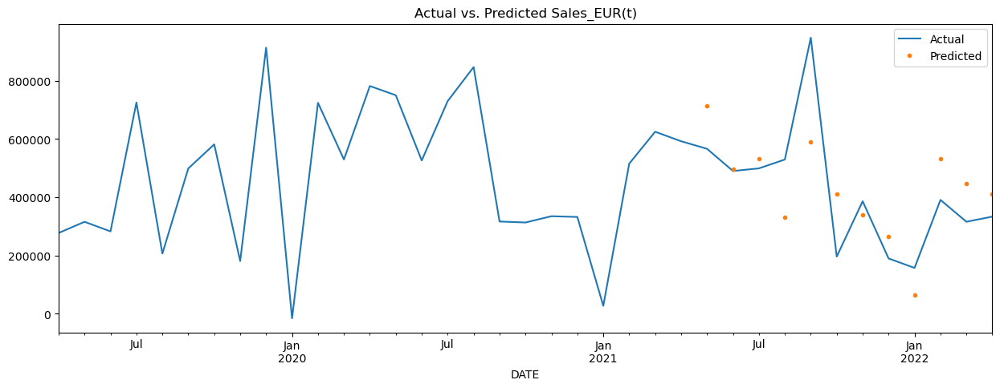

In [189]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results6 = pd.DataFrame({'actual': y6_test.values, 'predicted': y6_pred}, index=y6_test.index)

# Merge the new dataframe with the original dataframe X1:
X6_pred = X6.merge(results6, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X6_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X6_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [190]:
# SCORE (RMSE)
score6 = np.sqrt(mean_squared_error(y6_test, y6_pred))
print(f'RMSE Score on Test set: {score6:0.2f}')

RMSE Score on Test set: 156880.41


In [191]:
# Visualize predictions vs close values 
temp6 = y6_test.to_frame()
temp6['Prediction'] = y6_pred
temp6['Residual'] = y6_test - temp6.Prediction
temp6

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,566508.34,714837.812500,-148329.472500
2021-06-30,490262.94,496301.031250,-6038.091250
2021-07-31,499338.64,533695.250000,-34356.610000
2021-08-31,529725.46,331267.187500,198458.272500
2021-09-30,947905.39,590402.812500,357502.577500
2021-10-31,196463.81,410661.125000,-214197.315000
2021-11-30,386462.96,340501.218750,45961.741250
2021-12-31,190074.96,265555.875000,-75480.915000
2022-01-31,157670.31,64040.351562,93629.958437


### Predicting the future

In [192]:
# Retrain on all data

# Remove the Target from X
X6 = X6.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X6)
X6_scaled = scaler.transform(X6) 
X6_scaled = pd.DataFrame(X6_scaled, columns = X6.columns).set_index(X6.index)

reg6.fit(X6_scaled, y6,
        eval_set=[(X6_scaled, y6)],
        verbose=100)

[23:12:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:510797.78013
[100]	validation_0-rmse:223996.94428
[200]	validation_0-rmse:105893.25026
[300]	validation_0-rmse:53476.18751
[400]	validation_0-rmse:28828.99144
[500]	validation_0-rmse:16237.93853
[600]	validation_0-rmse:9547.54319
[700]	validation_0-rmse:5830.99853
[800]	validation_0-rmse:3673.83482
[900]	validation_0-rmse:2385.38049
[999]	validation_0-rmse:1570.25510


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [193]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X6_and_future = pd.concat([X6_original, future_df])
X6_and_future = create_features(X6_and_future)

In [194]:
# Lagged Sales: let's assign the values we already know

X6_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X6_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X6_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X6_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X6_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X6_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X6_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X6_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X6_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X6_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X6_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X6_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X6_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X6_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X6_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X6_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [195]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X6_and_future.update(forecast)

In [196]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_6], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X6_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [197]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '05-31-2022']
y6_test = y6.loc[y6.index == '05-31-2022']

X6_train = X6_and_future.loc[X6_and_future.index < '05-31-2022']
X6_test = X6_and_future.loc[X6_and_future.index == '05-31-2022']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y6_pred

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '06-30-2022']
y6_test = y6.loc[y6.index == '06-30-2022']

X6_train = X6_and_future.loc[X6_and_future.index < '06-30-2022']
X6_test = X6_and_future.loc[X6_and_future.index == '06-30-2022']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '07-31-2022']
y6_test = y6.loc[y6.index == '07-31-2022']

X6_train = X6_and_future.loc[X6_and_future.index < '07-31-2022']
X6_test = X6_and_future.loc[X6_and_future.index == '07-31-2022']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '08-31-2022']
y6_test = y6.loc[y6.index == '08-31-2022']

X6_train = X6_and_future.loc[X6_and_future.index < '08-31-2022']
X6_test = X6_and_future.loc[X6_and_future.index == '08-31-2022']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '09-30-2022']
y6_test = y6.loc[y6.index == '09-30-2022']

X6_train = X6_and_future.loc[X6_and_future.index < '09-30-2022']
X6_test = X6_and_future.loc[X6_and_future.index == '09-30-2022']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '10-31-2022']
y6_test = y6.loc[y6.index == '10-31-2022']

X6_train = X6_and_future.loc[X6_and_future.index < '10-31-2022']
X6_test = X6_and_future.loc[X6_and_future.index == '10-31-2022']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '11-30-2022']
y6_test = y6.loc[y6.index == '11-30-2022']

X6_train = X6_and_future.loc[X6_and_future.index < '11-30-2022']
X6_test = X6_and_future.loc[X6_and_future.index == '11-30-2022']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X6_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '12-31-2022']
y6_test = y6.loc[y6.index == '12-31-2022']

X6_train = X6_and_future.loc[X6_and_future.index < '12-31-2022']
X6_test = X6_and_future.loc[X6_and_future.index == '12-31-2022']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X6_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X6_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X6_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '01-31-2023']
y6_test = y6.loc[y6.index == '01-31-2023']

X6_train = X6_and_future.loc[X6_and_future.index < '01-31-2023']
X6_test = X6_and_future.loc[X6_and_future.index == '01-31-2023']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X6_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X6_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X6_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X6_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X6_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X6_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X6_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y6 = X6_and_future['Sales_EUR(t)']

# Split into train and test
y6_train = y6.loc[y6.index < '02-28-2023']
y6_test = y6.loc[y6.index == '02-28-2023']

X6_train = X6_and_future.loc[X6_and_future.index < '02-28-2023']
X6_test = X6_and_future.loc[X6_and_future.index == '02-28-2023']

# Remove the Target from X
X6_train = X6_train.drop(labels=['Sales_EUR(t)'],axis=1)
X6_test = X6_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y6_pred = reg6.predict(X6_test)

X6_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y6_pred
X6_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X6_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X6_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X6_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X6_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X6_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X6_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X6_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X6_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X6_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X6_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X6_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [198]:
X6_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,UK SIM&E(t-9),UK PPEE(t-11),UK PPEE(t-12),USA PI EE(t),Switzerland PI EE(t-7),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,369231.60000,473046.96000,999472.69000,598874.10000,542037.52000,735604.23000,277575.12000,2,4,2019,...,103.079336,112.896622,111.770729,109.490013,111.205674,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,473046.96000,999472.69000,598874.10000,542037.52000,735604.23000,277575.12000,315978.77000,2,5,2019,...,99.790584,113.203690,112.896622,111.786377,112.970843,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,999472.69000,598874.10000,542037.52000,735604.23000,277575.12000,315978.77000,282963.19000,2,6,2019,...,105.269576,113.613106,113.203690,112.188866,114.736013,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,598874.10000,542037.52000,735604.23000,277575.12000,315978.77000,282963.19000,725411.99000,3,7,2019,...,112.318030,114.431938,113.613106,109.553818,116.501182,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,542037.52000,735604.23000,277575.12000,315978.77000,282963.19000,725411.99000,206931.17000,3,8,2019,...,112.801011,114.022522,114.431938,111.138275,110.354610,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,735604.23000,277575.12000,315978.77000,282963.19000,725411.99000,206931.17000,499147.73000,3,9,2019,...,94.503733,111.463669,114.022522,109.277214,104.208038,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,277575.12000,315978.77000,282963.19000,725411.99000,206931.17000,499147.73000,581767.85000,4,10,2019,...,99.659210,111.668373,111.463669,108.879707,98.061466,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,315978.77000,282963.19000,725411.99000,206931.17000,499147.73000,581767.85000,181159.20000,4,11,2019,...,100.589459,112.794266,111.668373,110.455956,95.539795,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,282963.19000,725411.99000,206931.17000,499147.73000,581767.85000,181159.20000,913378.80000,4,12,2019,...,118.184131,112.077789,112.794266,107.644180,93.018125,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,725411.99000,206931.17000,499147.73000,581767.85000,181159.20000,913378.80000,-15202.96000,1,1,2020,...,103.934375,111.361313,112.077789,108.092865,90.496454,0.129032,1.533793,12410.000000,874.050000,5.300000


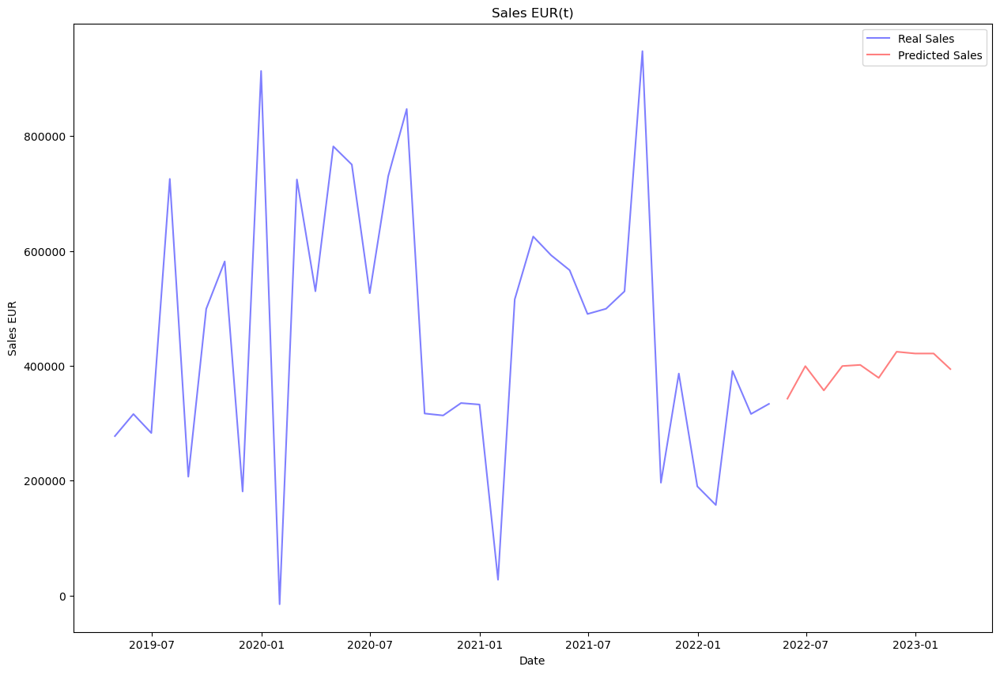

In [199]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X6_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X6_and_future['Sales_EUR(t)'].where(X6_and_future.index < '2022-05-31', other=None)
y_pred = X6_and_future['Sales_EUR(t)'].where(X6_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [200]:
# Create pandas dataframe with test set results

y6_test_pred = X6_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y6_test_pred

,Sales_EUR(t)
2022-05-31,342799.12500
2022-06-30,399400.12500
2022-07-31,357132.21875
2022-08-31,399590.93750
2022-09-30,401551.62500
2022-10-31,379018.25000
2022-11-30,424483.81250
2022-12-31,421404.25000
2023-01-31,421404.25000
2023-02-28,394293.25000


## 3.6. GCK #8

In [201]:
# Create a modeling dataset from the original dataset
X8 = pd.DataFrame(index=df_sales_grouped_8.index, data={'Sales_EUR': df_sales_grouped_8['Sales_EUR'].values})
X8 = X8.sort_index(ascending=True)
X8.head()

,Sales_EUR
DATE,
2018-10-31,586052.74
2018-11-30,526292.77
2018-12-31,271490.71
2019-01-31,381400.15
2019-02-28,368475.57


### Selecting best market lag features for this GCK

In [202]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_8 = df_market_filtered_lag_trial.join(X8['Sales_EUR'], how='right')

In [203]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_8['Sales_EUR'], df_market_filtered_lag_trial_8[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df8_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df8_correlations.loc[col, lag] = corr

df8_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.221969,0.189651,0.072438,-0.269637,0.063754,0.089387,-0.302486,-0.096276,0.094767,-0.204277,-0.175526,-0.120309,0.146401
France SIM&E,-0.060258,0.160433,0.302288,-0.22288,0.063879,0.211651,-0.266565,-0.033321,0.231262,-0.147483,-0.142316,-0.000986,0.323759
Germany PIM&E,-0.242032,-0.105742,-0.062426,-0.271201,-0.12924,-0.059147,-0.478002,-0.318487,-0.01282,-0.386658,-0.43394,-0.212629,0.138526
Germany SIM&E,-0.077443,0.080261,0.169747,-0.137157,-0.011143,0.108146,-0.381486,-0.221665,0.171445,-0.32991,-0.360102,-0.054231,0.393234
Italy PIM&E,-0.110872,0.255818,0.005366,-0.08971,0.087236,0.036102,-0.124267,-0.080274,0.042727,0.007249,-0.136631,-0.159459,0.110103
Italy SIM&E,0.01096,0.354407,0.260445,0.039739,0.163842,0.189762,-0.075122,-0.000211,0.389701,-0.07703,-0.078148,0.07086,0.396496
Japan PIM&E,-0.039963,0.10741,0.107003,-0.223766,0.062531,0.183154,-0.417013,-0.137625,0.055153,-0.37734,-0.251991,-0.070677,0.375602
Switzerland PIM&E,-0.102712,-0.134857,-0.176043,-0.215474,-0.29756,-0.366766,-0.368917,-0.41752,-0.432283,-0.47085,-0.466449,-0.478189,-0.026048
UK PIM&E,-0.11252,-0.07569,0.035589,-0.192751,-0.041847,0.154273,-0.309325,-0.176602,0.027635,-0.242777,-0.287216,-0.159043,0.166651
UK SIM&E,-0.238601,-0.135435,-0.232958,-0.321556,-0.198171,-0.16251,-0.379964,-0.28489,-0.312837,-0.37648,-0.293951,-0.318129,-0.068016


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [204]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_8 = df8_correlations[(df8_correlations >= 0.3) | (df8_correlations <= -0.3)]
filtered_df_correlations_8

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.302486,NaN,NaN,NaN,NaN,NaN,NaN
France SIM&E,NaN,NaN,0.302288,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.323759
Germany PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.478002,-0.318487,NaN,-0.386658,-0.43394,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.381486,NaN,NaN,-0.32991,-0.360102,NaN,0.393234
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,NaN,0.354407,NaN,NaN,NaN,NaN,NaN,NaN,0.389701,NaN,NaN,NaN,0.396496
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.417013,NaN,NaN,-0.37734,NaN,NaN,0.375602
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,-0.366766,-0.368917,-0.41752,-0.432283,-0.47085,-0.466449,-0.478189,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.309325,NaN,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,-0.321556,NaN,NaN,-0.379964,NaN,-0.312837,-0.37648,NaN,-0.318129,NaN


In [205]:
# let's create a list with those selected features

selected_market_lags_8 = []
for col, lag in filtered_df_correlations_8.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_8.append(feature_name)

selected_market_lags_8

['France PIM&E(t-7)',
 'France SIM&E(t-3)',
 'France SIM&E(t)',
 'Germany PIM&E(t-7)',
 'Germany PIM&E(t-8)',
 'Germany PIM&E(t-10)',
 'Germany PIM&E(t-11)',
 'Germany SIM&E(t-7)',
 'Germany SIM&E(t-10)',
 'Germany SIM&E(t-11)',
 'Germany SIM&E(t)',
 'Italy SIM&E(t-2)',
 'Italy SIM&E(t-9)',
 'Italy SIM&E(t)',
 'Japan PIM&E(t-7)',
 'Japan PIM&E(t-10)',
 'Japan PIM&E(t)',
 'Switzerland PIM&E(t-6)',
 'Switzerland PIM&E(t-7)',
 'Switzerland PIM&E(t-8)',
 'Switzerland PIM&E(t-9)',
 'Switzerland PIM&E(t-10)',
 'Switzerland PIM&E(t-11)',
 'Switzerland PIM&E(t-12)',
 'UK PIM&E(t-7)',
 'UK SIM&E(t-4)',
 'UK SIM&E(t-7)',
 'UK SIM&E(t-9)',
 'UK SIM&E(t-10)',
 'UK SIM&E(t-12)',
 'USA SIM&E(t-1)',
 'USA SIM&E(t-2)',
 'USA SIM&E(t-3)',
 'USA SIM&E(t-4)',
 'USA SIM&E(t-5)',
 'USA SIM&E(t-6)',
 'USA SIM&E(t-9)',
 'USA SIM&E(t)',
 'Europe PIM&E(t)',
 'Price Base Metals(t-1)',
 'Price Base Metals(t-2)',
 'Price Base Metals(t-3)',
 'Price Base Metals(t-4)',
 'Price Base Metals(t-5)',
 'Price Base Metals(

In [206]:
# Create features
X8 = create_data(X8, selected_market_lags_8)
X8.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,World PI EE(t),UK PI EE(t-6),UK PI EE(t-9),UK PI EE(t),Italy PI EE(t-2),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,586052.74,526292.77,271490.71,381400.15,368475.57,591288.36,418899.90,2,4,2019,...,119.415619,118.670791,103.462728,113.521605,83.451233,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,526292.77,271490.71,381400.15,368475.57,591288.36,418899.90,298806.84,2,5,2019,...,122.786171,120.467019,105.737950,117.593055,88.832741,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,271490.71,381400.15,368475.57,591288.36,418899.90,298806.84,420707.73,2,6,2019,...,125.168800,105.378705,110.288394,123.101487,75.947449,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,381400.15,368475.57,591288.36,418899.90,298806.84,420707.73,366980.26,3,7,2019,...,125.639954,107.174933,118.670791,123.939727,91.637192,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,368475.57,591288.36,418899.90,298806.84,420707.73,366980.26,397537.20,3,8,2019,...,116.711708,110.647640,120.467019,115.198084,83.527031,1.000000,0.0,12803.0,872.30,5.1


In [207]:
X8_original = X8.copy()

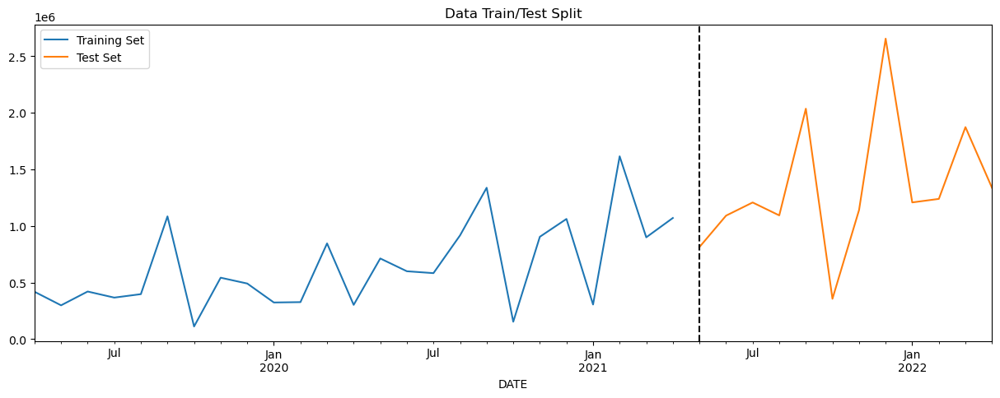

In [208]:
# DATA PARTITION

# Create the Target
y8 = X8['Sales_EUR(t)']

# Split into train and test

y8_train, y8_test, X8_train, X8_test = data_partition(y8, X8)

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [209]:
# Scaling the train and test data

X8_train_scaled, X8_test_scaled = scale(X8_train, X8_test)

### Model

In [210]:
reg8 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [211]:
reg8.fit(X8_train_scaled, y8_train,
        eval_set=[(X8_train_scaled, y8_train), (X8_test_scaled, y8_test)],
        verbose=100)

[23:12:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:740520.66372	validation_1-rmse:1449794.65077
[100]	validation_0-rmse:333230.04694	validation_1-rmse:1068555.83079
[200]	validation_0-rmse:164198.89795	validation_1-rmse:900084.54232
[300]	validation_0-rmse:88067.08559	validation_1-rmse:838204.22635
[400]	validation_0-rmse:50748.75372	validation_1-rmse:789783.99469
[500]	validation_0-rmse:30470.71741	validation_1-rmse:760008.92208
[600]	validation_0-rmse:18800.94198	validation_1-rmse:747061.51857
[700]	validation_0-rmse:11601.23831	validation_1-rmse:741103.61660
[800]	validation_0-rmse:7127.93492	validation_1-rmse:737823.15537
[900]	validation_0-rmse:4446.52291	validation_1-rmse:735706.27183
[999]	validation_0-rmse:2761.19733	validation_1-rmse:734533.23569


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

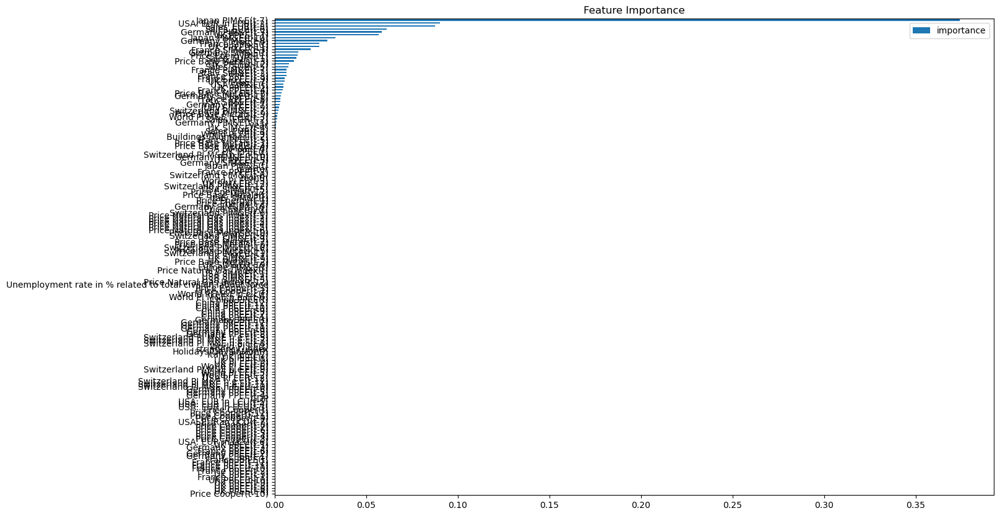

In [212]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg8.feature_importances_,
             index=reg8.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

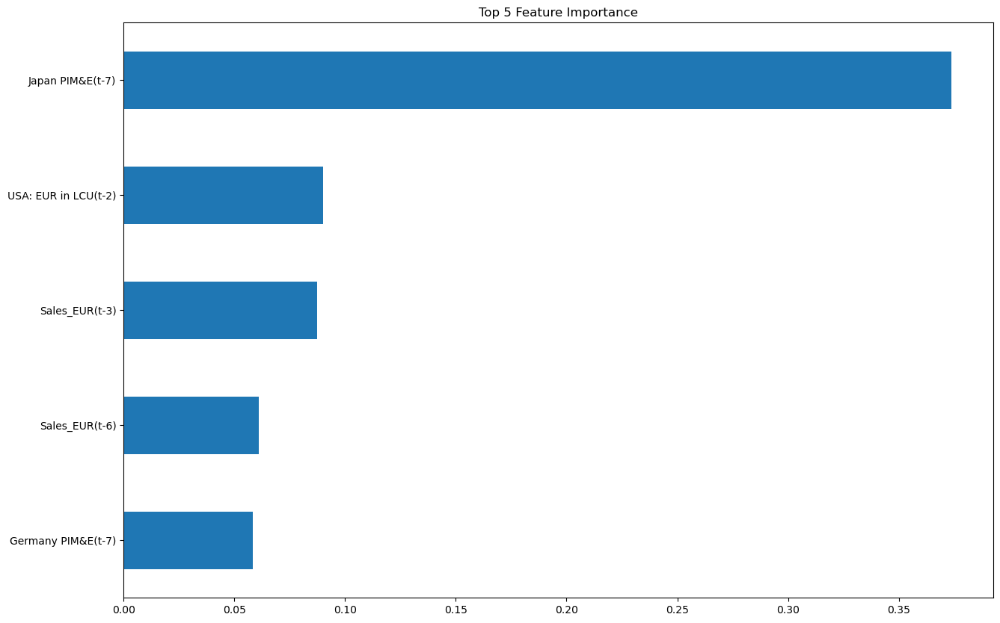

In [213]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg8.feature_importances_,
             index=reg8.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

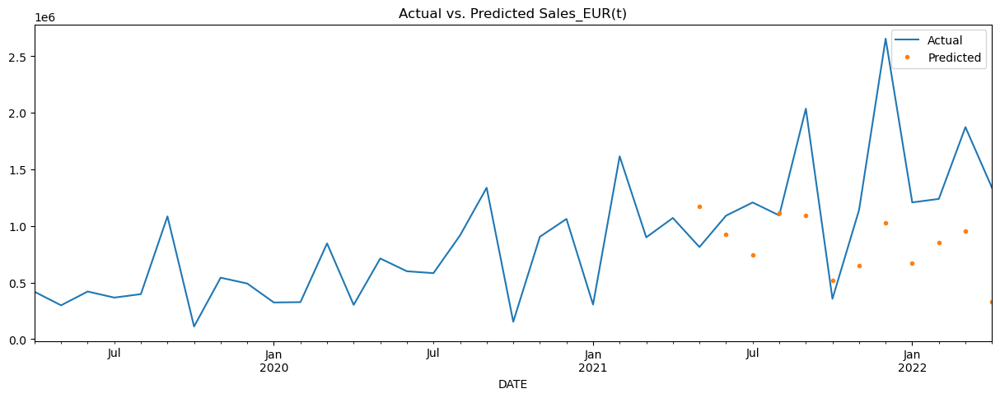

In [214]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results8 = pd.DataFrame({'actual': y8_test.values, 'predicted': y8_pred}, index=y8_test.index)

# Merge the new dataframe with the original dataframe X1:
X8_pred = X8.merge(results8, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X8_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X8_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [215]:
# SCORE (RMSE)
score8 = np.sqrt(mean_squared_error(y8_test, y8_pred))
print(f'RMSE Score on Test set: {score8:0.2f}')

RMSE Score on Test set: 734533.25


In [216]:
# Visualize predictions vs close values 
temp8 = y8_test.to_frame()
temp8['Prediction'] = y8_pred
temp8['Residual'] = y8_test - temp8.Prediction
temp8

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,813607.01,1.174186e+06,-3.605795e+05
2021-06-30,1091239.79,9.262865e+05,1.649533e+05
2021-07-31,1207554.52,7.441184e+05,4.634361e+05
2021-08-31,1093379.99,1.116888e+06,-2.350826e+04
2021-09-30,2036355.01,1.095231e+06,9.411239e+05
2021-10-31,356322.55,5.182127e+05,-1.618901e+05
2021-11-30,1140720.52,6.522488e+05,4.884717e+05
2021-12-31,2655036.78,1.025045e+06,1.629992e+06
2022-01-31,1208090.29,6.749608e+05,5.331295e+05


### Predicting the future

In [217]:
# Retrain on all data

# Remove the Target from X
X8 = X8.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X8)
X8_scaled = scaler.transform(X8) 
X8_scaled = pd.DataFrame(X8_scaled, columns = X8.columns).set_index(X8.index)

reg8.fit(X8_scaled, y8,
        eval_set=[(X8_scaled, y8)],
        verbose=100)

[23:13:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:1022937.41918
[100]	validation_0-rmse:462713.27061
[200]	validation_0-rmse:229604.52634
[300]	validation_0-rmse:126651.02597
[400]	validation_0-rmse:75576.11603
[500]	validation_0-rmse:46668.10346
[600]	validation_0-rmse:29349.63586
[700]	validation_0-rmse:18752.54441
[800]	validation_0-rmse:12080.35756
[900]	validation_0-rmse:7830.62600
[999]	validation_0-rmse:5200.00703


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [218]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X8_and_future = pd.concat([X8_original, future_df])
X8_and_future = create_features(X8_and_future)

In [219]:
# Lagged Sales: let's assign the values we already know

X8_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X8_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X8_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X8_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X8_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X8_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X8_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X8_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X8_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X8_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X8_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X8_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X8_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X8_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X8_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X8_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [220]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X8_and_future.update(forecast)

In [221]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_8], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X8_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet wit

INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to 

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet wit

INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to 

In [222]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '05-31-2022']
y8_test = y8.loc[y8.index == '05-31-2022']

X8_train = X8_and_future.loc[X8_and_future.index < '05-31-2022']
X8_test = X8_and_future.loc[X8_and_future.index == '05-31-2022']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y8_pred

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '06-30-2022']
y8_test = y8.loc[y8.index == '06-30-2022']

X8_train = X8_and_future.loc[X8_and_future.index < '06-30-2022']
X8_test = X8_and_future.loc[X8_and_future.index == '06-30-2022']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '07-31-2022']
y8_test = y8.loc[y8.index == '07-31-2022']

X8_train = X8_and_future.loc[X8_and_future.index < '07-31-2022']
X8_test = X8_and_future.loc[X8_and_future.index == '07-31-2022']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '08-31-2022']
y8_test = y8.loc[y8.index == '08-31-2022']

X8_train = X8_and_future.loc[X8_and_future.index < '08-31-2022']
X8_test = X8_and_future.loc[X8_and_future.index == '08-31-2022']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '09-30-2022']
y8_test = y8.loc[y8.index == '09-30-2022']

X8_train = X8_and_future.loc[X8_and_future.index < '09-30-2022']
X8_test = X8_and_future.loc[X8_and_future.index == '09-30-2022']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '10-31-2022']
y8_test = y8.loc[y8.index == '10-31-2022']

X8_train = X8_and_future.loc[X8_and_future.index < '10-31-2022']
X8_test = X8_and_future.loc[X8_and_future.index == '10-31-2022']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '11-30-2022']
y8_test = y8.loc[y8.index == '11-30-2022']

X8_train = X8_and_future.loc[X8_and_future.index < '11-30-2022']
X8_test = X8_and_future.loc[X8_and_future.index == '11-30-2022']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X8_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '12-31-2022']
y8_test = y8.loc[y8.index == '12-31-2022']

X8_train = X8_and_future.loc[X8_and_future.index < '12-31-2022']
X8_test = X8_and_future.loc[X8_and_future.index == '12-31-2022']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X8_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X8_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X8_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '01-31-2023']
y8_test = y8.loc[y8.index == '01-31-2023']

X8_train = X8_and_future.loc[X8_and_future.index < '01-31-2023']
X8_test = X8_and_future.loc[X8_and_future.index == '01-31-2023']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X8_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X8_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X8_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X8_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X8_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X8_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X8_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y8 = X8_and_future['Sales_EUR(t)']

# Split into train and test
y8_train = y8.loc[y8.index < '02-28-2023']
y8_test = y8.loc[y8.index == '02-28-2023']

X8_train = X8_and_future.loc[X8_and_future.index < '02-28-2023']
X8_test = X8_and_future.loc[X8_and_future.index == '02-28-2023']

# Remove the Target from X
X8_train = X8_train.drop(labels=['Sales_EUR(t)'],axis=1)
X8_test = X8_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y8_pred = reg8.predict(X8_test)

X8_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y8_pred
X8_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X8_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X8_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X8_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X8_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X8_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X8_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X8_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X8_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X8_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X8_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X8_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [223]:
X8_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,World PI EE(t),UK PI EE(t-6),UK PI EE(t-9),UK PI EE(t),Italy PI EE(t-2),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,586052.740,526292.770,271490.710,381400.150,368475.570,591288.360,418899.900,2,4,2019,...,119.415619,118.670791,103.462728,113.521605,83.451233,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,526292.770,271490.710,381400.150,368475.570,591288.360,418899.900,298806.840,2,5,2019,...,122.786171,120.467019,105.737950,117.593055,88.832741,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,271490.710,381400.150,368475.570,591288.360,418899.900,298806.840,420707.730,2,6,2019,...,125.168800,105.378705,110.288394,123.101487,75.947449,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,381400.150,368475.570,591288.360,418899.900,298806.840,420707.730,366980.260,3,7,2019,...,125.639954,107.174933,118.670791,123.939727,91.637192,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,368475.570,591288.360,418899.900,298806.840,420707.730,366980.260,397537.200,3,8,2019,...,116.711708,110.647640,120.467019,115.198084,83.527031,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,591288.360,418899.900,298806.840,420707.730,366980.260,397537.200,1084685.920,3,9,2019,...,131.046967,126.214949,105.378705,128.490171,92.925720,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,418899.900,298806.840,420707.730,366980.260,397537.200,1084685.920,111791.340,4,10,2019,...,129.243942,113.521605,107.174933,128.250674,43.961597,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,298806.840,420707.730,366980.260,397537.200,1084685.920,111791.340,542923.420,4,11,2019,...,127.952271,117.593055,110.647640,125.616206,87.695801,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,420707.730,366980.260,397537.200,1084685.920,111791.340,542923.420,491332.720,4,12,2019,...,119.102165,123.101487,126.214949,117.233809,91.637192,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,366980.260,397537.200,1084685.920,111791.340,542923.420,491332.720,323769.200,1,1,2020,...,105.140671,123.939727,113.521605,116.395569,81.480545,0.129032,1.533793,12410.000000,874.050000,5.300000


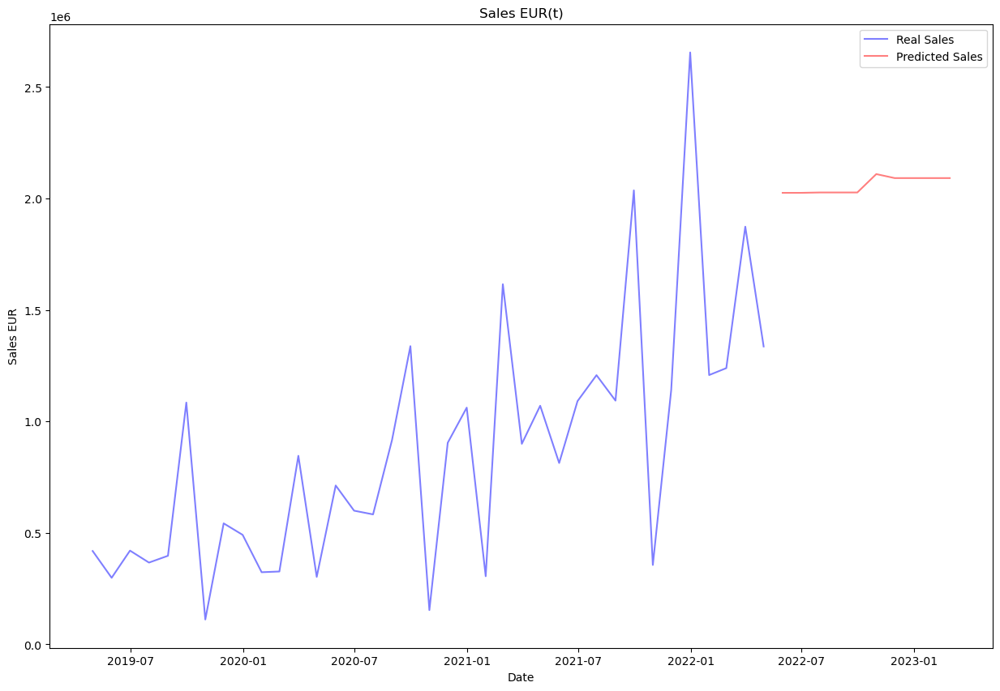

In [224]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X8_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X8_and_future['Sales_EUR(t)'].where(X8_and_future.index < '2022-05-31', other=None)
y_pred = X8_and_future['Sales_EUR(t)'].where(X8_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [225]:
# Create pandas dataframe with test set results

y8_test_pred = X8_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y8_test_pred

,Sales_EUR(t)
2022-05-31,2025299.625
2022-06-30,2025299.625
2022-07-31,2026972.750
2022-08-31,2026972.750
2022-09-30,2026972.750
2022-10-31,2109424.000
2022-11-30,2091479.750
2022-12-31,2091479.750
2023-01-31,2091479.750
2023-02-28,2091479.750


## 3.7. GCK #9

In [226]:
# Create a modeling dataset from the original dataset
X9 = pd.DataFrame(index=df_sales_grouped_9.index, data={'Sales_EUR': df_sales_grouped_9['Sales_EUR'].values})
X9 = X9.sort_index(ascending=True)
X9.head()

,Sales_EUR
DATE,
2018-10-31,3219.32
2018-11-30,1875.90
2018-12-31,0.00
2019-01-31,1487.00
2019-02-28,3234.28


### Selecting best market lag features for this GCK

In [227]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_9 = df_market_filtered_lag_trial.join(X9['Sales_EUR'], how='right')

In [228]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_9['Sales_EUR'], df_market_filtered_lag_trial_9[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df9_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df9_correlations.loc[col, lag] = corr

df9_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,0.020616,-0.15402,-0.050871,-0.049989,-0.028661,-0.106585,-0.252404,0.021376,0.019732,-0.220321,-0.301108,-0.115777,0.268097
France SIM&E,0.028659,-0.202721,-0.025938,-0.010714,-0.080841,-0.100962,-0.197467,-0.001618,0.064743,-0.15581,-0.353396,-0.055877,0.229582
Germany PIM&E,-0.01034,-0.314456,-0.095669,-0.061903,-0.219802,-0.18077,-0.166267,-0.155663,-0.095973,-0.269981,-0.275975,0.011573,0.220025
Germany SIM&E,-0.032419,-0.317648,-0.049017,-0.067504,-0.231803,-0.157292,-0.145904,-0.155164,-0.05789,-0.23926,-0.256255,0.034471,0.234685
Italy PIM&E,0.08737,-0.115053,-0.085828,-0.04733,0.043016,-0.102918,-0.279753,0.035954,-0.031594,-0.145072,-0.252859,-0.142364,0.196584
Italy SIM&E,0.017849,-0.200991,0.028888,-0.032124,0.002645,-0.091025,-0.257269,-0.029103,-0.033487,-0.057843,-0.201495,-0.034932,0.228605
Japan PIM&E,-0.073837,-0.215782,-0.088547,-0.15185,-0.208744,-0.065015,-0.192448,-0.13649,-0.094738,-0.30465,-0.288155,0.040379,0.181387
Switzerland PIM&E,-0.139421,-0.169983,-0.183068,-0.244565,-0.243989,-0.236465,-0.212588,-0.198052,-0.163782,-0.092832,-0.052833,-0.059064,-0.104457
UK PIM&E,0.078702,-0.170487,-0.065525,-0.108397,-0.208307,-0.206832,-0.071672,-0.092289,-0.10957,-0.348566,-0.413084,-0.010365,0.248638
UK SIM&E,0.060958,-0.102279,-0.053313,-0.114905,-0.180615,-0.233042,-0.050212,-0.13291,-0.179844,-0.309773,-0.391506,-0.034278,0.088955


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [229]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_9 = df9_correlations[(df9_correlations >= 0.3) | (df9_correlations <= -0.3)]
filtered_df_correlations_9

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.301108,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.353396,NaN,NaN
Germany PIM&E,NaN,-0.314456,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany SIM&E,NaN,-0.317648,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.30465,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.348566,-0.413084,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.309773,-0.391506,NaN,NaN


In [230]:
# let's create a list with those selected features

selected_market_lags_9 = []
for col, lag in filtered_df_correlations_9.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_9.append(feature_name)

selected_market_lags_9

['France PIM&E(t-11)',
 'France SIM&E(t-11)',
 'Germany PIM&E(t-2)',
 'Germany SIM&E(t-2)',
 'Japan PIM&E(t-10)',
 'UK PIM&E(t-10)',
 'UK PIM&E(t-11)',
 'UK SIM&E(t-10)',
 'UK SIM&E(t-11)',
 'USA PIM&E(t-10)',
 'USA PIM&E(t-11)',
 'Europe PIM&E(t-11)',
 'Price Base Metals(t-12)',
 'Price Energy(t-6)',
 'Price Energy(t-11)',
 'Price Energy(t-12)',
 'USA PI EE(t-10)',
 'World PI EE(t)',
 'UK PI EE(t)',
 'Germany PI EE(t-10)',
 'Germany PI EE(t-11)']

In [231]:
# Create features
X9 = create_data(X9, selected_market_lags_9)
X9.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,USA PI EE(t-10),World PI EE(t),UK PI EE(t),Germany PI EE(t-10),Germany PI EE(t-11),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,3219.32,1875.90,0.00,1487.00,3234.28,13050.61,9119.65,2,4,2019,...,109.744804,119.415619,113.521605,116.751183,106.746880,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,1875.90,0.00,1487.00,3234.28,13050.61,9119.65,4614.08,2,5,2019,...,107.886337,122.786171,117.593055,111.181778,116.751183,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,0.00,1487.00,3234.28,13050.61,9119.65,4614.08,4488.09,2,6,2019,...,110.300163,125.168800,123.101487,111.284912,111.181778,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,1487.00,3234.28,13050.61,9119.65,4614.08,4488.09,1766.40,3,7,2019,...,111.160194,125.639954,123.939727,110.872368,111.284912,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,3234.28,13050.61,9119.65,4614.08,4488.09,1766.40,6371.50,3,8,2019,...,112.853256,116.711708,115.198084,118.298233,110.872368,1.000000,0.0,12803.0,872.30,5.1


In [232]:
X9_original = X9.copy()

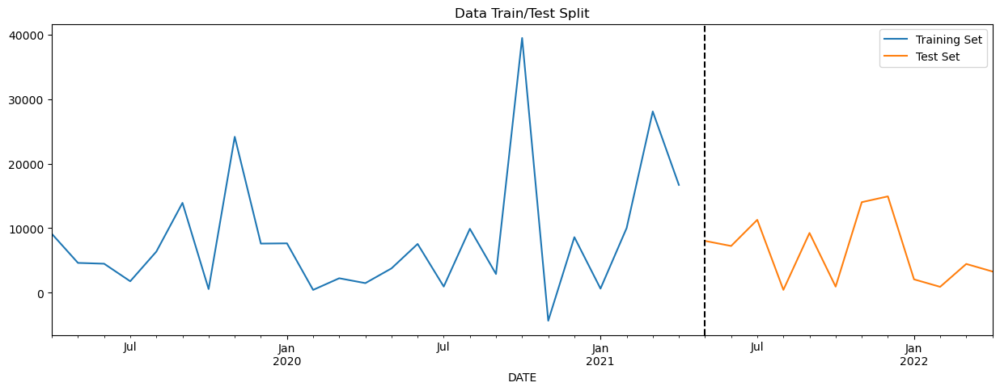

In [233]:
# DATA PARTITION

# Create the Target
y9 = X9['Sales_EUR(t)']

# Split into train and test

y9_train, y9_test, X9_train, X9_test = data_partition(y9, X9)

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [234]:
# Scaling the train and test data

X9_train_scaled, X9_test_scaled = scale(X9_train, X9_test)

### Model

In [235]:
reg9 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [236]:
reg9.fit(X9_train_scaled, y9_train,
        eval_set=[(X9_train_scaled, y9_train), (X9_test_scaled, y9_test)],
        verbose=100)

[23:23:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:12681.55956	validation_1-rmse:8009.96711
[100]	validation_0-rmse:6849.07126	validation_1-rmse:4939.50797
[123]	validation_0-rmse:5972.48439	validation_1-rmse:5707.91515


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

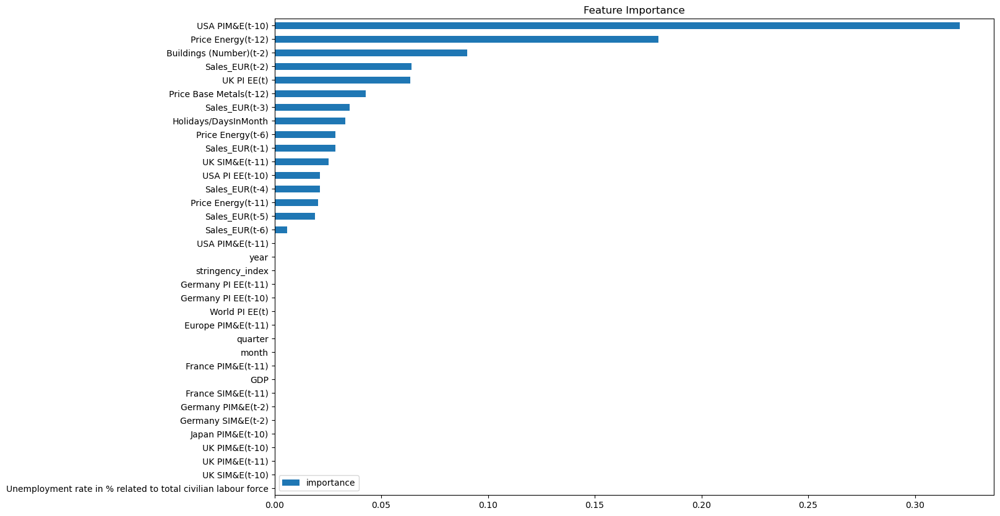

In [237]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg9.feature_importances_,
             index=reg9.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

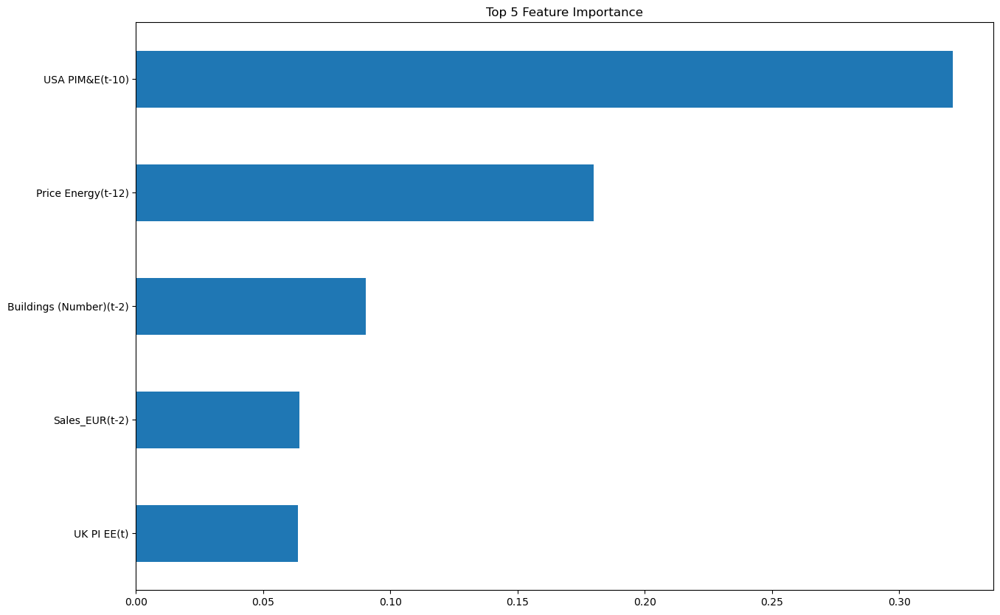

In [238]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg9.feature_importances_,
             index=reg9.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

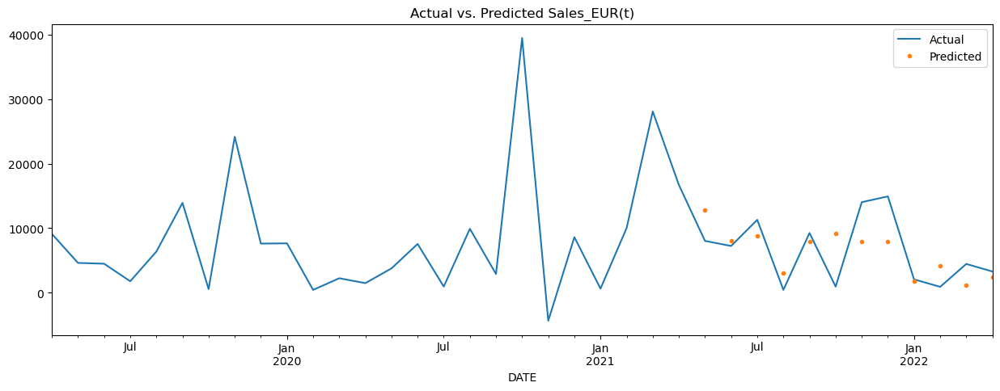

In [239]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results9 = pd.DataFrame({'actual': y9_test.values, 'predicted': y9_pred}, index=y9_test.index)

# Merge the new dataframe with the original dataframe X1:
X9_pred = X9.merge(results9, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X9_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X9_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [240]:
# SCORE (RMSE)
score9 = np.sqrt(mean_squared_error(y9_test, y9_pred))
print(f'RMSE Score on Test set: {score9:0.2f}')

RMSE Score on Test set: 4228.14


In [241]:
# Visualize predictions vs close values 
temp9 = y9_test.to_frame()
temp9['Prediction'] = y9_pred
temp9['Residual'] = y9_test - temp9.Prediction
temp9

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,8026.00,12871.007812,-4845.007812
2021-06-30,7240.84,8112.327637,-871.487637
2021-07-31,11295.75,8797.010742,2498.739258
2021-08-31,432.00,3054.824219,-2622.824219
2021-09-30,9259.20,7972.838867,1286.361133
2021-10-31,937.04,9194.594727,-8257.554727
2021-11-30,14035.58,7972.838867,6062.741133
2021-12-31,14935.20,7972.838867,6962.361133
2022-01-31,2064.70,1786.275024,278.424976


### Predicting the future

In [242]:
# Retrain on all data

# Remove the Target from X
X9 = X9.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X9)
X9_scaled = scaler.transform(X9) 
X9_scaled = pd.DataFrame(X9_scaled, columns = X9.columns).set_index(X9.index)

reg9.fit(X9_scaled, y9,
        eval_set=[(X9_scaled, y9)],
        verbose=100)

[23:23:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:11384.73929
[100]	validation_0-rmse:6153.66563
[200]	validation_0-rmse:3703.21926
[300]	validation_0-rmse:2411.54703
[400]	validation_0-rmse:1615.95984
[500]	validation_0-rmse:1074.97235
[600]	validation_0-rmse:721.61323
[700]	validation_0-rmse:479.69403
[800]	validation_0-rmse:309.78630
[900]	validation_0-rmse:192.15465
[999]	validation_0-rmse:119.40929


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [243]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X9_and_future = pd.concat([X9_original, future_df])
X9_and_future = create_features(X9_and_future)

In [244]:
# Lagged Sales: let's assign the values we already know

X9_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X9_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X9_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X9_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X9_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X9_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X9_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X9_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X9_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X9_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X9_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X9_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X9_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X9_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X9_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X9_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [245]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X9_and_future.update(forecast)

In [246]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_9], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X9_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [247]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '05-31-2022']
y9_test = y9.loc[y9.index == '05-31-2022']

X9_train = X9_and_future.loc[X9_and_future.index < '05-31-2022']
X9_test = X9_and_future.loc[X9_and_future.index == '05-31-2022']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y9_pred

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '06-30-2022']
y9_test = y9.loc[y9.index == '06-30-2022']

X9_train = X9_and_future.loc[X9_and_future.index < '06-30-2022']
X9_test = X9_and_future.loc[X9_and_future.index == '06-30-2022']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '07-31-2022']
y9_test = y9.loc[y9.index == '07-31-2022']

X9_train = X9_and_future.loc[X9_and_future.index < '07-31-2022']
X9_test = X9_and_future.loc[X9_and_future.index == '07-31-2022']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '08-31-2022']
y9_test = y9.loc[y9.index == '08-31-2022']

X9_train = X9_and_future.loc[X9_and_future.index < '08-31-2022']
X9_test = X9_and_future.loc[X9_and_future.index == '08-31-2022']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '09-30-2022']
y9_test = y9.loc[y9.index == '09-30-2022']

X9_train = X9_and_future.loc[X9_and_future.index < '09-30-2022']
X9_test = X9_and_future.loc[X9_and_future.index == '09-30-2022']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '10-31-2022']
y9_test = y9.loc[y9.index == '10-31-2022']

X9_train = X9_and_future.loc[X9_and_future.index < '10-31-2022']
X9_test = X9_and_future.loc[X9_and_future.index == '10-31-2022']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '11-30-2022']
y9_test = y9.loc[y9.index == '11-30-2022']

X9_train = X9_and_future.loc[X9_and_future.index < '11-30-2022']
X9_test = X9_and_future.loc[X9_and_future.index == '11-30-2022']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X9_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '12-31-2022']
y9_test = y9.loc[y9.index == '12-31-2022']

X9_train = X9_and_future.loc[X9_and_future.index < '12-31-2022']
X9_test = X9_and_future.loc[X9_and_future.index == '12-31-2022']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X9_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X9_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X9_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '01-31-2023']
y9_test = y9.loc[y9.index == '01-31-2023']

X9_train = X9_and_future.loc[X9_and_future.index < '01-31-2023']
X9_test = X9_and_future.loc[X9_and_future.index == '01-31-2023']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X9_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X9_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X9_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X9_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X9_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X9_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X9_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y9 = X9_and_future['Sales_EUR(t)']

# Split into train and test
y9_train = y9.loc[y9.index < '02-28-2023']
y9_test = y9.loc[y9.index == '02-28-2023']

X9_train = X9_and_future.loc[X9_and_future.index < '02-28-2023']
X9_test = X9_and_future.loc[X9_and_future.index == '02-28-2023']

# Remove the Target from X
X9_train = X9_train.drop(labels=['Sales_EUR(t)'],axis=1)
X9_test = X9_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y9_pred = reg9.predict(X9_test)

X9_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y9_pred
X9_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X9_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X9_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X9_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X9_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X9_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X9_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X9_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X9_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X9_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X9_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X9_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [248]:
X9_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,USA PI EE(t-10),World PI EE(t),UK PI EE(t),Germany PI EE(t-10),Germany PI EE(t-11),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,3219.320000,1875.900000,0.000000,1487.000000,3234.280000,13050.610000,9119.650000,2,4,2019,...,109.744804,119.415619,113.521605,116.751183,106.746880,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,1875.900000,0.000000,1487.000000,3234.280000,13050.610000,9119.650000,4614.080000,2,5,2019,...,107.886337,122.786171,117.593055,111.181778,116.751183,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,0.000000,1487.000000,3234.280000,13050.610000,9119.650000,4614.080000,4488.090000,2,6,2019,...,110.300163,125.168800,123.101487,111.284912,111.181778,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,1487.000000,3234.280000,13050.610000,9119.650000,4614.080000,4488.090000,1766.400000,3,7,2019,...,111.160194,125.639954,123.939727,110.872368,111.284912,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,3234.280000,13050.610000,9119.650000,4614.080000,4488.090000,1766.400000,6371.500000,3,8,2019,...,112.853256,116.711708,115.198084,118.298233,110.872368,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,13050.610000,9119.650000,4614.080000,4488.090000,1766.400000,6371.500000,13930.260000,3,9,2019,...,113.145294,131.046967,128.490171,117.163727,118.298233,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,9119.650000,4614.080000,4488.090000,1766.400000,6371.500000,13930.260000,555.000000,4,10,2019,...,111.823624,129.243942,128.250674,89.626122,117.163727,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,4614.080000,4488.090000,1766.400000,6371.500000,13930.260000,555.000000,24181.800000,4,11,2019,...,109.499725,127.952271,125.616206,105.406097,89.626122,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,4488.090000,1766.400000,6371.500000,13930.260000,555.000000,24181.800000,7611.360000,4,12,2019,...,110.835655,119.102165,117.233809,103.652771,105.406097,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,1766.400000,6371.500000,13930.260000,555.000000,24181.800000,7611.360000,7647.500000,1,1,2020,...,111.092499,105.140671,116.395569,111.388054,103.652771,0.129032,1.533793,12410.000000,874.050000,5.300000


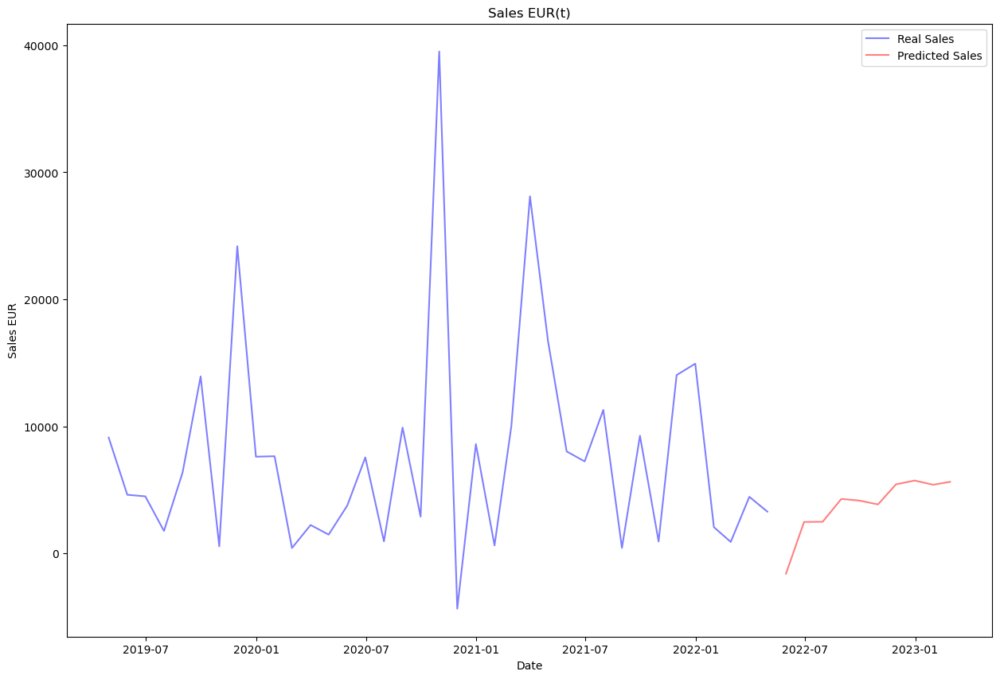

In [249]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X9_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X9_and_future['Sales_EUR(t)'].where(X9_and_future.index < '2022-05-31', other=None)
y_pred = X9_and_future['Sales_EUR(t)'].where(X9_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [250]:
# Create pandas dataframe with test set results

y9_test_pred = X9_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y9_test_pred

,Sales_EUR(t)
2022-05-31,-1597.819580
2022-06-30,2472.833008
2022-07-31,2489.403809
2022-08-31,4285.033203
2022-09-30,4156.897949
2022-10-31,3852.940186
2022-11-30,5435.959473
2022-12-31,5734.154785
2023-01-31,5402.095215
2023-02-28,5634.065918


## 3.8. GCK #11

In [251]:
# Create a modeling dataset from the original dataset
X11 = pd.DataFrame(index=df_sales_grouped_11.index, data={'Sales_EUR': df_sales_grouped_11['Sales_EUR'].values})
X11 = X11.sort_index(ascending=True)
X11.head()

,Sales_EUR
DATE,
2018-10-31,1021303.50
2018-11-30,1898844.80
2018-12-31,1226122.00
2019-01-31,2216391.74
2019-02-28,610456.60


### Selecting best market lag features for this GCK

In [252]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_11 = df_market_filtered_lag_trial.join(X11['Sales_EUR'], how='right')

In [253]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_11['Sales_EUR'], df_market_filtered_lag_trial_11[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df11_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df11_correlations.loc[col, lag] = corr

df11_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.396197,0.148768,-0.012455,-0.253661,0.07867,0.175991,-0.185915,0.080981,0.206785,0.074528,0.021609,-0.132719,-0.044634
France SIM&E,-0.331768,-0.035271,0.190946,-0.319316,0.070921,0.222588,-0.168161,0.100482,0.375674,0.005197,0.011764,-0.078657,-0.018631
Germany PIM&E,-0.2598,-0.117051,-0.023371,-0.210245,-0.00206,0.160294,-0.300012,-0.084693,0.251565,0.010506,-0.106696,-0.001422,0.167557
Germany SIM&E,-0.261512,-0.08912,0.061926,-0.198853,-0.001973,0.196681,-0.308424,-0.062753,0.335466,-0.027053,-0.105047,0.082507,0.266756
Italy PIM&E,-0.330881,0.269358,-0.034164,-0.027919,0.023794,0.104866,-0.105863,0.035778,0.023139,0.190459,-0.037322,-0.178021,-0.120479
Italy SIM&E,-0.313365,0.193036,0.08796,-0.096264,-0.02644,0.099405,-0.182263,0.082683,0.445375,0.058261,-0.044382,-0.051443,0.017785
Japan PIM&E,-0.28035,0.059117,0.059736,-0.280122,0.187912,0.472597,-0.337043,-0.059029,0.163417,-0.205576,-0.14065,0.054582,0.153266
Switzerland PIM&E,-0.163352,-0.237873,-0.254918,-0.202681,-0.158469,-0.085982,0.052263,0.119709,0.124092,0.015287,-0.060721,-0.14562,-0.045944
UK PIM&E,-0.202254,-0.072171,-0.009176,-0.195645,-0.006212,0.321295,-0.196819,0.000537,0.173195,0.028011,-0.071658,0.035305,0.171248
UK SIM&E,-0.202758,-0.137934,-0.122224,-0.240079,-0.085892,0.158872,-0.077932,0.010231,0.02595,0.067733,0.036949,-0.029693,0.024658


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [254]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_11 = df11_correlations[(df11_correlations >= 0.3) | (df11_correlations <= -0.3)]
filtered_df_correlations_11

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.396197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
France SIM&E,-0.331768,NaN,NaN,-0.319316,NaN,NaN,NaN,NaN,0.375674,NaN,NaN,NaN,NaN
Germany PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.300012,NaN,NaN,NaN,NaN,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.308424,NaN,0.335466,NaN,NaN,NaN,NaN
Italy PIM&E,-0.330881,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,-0.313365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.445375,NaN,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,0.472597,-0.337043,NaN,NaN,NaN,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,0.321295,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [255]:
# let's create a list with those selected features

selected_market_lags_11 = []
for col, lag in filtered_df_correlations_11.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_11.append(feature_name)

selected_market_lags_11

['France PIM&E(t-1)',
 'France SIM&E(t-1)',
 'France SIM&E(t-4)',
 'France SIM&E(t-9)',
 'Germany PIM&E(t-7)',
 'Germany SIM&E(t-7)',
 'Germany SIM&E(t-9)',
 'Italy PIM&E(t-1)',
 'Italy SIM&E(t-1)',
 'Italy SIM&E(t-9)',
 'Japan PIM&E(t-6)',
 'Japan PIM&E(t-7)',
 'UK PIM&E(t-6)',
 'USA SIM&E(t-3)',
 'USA SIM&E(t)',
 'Europe PIM&E(t-1)',
 'World PI M&E n.e.c(t-7)',
 'World PI EE(t-7)',
 'Switzerland PI EE(t-2)',
 'Switzerland PI EE(t-3)',
 'UK PI EE(t-6)',
 'Italy PI EE(t-1)']

In [256]:
# Create features
X11 = create_data(X11, selected_market_lags_11)
X11.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,World PI EE(t-7),Switzerland PI EE(t-2),Switzerland PI EE(t-3),UK PI EE(t-6),Italy PI EE(t-1),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,1021303.50,1898844.80,1226122.00,2216391.74,610456.60,493999.81,1484281.60,2,4,2019,...,126.344688,104.208038,110.354610,118.670791,88.832741,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,1898844.80,1226122.00,2216391.74,610456.60,493999.81,1484281.60,1066063.90,2,5,2019,...,129.325775,98.061466,104.208038,120.467019,75.947449,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,1226122.00,2216391.74,610456.60,493999.81,1484281.60,1066063.90,492133.20,2,6,2019,...,128.236176,95.539795,98.061466,105.378705,91.637192,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,2216391.74,610456.60,493999.81,1484281.60,1066063.90,492133.20,585648.14,3,7,2019,...,117.043549,93.018125,95.539795,107.174933,83.527031,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,610456.60,493999.81,1484281.60,1066063.90,492133.20,585648.14,2898779.87,3,8,2019,...,111.522202,90.496454,93.018125,110.647640,92.925720,1.000000,0.0,12803.0,872.30,5.1


In [257]:
X11_original = X11.copy()

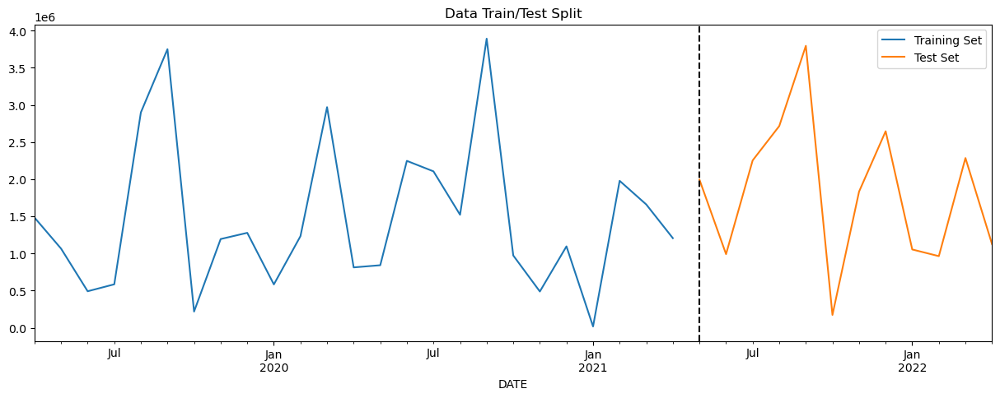

In [258]:
# DATA PARTITION

# Create the Target
y11 = X11['Sales_EUR(t)']

# Split into train and test

y11_train, y11_test, X11_train, X11_test = data_partition(y11, X11)

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [259]:
# Scaling the train and test data

X11_train_scaled, X11_test_scaled = scale(X11_train, X11_test)

### Model

In [260]:
reg11 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [261]:
reg11.fit(X11_train_scaled, y11_train,
        eval_set=[(X11_train_scaled, y11_train), (X11_test_scaled, y11_test)],
        verbose=100)

[23:23:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:1763496.56438	validation_1-rmse:2045768.79627
[100]	validation_0-rmse:818815.00991	validation_1-rmse:1246363.26729
[200]	validation_0-rmse:404734.35151	validation_1-rmse:873332.91788
[300]	validation_0-rmse:208640.56769	validation_1-rmse:695844.66482
[400]	validation_0-rmse:110060.12499	validation_1-rmse:639464.16184
[500]	validation_0-rmse:61386.25995	validation_1-rmse:613897.72492
[600]	validation_0-rmse:36393.84815	validation_1-rmse:604743.30491
[700]	validation_0-rmse:22642.10377	validation_1-rmse:598751.36871
[800]	validation_0-rmse:14352.98747	validation_1-rmse:595928.39446
[900]	validation_0-rmse:8750.04291	validation_1-rmse:595016.56186
[999]	validation_0-rmse:5397.02991	validation_1-rmse:594045.88113


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

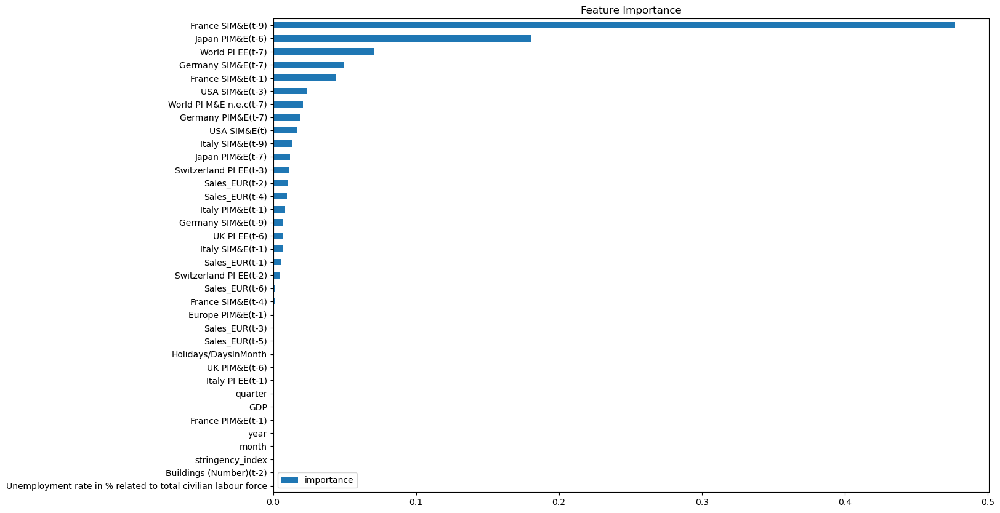

In [262]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg11.feature_importances_,
             index=reg11.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

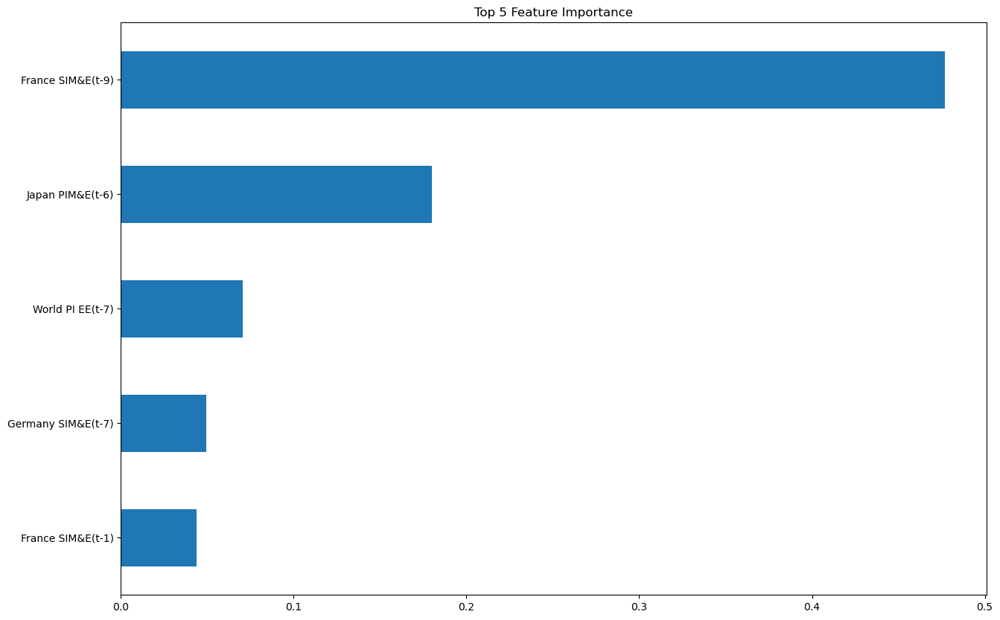

In [263]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg11.feature_importances_,
             index=reg11.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

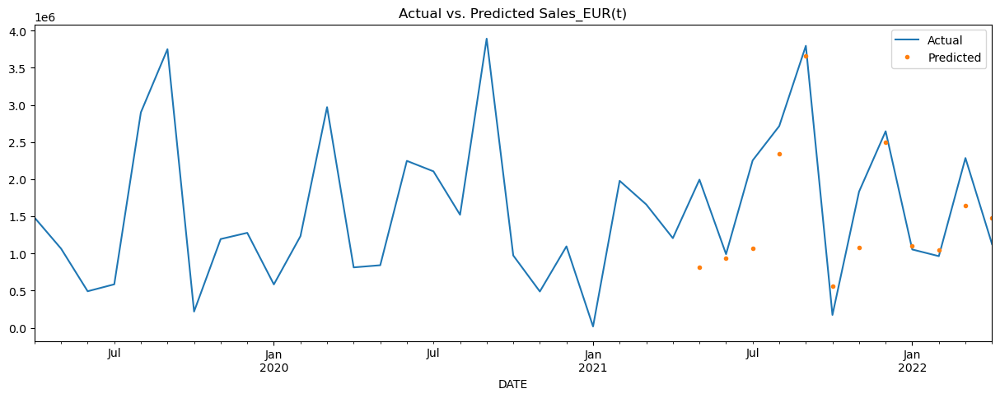

In [264]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results11 = pd.DataFrame({'actual': y11_test.values, 'predicted': y11_pred}, index=y11_test.index)

# Merge the new dataframe with the original dataframe X1:
X11_pred = X11.merge(results11, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X11_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X11_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [265]:
# SCORE (RMSE)
score11 = np.sqrt(mean_squared_error(y11_test, y11_pred))
print(f'RMSE Score on Test set: {score11:0.2f}')

RMSE Score on Test set: 594045.88


In [266]:
# Visualize predictions vs close values 
temp11 = y11_test.to_frame()
temp11['Prediction'] = y11_pred
temp11['Residual'] = y11_test - temp11.Prediction
temp11

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,1994228.40,8.153350e+05,1.178893e+06
2021-06-30,991872.24,9.354731e+05,5.639918e+04
2021-07-31,2253079.74,1.070557e+06,1.182523e+06
2021-08-31,2715460.08,2.337941e+06,3.775193e+05
2021-09-30,3795389.85,3.661915e+06,1.334751e+05
2021-10-31,173771.79,5.647280e+05,-3.909562e+05
2021-11-30,1832753.73,1.084001e+06,7.487530e+05
2021-12-31,2645689.71,2.495164e+06,1.505255e+05
2022-01-31,1054580.98,1.106285e+06,-5.170427e+04


### Predicting the future

In [267]:
# Retrain on all data

# Remove the Target from X
X11 = X11.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X11)
X11_scaled = scaler.transform(X11) 
X11_scaled = pd.DataFrame(X11_scaled, columns = X11.columns).set_index(X11.index)

reg11.fit(X11_scaled, y11,
        eval_set=[(X11_scaled, y11)],
        verbose=100)

[23:23:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:1856836.97490
[100]	validation_0-rmse:837779.55617
[200]	validation_0-rmse:408304.84837
[300]	validation_0-rmse:215168.05326
[400]	validation_0-rmse:116062.31239
[500]	validation_0-rmse:63184.44009
[600]	validation_0-rmse:36316.17682
[700]	validation_0-rmse:23139.58324
[800]	validation_0-rmse:15647.59454
[900]	validation_0-rmse:10266.60222
[999]	validation_0-rmse:6703.37177


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [268]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X11_and_future = pd.concat([X11_original, future_df])
X11_and_future = create_features(X11_and_future)

In [269]:
# Lagged Sales: let's assign the values we already know

X11_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X11_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X11_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X11_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X11_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X11_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X11_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X11_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X11_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X11_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X11_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X11_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X11_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X11_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X11_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X11_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [270]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X11_and_future.update(forecast)

In [271]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_11], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X11_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [272]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '05-31-2022']
y11_test = y11.loc[y11.index == '05-31-2022']

X11_train = X11_and_future.loc[X11_and_future.index < '05-31-2022']
X11_test = X11_and_future.loc[X11_and_future.index == '05-31-2022']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y11_pred

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '06-30-2022']
y11_test = y11.loc[y11.index == '06-30-2022']

X11_train = X11_and_future.loc[X11_and_future.index < '06-30-2022']
X11_test = X11_and_future.loc[X11_and_future.index == '06-30-2022']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '07-31-2022']
y11_test = y11.loc[y11.index == '07-31-2022']

X11_train = X11_and_future.loc[X11_and_future.index < '07-31-2022']
X11_test = X11_and_future.loc[X11_and_future.index == '07-31-2022']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '08-31-2022']
y11_test = y11.loc[y11.index == '08-31-2022']

X11_train = X11_and_future.loc[X11_and_future.index < '08-31-2022']
X11_test = X11_and_future.loc[X11_and_future.index == '08-31-2022']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '09-30-2022']
y11_test = y11.loc[y11.index == '09-30-2022']

X11_train = X11_and_future.loc[X11_and_future.index < '09-30-2022']
X11_test = X11_and_future.loc[X11_and_future.index == '09-30-2022']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '10-31-2022']
y11_test = y11.loc[y11.index == '10-31-2022']

X11_train = X11_and_future.loc[X11_and_future.index < '10-31-2022']
X11_test = X11_and_future.loc[X11_and_future.index == '10-31-2022']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '11-30-2022']
y11_test = y11.loc[y11.index == '11-30-2022']

X11_train = X11_and_future.loc[X11_and_future.index < '11-30-2022']
X11_test = X11_and_future.loc[X11_and_future.index == '11-30-2022']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X11_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '12-31-2022']
y11_test = y11.loc[y11.index == '12-31-2022']

X11_train = X11_and_future.loc[X11_and_future.index < '12-31-2022']
X11_test = X11_and_future.loc[X11_and_future.index == '12-31-2022']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X11_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X11_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X11_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '01-31-2023']
y11_test = y11.loc[y11.index == '01-31-2023']

X11_train = X11_and_future.loc[X11_and_future.index < '01-31-2023']
X11_test = X11_and_future.loc[X11_and_future.index == '01-31-2023']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X11_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X11_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X11_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X11_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X11_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X11_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X11_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y11 = X11_and_future['Sales_EUR(t)']

# Split into train and test
y11_train = y11.loc[y11.index < '02-28-2023']
y11_test = y11.loc[y11.index == '02-28-2023']

X11_train = X11_and_future.loc[X11_and_future.index < '02-28-2023']
X11_test = X11_and_future.loc[X11_and_future.index == '02-28-2023']

# Remove the Target from X
X11_train = X11_train.drop(labels=['Sales_EUR(t)'],axis=1)
X11_test = X11_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y11_pred = reg11.predict(X11_test)

X11_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y11_pred
X11_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X11_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X11_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X11_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X11_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X11_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X11_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X11_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X11_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X11_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X11_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X11_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [273]:
X11_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,World PI EE(t-7),Switzerland PI EE(t-2),Switzerland PI EE(t-3),UK PI EE(t-6),Italy PI EE(t-1),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,1021303.50,1898844.80,1226122.00,2216391.74,610456.60,493999.81,1484281.60,2,4,2019,...,126.344688,104.208038,110.354610,118.670791,88.832741,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,1898844.80,1226122.00,2216391.74,610456.60,493999.81,1484281.60,1066063.90,2,5,2019,...,129.325775,98.061466,104.208038,120.467019,75.947449,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,1226122.00,2216391.74,610456.60,493999.81,1484281.60,1066063.90,492133.20,2,6,2019,...,128.236176,95.539795,98.061466,105.378705,91.637192,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,2216391.74,610456.60,493999.81,1484281.60,1066063.90,492133.20,585648.14,3,7,2019,...,117.043549,93.018125,95.539795,107.174933,83.527031,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,610456.60,493999.81,1484281.60,1066063.90,492133.20,585648.14,2898779.87,3,8,2019,...,111.522202,90.496454,93.018125,110.647640,92.925720,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,493999.81,1484281.60,1066063.90,492133.20,585648.14,2898779.87,3749980.46,3,9,2019,...,112.666725,97.557132,90.496454,126.214949,43.961597,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,1484281.60,1066063.90,492133.20,585648.14,2898779.87,3749980.46,218976.78,4,10,2019,...,131.456177,104.617809,97.557132,113.521605,87.695801,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,1066063.90,492133.20,585648.14,2898779.87,3749980.46,218976.78,1194770.75,4,11,2019,...,119.415619,111.678487,104.617809,117.593055,91.637192,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,492133.20,585648.14,2898779.87,3749980.46,218976.78,1194770.75,1278545.62,4,12,2019,...,122.786171,113.033885,111.678487,123.101487,81.480545,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,585648.14,2898779.87,3749980.46,218976.78,1194770.75,1278545.62,584370.00,1,1,2020,...,125.168800,114.389283,113.033885,123.939727,63.971703,0.129032,1.533793,12410.000000,874.050000,5.300000


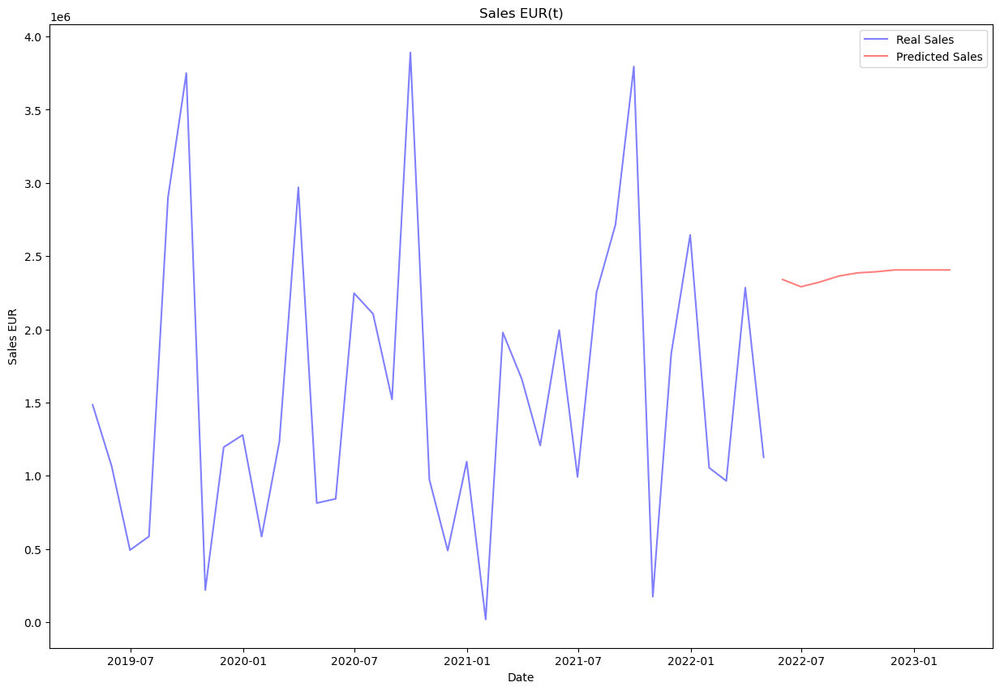

In [274]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X11_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X11_and_future['Sales_EUR(t)'].where(X11_and_future.index < '2022-05-31', other=None)
y_pred = X11_and_future['Sales_EUR(t)'].where(X11_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [275]:
# Create pandas dataframe with test set results

y11_test_pred = X11_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y11_test_pred

,Sales_EUR(t)
2022-05-31,2340253.75
2022-06-30,2290891.75
2022-07-31,2323636.25
2022-08-31,2364352.50
2022-09-30,2385481.50
2022-10-31,2393396.50
2022-11-30,2405780.25
2022-12-31,2405780.25
2023-01-31,2405780.25
2023-02-28,2405732.25


## 3.9. GCK #12

In [276]:
# Create a modeling dataset from the original dataset
X12 = pd.DataFrame(index=df_sales_grouped_12.index, data={'Sales_EUR': df_sales_grouped_12['Sales_EUR'].values})
X12 = X12.sort_index(ascending=True)
X12.head()

,Sales_EUR
DATE,
2018-10-31,28686.33
2018-11-30,1070.00
2018-12-31,17880.60
2019-01-31,21484.00
2019-02-28,34214.74


### Selecting best market lag features for this GCK

In [277]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_12 = df_market_filtered_lag_trial.join(X12['Sales_EUR'], how='right')

In [278]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_12['Sales_EUR'], df_market_filtered_lag_trial_12[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df12_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df12_correlations.loc[col, lag] = corr

df12_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.140035,0.162043,-0.124646,-0.154335,0.13897,-0.053219,-0.269153,-0.065281,-0.077013,-0.29206,-0.188716,-0.223193,0.148705
France SIM&E,-0.019926,0.133207,0.076476,-0.167696,0.215748,0.071906,-0.248722,0.018926,0.045734,-0.219935,-0.055913,-0.12985,0.253959
Germany PIM&E,-0.259067,-0.05867,-0.180331,-0.302218,-0.184,-0.249685,-0.48771,-0.320321,-0.286194,-0.573255,-0.423659,-0.28585,0.087377
Germany SIM&E,-0.139409,0.100098,-0.017678,-0.197929,-0.057395,-0.105733,-0.41048,-0.207589,-0.13533,-0.509708,-0.314124,-0.14913,0.270448
Italy PIM&E,-0.055642,0.185322,-0.16918,0.007883,0.101986,-0.033165,-0.118624,-0.097665,-0.075083,-0.139021,-0.225485,-0.17843,0.208990
Italy SIM&E,-0.007211,0.322653,0.033577,0.091245,0.198723,0.104077,-0.087668,-0.047824,0.129959,-0.238688,-0.024814,0.010989,0.398809
Japan PIM&E,-0.148685,0.085977,-0.05295,-0.250318,-0.072979,-0.172557,-0.454882,-0.149896,-0.241845,-0.570908,-0.271562,-0.269669,0.211349
Switzerland PIM&E,-0.174936,-0.191056,-0.269864,-0.344942,-0.445158,-0.507642,-0.516735,-0.552132,-0.505553,-0.472599,-0.410529,-0.371516,-0.134534
UK PIM&E,-0.071069,0.040632,0.012705,-0.105184,-0.013736,-0.024083,-0.361511,-0.082684,-0.169249,-0.403837,-0.363745,-0.31968,0.150261
UK SIM&E,-0.234146,-0.085174,-0.157611,-0.192407,-0.104807,-0.190767,-0.422159,-0.220201,-0.2929,-0.437477,-0.468907,-0.499696,-0.186825


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [279]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_12 = df12_correlations[(df12_correlations >= 0.3) | (df12_correlations <= -0.3)]
filtered_df_correlations_12

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany PIM&E,NaN,NaN,NaN,-0.302218,NaN,NaN,-0.48771,-0.320321,NaN,-0.573255,-0.423659,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.41048,NaN,NaN,-0.509708,-0.314124,NaN,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,NaN,0.322653,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.398809
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.454882,NaN,NaN,-0.570908,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,-0.344942,-0.445158,-0.507642,-0.516735,-0.552132,-0.505553,-0.472599,-0.410529,-0.371516,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.361511,NaN,NaN,-0.403837,-0.363745,-0.31968,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.422159,NaN,NaN,-0.437477,-0.468907,-0.499696,NaN


In [280]:
# let's create a list with those selected features

selected_market_lags_12 = []
for col, lag in filtered_df_correlations_12.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_12.append(feature_name)

selected_market_lags_12

['Germany PIM&E(t-4)',
 'Germany PIM&E(t-7)',
 'Germany PIM&E(t-8)',
 'Germany PIM&E(t-10)',
 'Germany PIM&E(t-11)',
 'Germany SIM&E(t-7)',
 'Germany SIM&E(t-10)',
 'Germany SIM&E(t-11)',
 'Italy SIM&E(t-2)',
 'Italy SIM&E(t)',
 'Japan PIM&E(t-7)',
 'Japan PIM&E(t-10)',
 'Switzerland PIM&E(t-4)',
 'Switzerland PIM&E(t-5)',
 'Switzerland PIM&E(t-6)',
 'Switzerland PIM&E(t-7)',
 'Switzerland PIM&E(t-8)',
 'Switzerland PIM&E(t-9)',
 'Switzerland PIM&E(t-10)',
 'Switzerland PIM&E(t-11)',
 'Switzerland PIM&E(t-12)',
 'UK PIM&E(t-7)',
 'UK PIM&E(t-10)',
 'UK PIM&E(t-11)',
 'UK PIM&E(t-12)',
 'UK SIM&E(t-7)',
 'UK SIM&E(t-10)',
 'UK SIM&E(t-11)',
 'UK SIM&E(t-12)',
 'USA PIM&E(t-7)',
 'USA PIM&E(t-10)',
 'USA PIM&E(t-11)',
 'USA PIM&E(t-12)',
 'USA SIM&E(t-2)',
 'USA SIM&E(t-3)',
 'USA SIM&E(t-6)',
 'USA SIM&E(t)',
 'Europe PIM&E(t-10)',
 'Price Base Metals(t-1)',
 'Price Base Metals(t-2)',
 'Price Base Metals(t-3)',
 'Price Base Metals(t-4)',
 'Price Base Metals(t-5)',
 'Price Base Metals(t-

In [281]:
# Create features
X12 = create_data(X12, selected_market_lags_12)
X12.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Germany PI EE(t-7),Germany PI EE(t-9),Germany PI EE(t-10),Germany PI EE(t-11),Germany PI EE(t-12),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,28686.33,1070.00,17880.60,21484.00,34214.74,10118.00,21813.27,2,4,2019,...,110.872368,111.181778,116.751183,106.746880,108.706490,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,1070.00,17880.60,21484.00,34214.74,10118.00,21813.27,24468.00,2,5,2019,...,118.298233,111.284912,111.181778,116.751183,106.746880,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,17880.60,21484.00,34214.74,10118.00,21813.27,24468.00,44255.68,2,6,2019,...,117.163727,110.872368,111.284912,111.181778,116.751183,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,21484.00,34214.74,10118.00,21813.27,24468.00,44255.68,21318.48,3,7,2019,...,89.626122,118.298233,110.872368,111.284912,111.181778,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,34214.74,10118.00,21813.27,24468.00,44255.68,21318.48,19217.00,3,8,2019,...,105.406097,117.163727,118.298233,110.872368,111.284912,1.000000,0.0,12803.0,872.30,5.1


In [282]:
X12_original = X12.copy()

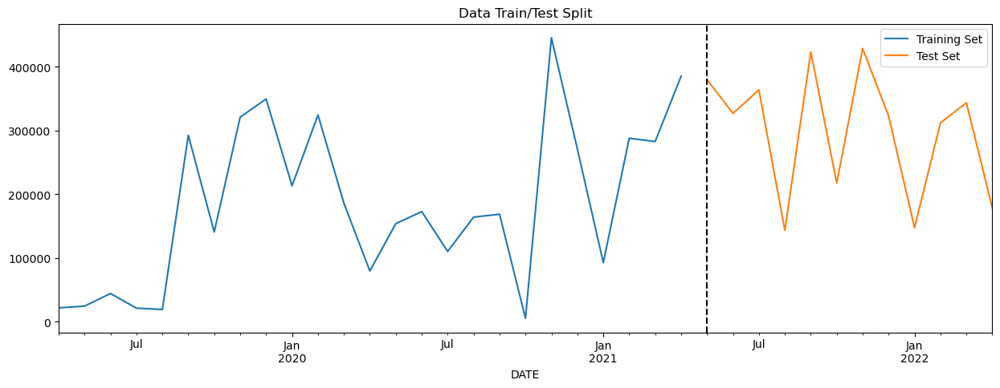

In [283]:
# DATA PARTITION

# Create the Target
y12 = X12['Sales_EUR(t)']

# Split into train and test

y12_train, y12_test, X12_train, X12_test = data_partition(y12, X12)

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [284]:
# Scaling the train and test data

X12_train_scaled, X12_test_scaled = scale(X12_train, X12_test)

### Model

In [285]:
reg12 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [286]:
reg12.fit(X12_train_scaled, y12_train,
        eval_set=[(X12_train_scaled, y12_train), (X12_test_scaled, y12_test)],
        verbose=100)

[23:23:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:220768.17692	validation_1-rmse:313293.11760
[100]	validation_0-rmse:96973.68123	validation_1-rmse:229416.08009
[200]	validation_0-rmse:45879.94957	validation_1-rmse:185864.76830
[300]	validation_0-rmse:23928.39432	validation_1-rmse:169964.19249
[400]	validation_0-rmse:13414.66056	validation_1-rmse:160396.53281
[500]	validation_0-rmse:7935.94083	validation_1-rmse:155761.23997
[600]	validation_0-rmse:4779.05996	validation_1-rmse:153911.09646
[700]	validation_0-rmse:2913.66394	validation_1-rmse:152940.39061
[800]	validation_0-rmse:1798.58786	validation_1-rmse:152153.90884
[900]	validation_0-rmse:1123.09701	validation_1-rmse:151787.42397
[999]	validation_0-rmse:701.60723	validation_1-rmse:151680.75832


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

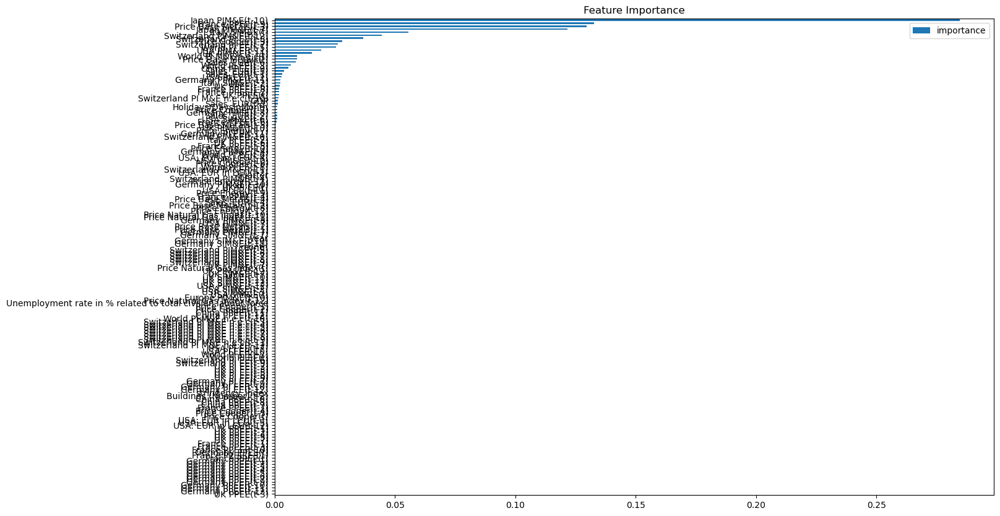

In [287]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg12.feature_importances_,
             index=reg12.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

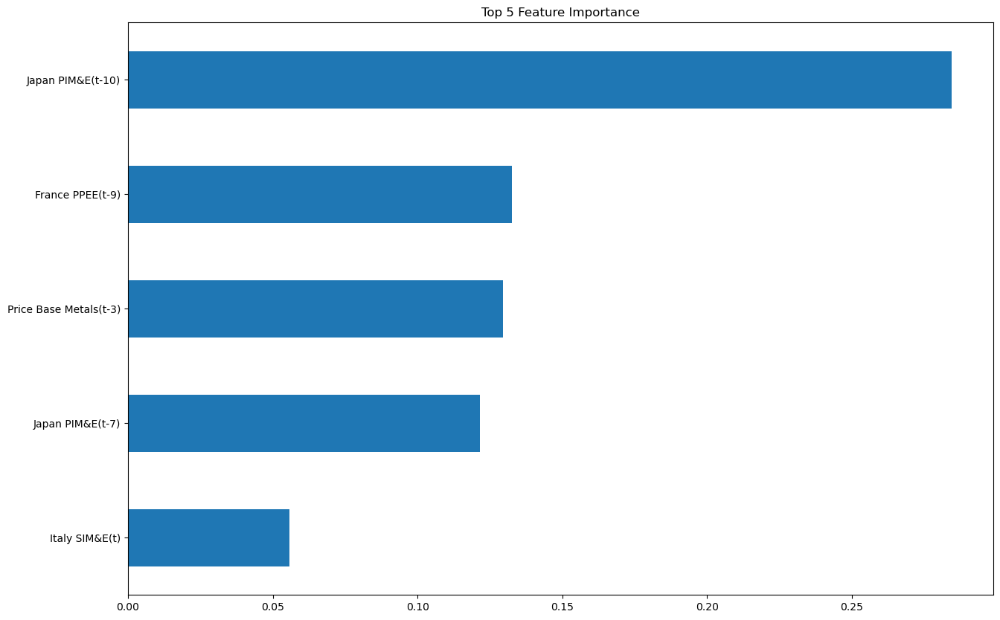

In [288]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg12.feature_importances_,
             index=reg12.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

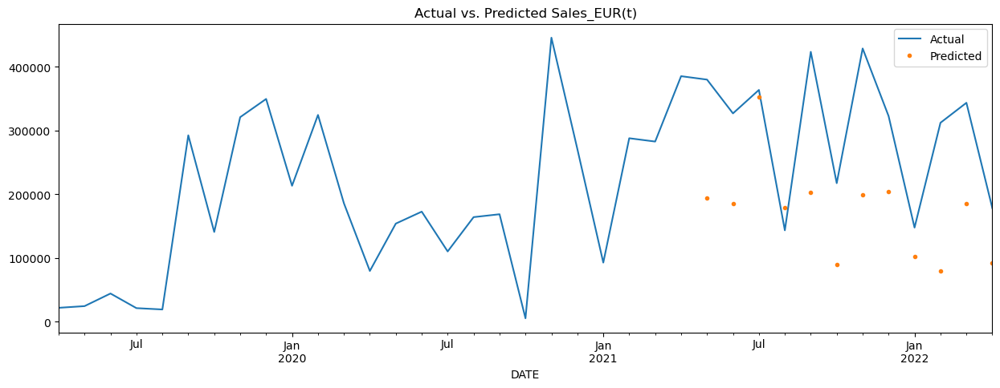

In [289]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results12 = pd.DataFrame({'actual': y12_test.values, 'predicted': y12_pred}, index=y12_test.index)

# Merge the new dataframe with the original dataframe X1:
X12_pred = X12.merge(results12, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X12_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X12_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [290]:
# SCORE (RMSE)
score12 = np.sqrt(mean_squared_error(y12_test, y12_pred))
print(f'RMSE Score on Test set: {score12:0.2f}')

RMSE Score on Test set: 151680.76


In [291]:
# Visualize predictions vs close values 
temp12 = y12_test.to_frame()
temp12['Prediction'] = y12_pred
temp12['Residual'] = y12_test - temp12.Prediction
temp12

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,379881.93,194711.187500,185170.742500
2021-06-30,326883.32,185754.031250,141129.288750
2021-07-31,363685.44,352501.250000,11184.190000
2021-08-31,143436.63,178573.625000,-35136.995000
2021-09-30,423432.68,203090.609375,220342.070625
2021-10-31,217388.43,89134.781250,128253.648750
2021-11-30,428753.94,198856.609375,229897.330625
2021-12-31,322647.82,204787.546875,117860.273125
2022-01-31,147680.18,101991.382812,45688.797187


### Predicting the future

In [292]:
# Retrain on all data

# Remove the Target from X
X12 = X12.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X12)
X12_scaled = scaler.transform(X12) 
X12_scaled = pd.DataFrame(X12_scaled, columns = X12.columns).set_index(X12.index)

reg12.fit(X12_scaled, y12,
        eval_set=[(X12_scaled, y12)],
        verbose=100)

[23:23:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:253788.90602
[100]	validation_0-rmse:106745.56401
[200]	validation_0-rmse:47658.06265
[300]	validation_0-rmse:22192.73120
[400]	validation_0-rmse:11227.06844
[500]	validation_0-rmse:6103.03859
[600]	validation_0-rmse:3598.68780
[700]	validation_0-rmse:2253.62209
[800]	validation_0-rmse:1475.13656
[900]	validation_0-rmse:939.18341
[999]	validation_0-rmse:595.32127


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [293]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X12_and_future = pd.concat([X12_original, future_df])
X12_and_future = create_features(X12_and_future)

In [294]:
# Lagged Sales: let's assign the values we already know

X12_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X12_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X12_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X12_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X12_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X12_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X12_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X12_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X12_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X12_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X12_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X12_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X12_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X12_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X12_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X12_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [295]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X12_and_future.update(forecast)

In [296]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_12], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X12_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet wit

INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to 

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet wit

INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to 

In [297]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '05-31-2022']
y12_test = y12.loc[y12.index == '05-31-2022']

X12_train = X12_and_future.loc[X12_and_future.index < '05-31-2022']
X12_test = X12_and_future.loc[X12_and_future.index == '05-31-2022']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y12_pred

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '06-30-2022']
y12_test = y12.loc[y12.index == '06-30-2022']

X12_train = X12_and_future.loc[X12_and_future.index < '06-30-2022']
X12_test = X12_and_future.loc[X12_and_future.index == '06-30-2022']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '07-31-2022']
y12_test = y12.loc[y12.index == '07-31-2022']

X12_train = X12_and_future.loc[X12_and_future.index < '07-31-2022']
X12_test = X12_and_future.loc[X12_and_future.index == '07-31-2022']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '08-31-2022']
y12_test = y12.loc[y12.index == '08-31-2022']

X12_train = X12_and_future.loc[X12_and_future.index < '08-31-2022']
X12_test = X12_and_future.loc[X12_and_future.index == '08-31-2022']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '09-30-2022']
y12_test = y12.loc[y12.index == '09-30-2022']

X12_train = X12_and_future.loc[X12_and_future.index < '09-30-2022']
X12_test = X12_and_future.loc[X12_and_future.index == '09-30-2022']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '10-31-2022']
y12_test = y12.loc[y12.index == '10-31-2022']

X12_train = X12_and_future.loc[X12_and_future.index < '10-31-2022']
X12_test = X12_and_future.loc[X12_and_future.index == '10-31-2022']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '11-30-2022']
y12_test = y12.loc[y12.index == '11-30-2022']

X12_train = X12_and_future.loc[X12_and_future.index < '11-30-2022']
X12_test = X12_and_future.loc[X12_and_future.index == '11-30-2022']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X12_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '12-31-2022']
y12_test = y12.loc[y12.index == '12-31-2022']

X12_train = X12_and_future.loc[X12_and_future.index < '12-31-2022']
X12_test = X12_and_future.loc[X12_and_future.index == '12-31-2022']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X12_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X12_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X12_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '01-31-2023']
y12_test = y12.loc[y12.index == '01-31-2023']

X12_train = X12_and_future.loc[X12_and_future.index < '01-31-2023']
X12_test = X12_and_future.loc[X12_and_future.index == '01-31-2023']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X12_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X12_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X12_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X12_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X12_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X12_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X12_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y12 = X12_and_future['Sales_EUR(t)']

# Split into train and test
y12_train = y12.loc[y12.index < '02-28-2023']
y12_test = y12.loc[y12.index == '02-28-2023']

X12_train = X12_and_future.loc[X12_and_future.index < '02-28-2023']
X12_test = X12_and_future.loc[X12_and_future.index == '02-28-2023']

# Remove the Target from X
X12_train = X12_train.drop(labels=['Sales_EUR(t)'],axis=1)
X12_test = X12_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y12_pred = reg12.predict(X12_test)

X12_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y12_pred
X12_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X12_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X12_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X12_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X12_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X12_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X12_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X12_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X12_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X12_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X12_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X12_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [298]:
X12_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Germany PI EE(t-7),Germany PI EE(t-9),Germany PI EE(t-10),Germany PI EE(t-11),Germany PI EE(t-12),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,28686.33000,1070.00000,17880.600000,21484.000000,34214.740000,10118.000000,21813.270000,2,4,2019,...,110.872368,111.181778,116.751183,106.746880,108.706490,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,1070.00000,17880.60000,21484.000000,34214.740000,10118.000000,21813.270000,24468.000000,2,5,2019,...,118.298233,111.284912,111.181778,116.751183,106.746880,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,17880.60000,21484.00000,34214.740000,10118.000000,21813.270000,24468.000000,44255.680000,2,6,2019,...,117.163727,110.872368,111.284912,111.181778,116.751183,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,21484.00000,34214.74000,10118.000000,21813.270000,24468.000000,44255.680000,21318.480000,3,7,2019,...,89.626122,118.298233,110.872368,111.284912,111.181778,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,34214.74000,10118.00000,21813.270000,24468.000000,44255.680000,21318.480000,19217.000000,3,8,2019,...,105.406097,117.163727,118.298233,110.872368,111.284912,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,10118.00000,21813.27000,24468.000000,44255.680000,21318.480000,19217.000000,292490.400000,3,9,2019,...,103.652771,89.626122,117.163727,118.298233,110.872368,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,21813.27000,24468.00000,44255.680000,21318.480000,19217.000000,292490.400000,140819.690000,4,10,2019,...,111.388054,105.406097,89.626122,117.163727,118.298233,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,24468.00000,44255.68000,21318.480000,19217.000000,292490.400000,140819.690000,320942.280000,4,11,2019,...,102.518265,103.652771,105.406097,89.626122,117.163727,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,44255.68000,21318.48000,19217.000000,292490.400000,140819.690000,320942.280000,349515.290000,4,12,2019,...,107.468842,111.388054,103.652771,105.406097,89.626122,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,21318.48000,19217.00000,292490.400000,140819.690000,320942.280000,349515.290000,213315.320000,1,1,2020,...,95.814354,102.518265,111.388054,103.652771,105.406097,0.129032,1.533793,12410.000000,874.050000,5.300000


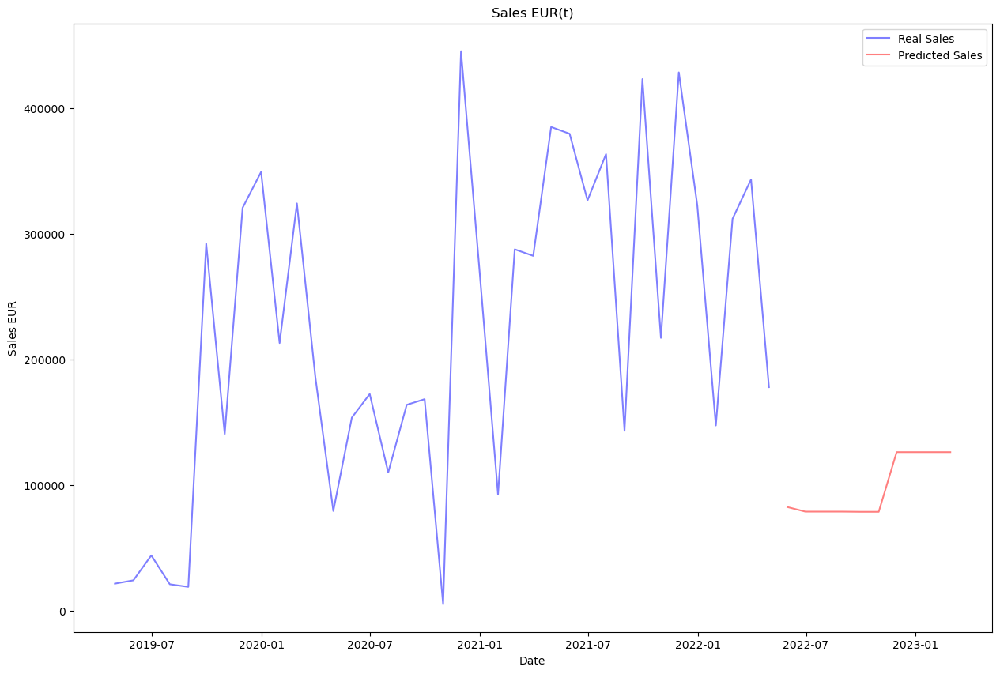

In [299]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X12_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X12_and_future['Sales_EUR(t)'].where(X12_and_future.index < '2022-05-31', other=None)
y_pred = X12_and_future['Sales_EUR(t)'].where(X12_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [300]:
# Create pandas dataframe with test set results

y12_test_pred = X12_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y12_test_pred

,Sales_EUR(t)
2022-05-31,82742.531250
2022-06-30,79111.250000
2022-07-31,79111.250000
2022-08-31,79111.250000
2022-09-30,78968.187500
2022-10-31,78971.367188
2022-11-30,126464.710938
2022-12-31,126464.710938
2023-01-31,126464.710938
2023-02-28,126464.710938


## 3.10. GCK #13

In [301]:
# Create a modeling dataset from the original dataset
X13 = pd.DataFrame(index=df_sales_grouped_13.index, data={'Sales_EUR': df_sales_grouped_13['Sales_EUR'].values})
X13 = X13.sort_index(ascending=True)
X13.head()

,Sales_EUR
DATE,
2018-10-31,27666.10
2018-11-30,68180.00
2018-12-31,15655.18
2019-01-31,27198.29
2019-02-28,32638.63


### Selecting best market lag features for this GCK

In [302]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_13 = df_market_filtered_lag_trial.join(X13['Sales_EUR'], how='right')

In [303]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_13['Sales_EUR'], df_market_filtered_lag_trial_13[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df13_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df13_correlations.loc[col, lag] = corr

df13_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,0.244944,-0.032515,0.033847,0.166639,0.144527,0.086448,0.009887,0.055114,0.168823,-0.025259,-0.123948,0.051772,0.176115
France SIM&E,0.206974,-0.057154,0.022134,0.140083,0.091791,0.061508,-0.014491,0.003393,0.127813,0.036924,-0.176933,0.007063,0.174175
Germany PIM&E,0.308309,0.055879,0.199201,0.175014,0.173328,0.0632,0.0192,0.021612,0.025694,-0.006012,0.090379,0.229741,0.294684
Germany SIM&E,0.255077,0.016604,0.169864,0.145637,0.136457,0.038706,0.010029,-0.027721,-0.027905,-0.029902,0.054451,0.178761,0.227888
Italy PIM&E,0.191243,-0.078284,-0.064111,0.143386,0.231105,0.153568,-0.011318,0.056164,0.234139,-0.037502,-0.192781,-0.096114,0.072117
Italy SIM&E,0.13986,-0.076682,0.021474,0.188018,0.077823,0.038429,-0.061067,-0.012533,0.062013,-0.066722,-0.09387,-0.050592,0.061292
Japan PIM&E,0.238376,-0.050047,0.091965,0.139448,-0.000285,-0.015373,0.080201,0.15934,0.070684,0.008203,0.124319,0.227761,0.203336
Switzerland PIM&E,0.339006,0.276444,0.173044,0.048051,-0.046518,-0.05049,-0.048498,-0.025539,0.054916,0.193438,0.297959,0.287411,0.361045
UK PIM&E,0.315989,0.005759,0.132119,0.179485,0.209692,0.130116,0.05899,0.029939,0.020913,-0.097933,-0.187665,0.080249,0.261428
UK SIM&E,0.380313,0.217003,0.235817,0.196224,0.277665,0.153682,0.016934,0.110121,0.081605,-0.158484,-0.166395,0.17031,0.261287


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [304]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_13 = df13_correlations[(df13_correlations >= 0.3) | (df13_correlations <= -0.3)]
filtered_df_correlations_13

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany PIM&E,0.308309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Switzerland PIM&E,0.339006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.361045
UK PIM&E,0.315989,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK SIM&E,0.380313,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [305]:
# let's create a list with those selected features

selected_market_lags_13 = []
for col, lag in filtered_df_correlations_13.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_13.append(feature_name)

selected_market_lags_13

['Germany PIM&E(t-1)',
 'Switzerland PIM&E(t-1)',
 'Switzerland PIM&E(t)',
 'UK PIM&E(t-1)',
 'UK SIM&E(t-1)',
 'Price Natural Gas Index(t-12)',
 'Switzerland PI EE(t-1)',
 'Switzerland PI EE(t-11)',
 'Switzerland PI EE(t-12)',
 'Switzerland PI EE(t)',
 'Germany PI EE(t-5)']

In [306]:
# Create features
X13 = create_data(X13, selected_market_lags_13)
X13.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Switzerland PI EE(t-1),Switzerland PI EE(t-11),Switzerland PI EE(t-12),Switzerland PI EE(t),Germany PI EE(t-5),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,27666.10,68180.00,15655.18,27198.29,32638.63,11890.00,7488.54,2,4,2019,...,98.061466,95.098503,98.092987,95.539795,117.163727,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,68180.00,15655.18,27198.29,32638.63,11890.00,7488.54,2550.31,2,5,2019,...,95.539795,92.104019,95.098503,93.018125,89.626122,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,15655.18,27198.29,32638.63,11890.00,7488.54,2550.31,34849.21,2,6,2019,...,93.018125,98.471237,92.104019,90.496454,105.406097,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,27198.29,32638.63,11890.00,7488.54,2550.31,34849.21,43008.35,3,7,2019,...,90.496454,104.838455,98.471237,97.557132,103.652771,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,32638.63,11890.00,7488.54,2550.31,34849.21,43008.35,22497.60,3,8,2019,...,97.557132,111.205674,104.838455,104.617809,111.388054,1.000000,0.0,12803.0,872.30,5.1


In [307]:
X13_original = X13.copy()

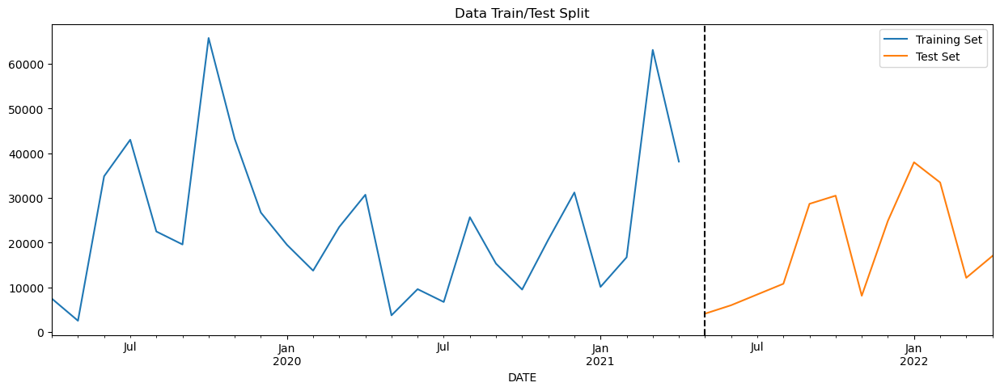

In [308]:
# DATA PARTITION

# Create the Target
y13 = X13['Sales_EUR(t)']

# Split into train and test

y13_train, y13_test, X13_train, X13_test = data_partition(y13, X13)

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [309]:
# Scaling the train and test data

X13_train_scaled, X13_test_scaled = scale(X13_train, X13_test)

### Model

In [310]:
reg13 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [311]:
reg13.fit(X13_train_scaled, y13_train,
        eval_set=[(X13_train_scaled, y13_train), (X13_test_scaled, y13_test)],
        verbose=100)

[23:35:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:28983.02792	validation_1-rmse:21557.42798
[100]	validation_0-rmse:13733.32843	validation_1-rmse:11955.53275
[173]	validation_0-rmse:8186.76333	validation_1-rmse:12161.71651


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

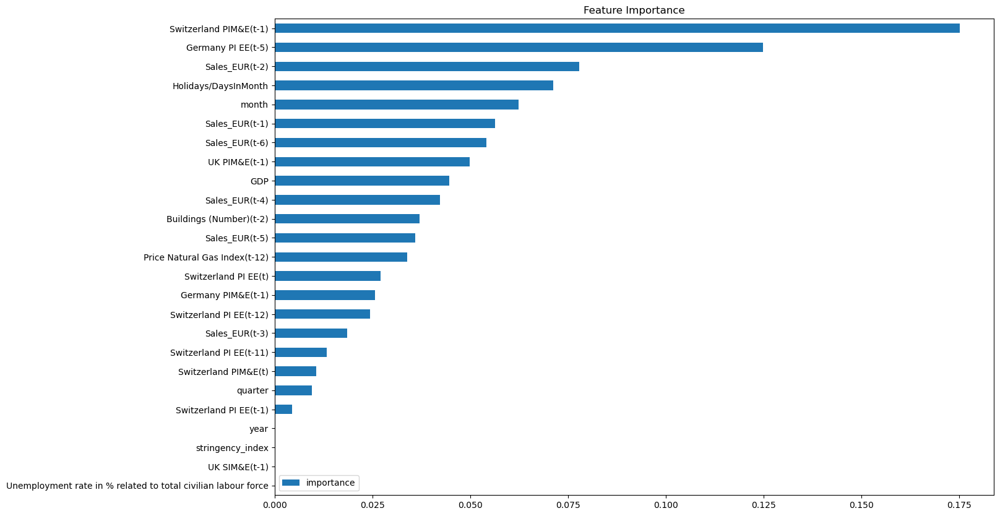

In [312]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg13.feature_importances_,
             index=reg13.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

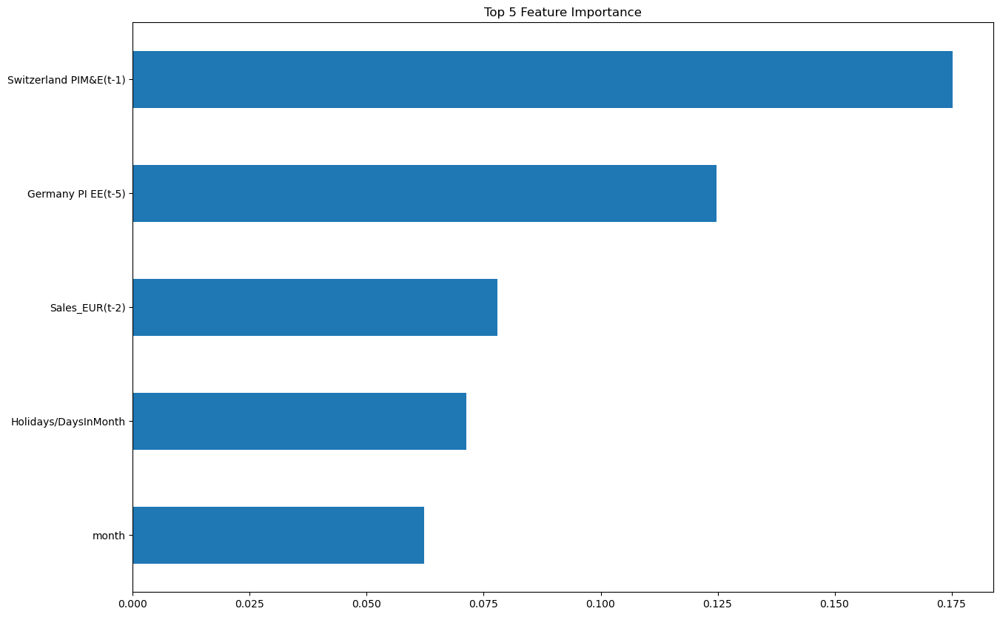

In [313]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg13.feature_importances_,
             index=reg13.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

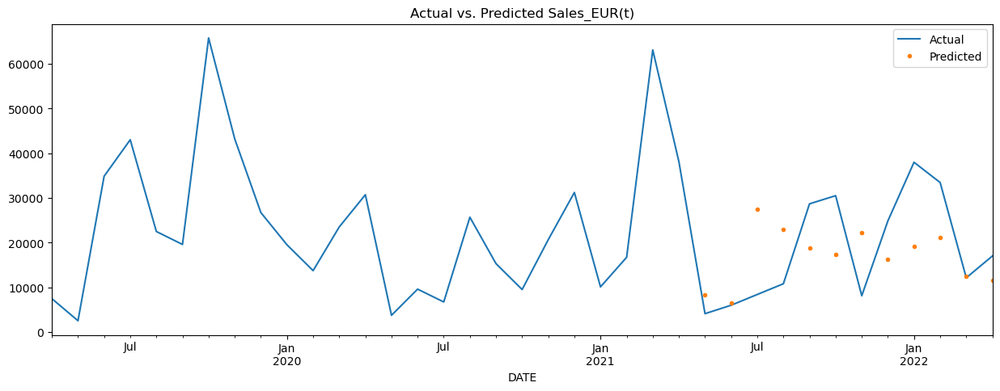

In [314]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results13 = pd.DataFrame({'actual': y13_test.values, 'predicted': y13_pred}, index=y13_test.index)

# Merge the new dataframe with the original dataframe X1:
X13_pred = X13.merge(results13, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X13_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X13_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [315]:
# SCORE (RMSE)
score13 = np.sqrt(mean_squared_error(y13_test, y13_pred))
print(f'RMSE Score on Test set: {score13:0.2f}')

RMSE Score on Test set: 11579.37


In [316]:
# Visualize predictions vs close values 
temp13 = y13_test.to_frame()
temp13['Prediction'] = y13_pred
temp13['Residual'] = y13_test - temp13.Prediction
temp13

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,4130.00,8349.643555,-4219.643555
2021-06-30,6015.04,6528.700684,-513.660684
2021-07-31,8419.83,27502.488281,-19082.658281
2021-08-31,10814.57,22929.156250,-12114.586250
2021-09-30,28682.59,18877.011719,9805.578281
2021-10-31,30506.15,17277.109375,13229.040625
2021-11-30,8136.92,22263.832031,-14126.912031
2021-12-31,24868.86,16230.453125,8638.406875
2022-01-31,37972.81,19169.501953,18803.308047


### Predicting the future

In [317]:
# Retrain on all data

# Remove the Target from X
X13 = X13.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X13)
X13_scaled = scaler.transform(X13) 
X13_scaled = pd.DataFrame(X13_scaled, columns = X13.columns).set_index(X13.index)

reg13.fit(X13_scaled, y13,
        eval_set=[(X13_scaled, y13)],
        verbose=100)

[23:35:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:26802.92793
[100]	validation_0-rmse:12619.73639
[200]	validation_0-rmse:6620.52994
[300]	validation_0-rmse:4057.07749
[400]	validation_0-rmse:2617.39729
[500]	validation_0-rmse:1665.68095
[600]	validation_0-rmse:1050.18162
[700]	validation_0-rmse:666.09952
[800]	validation_0-rmse:428.98943
[900]	validation_0-rmse:284.94601
[999]	validation_0-rmse:190.67827


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [318]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X13_and_future = pd.concat([X13_original, future_df])
X13_and_future = create_features(X13_and_future)

In [319]:
# Lagged Sales: let's assign the values we already know

X13_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X13_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X13_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X13_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X13_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X13_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X13_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X13_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X13_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X13_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X13_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X13_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X13_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X13_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X13_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X13_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [320]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X13_and_future.update(forecast)

In [321]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_13], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X13_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [322]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '05-31-2022']
y13_test = y13.loc[y13.index == '05-31-2022']

X13_train = X13_and_future.loc[X13_and_future.index < '05-31-2022']
X13_test = X13_and_future.loc[X13_and_future.index == '05-31-2022']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y13_pred

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '06-30-2022']
y13_test = y13.loc[y13.index == '06-30-2022']

X13_train = X13_and_future.loc[X13_and_future.index < '06-30-2022']
X13_test = X13_and_future.loc[X13_and_future.index == '06-30-2022']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '07-31-2022']
y13_test = y13.loc[y13.index == '07-31-2022']

X13_train = X13_and_future.loc[X13_and_future.index < '07-31-2022']
X13_test = X13_and_future.loc[X13_and_future.index == '07-31-2022']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '08-31-2022']
y13_test = y13.loc[y13.index == '08-31-2022']

X13_train = X13_and_future.loc[X13_and_future.index < '08-31-2022']
X13_test = X13_and_future.loc[X13_and_future.index == '08-31-2022']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '09-30-2022']
y13_test = y13.loc[y13.index == '09-30-2022']

X13_train = X13_and_future.loc[X13_and_future.index < '09-30-2022']
X13_test = X13_and_future.loc[X13_and_future.index == '09-30-2022']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '10-31-2022']
y13_test = y13.loc[y13.index == '10-31-2022']

X13_train = X13_and_future.loc[X13_and_future.index < '10-31-2022']
X13_test = X13_and_future.loc[X13_and_future.index == '10-31-2022']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '11-30-2022']
y13_test = y13.loc[y13.index == '11-30-2022']

X13_train = X13_and_future.loc[X13_and_future.index < '11-30-2022']
X13_test = X13_and_future.loc[X13_and_future.index == '11-30-2022']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X13_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '12-31-2022']
y13_test = y13.loc[y13.index == '12-31-2022']

X13_train = X13_and_future.loc[X13_and_future.index < '12-31-2022']
X13_test = X13_and_future.loc[X13_and_future.index == '12-31-2022']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X13_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X13_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X13_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '01-31-2023']
y13_test = y13.loc[y13.index == '01-31-2023']

X13_train = X13_and_future.loc[X13_and_future.index < '01-31-2023']
X13_test = X13_and_future.loc[X13_and_future.index == '01-31-2023']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X13_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X13_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X13_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X13_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X13_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X13_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X13_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y13 = X13_and_future['Sales_EUR(t)']

# Split into train and test
y13_train = y13.loc[y13.index < '02-28-2023']
y13_test = y13.loc[y13.index == '02-28-2023']

X13_train = X13_and_future.loc[X13_and_future.index < '02-28-2023']
X13_test = X13_and_future.loc[X13_and_future.index == '02-28-2023']

# Remove the Target from X
X13_train = X13_train.drop(labels=['Sales_EUR(t)'],axis=1)
X13_test = X13_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y13_pred = reg13.predict(X13_test)

X13_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y13_pred
X13_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X13_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X13_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X13_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X13_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X13_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X13_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X13_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X13_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X13_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X13_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X13_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [323]:
X13_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Switzerland PI EE(t-1),Switzerland PI EE(t-11),Switzerland PI EE(t-12),Switzerland PI EE(t),Germany PI EE(t-5),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,27666.100000,68180.000000,15655.180000,27198.290000,32638.630000,11890.000000,7488.540000,2,4,2019,...,98.061466,95.098503,98.092987,95.539795,117.163727,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,68180.000000,15655.180000,27198.290000,32638.630000,11890.000000,7488.540000,2550.310000,2,5,2019,...,95.539795,92.104019,95.098503,93.018125,89.626122,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,15655.180000,27198.290000,32638.630000,11890.000000,7488.540000,2550.310000,34849.210000,2,6,2019,...,93.018125,98.471237,92.104019,90.496454,105.406097,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,27198.290000,32638.630000,11890.000000,7488.540000,2550.310000,34849.210000,43008.350000,3,7,2019,...,90.496454,104.838455,98.471237,97.557132,103.652771,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,32638.630000,11890.000000,7488.540000,2550.310000,34849.210000,43008.350000,22497.600000,3,8,2019,...,97.557132,111.205674,104.838455,104.617809,111.388054,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,11890.000000,7488.540000,2550.310000,34849.210000,43008.350000,22497.600000,19601.050000,3,9,2019,...,104.617809,112.970843,111.205674,111.678487,102.518265,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,7488.540000,2550.310000,34849.210000,43008.350000,22497.600000,19601.050000,65754.550000,4,10,2019,...,111.678487,114.736013,112.970843,113.033885,107.468842,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,2550.310000,34849.210000,43008.350000,22497.600000,19601.050000,65754.550000,43190.760000,4,11,2019,...,113.033885,116.501182,114.736013,114.389283,95.814354,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,34849.210000,43008.350000,22497.600000,19601.050000,65754.550000,43190.760000,26729.760000,4,12,2019,...,114.389283,110.354610,116.501182,115.744681,107.675117,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,43008.350000,22497.600000,19601.050000,65754.550000,43190.760000,26729.760000,19519.590000,1,1,2020,...,115.744681,104.208038,110.354610,110.228526,98.702187,0.129032,1.533793,12410.000000,874.050000,5.300000


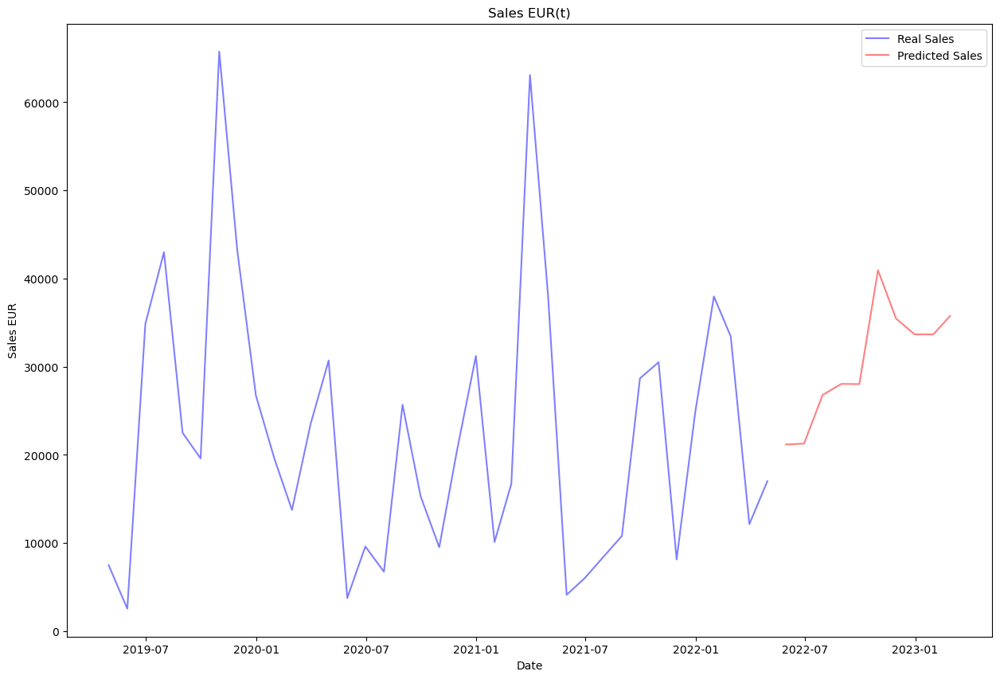

In [324]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X13_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X13_and_future['Sales_EUR(t)'].where(X13_and_future.index < '2022-05-31', other=None)
y_pred = X13_and_future['Sales_EUR(t)'].where(X13_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [325]:
# Create pandas dataframe with test set results

y13_test_pred = X13_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y13_test_pred

,Sales_EUR(t)
2022-05-31,21179.142578
2022-06-30,21280.078125
2022-07-31,26805.849609
2022-08-31,28052.167969
2022-09-30,28029.677734
2022-10-31,40952.398438
2022-11-30,35473.554688
2022-12-31,33667.398438
2023-01-31,33667.398438
2023-02-28,35758.925781


## 3.11. GCK #14

In [326]:
# Create a modeling dataset from the original dataset
X14 = pd.DataFrame(index=df_sales_grouped_14.index, data={'Sales_EUR': df_sales_grouped_14['Sales_EUR'].values})
X14 = X14.sort_index(ascending=True)
X14.head()

,Sales_EUR
DATE,
2018-10-31,5770.0
2018-11-30,17130.0
2018-12-31,0.0
2019-01-31,1686.4
2019-02-28,19196.3


### Selecting best market lag features for this GCK

In [327]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_14 = df_market_filtered_lag_trial.join(X14['Sales_EUR'], how='right')

In [328]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_14['Sales_EUR'], df_market_filtered_lag_trial_14[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df14_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df14_correlations.loc[col, lag] = corr

df14_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,0.038407,-0.129585,0.14281,0.169622,0.044491,-0.045948,-0.06038,0.281044,0.088031,-0.178102,-0.211327,0.242469,0.214777
France SIM&E,0.106959,-0.152883,0.203776,0.181431,0.040695,-0.025689,0.045217,0.201116,0.131344,-0.185591,-0.197464,0.161881,0.109760
Germany PIM&E,-0.0649,-0.184624,0.162024,0.161207,-0.132365,-0.067547,0.161858,0.244762,0.065062,-0.027402,-0.168824,0.171055,0.142889
Germany SIM&E,-0.035645,-0.136314,0.180891,0.135692,-0.132655,-0.024709,0.166138,0.217071,0.084335,-0.004725,-0.172071,0.21533,0.152283
Italy PIM&E,0.130249,-0.079982,0.085179,0.20163,0.078079,-0.128025,-0.169785,0.303925,0.019292,-0.121401,-0.240519,0.311605,0.316914
Italy SIM&E,0.018139,-0.083779,0.152039,0.051056,0.019302,-0.019289,0.093202,0.260916,0.042923,-0.081445,-0.205437,0.329812,0.285447
Japan PIM&E,-0.041045,-0.132988,0.266081,0.284893,-0.066124,-0.005633,0.010354,0.153519,0.058238,-0.135132,-0.111556,0.162885,0.239171
Switzerland PIM&E,-0.150421,-0.090244,-0.033261,0.019261,0.166031,0.260205,0.248124,0.132836,0.023324,-0.049202,-0.175159,-0.274029,-0.145951
UK PIM&E,-0.009701,-0.093285,0.11148,0.27961,-0.126046,-0.088678,0.048,0.186257,0.09989,-0.025924,-0.127332,0.161843,0.164064
UK SIM&E,-0.105543,-0.011438,0.097508,0.044474,-0.049652,-0.067174,0.073712,0.147823,0.056701,0.003881,-0.122151,0.043997,0.060902


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [329]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_14 = df14_correlations[(df14_correlations >= 0.3) | (df14_correlations <= -0.3)]
filtered_df_correlations_14

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.303925,NaN,NaN,NaN,0.311605,0.316914
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.329812,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [330]:
# let's create a list with those selected features

selected_market_lags_14 = []
for col, lag in filtered_df_correlations_14.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_14.append(feature_name)

selected_market_lags_14

['Italy PIM&E(t-8)',
 'Italy PIM&E(t-12)',
 'Italy PIM&E(t)',
 'Italy SIM&E(t-12)',
 'Europe PIM&E(t-8)',
 'World PI EE(t-8)',
 'Switzerland PI EE(t-1)',
 'Switzerland PI EE(t-7)',
 'Switzerland PI EE(t-12)',
 'Switzerland PI EE(t)',
 'Italy PI EE(t-8)',
 'Italy PI EE(t-12)',
 'Germany PI EE(t-4)',
 'Germany PI EE(t-8)']

In [331]:
# Create features
X14 = create_data(X14, selected_market_lags_14)
X14.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Switzerland PI EE(t),Italy PI EE(t-8),Italy PI EE(t-12),Germany PI EE(t-4),Germany PI EE(t-8),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,5770.0,17130.00,0.00,1686.40,19196.30,7535.25,0.00,2,4,2019,...,95.539795,46.917637,76.781204,89.626122,111.284912,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,17130.0,0.00,1686.40,19196.30,7535.25,0.00,17771.40,2,5,2019,...,93.018125,85.194542,89.818092,105.406097,110.872368,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,0.0,1686.40,19196.30,7535.25,0.00,17771.40,63017.71,2,6,2019,...,90.496454,93.001511,89.439110,103.652771,118.298233,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,1686.4,19196.30,7535.25,0.00,17771.40,63017.71,20719.30,3,7,2019,...,97.557132,84.133400,90.803436,111.388054,117.163727,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,19196.3,7535.25,0.00,17771.40,63017.71,20719.30,1602.00,3,8,2019,...,104.617809,64.881248,46.917637,102.518265,89.626122,1.000000,0.0,12803.0,872.30,5.1


In [332]:
X14_original = X14.copy()

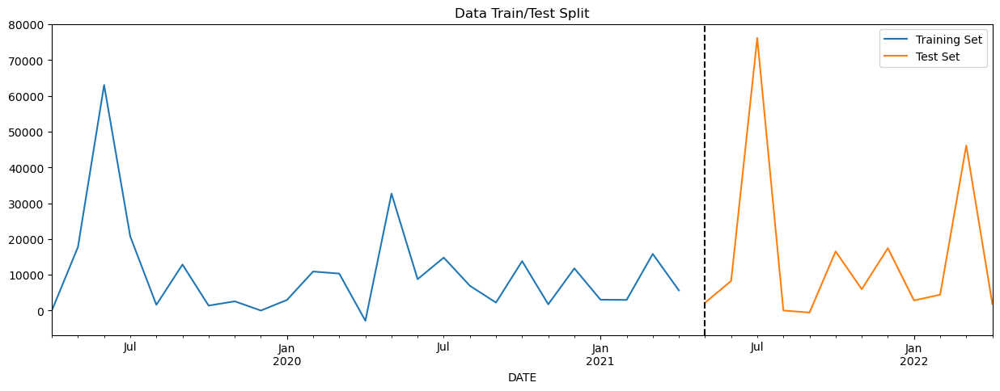

In [333]:
# DATA PARTITION

# Create the Target
y14 = X14['Sales_EUR(t)']

# Split into train and test

y14_train, y14_test, X14_train, X14_test = data_partition(y14, X14)

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [334]:
# Scaling the train and test data

X14_train_scaled, X14_test_scaled = scale(X14_train, X14_test)

### Model

In [335]:
reg14 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [336]:
reg14.fit(X14_train_scaled, y14_train,
        eval_set=[(X14_train_scaled, y14_train), (X14_test_scaled, y14_test)],
        verbose=100)

[23:36:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:16841.19317	validation_1-rmse:26814.72234
[100]	validation_0-rmse:9222.08703	validation_1-rmse:24054.53807
[200]	validation_0-rmse:5448.80576	validation_1-rmse:23529.78212
[300]	validation_0-rmse:3328.71696	validation_1-rmse:23235.40329
[400]	validation_0-rmse:2091.67231	validation_1-rmse:23145.91572
[500]	validation_0-rmse:1330.54745	validation_1-rmse:23109.13515
[600]	validation_0-rmse:832.13178	validation_1-rmse:22912.26797
[700]	validation_0-rmse:525.86447	validation_1-rmse:22788.40571
[800]	validation_0-rmse:335.65105	validation_1-rmse:22701.13534
[900]	validation_0-rmse:214.72461	validation_1-rmse:22645.18464
[999]	validation_0-rmse:139.47727	validation_1-rmse:22626.98218


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

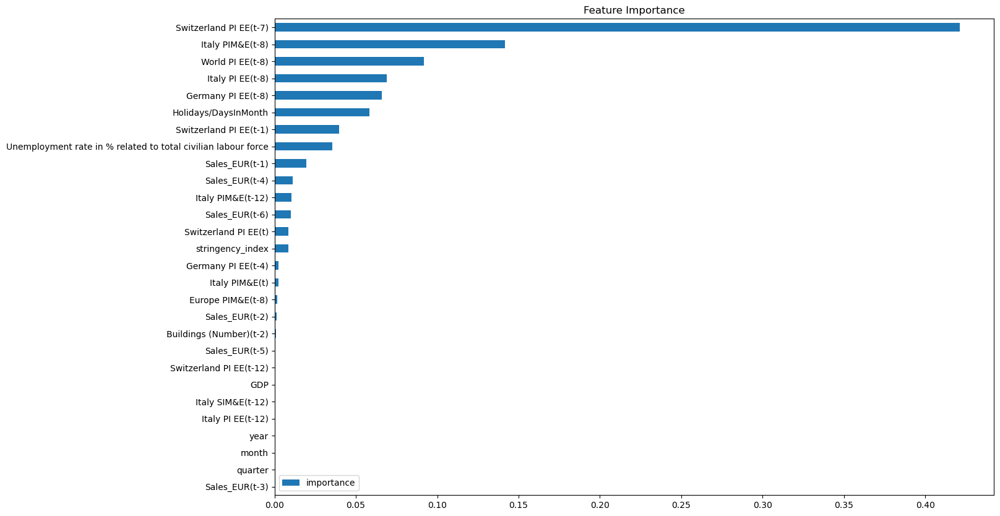

In [337]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg14.feature_importances_,
             index=reg14.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

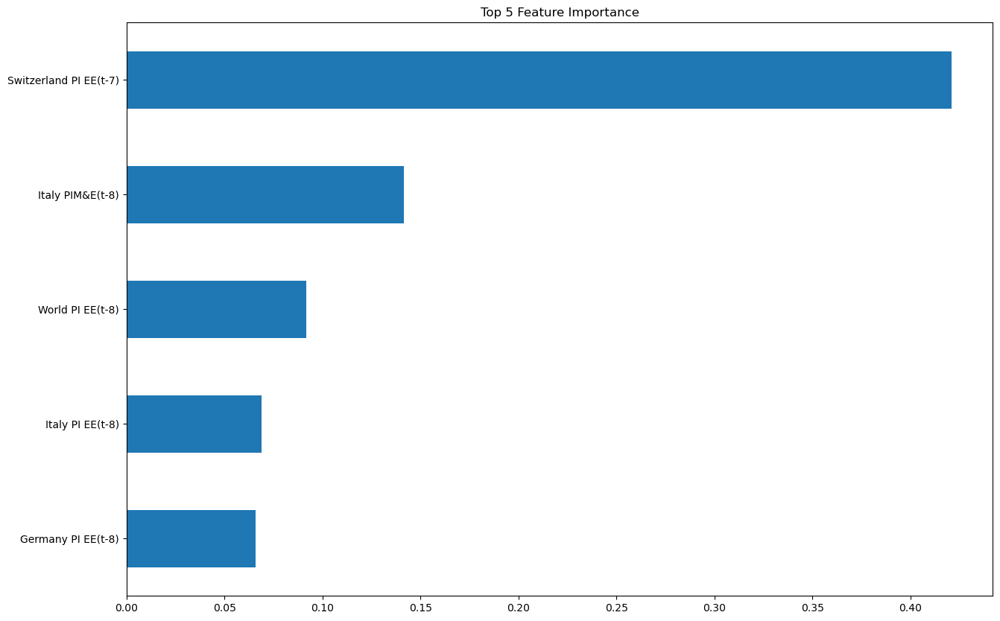

In [338]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg14.feature_importances_,
             index=reg14.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

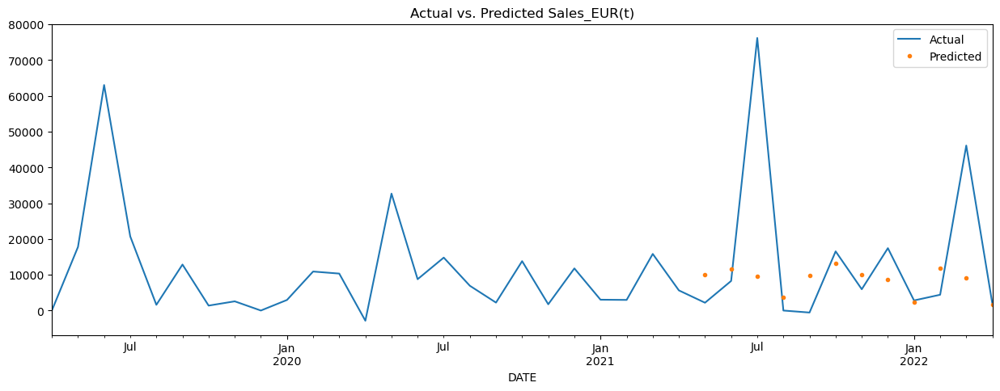

In [339]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results14 = pd.DataFrame({'actual': y14_test.values, 'predicted': y14_pred}, index=y14_test.index)

# Merge the new dataframe with the original dataframe X1:
X14_pred = X14.merge(results14, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X14_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X14_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [340]:
# SCORE (RMSE)
score14 = np.sqrt(mean_squared_error(y14_test, y14_pred))
print(f'RMSE Score on Test set: {score14:0.2f}')

RMSE Score on Test set: 22626.67


In [341]:
# Visualize predictions vs close values 
temp14 = y14_test.to_frame()
temp14['Prediction'] = y14_pred
temp14['Residual'] = y14_test - temp14.Prediction
temp14

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,2183.85,10031.905273,-7848.055273
2021-06-30,8266.90,11697.527344,-3430.627344
2021-07-31,76161.44,9673.636719,66487.803281
2021-08-31,0.00,3618.251953,-3618.251953
2021-09-30,-561.25,9794.552734,-10355.802734
2021-10-31,16534.20,13177.701172,3356.498828
2021-11-30,5951.85,10068.953125,-4117.103125
2021-12-31,17427.60,8683.255859,8744.344141
2022-01-31,2820.00,2411.239746,408.760254


### Predicting the future

In [342]:
# Retrain on all data

# Remove the Target from X
X14 = X14.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X14)
X14_scaled = scaler.transform(X14) 
X14_scaled = pd.DataFrame(X14_scaled, columns = X14.columns).set_index(X14.index)

reg14.fit(X14_scaled, y14,
        eval_set=[(X14_scaled, y14)],
        verbose=100)

[23:36:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:20528.49370
[100]	validation_0-rmse:10452.27202
[200]	validation_0-rmse:6074.58614
[300]	validation_0-rmse:3841.80058
[400]	validation_0-rmse:2462.41892
[500]	validation_0-rmse:1574.91622
[600]	validation_0-rmse:1046.51525
[700]	validation_0-rmse:725.65458
[800]	validation_0-rmse:508.24114
[900]	validation_0-rmse:352.56421
[999]	validation_0-rmse:245.65078


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [343]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X14_and_future = pd.concat([X14_original, future_df])
X14_and_future = create_features(X14_and_future)

In [344]:
# Lagged Sales: let's assign the values we already know

X14_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X14_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X14_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X14_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X14_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X14_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X14_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X14_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X14_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X14_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X14_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X14_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X14_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X14_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X14_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X14_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [345]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X14_and_future.update(forecast)

In [346]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_14], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X14_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [347]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '05-31-2022']
y14_test = y14.loc[y14.index == '05-31-2022']

X14_train = X14_and_future.loc[X14_and_future.index < '05-31-2022']
X14_test = X14_and_future.loc[X14_and_future.index == '05-31-2022']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y14_pred

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '06-30-2022']
y14_test = y14.loc[y14.index == '06-30-2022']

X14_train = X14_and_future.loc[X14_and_future.index < '06-30-2022']
X14_test = X14_and_future.loc[X14_and_future.index == '06-30-2022']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '07-31-2022']
y14_test = y14.loc[y14.index == '07-31-2022']

X14_train = X14_and_future.loc[X14_and_future.index < '07-31-2022']
X14_test = X14_and_future.loc[X14_and_future.index == '07-31-2022']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '08-31-2022']
y14_test = y14.loc[y14.index == '08-31-2022']

X14_train = X14_and_future.loc[X14_and_future.index < '08-31-2022']
X14_test = X14_and_future.loc[X14_and_future.index == '08-31-2022']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '09-30-2022']
y14_test = y14.loc[y14.index == '09-30-2022']

X14_train = X14_and_future.loc[X14_and_future.index < '09-30-2022']
X14_test = X14_and_future.loc[X14_and_future.index == '09-30-2022']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '10-31-2022']
y14_test = y14.loc[y14.index == '10-31-2022']

X14_train = X14_and_future.loc[X14_and_future.index < '10-31-2022']
X14_test = X14_and_future.loc[X14_and_future.index == '10-31-2022']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '11-30-2022']
y14_test = y14.loc[y14.index == '11-30-2022']

X14_train = X14_and_future.loc[X14_and_future.index < '11-30-2022']
X14_test = X14_and_future.loc[X14_and_future.index == '11-30-2022']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X14_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '12-31-2022']
y14_test = y14.loc[y14.index == '12-31-2022']

X14_train = X14_and_future.loc[X14_and_future.index < '12-31-2022']
X14_test = X14_and_future.loc[X14_and_future.index == '12-31-2022']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X14_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X14_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X14_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '01-31-2023']
y14_test = y14.loc[y14.index == '01-31-2023']

X14_train = X14_and_future.loc[X14_and_future.index < '01-31-2023']
X14_test = X14_and_future.loc[X14_and_future.index == '01-31-2023']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X14_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X14_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X14_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X14_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X14_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X14_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X14_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y14 = X14_and_future['Sales_EUR(t)']

# Split into train and test
y14_train = y14.loc[y14.index < '02-28-2023']
y14_test = y14.loc[y14.index == '02-28-2023']

X14_train = X14_and_future.loc[X14_and_future.index < '02-28-2023']
X14_test = X14_and_future.loc[X14_and_future.index == '02-28-2023']

# Remove the Target from X
X14_train = X14_train.drop(labels=['Sales_EUR(t)'],axis=1)
X14_test = X14_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y14_pred = reg14.predict(X14_test)

X14_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y14_pred
X14_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X14_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X14_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X14_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X14_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X14_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X14_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X14_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X14_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X14_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X14_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X14_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [348]:
X14_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,Switzerland PI EE(t),Italy PI EE(t-8),Italy PI EE(t-12),Germany PI EE(t-4),Germany PI EE(t-8),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,5770.000000,17130.000000,0.000000,1686.400000,19196.300000,7535.250000,0.000000,2,4,2019,...,95.539795,46.917637,76.781204,89.626122,111.284912,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,17130.000000,0.000000,1686.400000,19196.300000,7535.250000,0.000000,17771.400000,2,5,2019,...,93.018125,85.194542,89.818092,105.406097,110.872368,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,0.000000,1686.400000,19196.300000,7535.250000,0.000000,17771.400000,63017.710000,2,6,2019,...,90.496454,93.001511,89.439110,103.652771,118.298233,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,1686.400000,19196.300000,7535.250000,0.000000,17771.400000,63017.710000,20719.300000,3,7,2019,...,97.557132,84.133400,90.803436,111.388054,117.163727,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,19196.300000,7535.250000,0.000000,17771.400000,63017.710000,20719.300000,1602.000000,3,8,2019,...,104.617809,64.881248,46.917637,102.518265,89.626122,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,7535.250000,0.000000,17771.400000,63017.710000,20719.300000,1602.000000,12851.200000,3,9,2019,...,111.678487,81.556343,85.194542,107.468842,105.406097,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,0.000000,17771.400000,63017.710000,20719.300000,1602.000000,12851.200000,1378.550000,4,10,2019,...,113.033885,83.451233,93.001511,95.814354,103.652771,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,17771.400000,63017.710000,20719.300000,1602.000000,12851.200000,1378.550000,2571.300000,4,11,2019,...,114.389283,88.832741,84.133400,107.675117,111.388054,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,63017.710000,20719.300000,1602.000000,12851.200000,1378.550000,2571.300000,0.000000,4,12,2019,...,115.744681,75.947449,64.881248,98.702187,102.518265,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,20719.300000,1602.000000,12851.200000,1378.550000,2571.300000,0.000000,2955.220000,1,1,2020,...,110.228526,91.637192,81.556343,107.571976,107.468842,0.129032,1.533793,12410.000000,874.050000,5.300000


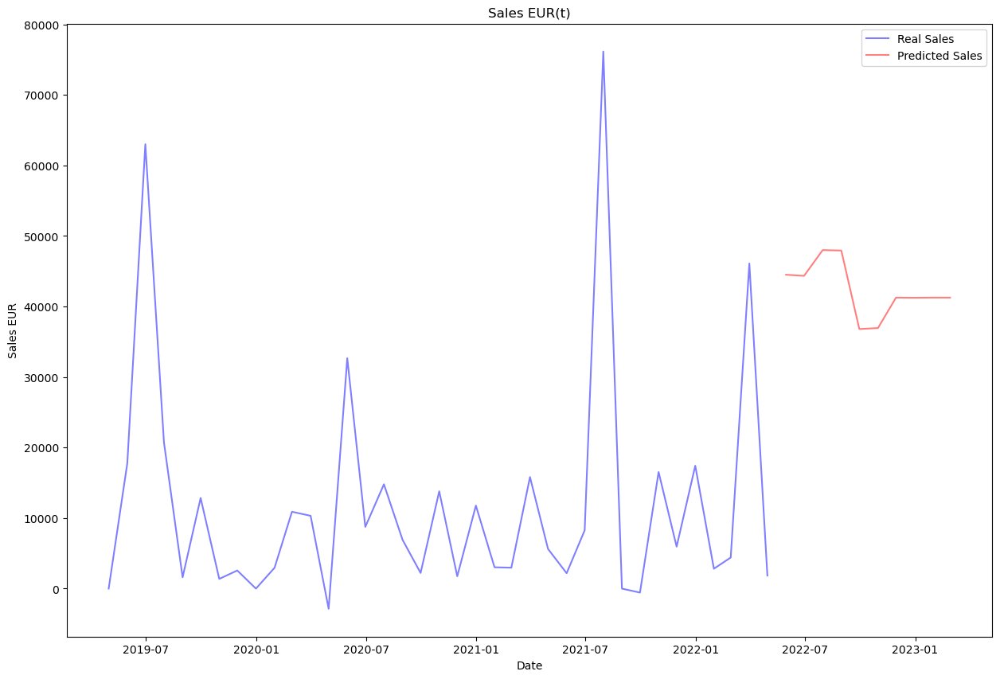

In [349]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X14_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X14_and_future['Sales_EUR(t)'].where(X14_and_future.index < '2022-05-31', other=None)
y_pred = X14_and_future['Sales_EUR(t)'].where(X14_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [350]:
# Create pandas dataframe with test set results

y14_test_pred = X14_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y14_test_pred

,Sales_EUR(t)
2022-05-31,44509.007812
2022-06-30,44352.929688
2022-07-31,48002.937500
2022-08-31,47941.160156
2022-09-30,36810.730469
2022-10-31,36948.906250
2022-11-30,41264.859375
2022-12-31,41241.832031
2023-01-31,41268.851562
2023-02-28,41264.859375


## 3.12. GCK #16

In [351]:
# Create a modeling dataset from the original dataset
X16 = pd.DataFrame(index=df_sales_grouped_16.index, data={'Sales_EUR': df_sales_grouped_16['Sales_EUR'].values})
X16 = X16.sort_index(ascending=True)
X16.head()

,Sales_EUR
DATE,
2018-10-31,333196.87
2018-11-30,1377694.32
2018-12-31,4762524.66
2019-01-31,942957.19
2019-02-28,257765.04


### Selecting best market lag features for this GCK

In [352]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_16 = df_market_filtered_lag_trial.join(X16['Sales_EUR'], how='right')

In [353]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_16['Sales_EUR'], df_market_filtered_lag_trial_16[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df16_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df16_correlations.loc[col, lag] = corr

df16_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,0.119253,0.222708,0.053129,-0.156439,0.22123,0.272553,-0.09515,0.132471,0.317511,0.038296,0.037113,0.192671,0.136107
France SIM&E,0.047269,0.116987,0.013517,-0.15204,0.072607,0.214854,-0.103315,0.01463,0.234986,-0.059578,-0.038142,0.153952,0.117211
Germany PIM&E,0.329419,0.262249,0.254081,0.219678,0.273482,0.35812,0.096579,0.189041,0.380336,0.07229,0.060656,0.405382,0.333935
Germany SIM&E,0.173158,0.118427,0.19415,0.108093,0.156288,0.323422,0.016726,0.091457,0.314959,-0.048716,-0.033368,0.387396,0.257405
Italy PIM&E,0.097046,0.204284,-0.011418,-0.192547,0.195297,0.2367,0.040241,0.151028,0.181406,0.13425,-0.027773,-0.019975,-0.020918
Italy SIM&E,0.016456,0.010732,0.019234,-0.237329,0.082168,0.168729,-0.063651,0.03497,0.111413,-0.060317,-0.164978,0.172066,0.107529
Japan PIM&E,0.100825,0.155799,0.231066,0.106111,0.237907,0.298917,0.037137,0.181472,0.488362,0.140333,0.059389,0.341945,0.221731
Switzerland PIM&E,0.398116,0.34606,0.317257,0.247841,0.189557,0.148231,0.162931,0.174694,0.172966,0.233305,0.299132,0.33539,0.436213
UK PIM&E,0.17054,0.182347,0.101431,0.106813,0.143738,0.181897,0.059937,0.120116,0.270882,0.051613,0.024468,0.12846,0.154019
UK SIM&E,0.289541,0.295101,0.16077,0.190601,0.226945,0.246968,0.140618,0.17651,0.344255,0.147199,0.10828,0.262713,0.204760


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [354]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_16 = df16_correlations[(df16_correlations >= 0.3) | (df16_correlations <= -0.3)]
filtered_df_correlations_16

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.317511,NaN,NaN,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Germany PIM&E,0.329419,NaN,NaN,NaN,NaN,0.35812,NaN,NaN,0.380336,NaN,NaN,0.405382,0.333935
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,0.323422,NaN,NaN,0.314959,NaN,NaN,0.387396,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.488362,NaN,NaN,0.341945,NaN
Switzerland PIM&E,0.398116,0.34606,0.317257,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.33539,0.436213
UK PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.344255,NaN,NaN,NaN,NaN


In [355]:
# let's create a list with those selected features

selected_market_lags_16 = []
for col, lag in filtered_df_correlations_16.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_16.append(feature_name)

selected_market_lags_16

['France PIM&E(t-9)',
 'Germany PIM&E(t-1)',
 'Germany PIM&E(t-6)',
 'Germany PIM&E(t-9)',
 'Germany PIM&E(t-12)',
 'Germany PIM&E(t)',
 'Germany SIM&E(t-6)',
 'Germany SIM&E(t-9)',
 'Germany SIM&E(t-12)',
 'Japan PIM&E(t-9)',
 'Japan PIM&E(t-12)',
 'Switzerland PIM&E(t-1)',
 'Switzerland PIM&E(t-2)',
 'Switzerland PIM&E(t-3)',
 'Switzerland PIM&E(t-12)',
 'Switzerland PIM&E(t)',
 'UK SIM&E(t-9)',
 'USA SIM&E(t-11)',
 'USA: EUR in LCU(t-8)',
 'USA: EUR in LCU(t-9)',
 'USA: EUR in LCU(t-10)',
 'USA: EUR in LCU(t-11)',
 'France PPEE(t-12)',
 'Germany PPEE(t-2)',
 'Germany PPEE(t-3)',
 'Germany PPEE(t-4)',
 'Germany PPEE(t-5)',
 'Germany PPEE(t-6)',
 'Germany PPEE(t-7)',
 'Germany PPEE(t-8)',
 'Germany PPEE(t-9)',
 'Germany PPEE(t-10)',
 'Germany PPEE(t-11)',
 'Germany PPEE(t-12)',
 'China PPEE(t-6)',
 'China PPEE(t-9)',
 'China PPEE(t-10)',
 'China PPEE(t-11)',
 'China PPEE(t-12)',
 'Switzerland PI M&E n.e.c(t-1)',
 'Switzerland PI M&E n.e.c(t-2)',
 'Switzerland PI M&E n.e.c(t-3)',
 'Swi

In [356]:
# Create features
X16 = create_data(X16, selected_market_lags_16)
X16.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,UK PI EE(t-8),UK PI EE(t-11),Germany PI EE(t-2),Germany PI EE(t-6),Germany PI EE(t-9),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,333196.87,1377694.32,4762524.66,942957.19,257765.04,2258352.22,224501.90,2,4,2019,...,105.737950,102.504740,103.652771,118.298233,111.181778,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,1377694.32,4762524.66,942957.19,257765.04,2258352.22,224501.90,353451.54,2,5,2019,...,110.288394,105.139208,111.388054,117.163727,111.284912,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,4762524.66,942957.19,257765.04,2258352.22,224501.90,353451.54,367425.38,2,6,2019,...,118.670791,103.462728,102.518265,89.626122,110.872368,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,942957.19,257765.04,2258352.22,224501.90,353451.54,367425.38,266225.86,3,7,2019,...,120.467019,105.737950,107.468842,105.406097,118.298233,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,257765.04,2258352.22,224501.90,353451.54,367425.38,266225.86,725678.33,3,8,2019,...,105.378705,110.288394,95.814354,103.652771,117.163727,1.000000,0.0,12803.0,872.30,5.1


In [357]:
X16_original = X16.copy()

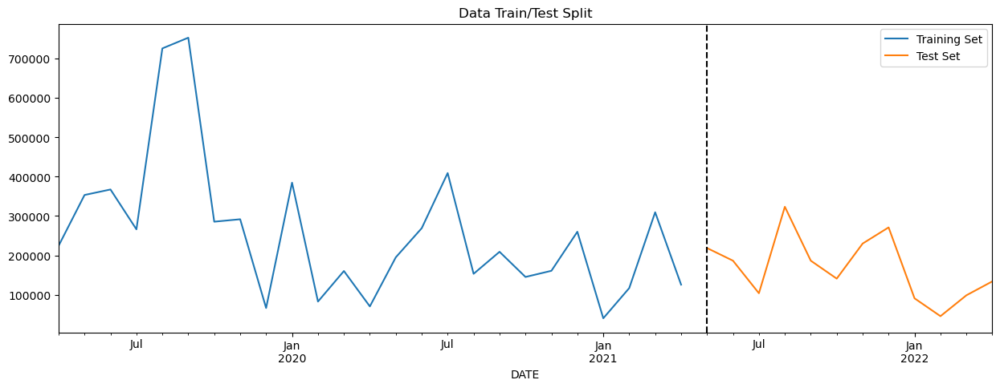

In [358]:
# DATA PARTITION

# Create the Target
y16 = X16['Sales_EUR(t)']

# Split into train and test

y16_train, y16_test, X16_train, X16_test = data_partition(y16, X16)

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [359]:
# Scaling the train and test data

X16_train_scaled, X16_test_scaled = scale(X16_train, X16_test)

### Model

In [360]:
reg16 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [361]:
reg16.fit(X16_train_scaled, y16_train,
        eval_set=[(X16_train_scaled, y16_train), (X16_test_scaled, y16_test)],
        verbose=100)

[23:37:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:308650.44307	validation_1-rmse:185415.85618
[100]	validation_0-rmse:147186.00846	validation_1-rmse:97834.67542
[190]	validation_0-rmse:79215.57547	validation_1-rmse:94636.11346


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

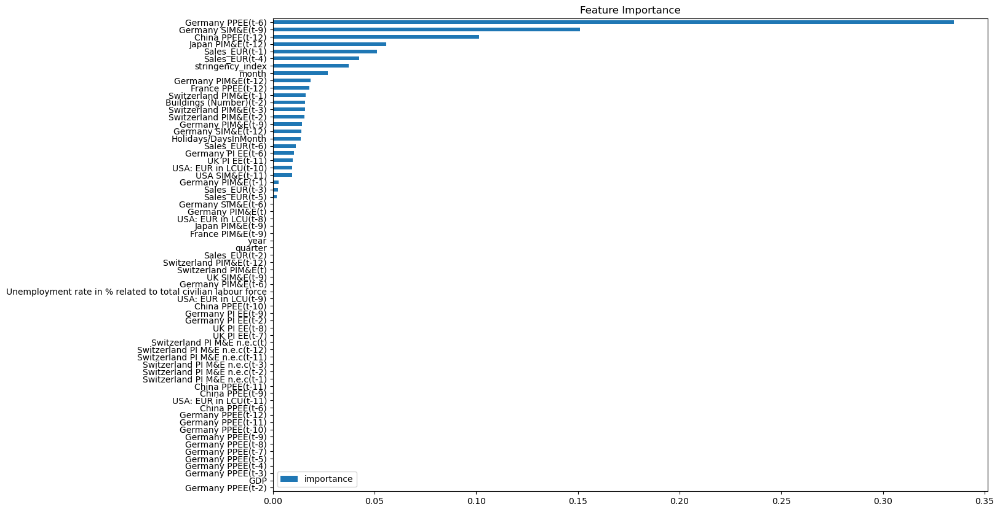

In [362]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg16.feature_importances_,
             index=reg16.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

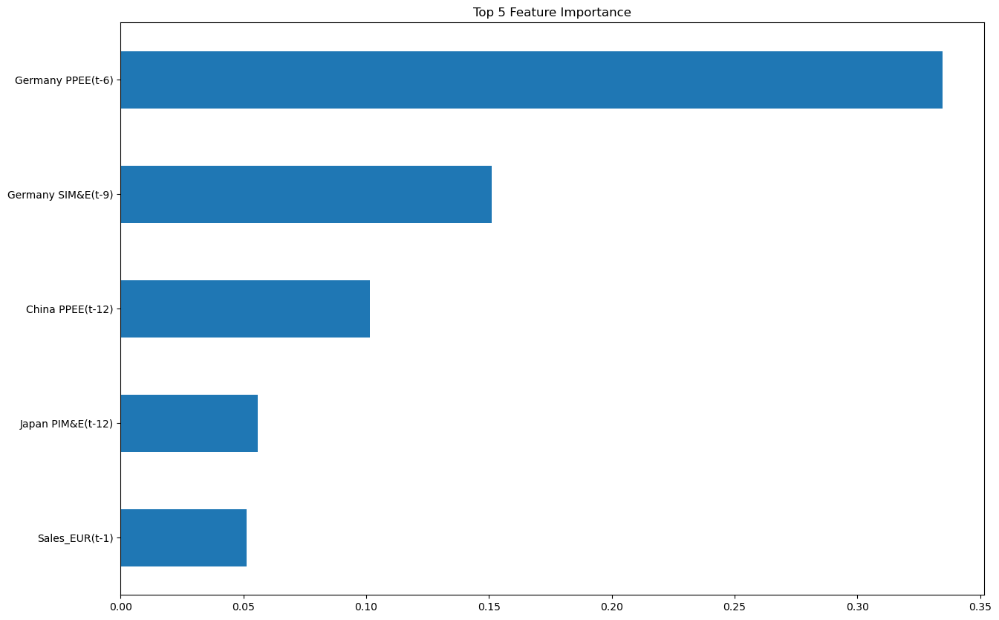

In [363]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg16.feature_importances_,
             index=reg16.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

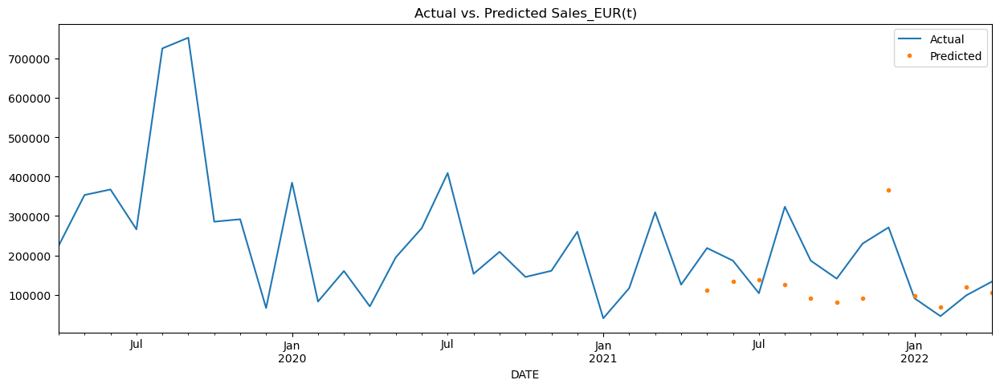

In [364]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results16 = pd.DataFrame({'actual': y16_test.values, 'predicted': y16_pred}, index=y16_test.index)

# Merge the new dataframe with the original dataframe X1:
X16_pred = X16.merge(results16, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X16_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X16_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [365]:
# SCORE (RMSE)
score16 = np.sqrt(mean_squared_error(y16_test, y16_pred))
print(f'RMSE Score on Test set: {score16:0.2f}')

RMSE Score on Test set: 89762.25


In [366]:
# Visualize predictions vs close values 
temp16 = y16_test.to_frame()
temp16['Prediction'] = y16_pred
temp16['Residual'] = y16_test - temp16.Prediction
temp16

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,218701.06,112566.671875,106134.388125
2021-06-30,186607.11,134552.546875,52054.563125
2021-07-31,103935.84,137984.796875,-34048.956875
2021-08-31,323548.03,125205.976562,198342.053438
2021-09-30,186586.24,92052.046875,94534.193125
2021-10-31,141037.06,81894.039062,59143.020937
2021-11-30,230129.08,92073.515625,138055.564375
2021-12-31,271111.39,365463.281250,-94351.891250
2022-01-31,91021.89,97586.093750,-6564.203750


### Predicting the future

In [367]:
# Retrain on all data

# Remove the Target from X
X16 = X16.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X16)
X16_scaled = scaler.transform(X16) 
X16_scaled = pd.DataFrame(X16_scaled, columns = X16.columns).set_index(X16.index)

reg16.fit(X16_scaled, y16,
        eval_set=[(X16_scaled, y16)],
        verbose=100)

[23:37:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:274696.70624
[100]	validation_0-rmse:131248.73687
[200]	validation_0-rmse:67643.48572
[300]	validation_0-rmse:38373.95817
[400]	validation_0-rmse:22923.10942
[500]	validation_0-rmse:14398.44282
[600]	validation_0-rmse:9147.03849
[700]	validation_0-rmse:5477.17580
[800]	validation_0-rmse:3573.62870
[900]	validation_0-rmse:2379.95283
[999]	validation_0-rmse:1606.95525


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [368]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X16_and_future = pd.concat([X16_original, future_df])
X16_and_future = create_features(X16_and_future)

In [369]:
# Lagged Sales: let's assign the values we already know

X16_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X16_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X16_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X16_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X16_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X16_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X16_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X16_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X16_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X16_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X16_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X16_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X16_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X16_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X16_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X16_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [370]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X16_and_future.update(forecast)

In [371]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_16], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X16_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet wit

In [372]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '05-31-2022']
y16_test = y16.loc[y16.index == '05-31-2022']

X16_train = X16_and_future.loc[X16_and_future.index < '05-31-2022']
X16_test = X16_and_future.loc[X16_and_future.index == '05-31-2022']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y16_pred

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '06-30-2022']
y16_test = y16.loc[y16.index == '06-30-2022']

X16_train = X16_and_future.loc[X16_and_future.index < '06-30-2022']
X16_test = X16_and_future.loc[X16_and_future.index == '06-30-2022']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '07-31-2022']
y16_test = y16.loc[y16.index == '07-31-2022']

X16_train = X16_and_future.loc[X16_and_future.index < '07-31-2022']
X16_test = X16_and_future.loc[X16_and_future.index == '07-31-2022']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '08-31-2022']
y16_test = y16.loc[y16.index == '08-31-2022']

X16_train = X16_and_future.loc[X16_and_future.index < '08-31-2022']
X16_test = X16_and_future.loc[X16_and_future.index == '08-31-2022']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '09-30-2022']
y16_test = y16.loc[y16.index == '09-30-2022']

X16_train = X16_and_future.loc[X16_and_future.index < '09-30-2022']
X16_test = X16_and_future.loc[X16_and_future.index == '09-30-2022']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '10-31-2022']
y16_test = y16.loc[y16.index == '10-31-2022']

X16_train = X16_and_future.loc[X16_and_future.index < '10-31-2022']
X16_test = X16_and_future.loc[X16_and_future.index == '10-31-2022']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '11-30-2022']
y16_test = y16.loc[y16.index == '11-30-2022']

X16_train = X16_and_future.loc[X16_and_future.index < '11-30-2022']
X16_test = X16_and_future.loc[X16_and_future.index == '11-30-2022']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X16_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '12-31-2022']
y16_test = y16.loc[y16.index == '12-31-2022']

X16_train = X16_and_future.loc[X16_and_future.index < '12-31-2022']
X16_test = X16_and_future.loc[X16_and_future.index == '12-31-2022']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X16_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X16_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X16_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '01-31-2023']
y16_test = y16.loc[y16.index == '01-31-2023']

X16_train = X16_and_future.loc[X16_and_future.index < '01-31-2023']
X16_test = X16_and_future.loc[X16_and_future.index == '01-31-2023']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X16_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X16_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X16_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X16_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X16_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X16_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X16_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y16 = X16_and_future['Sales_EUR(t)']

# Split into train and test
y16_train = y16.loc[y16.index < '02-28-2023']
y16_test = y16.loc[y16.index == '02-28-2023']

X16_train = X16_and_future.loc[X16_and_future.index < '02-28-2023']
X16_test = X16_and_future.loc[X16_and_future.index == '02-28-2023']

# Remove the Target from X
X16_train = X16_train.drop(labels=['Sales_EUR(t)'],axis=1)
X16_test = X16_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y16_pred = reg16.predict(X16_test)

X16_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y16_pred
X16_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X16_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X16_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X16_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X16_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X16_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X16_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X16_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X16_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X16_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X16_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X16_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [373]:
X16_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,UK PI EE(t-8),UK PI EE(t-11),Germany PI EE(t-2),Germany PI EE(t-6),Germany PI EE(t-9),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,3.331969e+05,1.377694e+06,4.762525e+06,9.429572e+05,2.577650e+05,2.258352e+06,224501.90000,2,4,2019,...,105.737950,102.504740,103.652771,118.298233,111.181778,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,1.377694e+06,4.762525e+06,9.429572e+05,2.577650e+05,2.258352e+06,2.245019e+05,353451.54000,2,5,2019,...,110.288394,105.139208,111.388054,117.163727,111.284912,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,4.762525e+06,9.429572e+05,2.577650e+05,2.258352e+06,2.245019e+05,3.534515e+05,367425.38000,2,6,2019,...,118.670791,103.462728,102.518265,89.626122,110.872368,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,9.429572e+05,2.577650e+05,2.258352e+06,2.245019e+05,3.534515e+05,3.674254e+05,266225.86000,3,7,2019,...,120.467019,105.737950,107.468842,105.406097,118.298233,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,2.577650e+05,2.258352e+06,2.245019e+05,3.534515e+05,3.674254e+05,2.662259e+05,725678.33000,3,8,2019,...,105.378705,110.288394,95.814354,103.652771,117.163727,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,2.258352e+06,2.245019e+05,3.534515e+05,3.674254e+05,2.662259e+05,7.256783e+05,752884.16000,3,9,2019,...,107.174933,118.670791,107.675117,111.388054,89.626122,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,2.245019e+05,3.534515e+05,3.674254e+05,2.662259e+05,7.256783e+05,7.528842e+05,285644.67000,4,10,2019,...,110.647640,120.467019,98.702187,102.518265,105.406097,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,3.534515e+05,3.674254e+05,2.662259e+05,7.256783e+05,7.528842e+05,2.856447e+05,291844.03000,4,11,2019,...,126.214949,105.378705,107.571976,107.468842,103.652771,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,3.674254e+05,2.662259e+05,7.256783e+05,7.528842e+05,2.856447e+05,2.918440e+05,66419.16000,4,12,2019,...,113.521605,107.174933,109.119034,95.814354,111.388054,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,2.662259e+05,7.256783e+05,7.528842e+05,2.856447e+05,2.918440e+05,6.641916e+04,384800.46000,1,1,2020,...,117.593055,110.647640,106.334335,107.675117,102.518265,0.129032,1.533793,12410.000000,874.050000,5.300000


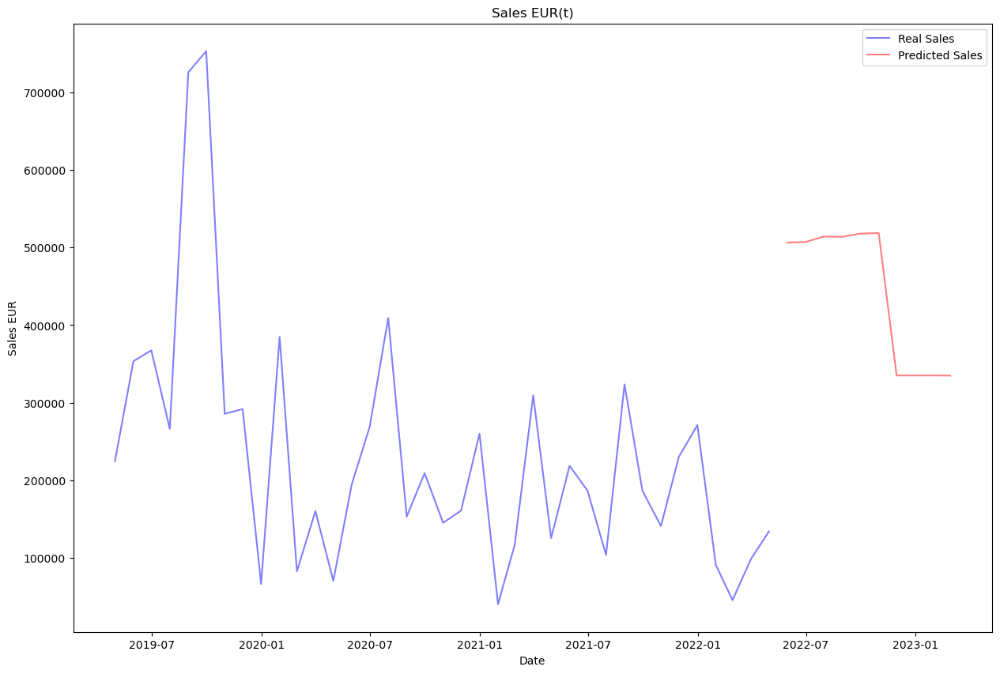

In [374]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X16_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X16_and_future['Sales_EUR(t)'].where(X16_and_future.index < '2022-05-31', other=None)
y_pred = X16_and_future['Sales_EUR(t)'].where(X16_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [375]:
# Create pandas dataframe with test set results

y16_test_pred = X16_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y16_test_pred

,Sales_EUR(t)
2022-05-31,506282.53125
2022-06-30,507004.28125
2022-07-31,514070.93750
2022-08-31,513707.18750
2022-09-30,517829.75000
2022-10-31,518536.21875
2022-11-30,335057.25000
2022-12-31,335057.25000
2023-01-31,335057.25000
2023-02-28,334915.21875


## 3.13. GCK #20

In [376]:
# Create a modeling dataset from the original dataset
X20 = pd.DataFrame(index=df_sales_grouped_20.index, data={'Sales_EUR': df_sales_grouped_20['Sales_EUR'].values})
X20 = X20.sort_index(ascending=True)
X20.head()

,Sales_EUR
DATE,
2018-10-31,4563.14
2018-11-30,5798.14
2018-12-31,918.65
2019-01-31,2398.04
2019-02-28,620.66


### Selecting best market lag features for this GCK

In [377]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_20 = df_market_filtered_lag_trial.join(X20['Sales_EUR'], how='right')

In [378]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_20['Sales_EUR'], df_market_filtered_lag_trial_20[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df20_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df20_correlations.loc[col, lag] = corr

df20_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,0.319997,-0.178548,-0.153975,-0.087923,-0.046948,-0.122107,-0.243956,-0.489177,-0.028142,0.061866,-0.148768,-0.050983,0.232653
France SIM&E,0.283549,-0.152379,-0.199304,0.003701,-0.099265,-0.164218,-0.300395,-0.503968,-0.161181,0.158638,-0.195069,-0.020561,0.266403
Germany PIM&E,0.28331,-0.232435,-0.255303,-0.065508,-0.054888,-0.236233,-0.129235,-0.352547,-0.080214,-0.027147,-0.092747,-0.006662,0.198968
Germany SIM&E,0.253979,-0.251559,-0.235879,-0.005352,-0.059572,-0.246429,-0.101955,-0.384718,-0.08823,0.013624,-0.086817,-0.015481,0.156344
Italy PIM&E,0.30931,-0.148103,-0.177599,-0.202315,0.089352,-0.07211,-0.226495,-0.491115,-0.00461,-0.021453,-0.00266,-0.087808,0.183314
Italy SIM&E,0.23079,-0.255042,-0.177749,0.037189,0.048284,-0.144044,-0.26276,-0.523,-0.079585,0.082785,0.021399,-0.005656,0.195131
Japan PIM&E,0.315611,-0.205944,-0.200913,-0.099147,-0.172248,-0.184458,-0.026158,-0.145937,0.008332,-0.053106,-0.235464,0.044735,0.122770
Switzerland PIM&E,-0.076889,-0.101516,-0.101966,-0.141358,-0.19994,-0.219466,-0.18099,-0.148123,-0.101511,-0.044076,0.024188,0.026588,-0.001492
UK PIM&E,0.303289,-0.195292,-0.272909,-0.294071,-0.220606,-0.387108,-0.198914,-0.371268,-0.049841,-0.08309,-0.187833,-0.052482,0.151142
UK SIM&E,0.127314,-0.071453,-0.119625,-0.251888,-0.22407,-0.326565,-0.229265,-0.365495,-0.085831,-0.126405,-0.184205,-0.096459,0.210087


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [379]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_20 = df20_correlations[(df20_correlations >= 0.3) | (df20_correlations <= -0.3)]
filtered_df_correlations_20

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,0.319997,NaN,NaN,NaN,NaN,NaN,NaN,-0.489177,NaN,NaN,NaN,NaN,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,-0.300395,-0.503968,NaN,NaN,NaN,NaN,NaN
Germany PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.352547,NaN,NaN,NaN,NaN,NaN
Germany SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.384718,NaN,NaN,NaN,NaN,NaN
Italy PIM&E,0.30931,NaN,NaN,NaN,NaN,NaN,NaN,-0.491115,NaN,NaN,NaN,NaN,NaN
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.523,NaN,NaN,NaN,NaN,NaN
Japan PIM&E,0.315611,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK PIM&E,0.303289,NaN,NaN,NaN,NaN,-0.387108,NaN,-0.371268,NaN,NaN,NaN,NaN,NaN
UK SIM&E,NaN,NaN,NaN,NaN,NaN,-0.326565,NaN,-0.365495,NaN,NaN,NaN,NaN,NaN


In [380]:
# let's create a list with those selected features

selected_market_lags_20 = []
for col, lag in filtered_df_correlations_20.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_20.append(feature_name)

selected_market_lags_20

['France PIM&E(t-1)',
 'France PIM&E(t-8)',
 'France SIM&E(t-7)',
 'France SIM&E(t-8)',
 'Germany PIM&E(t-8)',
 'Germany SIM&E(t-8)',
 'Italy PIM&E(t-1)',
 'Italy PIM&E(t-8)',
 'Italy SIM&E(t-8)',
 'Japan PIM&E(t-1)',
 'UK PIM&E(t-1)',
 'UK PIM&E(t-6)',
 'UK PIM&E(t-8)',
 'UK SIM&E(t-6)',
 'UK SIM&E(t-8)',
 'USA PIM&E(t-4)',
 'Europe PIM&E(t-1)',
 'Europe PIM&E(t-8)',
 'World PI M&E n.e.c(t-1)',
 'World PI M&E n.e.c(t-8)',
 'USA PI EE(t-3)',
 'USA PI EE(t-4)',
 'USA PI EE(t-6)',
 'USA PI EE(t-7)',
 'USA PI EE(t-8)',
 'World PI EE(t-1)',
 'World PI EE(t-8)',
 'UK PI EE(t-1)',
 'UK PI EE(t-4)',
 'UK PI EE(t-6)',
 'UK PI EE(t-8)',
 'Italy PI EE(t-1)',
 'Italy PI EE(t-8)',
 'Germany PI EE(t-1)',
 'Germany PI EE(t-4)']

In [381]:
# Create features
X20 = create_data(X20, selected_market_lags_20)
X20.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,UK PI EE(t-8),Italy PI EE(t-1),Italy PI EE(t-8),Germany PI EE(t-1),Germany PI EE(t-4),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,4563.14,5798.14,918.65,2398.04,620.66,3369.55,3619.63,2,4,2019,...,105.737950,88.832741,46.917637,111.388054,89.626122,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,5798.14,918.65,2398.04,620.66,3369.55,3619.63,938.90,2,5,2019,...,110.288394,75.947449,85.194542,102.518265,105.406097,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,918.65,2398.04,620.66,3369.55,3619.63,938.90,772.94,2,6,2019,...,118.670791,91.637192,93.001511,107.468842,103.652771,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,2398.04,620.66,3369.55,3619.63,938.90,772.94,577.60,3,7,2019,...,120.467019,83.527031,84.133400,95.814354,111.388054,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,620.66,3369.55,3619.63,938.90,772.94,577.60,284.40,3,8,2019,...,105.378705,92.925720,64.881248,107.675117,102.518265,1.000000,0.0,12803.0,872.30,5.1


In [382]:
X20_original = X20.copy()

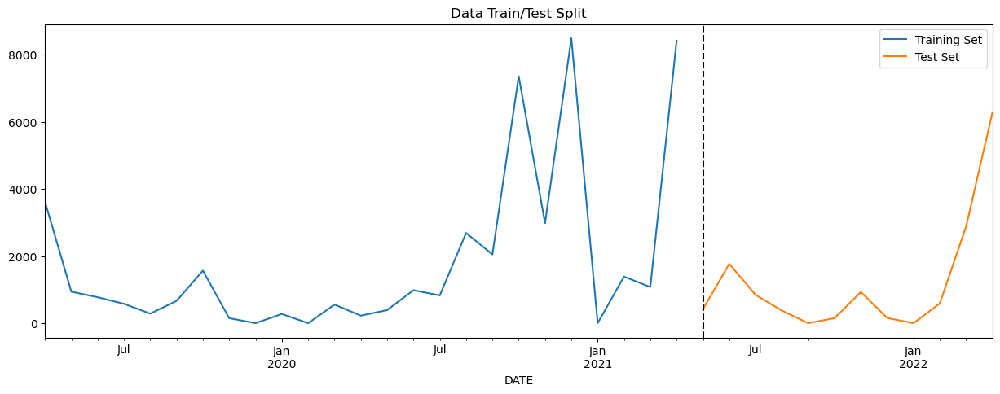

In [383]:
# DATA PARTITION

# Create the Target
y20 = X20['Sales_EUR(t)']

# Split into train and test

y20_train, y20_test, X20_train, X20_test = data_partition(y20, X20)

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [384]:
# Scaling the train and test data

X20_train_scaled, X20_test_scaled = scale(X20_train, X20_test)

### Model

In [385]:
reg20 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [386]:
reg20.fit(X20_train_scaled, y20_train,
        eval_set=[(X20_train_scaled, y20_train), (X20_test_scaled, y20_test)],
        verbose=100)

[23:44:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:3078.11228	validation_1-rmse:2094.12655
[70]	validation_0-rmse:1846.17021	validation_1-rmse:2301.64224


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

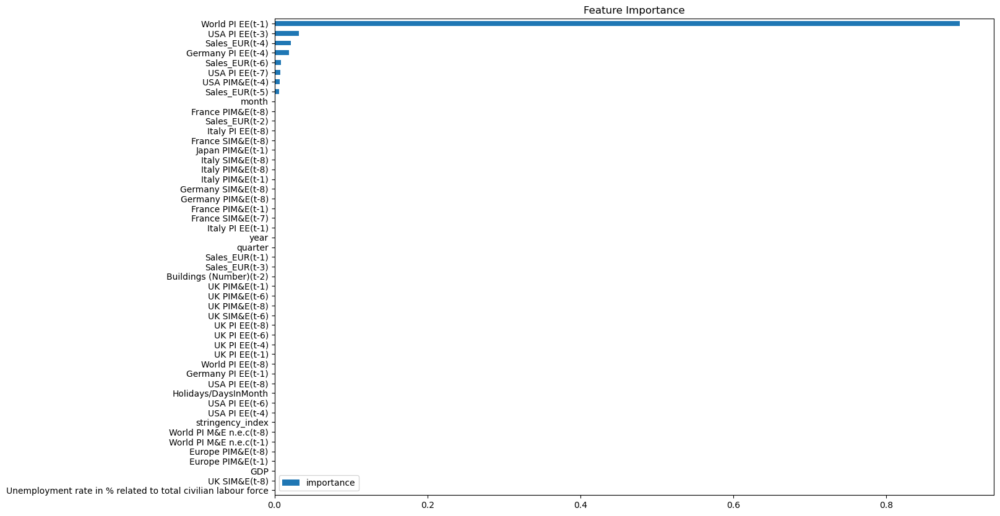

In [387]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg20.feature_importances_,
             index=reg20.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

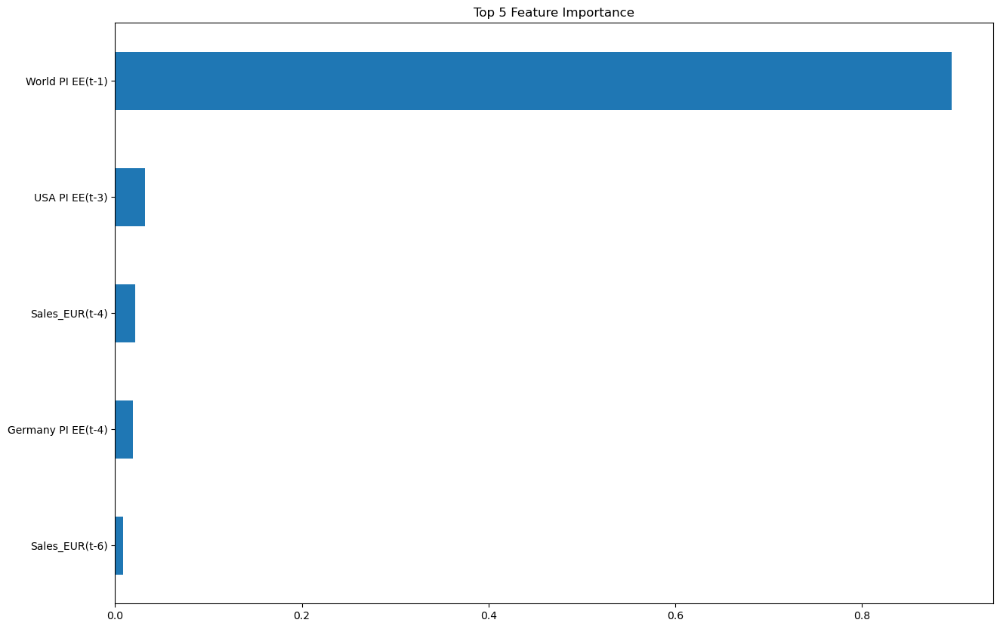

In [388]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg20.feature_importances_,
             index=reg20.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

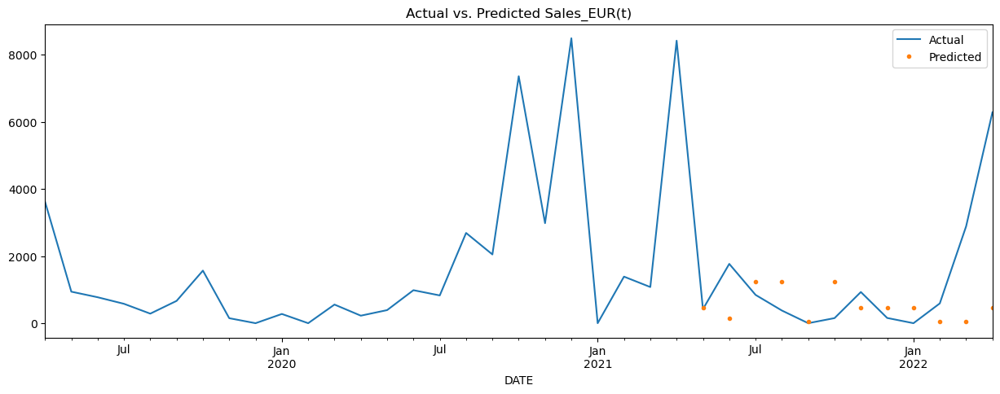

In [389]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results20 = pd.DataFrame({'actual': y20_test.values, 'predicted': y20_pred}, index=y20_test.index)

# Merge the new dataframe with the original dataframe X1:
X20_pred = X20.merge(results20, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X20_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X20_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [390]:
# SCORE (RMSE)
score20 = np.sqrt(mean_squared_error(y20_test, y20_pred))
print(f'RMSE Score on Test set: {score20:0.2f}')

RMSE Score on Test set: 1989.53


In [391]:
# Visualize predictions vs close values 
temp20 = y20_test.to_frame()
temp20['Prediction'] = y20_pred
temp20['Residual'] = y20_test - temp20.Prediction
temp20

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,419.21,451.953979,-32.743979
2021-06-30,1766.60,152.654709,1613.945291
2021-07-31,842.93,1234.482544,-391.552544
2021-08-31,377.22,1234.482544,-857.262544
2021-09-30,0.00,48.842621,-48.842621
2021-10-31,151.49,1234.482544,-1082.992544
2021-11-30,928.80,451.953979,476.846021
2021-12-31,156.00,451.953979,-295.953979
2022-01-31,0.00,451.953979,-451.953979


### Predicting the future

In [392]:
# Retrain on all data

# Remove the Target from X
X20 = X20.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X20)
X20_scaled = scaler.transform(X20) 
X20_scaled = pd.DataFrame(X20_scaled, columns = X20.columns).set_index(X20.index)

reg20.fit(X20_scaled, y20,
        eval_set=[(X20_scaled, y20)],
        verbose=100)

[23:44:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:2797.35446
[100]	validation_0-rmse:1374.06781
[200]	validation_0-rmse:688.28489
[300]	validation_0-rmse:366.71446
[400]	validation_0-rmse:207.71388
[500]	validation_0-rmse:124.29608
[600]	validation_0-rmse:78.93202
[700]	validation_0-rmse:51.93078
[800]	validation_0-rmse:32.22083
[900]	validation_0-rmse:20.80484
[999]	validation_0-rmse:13.93360


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [393]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X20_and_future = pd.concat([X20_original, future_df])
X20_and_future = create_features(X20_and_future)

In [394]:
# Lagged Sales: let's assign the values we already know

X20_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X20_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X20_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X20_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X20_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X20_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X20_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X20_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X20_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X20_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X20_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X20_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X20_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X20_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X20_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X20_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [395]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X20_and_future.update(forecast)

In [396]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_20], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X20_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet wit

In [397]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '05-31-2022']
y20_test = y20.loc[y20.index == '05-31-2022']

X20_train = X20_and_future.loc[X20_and_future.index < '05-31-2022']
X20_test = X20_and_future.loc[X20_and_future.index == '05-31-2022']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y20_pred

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '06-30-2022']
y20_test = y20.loc[y20.index == '06-30-2022']

X20_train = X20_and_future.loc[X20_and_future.index < '06-30-2022']
X20_test = X20_and_future.loc[X20_and_future.index == '06-30-2022']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '07-31-2022']
y20_test = y20.loc[y20.index == '07-31-2022']

X20_train = X20_and_future.loc[X20_and_future.index < '07-31-2022']
X20_test = X20_and_future.loc[X20_and_future.index == '07-31-2022']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '08-31-2022']
y20_test = y20.loc[y20.index == '08-31-2022']

X20_train = X20_and_future.loc[X20_and_future.index < '08-31-2022']
X20_test = X20_and_future.loc[X20_and_future.index == '08-31-2022']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '09-30-2022']
y20_test = y20.loc[y20.index == '09-30-2022']

X20_train = X20_and_future.loc[X20_and_future.index < '09-30-2022']
X20_test = X20_and_future.loc[X20_and_future.index == '09-30-2022']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '10-31-2022']
y20_test = y20.loc[y20.index == '10-31-2022']

X20_train = X20_and_future.loc[X20_and_future.index < '10-31-2022']
X20_test = X20_and_future.loc[X20_and_future.index == '10-31-2022']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '11-30-2022']
y20_test = y20.loc[y20.index == '11-30-2022']

X20_train = X20_and_future.loc[X20_and_future.index < '11-30-2022']
X20_test = X20_and_future.loc[X20_and_future.index == '11-30-2022']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X20_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '12-31-2022']
y20_test = y20.loc[y20.index == '12-31-2022']

X20_train = X20_and_future.loc[X20_and_future.index < '12-31-2022']
X20_test = X20_and_future.loc[X20_and_future.index == '12-31-2022']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X20_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X20_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X20_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '01-31-2023']
y20_test = y20.loc[y20.index == '01-31-2023']

X20_train = X20_and_future.loc[X20_and_future.index < '01-31-2023']
X20_test = X20_and_future.loc[X20_and_future.index == '01-31-2023']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X20_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X20_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X20_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X20_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X20_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X20_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X20_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y20 = X20_and_future['Sales_EUR(t)']

# Split into train and test
y20_train = y20.loc[y20.index < '02-28-2023']
y20_test = y20.loc[y20.index == '02-28-2023']

X20_train = X20_and_future.loc[X20_and_future.index < '02-28-2023']
X20_test = X20_and_future.loc[X20_and_future.index == '02-28-2023']

# Remove the Target from X
X20_train = X20_train.drop(labels=['Sales_EUR(t)'],axis=1)
X20_test = X20_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y20_pred = reg20.predict(X20_test)

X20_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y20_pred
X20_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X20_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X20_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X20_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X20_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X20_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X20_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X20_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X20_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X20_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X20_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X20_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [398]:
X20_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,UK PI EE(t-8),Italy PI EE(t-1),Italy PI EE(t-8),Germany PI EE(t-1),Germany PI EE(t-4),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,4563.140000,5798.140000,918.650000,2398.040000,620.660000,3369.550000,3619.630000,2,4,2019,...,105.737950,88.832741,46.917637,111.388054,89.626122,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,5798.140000,918.650000,2398.040000,620.660000,3369.550000,3619.630000,938.900000,2,5,2019,...,110.288394,75.947449,85.194542,102.518265,105.406097,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,918.650000,2398.040000,620.660000,3369.550000,3619.630000,938.900000,772.940000,2,6,2019,...,118.670791,91.637192,93.001511,107.468842,103.652771,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,2398.040000,620.660000,3369.550000,3619.630000,938.900000,772.940000,577.600000,3,7,2019,...,120.467019,83.527031,84.133400,95.814354,111.388054,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,620.660000,3369.550000,3619.630000,938.900000,772.940000,577.600000,284.400000,3,8,2019,...,105.378705,92.925720,64.881248,107.675117,102.518265,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,3369.550000,3619.630000,938.900000,772.940000,577.600000,284.400000,664.570000,3,9,2019,...,107.174933,43.961597,81.556343,98.702187,107.468842,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,3619.630000,938.900000,772.940000,577.600000,284.400000,664.570000,1566.000000,4,10,2019,...,110.647640,87.695801,83.451233,107.571976,95.814354,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,938.900000,772.940000,577.600000,284.400000,664.570000,1566.000000,149.000000,4,11,2019,...,126.214949,91.637192,88.832741,109.119034,107.675117,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,772.940000,577.600000,284.400000,664.570000,1566.000000,149.000000,0.000000,4,12,2019,...,113.521605,81.480545,75.947449,106.334335,98.702187,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,577.600000,284.400000,664.570000,1566.000000,149.000000,0.000000,274.910000,1,1,2020,...,117.593055,63.971703,91.637192,82.819084,107.571976,0.129032,1.533793,12410.000000,874.050000,5.300000


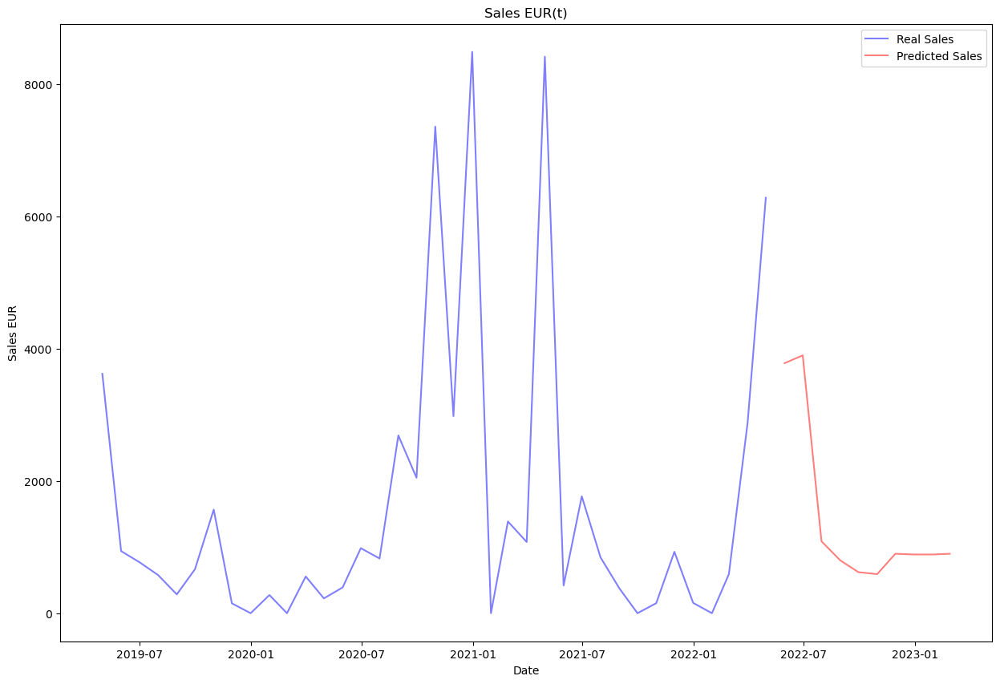

In [399]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X20_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X20_and_future['Sales_EUR(t)'].where(X20_and_future.index < '2022-05-31', other=None)
y_pred = X20_and_future['Sales_EUR(t)'].where(X20_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [400]:
# Create pandas dataframe with test set results

y20_test_pred = X20_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y20_test_pred

,Sales_EUR(t)
2022-05-31,3779.647705
2022-06-30,3897.969482
2022-07-31,1087.360107
2022-08-31,798.576660
2022-09-30,620.336609
2022-10-31,590.992249
2022-11-30,898.664124
2022-12-31,887.976135
2023-01-31,887.976135
2023-02-28,898.647461


## 3.14. GCK #36

In [401]:
# Create a modeling dataset from the original dataset
X36 = pd.DataFrame(index=df_sales_grouped_36.index, data={'Sales_EUR': df_sales_grouped_36['Sales_EUR'].values})
X36 = X36.sort_index(ascending=True)
X36.head()

,Sales_EUR
DATE,
2018-10-31,6474.60
2018-11-30,21617.61
2018-12-31,13924.52
2019-01-31,15444.39
2019-02-28,8051.15


### Selecting best market lag features for this GCK

In [402]:
# Let's include the sales in this dataset to run the correlations
df_market_filtered_lag_trial_36 = df_market_filtered_lag_trial.join(X36['Sales_EUR'], how='right')

In [403]:
# Let's check which lag per feature, has the biggest correlation with the target

# calculate the correlation coefficients between each lagged feature and the target variable for all features
correlations = {}
for col in df_market_filtered.columns:
    if col == 'Sales_EUR': # skip the target variable
        continue
    lag_dict = {}
    for lag in range(0, 13):
        if lag == 0:
            lag_name = 't'
        else:
            lag_name = f't-{lag}'
        corr = np.corrcoef(df_market_filtered_lag_trial_36['Sales_EUR'], df_market_filtered_lag_trial_36[f'{col}({lag_name})'])[0, 1]
        lag_dict[lag_name] = corr
    correlations[col] = lag_dict

# Create an empty dataframe
df36_correlations = pd.DataFrame(index=correlations.keys(), columns=[f't-{i}' for i in range(1, 13)])

# Fill in the dataframe with the correlation values
for col, lag_dict in correlations.items():
    for lag, corr in lag_dict.items():
        df36_correlations.loc[col, lag] = corr

df36_correlations

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,-0.043143,-0.198034,-0.091356,-0.050165,-0.045842,0.09251,0.037088,-0.237663,0.088617,-0.145814,-0.208825,-0.346468,0.045209
France SIM&E,-0.046047,-0.236248,-0.107002,0.018564,-0.027166,0.128457,0.010517,-0.151699,-0.009215,-0.008798,-0.325499,-0.335693,0.100283
Germany PIM&E,-0.033766,-0.281619,-0.192432,-0.074873,-0.11353,0.020525,0.023956,-0.263196,-0.011738,-0.145112,-0.282598,-0.351567,-0.018859
Germany SIM&E,-0.007108,-0.301416,-0.186767,-0.040581,-0.13358,0.044266,0.061221,-0.277073,0.046245,-0.110433,-0.287213,-0.315229,-0.012898
Italy PIM&E,0.021187,-0.084477,-0.14196,-0.099198,-0.016123,-0.02671,0.040842,-0.249238,0.104901,-0.192656,-0.025757,-0.30441,0.060944
Italy SIM&E,-0.010556,-0.174301,-0.17706,0.044451,-0.068599,0.13902,0.075961,-0.242063,0.172353,-0.181344,-0.097592,-0.292099,0.017531
Japan PIM&E,0.062697,-0.116263,0.023986,-0.077811,-0.145655,0.029753,-0.160439,-0.326469,-0.014116,-0.217599,-0.315751,-0.149117,-0.005940
Switzerland PIM&E,-0.291566,-0.225944,-0.160737,-0.055962,-0.016991,0.010122,-0.012887,-0.1001,-0.178501,-0.289122,-0.268588,-0.247949,-0.307849
UK PIM&E,0.024589,-0.323412,-0.10005,-0.150397,-0.079349,0.000469,0.027343,-0.114451,-0.002416,-0.142083,-0.352015,-0.43027,-0.052446
UK SIM&E,-0.262019,-0.302031,-0.01256,-0.107851,-0.152054,-0.007296,0.039838,-0.092276,-0.027662,-0.133056,-0.341041,-0.404423,-0.087873


From the previous dataframe let's filter all the features that have correlations of 0.3 or higher or -0.3 or lower:

In [404]:
# filter out values greater than or equal to 0.3 or less than or equal to -0.3
filtered_df_correlations_36 = df36_correlations[(df36_correlations >= 0.3) | (df36_correlations <= -0.3)]
filtered_df_correlations_36

,t-1,t-2,t-3,t-4,t-5,t-6,t-7,t-8,t-9,t-10,t-11,t-12,t
France PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.346468,NaN
France SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.325499,-0.335693,NaN
Germany PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.351567,NaN
Germany SIM&E,NaN,-0.301416,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.315229,NaN
Italy PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.30441,NaN
Italy SIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Japan PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.326469,NaN,NaN,-0.315751,NaN,NaN
Switzerland PIM&E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.307849
UK PIM&E,NaN,-0.323412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.352015,-0.43027,NaN
UK SIM&E,NaN,-0.302031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.341041,-0.404423,NaN


In [405]:
# let's create a list with those selected features

selected_market_lags_36 = []
for col, lag in filtered_df_correlations_36.stack().index:
    # create feature name by concatenating column name and lag value
    feature_name = f"{col}({lag})"
    selected_market_lags_36.append(feature_name)

selected_market_lags_36

['France PIM&E(t-12)',
 'France SIM&E(t-11)',
 'France SIM&E(t-12)',
 'Germany PIM&E(t-12)',
 'Germany SIM&E(t-2)',
 'Germany SIM&E(t-12)',
 'Italy PIM&E(t-12)',
 'Japan PIM&E(t-8)',
 'Japan PIM&E(t-11)',
 'Switzerland PIM&E(t)',
 'UK PIM&E(t-2)',
 'UK PIM&E(t-11)',
 'UK PIM&E(t-12)',
 'UK SIM&E(t-2)',
 'UK SIM&E(t-11)',
 'UK SIM&E(t-12)',
 'USA PIM&E(t-11)',
 'USA PIM&E(t-12)',
 'USA SIM&E(t-5)',
 'Europe PIM&E(t-12)',
 'Price Base Metals(t-12)',
 'Price Energy(t-12)',
 'USA PI EE(t-11)',
 'USA PI EE(t-12)',
 'Switzerland PI EE(t)',
 'UK PI EE(t-12)',
 'Italy PI EE(t-12)',
 'Germany PI EE(t-12)']

In [406]:
# Create features
X36 = create_data(X36, selected_market_lags_36)
X36.head()

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,USA PI EE(t-12),Switzerland PI EE(t),UK PI EE(t-12),Italy PI EE(t-12),Germany PI EE(t-12),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
DATE,,,,,,,,,,,,,,,,,,,,,
2019-04-30,6474.60,21617.61,13924.52,15444.39,8051.15,7373.42,4280.25,2,4,2019,...,108.830795,95.539795,99.391278,76.781204,108.706490,0.433333,0.0,11826.0,866.49,4.9
2019-05-31,21617.61,13924.52,15444.39,8051.15,7373.42,4280.25,16905.32,2,5,2019,...,108.479271,93.018125,102.504740,89.818092,106.746880,0.000000,0.0,13929.0,866.49,4.9
2019-06-30,13924.52,15444.39,8051.15,7373.42,4280.25,16905.32,15516.22,2,6,2019,...,109.744804,90.496454,105.139208,89.439110,116.751183,0.366667,0.0,12620.0,866.49,4.9
2019-07-31,15444.39,8051.15,7373.42,4280.25,16905.32,15516.22,33334.41,3,7,2019,...,107.886337,97.557132,103.462728,90.803436,111.181778,0.096774,0.0,12380.0,872.30,5.0
2019-08-31,8051.15,7373.42,4280.25,16905.32,15516.22,33334.41,1306.00,3,8,2019,...,110.300163,104.617809,105.737950,46.917637,111.284912,1.000000,0.0,12803.0,872.30,5.1


In [407]:
X36_original = X36.copy()

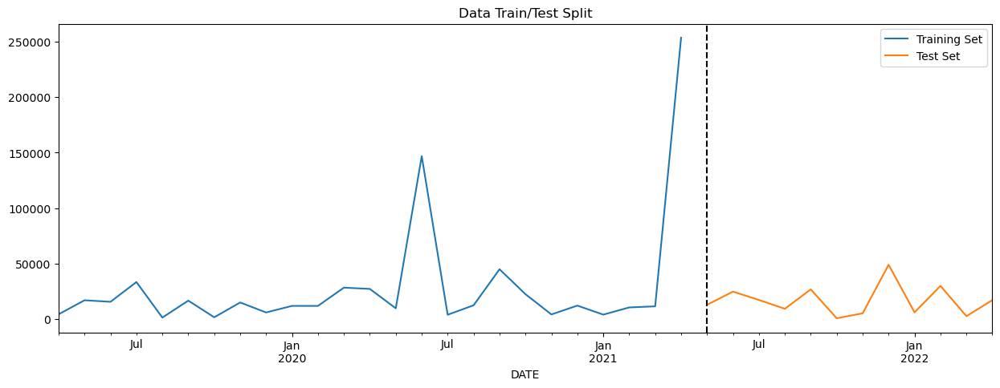

In [408]:
# DATA PARTITION

# Create the Target
y36 = X36['Sales_EUR(t)']

# Split into train and test

y36_train, y36_test, X36_train, X36_test = data_partition(y36, X36)

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

In [409]:
# Scaling the train and test data

X36_train_scaled, X36_test_scaled = scale(X36_train, X36_test)

### Model

In [410]:
reg36 = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)

In [411]:
reg36.fit(X36_train_scaled, y36_train,
        eval_set=[(X36_train_scaled, y36_train), (X36_test_scaled, y36_test)],
        verbose=100)

[23:44:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:60681.06192	validation_1-rmse:21352.90581
[100]	validation_0-rmse:36512.01126	validation_1-rmse:16997.81129
[200]	validation_0-rmse:22289.80031	validation_1-rmse:16266.70661
[300]	validation_0-rmse:13835.44737	validation_1-rmse:16016.86891
[400]	validation_0-rmse:8756.45765	validation_1-rmse:15899.92465
[441]	validation_0-rmse:7238.97815	validation_1-rmse:15973.19567


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

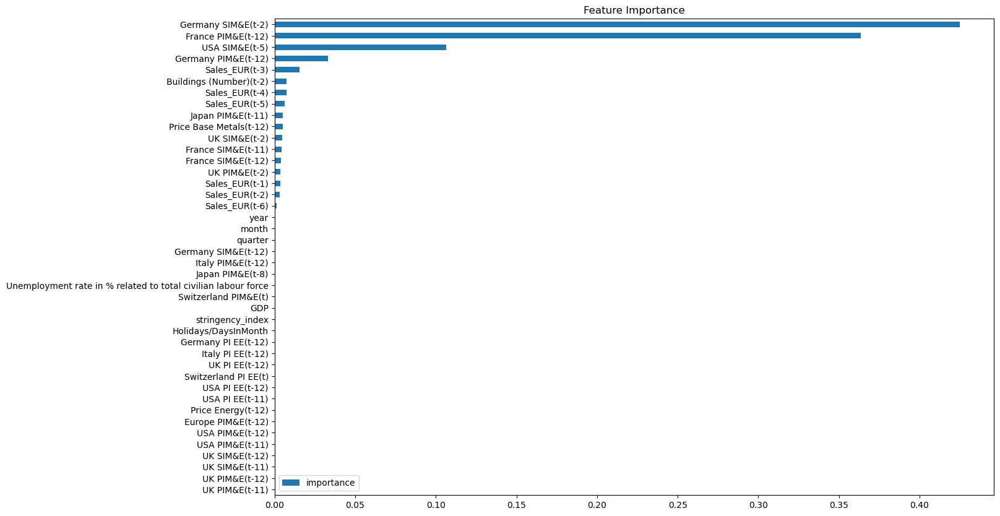

In [412]:
# FEATURE IMPORTANCE

fi = pd.DataFrame(data=reg36.feature_importances_,
             index=reg36.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

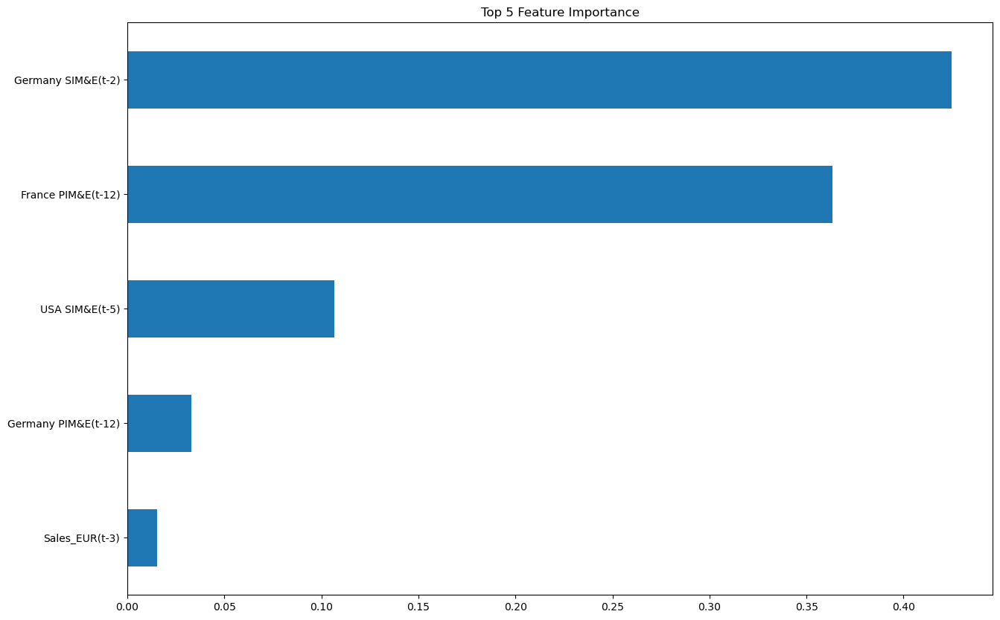

In [413]:
# FEATURE IMPORTANCE TOP 5

fi = pd.DataFrame(data=reg36.feature_importances_,
             index=reg36.feature_names_in_,
             columns=['importance'])
top5 = fi.sort_values('importance', ascending=False).iloc[:5]
top5.plot(kind='barh', title='Top 5 Feature Importance', legend=None)
plt.gca().invert_yaxis()
plt.show()

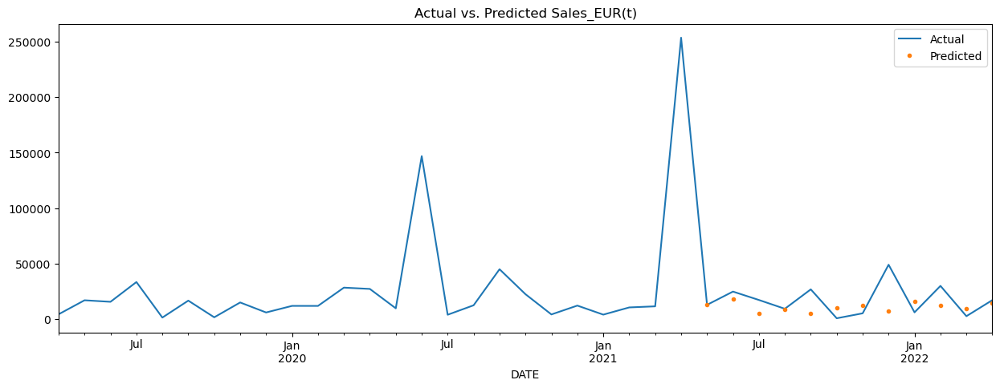

In [414]:
# FORECAST ON TEST

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test_scaled)

# Create a new dataframe that contains the actual and predicted values
results36 = pd.DataFrame({'actual': y36_test.values, 'predicted': y36_pred}, index=y36_test.index)

# Merge the new dataframe with the original dataframe X1:
X36_pred = X36.merge(results36, how='left', left_index=True, right_index=True)

#Plot the actual and predicted values:
ax = X36_pred[['Sales_EUR(t)']].plot(figsize=(15, 5))
X36_pred['predicted'].plot(ax=ax, style='.')
plt.legend(['Actual', 'Predicted'])
ax.set_title('Actual vs. Predicted Sales_EUR(t)')
plt.show()

In [415]:
# SCORE (RMSE)
score36 = np.sqrt(mean_squared_error(y36_test, y36_pred))
print(f'RMSE Score on Test set: {score36:0.2f}')

RMSE Score on Test set: 15887.88


In [416]:
# Visualize predictions vs close values 
temp36 = y36_test.to_frame()
temp36['Prediction'] = y36_pred
temp36['Residual'] = y36_test - temp36.Prediction
temp36

,Sales_EUR(t),Prediction,Residual
DATE,,,
2021-05-31,12775.49,12929.071289,-153.581289
2021-06-30,24733.07,17676.531250,7056.538750
2021-07-31,17159.27,4816.168457,12343.101543
2021-08-31,9233.40,8840.205078,393.194922
2021-09-30,26729.61,5184.117676,21545.492324
2021-10-31,674.00,10166.091797,-9492.091797
2021-11-30,5139.48,12372.028320,-7232.548320
2021-12-31,48933.50,6865.438965,42068.061035
2022-01-31,6014.39,15724.535156,-9710.145156


### Predicting the future

In [417]:
# Retrain on all data

# Remove the Target from X
X36 = X36.drop(labels=['Sales_EUR(t)'],axis=1)

# Scaling the train and test data
scaler = MinMaxScaler().fit(X36)
X36_scaled = scaler.transform(X36) 
X36_scaled = pd.DataFrame(X36_scaled, columns = X36.columns).set_index(X36.index)

reg36.fit(X36_scaled, y36,
        eval_set=[(X36_scaled, y36)],
        verbose=100)

[23:44:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:51334.81646
[100]	validation_0-rmse:31143.91285
[200]	validation_0-rmse:19596.99490
[300]	validation_0-rmse:12393.67350
[400]	validation_0-rmse:7897.65823
[500]	validation_0-rmse:5010.29604
[600]	validation_0-rmse:3169.12150
[700]	validation_0-rmse:2001.53052
[800]	validation_0-rmse:1276.52508
[900]	validation_0-rmse:816.72116
[999]	validation_0-rmse:538.36470


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:linear', predictor=None, ...)

In [418]:
# Create future dataframe

future = pd.date_range('2022-05-31','2023-02-28', freq='1M')
future_df = pd.DataFrame(index=future)
future_df = future_df.join(df_holidays, how='left')
X36_and_future = pd.concat([X36_original, future_df])
X36_and_future = create_features(X36_and_future)

In [419]:
# Lagged Sales: let's assign the values we already know

X36_and_future.loc['2022-05-31', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-05-31', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-05-31', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X36_and_future.loc['2022-05-31', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-05-31', 'Sales_EUR(t-5)'] = X36_and_future.loc['2021-12-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-05-31', 'Sales_EUR(t-6)'] = X36_and_future.loc['2021-11-30', 'Sales_EUR(t)']

X36_and_future.loc['2022-06-30', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-06-30', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-06-30', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X36_and_future.loc['2022-06-30', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-01-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-06-30', 'Sales_EUR(t-6)'] = X36_and_future.loc['2021-12-31', 'Sales_EUR(t)']

X36_and_future.loc['2022-07-31', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-07-31', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-07-31', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-02-28', 'Sales_EUR(t)']
X36_and_future.loc['2022-07-31', 'Sales_EUR(t-6)'] = X36_and_future.loc['2022-01-31', 'Sales_EUR(t)']

X36_and_future.loc['2022-08-31', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-08-31', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-03-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-08-31', 'Sales_EUR(t-6)'] = X36_and_future.loc['2022-02-28', 'Sales_EUR(t)']

X36_and_future.loc['2022-09-30', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-04-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-09-30', 'Sales_EUR(t-6)'] = X36_and_future.loc['2022-03-31', 'Sales_EUR(t)']

X36_and_future.loc['2022-10-31', 'Sales_EUR(t-6)'] = X36_and_future.loc['2022-04-30', 'Sales_EUR(t)']

In [420]:
# PREDICTING MARKET FEATURES

# Stringency Index
# Since the stringency index has been dropping in the past months
# Let's predict the next ten months based on the decrease rate from march to april

# Update the original dataframe with the forecasted values
X36_and_future.update(forecast)

In [421]:
# Rest of the features (PROPHET)
# Load the historical data for the market features
# Merging market and other features

historical_data = df_gdp.join(df_construction_trial['Buildings (Number)(t-2)'], how='left')
historical_data = historical_data.join(df_unemployment, how='left')
historical_data = historical_data.join(df_market_filtered_lag_trial[selected_market_lags_36], how='left') 
historical_data = historical_data.loc[historical_data.index < '2022-05-31']
historical_data.reset_index(inplace=True)
historical_data = historical_data.rename(columns = {'Month':'date'})
historical_data = historical_data.dropna()

# Initialize an empty dictionary to store the forecasted values for each column
forecast_dict = {}

# Iterate over each column in the original dataframe
for col in historical_data.columns[1:]:

    # Prepare the data for Prophet
    prophet_data = historical_data[['date', col]].dropna().rename(columns={'date': 'ds', col: 'y'})

    # Initialize a Prophet model
    m = Prophet()

    # Fit the model to the historical data
    m.fit(prophet_data)

    # Define a future DataFrame for the forecast period
    future = m.make_future_dataframe(periods=10, freq='M')

    # Make a forecast for the future period
    forecast = m.predict(future)

    # Extract the forecasted values and dates
    forecasted_values = forecast[['ds', 'yhat']].tail(10)

    # Add the forecasted values to the forecast dictionary with the column name as the key
    forecast_dict[col] = forecasted_values.set_index('ds')['yhat']

# Create a dataframe from the forecast dictionary
forecast_df = pd.DataFrame(forecast_dict)

# Set the index of the forecast dataframe to be the date column
forecast_df.index.name = 'date'

# Update the original dataframe with the forecasted values
X36_and_future.update(forecast_df)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:

In [422]:
# FORECASTING MONTH BY MONTH TO USE THE PREDICTIONS TO FORECAST THE NEXT MONTH

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '05-31-2022']
y36_test = y36.loc[y36.index == '05-31-2022']

X36_train = X36_and_future.loc[X36_and_future.index < '05-31-2022']
X36_test = X36_and_future.loc[X36_and_future.index == '05-31-2022']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2022-05-31', 'Sales_EUR(t)'] = y36_pred

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '06-30-2022']
y36_test = y36.loc[y36.index == '06-30-2022']

X36_train = X36_and_future.loc[X36_and_future.index < '06-30-2022']
X36_test = X36_and_future.loc[X36_and_future.index == '06-30-2022']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2022-06-30', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2022-06-30', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '07-31-2022']
y36_test = y36.loc[y36.index == '07-31-2022']

X36_train = X36_and_future.loc[X36_and_future.index < '07-31-2022']
X36_test = X36_and_future.loc[X36_and_future.index == '07-31-2022']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2022-07-31', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2022-07-31', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-07-31', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '08-31-2022']
y36_test = y36.loc[y36.index == '08-31-2022']

X36_train = X36_and_future.loc[X36_and_future.index < '08-31-2022']
X36_test = X36_and_future.loc[X36_and_future.index == '08-31-2022']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2022-08-31', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2022-08-31', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-08-31', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-08-31', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '09-30-2022']
y36_test = y36.loc[y36.index == '09-30-2022']

X36_train = X36_and_future.loc[X36_and_future.index < '09-30-2022']
X36_test = X36_and_future.loc[X36_and_future.index == '09-30-2022']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2022-09-30', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2022-09-30', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-09-30', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-09-30', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-09-30', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '10-31-2022']
y36_test = y36.loc[y36.index == '10-31-2022']

X36_train = X36_and_future.loc[X36_and_future.index < '10-31-2022']
X36_test = X36_and_future.loc[X36_and_future.index == '10-31-2022']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2022-10-31', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2022-10-31', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-10-31', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-10-31', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-10-31', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-10-31', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '11-30-2022']
y36_test = y36.loc[y36.index == '11-30-2022']

X36_train = X36_and_future.loc[X36_and_future.index < '11-30-2022']
X36_test = X36_and_future.loc[X36_and_future.index == '11-30-2022']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2022-11-30', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2022-11-30', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-11-30', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-11-30', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-11-30', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-11-30', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-06-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-11-30', 'Sales_EUR(t-6)'] = X36_and_future.loc['2022-05-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '12-31-2022']
y36_test = y36.loc[y36.index == '12-31-2022']

X36_train = X36_and_future.loc[X36_and_future.index < '12-31-2022']
X36_test = X36_and_future.loc[X36_and_future.index == '12-31-2022']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2022-12-31', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2022-12-31', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-12-31', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-12-31', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X36_and_future.loc['2022-12-31', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-12-31', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-07-31', 'Sales_EUR(t)']
X36_and_future.loc['2022-12-31', 'Sales_EUR(t-6)'] = X36_and_future.loc['2022-06-30', 'Sales_EUR(t)']

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '01-31-2023']
y36_test = y36.loc[y36.index == '01-31-2023']

X36_train = X36_and_future.loc[X36_and_future.index < '01-31-2023']
X36_test = X36_and_future.loc[X36_and_future.index == '01-31-2023']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2023-01-31', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2023-01-31', 'Sales_EUR(t-1)'] = X36_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X36_and_future.loc['2023-01-31', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X36_and_future.loc['2023-01-31', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X36_and_future.loc['2023-01-31', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X36_and_future.loc['2023-01-31', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-08-31', 'Sales_EUR(t)']
X36_and_future.loc['2023-01-31', 'Sales_EUR(t-6)'] = X36_and_future.loc['2022-07-31', 'Sales_EUR(t)']

########################################################

# Create the Target
y36 = X36_and_future['Sales_EUR(t)']

# Split into train and test
y36_train = y36.loc[y36.index < '02-28-2023']
y36_test = y36.loc[y36.index == '02-28-2023']

X36_train = X36_and_future.loc[X36_and_future.index < '02-28-2023']
X36_test = X36_and_future.loc[X36_and_future.index == '02-28-2023']

# Remove the Target from X
X36_train = X36_train.drop(labels=['Sales_EUR(t)'],axis=1)
X36_test = X36_test.drop(labels=['Sales_EUR(t)'],axis=1)

# Make predictions on the test set using the trained model
y36_pred = reg36.predict(X36_test)

X36_and_future.loc['2023-02-28', 'Sales_EUR(t)'] = y36_pred
X36_and_future.loc['2023-02-28', 'Sales_EUR(t-1)'] = X36_and_future.loc['2023-01-31', 'Sales_EUR(t)']
X36_and_future.loc['2023-02-28', 'Sales_EUR(t-2)'] = X36_and_future.loc['2022-12-31', 'Sales_EUR(t)']
X36_and_future.loc['2023-02-28', 'Sales_EUR(t-3)'] = X36_and_future.loc['2022-11-30', 'Sales_EUR(t)']
X36_and_future.loc['2023-02-28', 'Sales_EUR(t-4)'] = X36_and_future.loc['2022-10-31', 'Sales_EUR(t)']
X36_and_future.loc['2023-02-28', 'Sales_EUR(t-5)'] = X36_and_future.loc['2022-09-30', 'Sales_EUR(t)']
X36_and_future.loc['2023-02-28', 'Sales_EUR(t-6)'] = X36_and_future.loc['2022-08-31', 'Sales_EUR(t)']

In [423]:
X36_and_future

,Sales_EUR(t-6),Sales_EUR(t-5),Sales_EUR(t-4),Sales_EUR(t-3),Sales_EUR(t-2),Sales_EUR(t-1),Sales_EUR(t),quarter,month,year,...,USA PI EE(t-12),Switzerland PI EE(t),UK PI EE(t-12),Italy PI EE(t-12),Germany PI EE(t-12),Holidays/DaysInMonth,stringency_index,Buildings (Number)(t-2),GDP,Unemployment rate in % related to total civilian labour force
2019-04-30,6474.600000,21617.610000,13924.520000,15444.390000,8051.150000,7373.420000,4280.250000,2,4,2019,...,108.830795,95.539795,99.391278,76.781204,108.706490,0.433333,0.000000,11826.000000,866.490000,4.900000
2019-05-31,21617.610000,13924.520000,15444.390000,8051.150000,7373.420000,4280.250000,16905.320000,2,5,2019,...,108.479271,93.018125,102.504740,89.818092,106.746880,0.000000,0.000000,13929.000000,866.490000,4.900000
2019-06-30,13924.520000,15444.390000,8051.150000,7373.420000,4280.250000,16905.320000,15516.220000,2,6,2019,...,109.744804,90.496454,105.139208,89.439110,116.751183,0.366667,0.000000,12620.000000,866.490000,4.900000
2019-07-31,15444.390000,8051.150000,7373.420000,4280.250000,16905.320000,15516.220000,33334.410000,3,7,2019,...,107.886337,97.557132,103.462728,90.803436,111.181778,0.096774,0.000000,12380.000000,872.300000,5.000000
2019-08-31,8051.150000,7373.420000,4280.250000,16905.320000,15516.220000,33334.410000,1306.000000,3,8,2019,...,110.300163,104.617809,105.737950,46.917637,111.284912,1.000000,0.000000,12803.000000,872.300000,5.100000
2019-09-30,7373.420000,4280.250000,16905.320000,15516.220000,33334.410000,1306.000000,16582.550000,3,9,2019,...,111.160194,111.678487,110.288394,85.194542,110.872368,0.300000,0.000000,11682.000000,872.300000,4.900000
2019-10-31,4280.250000,16905.320000,15516.220000,33334.410000,1306.000000,16582.550000,1556.500000,4,10,2019,...,112.853256,113.033885,118.670791,93.001511,118.298233,0.129032,0.000000,12195.000000,878.930000,4.800000
2019-11-30,16905.320000,15516.220000,33334.410000,1306.000000,16582.550000,1556.500000,14921.720000,4,11,2019,...,113.145294,114.389283,120.467019,84.133400,117.163727,0.033333,0.000000,10876.000000,878.930000,4.800000
2019-12-31,15516.220000,33334.410000,1306.000000,16582.550000,1556.500000,14921.720000,5906.370000,4,12,2019,...,111.823624,115.744681,105.378705,64.881248,89.626122,0.290323,0.000000,10663.000000,878.930000,4.900000
2020-01-31,33334.410000,1306.000000,16582.550000,1556.500000,14921.720000,5906.370000,11840.670000,1,1,2020,...,109.499725,110.228526,107.174933,81.556343,105.406097,0.129032,1.533793,12410.000000,874.050000,5.300000


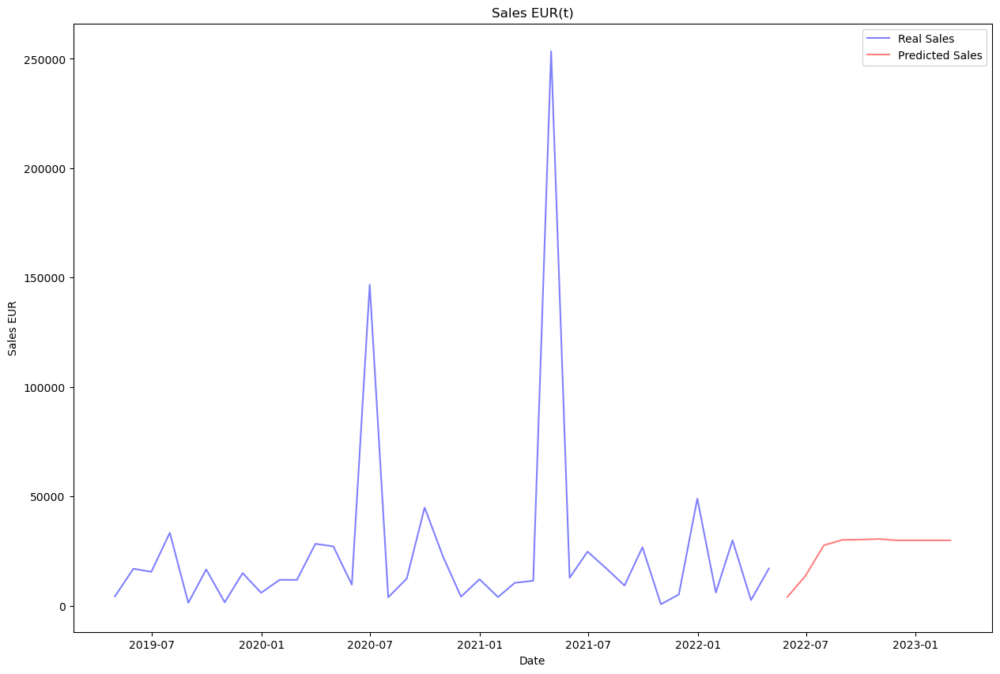

In [424]:
# PLOTING REAL AND PREDICTED SALES

# Define the index for the x-axis
x = X36_and_future.index

# Define the y-axis values for the real and predicted sales
y_real = X36_and_future['Sales_EUR(t)'].where(X36_and_future.index < '2022-05-31', other=None)
y_pred = X36_and_future['Sales_EUR(t)'].where(X36_and_future.index >= '2022-05-31', other=None)

# Define the colors for the real and predicted sales
color_real = 'blue'
color_pred = 'red'

# Create the figure and axes objects
fig, ax = plt.subplots()

# Plot the real sales as a bar chart
ax.plot(x, y_real, color=color_real, alpha=0.5, label='Real Sales')

# Plot the predicted sales as a line chart
ax.plot(x, y_pred, color=color_pred, alpha=0.5, label='Predicted Sales')

# Set the title and axis labels
ax.set_title('Sales EUR(t)')
ax.set_xlabel('Date')
ax.set_ylabel('Sales EUR')

# Add a legend
ax.legend()

# Show the plot
plt.show()

In [425]:
# Create pandas dataframe with test set results

y36_test_pred = X36_and_future.loc['2022-05-31':, ['Sales_EUR(t)']]
y36_test_pred

,Sales_EUR(t)
2022-05-31,4062.202148
2022-06-30,13577.072266
2022-07-31,27617.166016
2022-08-31,30096.943359
2022-09-30,30215.681641
2022-10-31,30519.048828
2022-11-30,29877.074219
2022-12-31,29877.074219
2023-01-31,29877.074219
2023-02-28,29877.074219


# Generating Test Predictions File

In [426]:
test_pred_file = pd.read_csv("Case3_Test Set Template.csv", sep=';')
test_pred_file.head(10)

,Month Year,Mapped_GCK,Sales_EUR
0,May-22,#3,NaN
1,Jun-22,#3,NaN
2,Jul-22,#3,NaN
3,Aug-22,#3,NaN
4,Sep-22,#3,NaN
5,Oct-22,#3,NaN
6,Nov-22,#3,NaN
7,Dec-22,#3,NaN
8,Jan-23,#3,NaN
9,Feb-23,#3,NaN


In [427]:
test_pred_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Month Year  140 non-null    object 
 1   Mapped_GCK  140 non-null    object 
 2   Sales_EUR   0 non-null      float64
dtypes: float64(1), object(2)
memory usage: 3.4+ KB


In [451]:
# add a new column "Mapped_GCK" to test_pred dataframes
y1_test_pred['Mapped_GCK'] = '#1'
y3_test_pred['Mapped_GCK'] = '#3'
y4_test_pred['Mapped_GCK'] = '#4'
y5_test_pred['Mapped_GCK'] = '#5'
y6_test_pred['Mapped_GCK'] = '#6'
y8_test_pred['Mapped_GCK'] = '#8'
y9_test_pred['Mapped_GCK'] = '#9'
y11_test_pred['Mapped_GCK'] = '#11'
y12_test_pred['Mapped_GCK'] = '#12'
y13_test_pred['Mapped_GCK'] = '#13'
y14_test_pred['Mapped_GCK'] = '#14'
y16_test_pred['Mapped_GCK'] = '#16'
y20_test_pred['Mapped_GCK'] = '#20'
y36_test_pred['Mapped_GCK'] = '#36'

In [452]:
test_pred = pd.concat([y1_test_pred,
                      y3_test_pred,
                      y4_test_pred,
                      y5_test_pred,
                     y6_test_pred,
                     y8_test_pred,
                     y9_test_pred,
                     y11_test_pred,
                     y12_test_pred,
                     y13_test_pred,
                     y14_test_pred,
                     y16_test_pred,
                     y20_test_pred,
                     y36_test_pred])

In [453]:
# reset the index and create a "Month Year" column
test_pred = test_pred.reset_index().rename(columns={'index': 'Month Year'})

In [454]:
# format the "Month Year" column to "MMM-YY" format
test_pred['Month Year'] = test_pred['Month Year'].dt.strftime('%b-%y')

In [465]:
# rename the column 'Sales_EUR(t)' to 'Sales_EUR'
test_pred = test_pred.rename(columns={'Sales_EUR(t)': 'Sales_EUR'})

In [471]:
# reorder the columns 
test_pred = test_pred[['Month Year', 'Mapped_GCK', 'Sales_EUR']]

In [472]:
test_pred

,Month Year,Mapped_GCK,Sales_EUR
0,May-22,#1,4.047427e+07
1,Jun-22,#1,4.087292e+07
2,Jul-22,#1,4.092522e+07
3,Aug-22,#1,4.235460e+07
4,Sep-22,#1,4.302367e+07
...,...,...,...
135,Oct-22,#36,3.051905e+04
136,Nov-22,#36,2.987707e+04
137,Dec-22,#36,2.987707e+04
138,Jan-23,#36,2.987707e+04


In [473]:
test_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Month Year  140 non-null    object 
 1   Mapped_GCK  140 non-null    object 
 2   Sales_EUR   140 non-null    float64
dtypes: float64(1), object(2)
memory usage: 3.4+ KB


In [474]:
# export the DataFrame to a CSV file with a ';' separator
test_pred.to_csv('Group_L_Case3_Test Set Template.csv', sep=';', index=False)